# Загружаем библиотеки

In [2]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 7.0 MB/s eta 0:00:00


In [1]:
import numpy as np
import pandas as pd
import os
from scipy import signal
from scipy.signal import welch
import time

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, train_test_split, RandomizedSearchCV, KFold
from sklearn.inspection import permutation_importance
from sklearn.linear_model import LassoCV, LogisticRegressionCV, LogisticRegression
from sklearn.feature_selection import RFE, mutual_info_classif
from sklearn.metrics import f1_score, make_scorer, confusion_matrix
from sklearn.preprocessing import StandardScaler


from catboost import CatBoostClassifier, Pool, cv

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.checkpoint import checkpoint

from tqdm import tqdm

import warnings

warnings.filterwarnings("ignore")

# Подготовка данных

In [ ]:
# Создание класса для хранения сигналов по юзерам
class EEG:
    def __init__(self, participant, dataset):
        self.int = {}
        self.delta = {}
        self.theta = {}
        self.alpha = {}
        self.beta = {}
        self.gamma = {}
        self.participant = participant

        base = r'/content/drive/MyDrive/Colab Notebooks/Diploma/data'
        intensities = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

        if dataset == "Mona Lisa":
            Dname = "/Figs for spectra"
            var1 = "/Backgr_int_"
            var2 = ".dat"
        else:
            Dname = "/Cubes for spectra"
            var1 = "/Backgr_int_"
            var2 = "_type_0.4.dat"

        for intensity in intensities:
            S = os.path.join(base, "Participant " + str(participant) + Dname + var1 + str(intensity) + var2)
            I = intensity
            self.int[I] = np.loadtxt(S)
            delta_signal = np.empty(self.int[I].shape)
            theta_signal =  np.empty(self.int[I].shape)
            alpha_signal = np.empty(self.int[I].shape)
            beta_signal = np.empty(self.int[I].shape)
            gamma_signal = np.empty(self.int[I].shape)
            for c in range(self.int[I].shape[1]):
                delta_signal[:,c], theta_signal[:,c],alpha_signal[:, c], beta_signal[:, c],gamma_signal[:,c] = self.fir_filtering(I, c)
            self.delta[I] = delta_signal
            self.theta[I] = theta_signal
            self.alpha[I] = alpha_signal
            self.beta[I] = beta_signal
            self.gamma[I] = gamma_signal

    def fir_filtering(self, I, c):
        filter_delta = signal.firwin(400, [1.0, 4.0], pass_zero=False, fs=250)
        filter_theta = signal.firwin(400, [5.0, 8.0], pass_zero=False, fs=250)
        filter_alpha = signal.firwin(400, [8.0, 12.0], pass_zero=False, fs=250)
        filter_beta = signal.firwin(400, [13.0, 30.0], pass_zero=False, fs=250)
        filter_gamma = signal.firwin(400, [31.0, 45.0], pass_zero=False, fs=250)
        res_delta = signal.convolve(self.int[I][:, c], filter_delta, mode='same')
        res_theta = signal.convolve(self.int[I][:, c], filter_theta, mode='same')
        res_alpha = signal.convolve(self.int[I][:, c], filter_alpha, mode='same')
        res_beta = signal.convolve(self.int[I][:, c], filter_beta, mode='same')
        res_gamma = signal.convolve(self.int[I][:, c], filter_gamma, mode='same')
        return res_delta,res_theta, res_alpha,res_beta,res_gamma

In [ ]:
# функция создание датасета

Intencity = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
base = r'/content/drive/MyDrive/Colab Notebooks/Diploma/data'
file_path = os.path.join(base, "Channels.dat")
df_channels = pd.read_csv(file_path, header=None, sep='.')
channel_names = df_channels.iloc[:, -1:].values.flatten()

def createdataframe(eeg_person, dataset, signal_fiq):
    global Intencity, channel_names
    tem_signal = []
    # eeg_person = EEG(user, dataset)

    for i in Intencity:
        for ch in range(0, 31):
            # Формируем временную метку и метаданные
            metadata = [
                channel_names[ch],  # Название канала
                dataset,            # Набор данных
                ch,                 # Номер канала
                i,                  # Интенсивность
                eeg_person.participant,               # Участник
                signal_fiq          # Тип сигнала (например, 'delta', 'theta')
            ]

            # Получаем данные для указанного частотного диапазона
            signal_data = getattr(eeg_person, signal_fiq).get(i)[:, ch][0:15000]

            # Объединяем сигнал и метаданные
            combined_data = np.append(signal_data, metadata)

            # Добавляем данные в tem_signal
            tem_signal.append(combined_data)

    # Создаем DataFrame
    tem_dataframe = pd.DataFrame(tem_signal)

    # Формируем названия столбцов
    columns = []
    for col in range(0, 15000):
        columns.append(f'Time{col}')

    # Добавляем столбцы для метаданных
    columns.extend([
        "channel_name",  # Название канала
        "dataset",       # Набор данных
        "channel",       # Номер канала
        "intensity",     # Интенсивность
        "participant",   # Участник
        "signal_type"    # Тип сигнала
    ])

    # Присваиваем названия столбцов
    tem_dataframe.columns = columns

    tem_dataframe['binary_channel'] = tem_dataframe['channel_name'].apply(lambda x: 0 if '-A1' in x else 1 if '-A2' in x else None)

    return tem_dataframe

## Преобразование исходных данных в csv датасет

In [ ]:
# Параметры
datasets = ["Mona Lisa", "Cubes for spectra"]
signal_fiq_s = ['delta', 'theta', 'alpha', 'beta', 'gamma']
user_count = 11

# Создаем папку для хранения датасетов
output_dir = "/content/drive/MyDrive/Colab Notebooks/Diploma/data/dataset_csv"
os.makedirs(output_dir, exist_ok=True)

# Обработка данных
for dataset in datasets:
    print(f"Processing dataset: {dataset}")
    dataset_dir = os.path.join(output_dir, dataset)
    os.makedirs(dataset_dir, exist_ok=True)  # Создаем папку для текущего датасета

    for U in range(10, user_count):  # Перебор пользователей
        print("------------------------------------------------")
        print(f"{dataset}, Participant {U}")
        print("------------------------------------------------")
        t0 = time.time()

        # Создаем экземпляр класса EEG для текущего пользователя и набора данных
        eeg_person = EEG(U, dataset)

        df_user = pd.DataFrame()  # DataFrame для данных одного пользователя

        for signal_fiq in signal_fiq_s:  # Перебор типов сигналов
            data = createdataframe(eeg_person, dataset, signal_fiq)
            df_user = pd.concat([df_user, data], ignore_index=True)

        t1 = time.time()
        PreProcesstime = t1 - t0
        print(f"Pre-Process time for Participant {U} = {PreProcesstime:.2f} seconds")

        # Сохраняем данные пользователя в отдельный CSV-файл
        user_file = os.path.join(dataset_dir, f"Participant_{U}.csv")
        df_user.to_csv(user_file, index=False)
        print(f"Saved data for Participant {U} to {user_file}")

        # Освобождаем память
        del df_user

Processing dataset: Mona Lisa
------------------------------------------------
Mona Lisa, Participant 10
------------------------------------------------
Pre-Process time for Participant 10 = 50.05 seconds
Saved data for Participant 10 to /content/drive/MyDrive/Colab Notebooks/Diploma/data/dataset_csv/Mona Lisa/Participant_10.csv
Processing dataset: Cubes for spectra
------------------------------------------------
Cubes for spectra, Participant 10
------------------------------------------------
Pre-Process time for Participant 10 = 52.64 seconds
Saved data for Participant 10 to /content/drive/MyDrive/Colab Notebooks/Diploma/data/dataset_csv/Cubes for spectra/Participant_10.csv


In [ ]:
%%time

# Преобразование отдельных файлов в единый датасет в формате parquet

# Путь к папке с данными
output_dir = "/content/drive/MyDrive/Colab Notebooks/Diploma/data/dataset_csv"

# Список для хранения всех данных
all_data = []

# Чтение всех CSV-файлов
for dataset in os.listdir(output_dir):
    dataset_dir = os.path.join(output_dir, dataset)
    if os.path.isdir(dataset_dir):
        for file in os.listdir(dataset_dir):
            if file.endswith(".csv"):
                file_path = os.path.join(dataset_dir, file)
                df = pd.read_csv(file_path)
                all_data.append(df)

# Объединение всех данных в один DataFrame
final_df = pd.concat(all_data, ignore_index=True)

# Сохранение финального датасета в формате Parquet
parquet_file = "/content/drive/MyDrive/Colab Notebooks/Diploma/data/dataset_csv/final_dataset.parquet"
final_df.to_parquet(parquet_file, index=False, compression='snappy')  # Используем сжатие 'snappy'

print(f"Final dataset saved to {parquet_file}")

Final dataset saved to /content/drive/MyDrive/Colab Notebooks/Diploma/data/dataset_csv/final_dataset.parquet
CPU times: user 4min 20s, sys: 31.1 s, total: 4min 51s
Wall time: 15min 18s


# Загрузка данных из Parquet

In [ ]:
%%time

# google colab
parquet_file = "/content/drive/MyDrive/Colab Notebooks/Diploma/data/dataset_csv/final_dataset.parquet"

# jupyter
# parquet_file = "data/dataset_csv/final_dataset.parquet"

# df_raw = pd.read_parquet(parquet_file)
df = pd.read_parquet(parquet_file)

# df = df_raw.copy(deep=True)

CPU times: user 6.44 s, sys: 9.48 s, total: 15.9 s
Wall time: 30 s


In [ ]:
df

,Time0,Time1,Time2,Time3,Time4,Time5,Time6,Time7,Time8,Time9,...,Time14997,Time14998,Time14999,channel_name,dataset,channel,intensity,participant,signal_type,binary_channel
0,32.819580,22.394499,11.944530,1.509794,-8.869929,-19.140559,-29.255348,-39.181859,-48.879722,-58.298553,...,26.612040,29.656919,32.678659,O2-A2,Mona Lisa,0,0.1,1,delta,1
1,22.895093,22.571077,22.213273,21.817371,21.388242,20.932859,20.448701,19.929610,19.379078,18.803183,...,-43.410787,-44.548579,-45.696425,O1-A1,Mona Lisa,1,0.1,1,delta,0
2,22.636168,25.515590,28.336306,31.081621,33.736376,36.288001,38.722030,41.023426,43.179827,45.182350,...,-60.496918,-60.690027,-60.795766,P4-A2,Mona Lisa,2,0.1,1,delta,1
3,36.106648,38.336931,40.448344,42.426091,44.260684,45.944858,47.468797,48.823125,50.001139,50.994271,...,3.909010,5.827176,7.701683,P3-A1,Mona Lisa,3,0.1,1,delta,0
4,26.015135,23.859016,21.597520,19.234030,16.773968,14.223820,11.587520,8.870086,6.079060,3.221594,...,-9.185652,-7.417999,-5.644647,C4-A2,Mona Lisa,4,0.1,1,delta,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30995,-5.063617,-34.848162,-35.540870,-7.057853,25.829333,35.845260,16.676506,-13.348254,-29.113867,-20.432071,...,-4.533666,-5.236804,-2.724478,TP7-A1,Cubes for spectra,26,1.0,10,gamma,0
30996,-1.083465,-25.976343,-28.995389,-8.421970,17.480297,27.228734,14.635786,-7.462719,-20.248597,-15.458610,...,-2.483474,-2.623112,-1.177813,CP3-A1,Cubes for spectra,27,1.0,10,gamma,0
30997,0.528005,-29.790203,-35.160048,-12.037151,19.090765,32.490827,19.293346,-6.769372,-23.512975,-19.794720,...,-0.086841,2.148047,2.592469,Cpz-A1,Cubes for spectra,28,1.0,10,gamma,0
30998,5.119118,52.953498,56.014069,12.112389,-40.235730,-56.739590,-26.049146,22.639965,47.897370,32.357860,...,4.991012,6.186158,2.561500,CP4-A2,Cubes for spectra,29,1.0,10,gamma,1


# EDA

In [ ]:
print(f"Размерность датасета: {df.shape}")

Размерность датасета: (31000, 15007)


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31000 entries, 0 to 30999
Columns: 15007 entries, Time0 to binary_channel
dtypes: float64(15001), int64(3), object(3)
memory usage: 3.5+ GB


In [ ]:
df.describe()

,Time0,Time1,Time2,Time3,Time4,Time5,Time6,Time7,Time8,Time9,...,Time14994,Time14995,Time14996,Time14997,Time14998,Time14999,channel,intensity,participant,binary_channel
count,31000.000000,31000.000000,31000.000000,31000.000000,31000.000000,31000.000000,31000.000000,31000.000000,31000.000000,31000.000000,...,31000.000000,31000.000000,31000.000000,31000.000000,31000.000000,31000.000000,31000.000000,31000.000000,31000.000000,31000.000000
mean,0.794956,5.009169,7.624343,8.085731,7.193530,6.290156,6.178868,6.695356,7.164473,7.164556,...,3.007394,3.061923,3.050558,2.984069,2.883358,2.779647,15.000000,0.550000,5.500000,0.483871
std,25.364964,44.138167,61.407656,65.335375,64.633057,61.539586,57.641020,62.079996,69.837836,71.523181,...,222.423000,231.839313,241.427283,251.494236,262.063868,272.364200,8.944416,0.287233,2.872328,0.499748
min,-463.079400,-1376.799600,-2353.602163,-2654.760412,-2245.390499,-1469.466539,-1706.873444,-1937.173939,-2159.374739,-2372.529277,...,-15748.144165,-16368.462017,-16964.578322,-17532.024568,-18066.349063,-18563.055484,0.000000,0.100000,1.000000,0.000000
25%,-7.563903,-10.440723,-12.237935,-10.513806,-15.510224,-18.054012,-14.582103,-14.050405,-18.514782,-17.402662,...,-11.536139,-11.514198,-11.626141,-11.841400,-11.917948,-11.908141,7.000000,0.300000,3.000000,0.000000
50%,0.002584,3.838828,6.027765,5.690925,5.018044,5.314523,3.519258,3.941043,6.149547,5.681591,...,0.746532,0.765979,0.839067,0.776614,0.647391,0.551201,15.000000,0.550000,5.500000,0.000000
75%,7.853432,19.192889,25.816683,24.960698,28.624748,30.027901,24.615372,25.844806,31.164742,30.070742,...,13.963642,13.994111,13.774020,13.981640,13.728243,13.400582,23.000000,0.800000,8.000000,1.000000
max,818.600099,1198.560756,2044.322203,2303.600460,1942.831401,1173.312160,1367.427515,1568.030038,1761.968181,1948.418585,...,16533.335156,17183.267248,17807.828054,18402.232538,18961.710044,19481.630243,30.000000,1.000000,10.000000,1.000000


## Целевая переменная

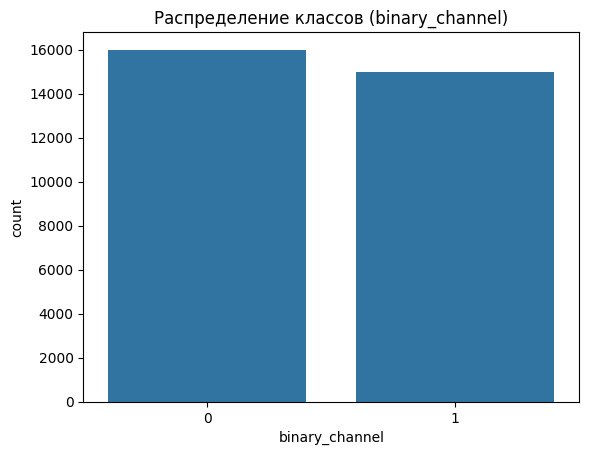

binary_channel
0    16000
1    15000
Name: count, dtype: int64


In [ ]:
# Распределение классов
sns.countplot(x='binary_channel', data=df)
plt.title("Распределение классов (binary_channel)")
plt.show()

# Численные значения
class_counts = df['binary_channel'].value_counts()
print(class_counts)

Классы сбалансированны

## Распределение категориальных признаков

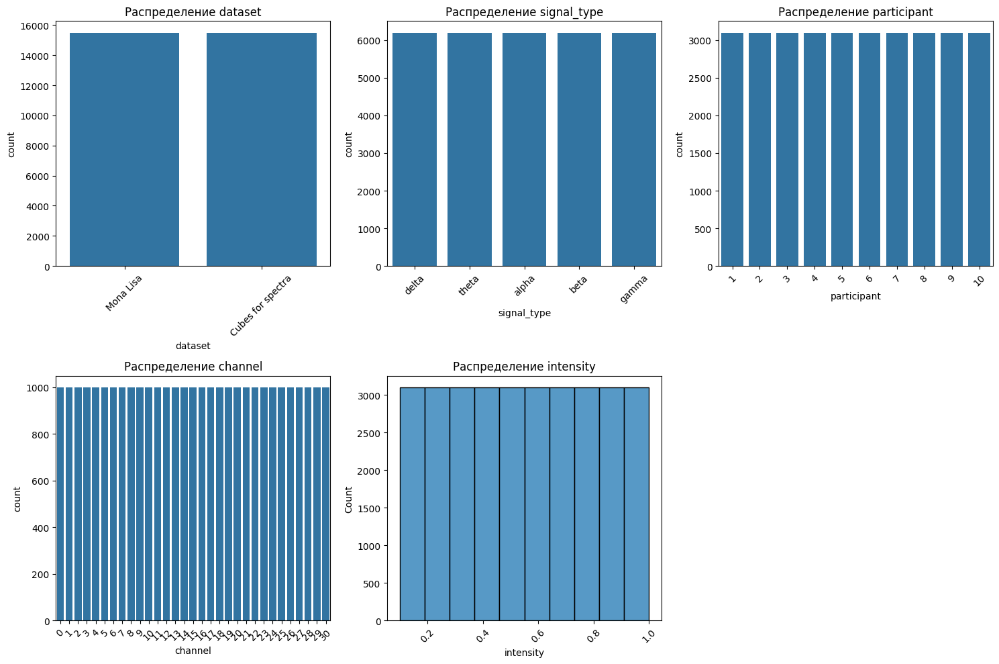

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Список категориальных и числовых признаков
categorical_features = ['dataset', 'signal_type', 'participant']
numeric_features = ['channel', 'intensity']

# Создаем сетку графиков
num_plots = len(categorical_features) + len(numeric_features)
num_cols = 3  # Количество столбцов в сетке
num_rows = (num_plots + num_cols - 1) // num_cols  # Вычисляем количество строк

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
axes = axes.flatten()  # Преобразуем массив осей в плоский список

# Перебираем все категориальные признаки
for i, feature in enumerate(categorical_features):
    ax = axes[i]
    sns.countplot(x=feature, data=df, ax=ax)
    ax.set_title(f"Распределение {feature}")
    ax.tick_params(axis='x', rotation=45)  # Поворачиваем метки по оси X для удобства чтения

# Перебираем числовые признаки
for j, feature in enumerate(numeric_features, start=len(categorical_features)):
    ax = axes[j]
    if feature == 'channel':
        # Для channel используем countplot без группировки
        sns.countplot(x=feature, data=df, ax=ax)
        ax.set_title(f"Распределение {feature}")
    elif feature == 'intensity':
        # Для intensity используем гистограмму с фиксированным шагом
        sns.histplot(df[feature], bins=10, ax=ax, kde=False)  # Убираем KDE
        ax.set_title(f"Распределение {feature}")
    ax.tick_params(axis='x', rotation=45)

# Удаляем лишние пустые графики
for k in range(len(categorical_features) + len(numeric_features), len(axes)):
    axes[k].axis('off')

# Настройка макета
plt.tight_layout()
plt.show()

## Анализ сигналов

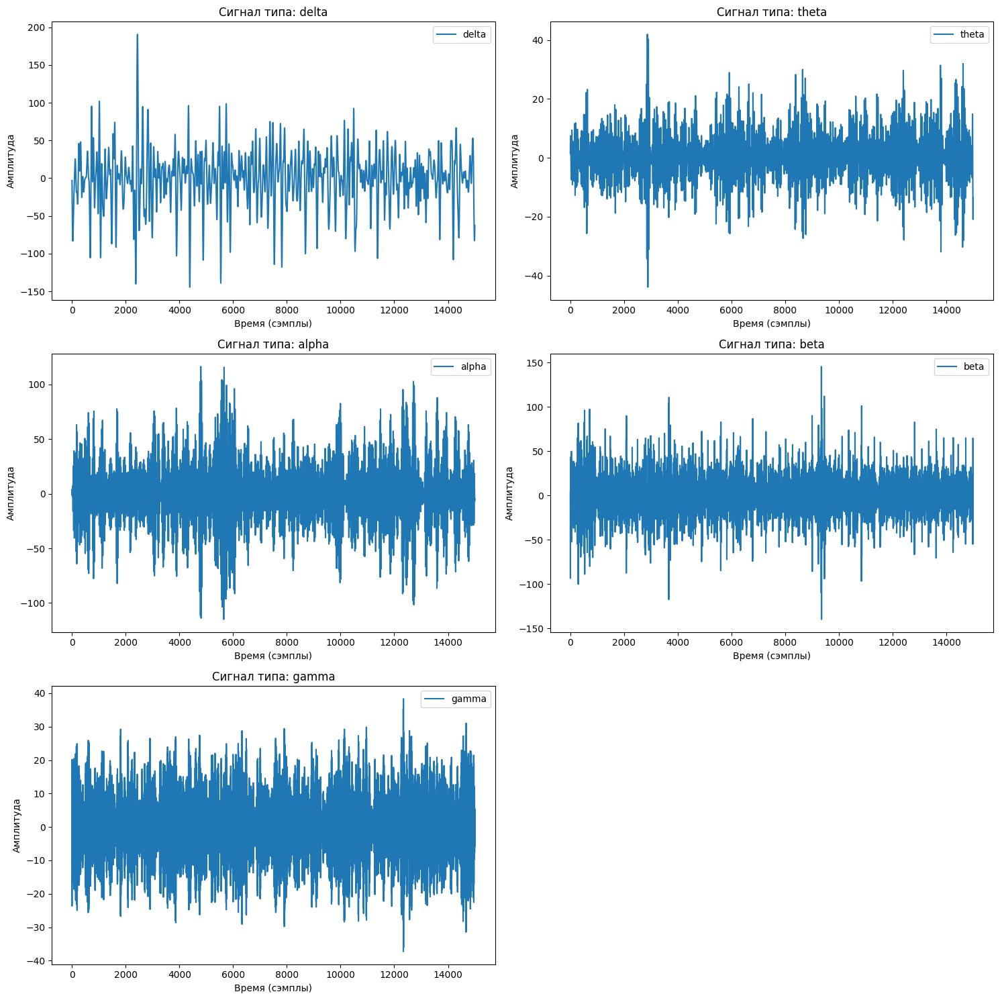

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Список типов сигналов
signal_types = df['signal_type'].unique()

# Выбираем случайные наблюдения для каждого типа сигнала
random_samples = df.groupby('signal_type').apply(lambda x: x.sample(1)).reset_index(drop=True)

# Создаем сетку графиков
num_plots = len(signal_types)
num_cols = 2  # Количество столбцов в сетке
num_rows = (num_plots + num_cols - 1) // num_cols  # Вычисляем количество строк

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
axes = axes.flatten()  # Преобразуем массив осей в плоский список

# Базовый синий цвет из matplotlib
base_blue = "tab:blue"

# Перебираем все типы сигналов и строим графики
for i, signal_type in enumerate(signal_types):
    ax = axes[i]

    # Берем сигнал для текущего типа
    row = random_samples[random_samples['signal_type'] == signal_type].iloc[0]
    signal = row.iloc[:15000].values  # Первые 15000 значений (сигналы)

    # Строим график
    ax.plot(signal, label=f"{signal_type}", color=base_blue)
    ax.set_title(f"Сигнал типа: {signal_type}")
    ax.set_xlabel("Время (сэмплы)")
    ax.set_ylabel("Амплитуда")
    ax.legend()

# Удаляем лишние пустые графики
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Настройка макета
plt.tight_layout()
plt.show()

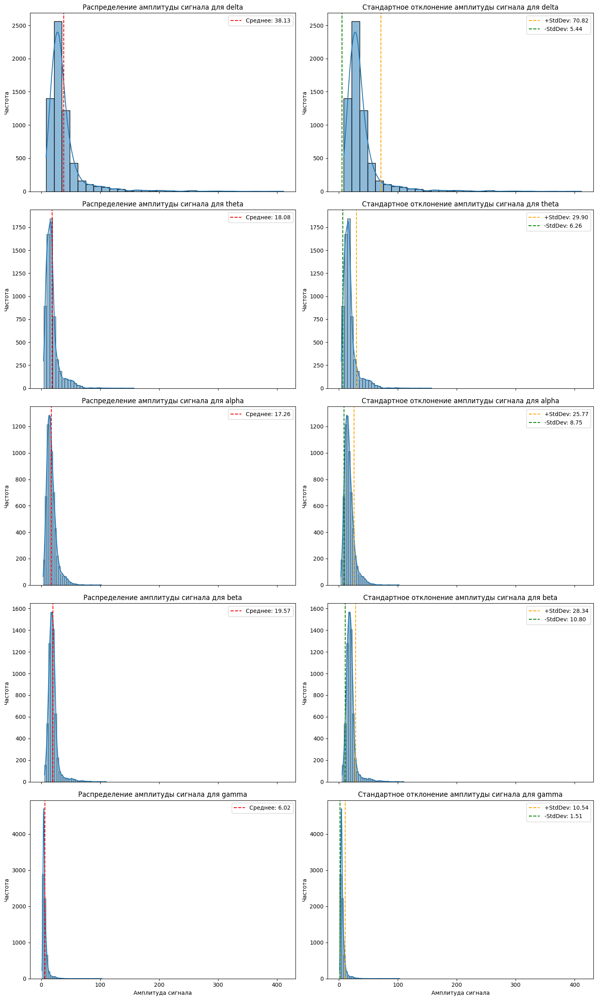

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Список типов сигналов
signal_types = df['signal_type'].unique()

# Создаем сетку графиков: одна строка для каждого типа сигнала
num_plots = len(signal_types)
fig, axes = plt.subplots(num_plots, 2, figsize=(15, 5 * num_plots), sharex='col')

# Базовый синий цвет из matplotlib
base_blue = "tab:blue"

# Перебираем все типы сигналов и строим графики
for i, signal_type in enumerate(signal_types):
    # Фильтруем данные для текущего типа сигнала
    signal_data = df[df['signal_type'] == signal_type].iloc[:, :15000]

    # Вычисляем среднюю амплитуду (MAV) для каждого наблюдения
    amplitude_signal = signal_data.abs().mean(axis=1)  # Средняя амплитуда

    # Вычисляем статистические метрики
    mean_amplitude = amplitude_signal.mean()  # Среднее значение амплитуды
    std_amplitude = amplitude_signal.std()    # Стандартное отклонение амплитуды

    # График распределения амплитуды сигнала
    sns.histplot(amplitude_signal, bins=30, kde=True, color=base_blue, ax=axes[i, 0])
    axes[i, 0].axvline(mean_amplitude, color='red', linestyle='--', label=f"Среднее: {mean_amplitude:.2f}")
    axes[i, 0].set_title(f"Распределение амплитуды сигнала для {signal_type}")
    axes[i, 0].set_xlabel("Амплитуда сигнала")
    axes[i, 0].set_ylabel("Частота")
    axes[i, 0].legend()

    # График стандартных отклонений амплитуды сигнала
    sns.histplot(amplitude_signal, bins=30, kde=True, color=base_blue, ax=axes[i, 1])
    axes[i, 1].axvline(mean_amplitude + std_amplitude, color='orange', linestyle='--',
                       label=f"+StdDev: {(mean_amplitude + std_amplitude):.2f}")
    axes[i, 1].axvline(mean_amplitude - std_amplitude, color='green', linestyle='--',
                       label=f"-StdDev: {(mean_amplitude - std_amplitude):.2f}")
    axes[i, 1].set_title(f"Стандартное отклонение амплитуды сигнала для {signal_type}")
    axes[i, 1].set_xlabel("Амплитуда сигнала")
    axes[i, 1].set_ylabel("Частота")
    axes[i, 1].legend()

# Настройка макета
plt.tight_layout()
plt.show()

**Общие выводы**

* Прослеживается обратная зависимость между частотой ритма и его амплитудой: низкочастотные ритмы (дельта, тета) имеют более высокие средние значения амплитуды, в то время как высокочастотные (альфа, бета, гамма) демонстрируют низкие амплитуды.

* Дельта ритмы имеют наибольшую среднюю амплитуду и вариабельность (стандартное отклонение) среди всех типов сигналов.

* Тета ритмы имеют меньшую среднюю амплитуду и вариабельность по сравнению с дельта ритмами.

* Альфа, бета и гамма ритмы характеризуются низкими средними амплитудами и небольшими стандартными отклонениями, что указывает на более стабильные сигналы.

* Распределения стандартных отклонений для всех типов ритмов смещены вправо, что свидетельствует о наличии выбросов и высокой вариабельности в отдельных случаях.

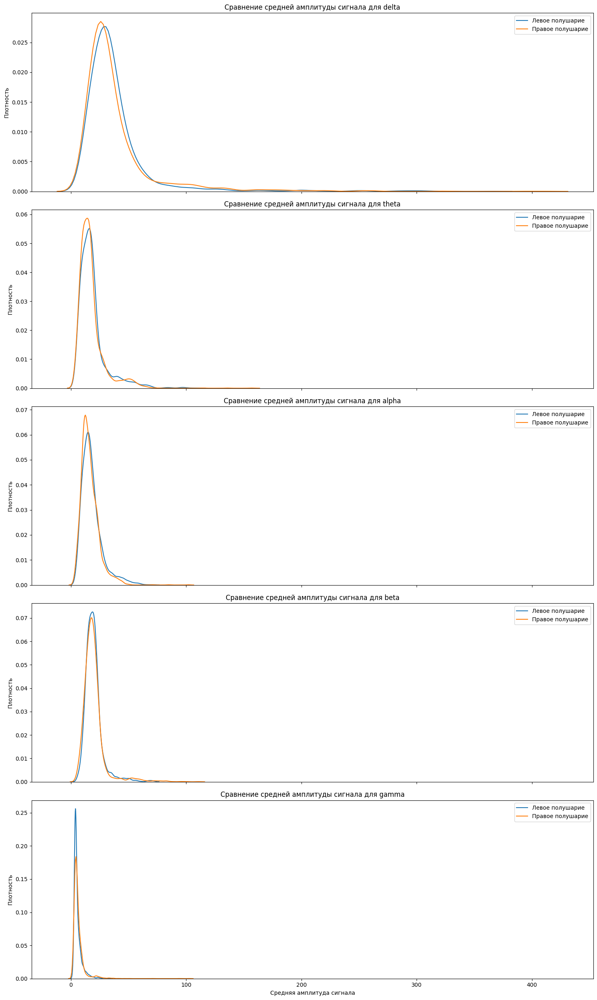

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Список типов сигналов
signal_types = df['signal_type'].unique()

# Создаем сетку графиков: один график для каждого типа сигнала
num_plots = len(signal_types)
fig, axes = plt.subplots(num_plots, 1, figsize=(15, 5 * num_plots), sharex=True)

# Базовые цвета для полушарий
colors = {0: "tab:blue", 1: "tab:orange"}  # Левое полушарие - синий, правое - оранжевый

# Перебираем все типы сигналов и строим графики
for i, signal_type in enumerate(signal_types):
    ax = axes[i] if num_plots > 1 else axes  # Если только один график, axes не является массивом

    # Фильтруем данные для текущего типа сигнала
    signal_data = df[df['signal_type'] == signal_type].iloc[:, :15000]

    # Вычисляем среднюю амплитуду (MAV) для каждого наблюдения
    amplitude_signal = signal_data.abs().mean(axis=1)  # Средняя амплитуда

    # Разделяем данные по полушариям
    left_hemisphere = amplitude_signal[df['binary_channel'] == 0]  # Левое полушарие
    right_hemisphere = amplitude_signal[df['binary_channel'] == 1]  # Правое полушарие

    # Строим KDE-графики для сравнения распределений
    sns.kdeplot(left_hemisphere, label="Левое полушарие", color=colors[0], ax=ax)
    sns.kdeplot(right_hemisphere, label="Правое полушарие", color=colors[1], ax=ax)

    # Настройка заголовков и меток
    ax.set_title(f"Сравнение средней амплитуды сигнала для {signal_type}")
    ax.set_xlabel("Средняя амплитуда сигнала")
    ax.set_ylabel("Плотность")
    ax.legend()

# Настройка макета
plt.tight_layout()
plt.show()

Вероятно, средняя амплитуда не является надежной характеристикой для классификации полушарий, так как различия между графиками амплитуд левого и правого полушарий выражены слабо.

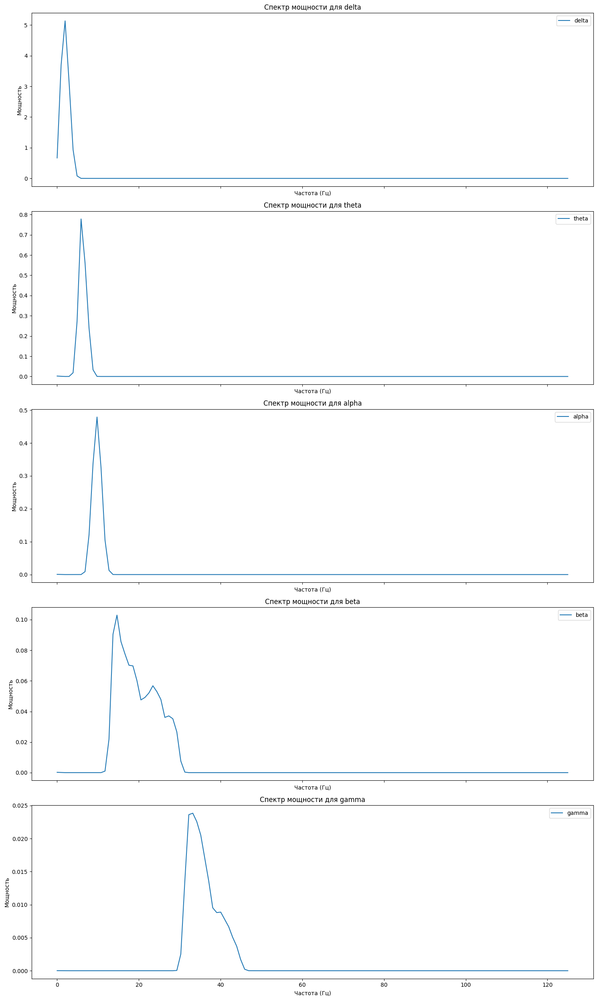

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import welch

# Список типов сигналов
signal_types = df['signal_type'].unique()

# Создаем сетку графиков: один график для каждого типа сигнала
num_plots = len(signal_types)
fig, axes = plt.subplots(num_plots, 1, figsize=(15, 5 * num_plots), sharex=True)

# Перебираем все типы сигналов и строим графики
for i, signal_type in enumerate(signal_types):
    ax = axes[i] if num_plots > 1 else axes  # Если только один график, axes не является массивом

    # Фильтруем данные для текущего типа сигнала
    signal_data = df[df['signal_type'] == signal_type].iloc[:, :15000]

    # Вычисляем спектр мощности для каждого наблюдения
    frequencies, power_spectrum = welch(signal_data.mean(axis=0), fs=250, nperseg=256)

    # Строим график спектра мощности
    ax.plot(frequencies, power_spectrum, label=f"{signal_type}")
    ax.set_title(f"Спектр мощности для {signal_type}")
    ax.set_xlabel("Частота (Гц)")
    ax.set_ylabel("Мощность")
    ax.legend()

# Настройка макета
plt.tight_layout()
plt.show()

Графики спектров мощности показывают, что для каждого типа сигнала (delta, theta, alpha, beta, gamma) наблюдается активность в их соответствующих частотных диапазонах . Это указывает на корректные данные , которые были правильно записаны и обработаны. Мощность сигнала убывает с увеличением частоты, что соответствует общему тренду ЭЭГ-сигналов.

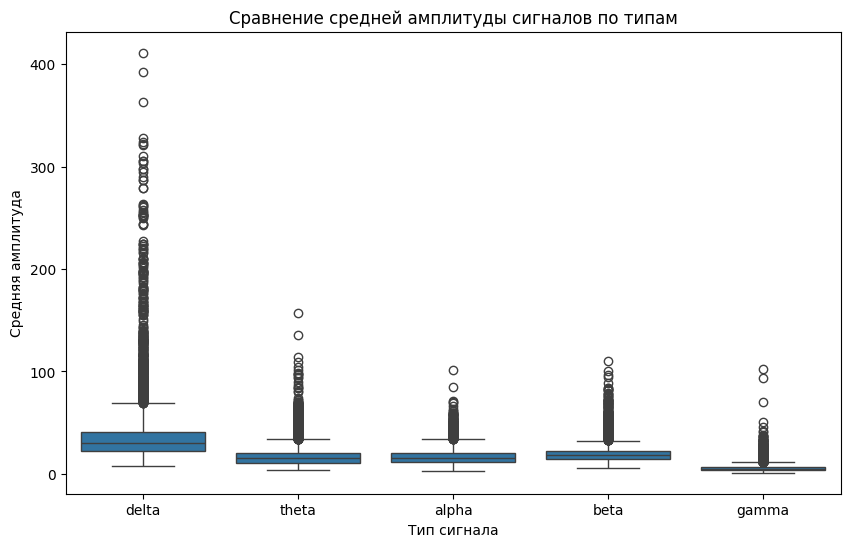

In [ ]:
# Вычисляем среднюю амплитуду (MAV) для каждого наблюдения
df['mean_amplitude'] = df.iloc[:, :15000].abs().mean(axis=1)

# Создаем новый DataFrame с необходимыми столбцами
data_for_boxplot = df[['signal_type', 'mean_amplitude']]

# Построение боксплотов
plt.figure(figsize=(10, 6))
sns.boxplot(x='signal_type', y='mean_amplitude', data=data_for_boxplot)
plt.title("Сравнение средней амплитуды сигналов по типам")
plt.xlabel("Тип сигнала")
plt.ylabel("Средняя амплитуда")
plt.show()

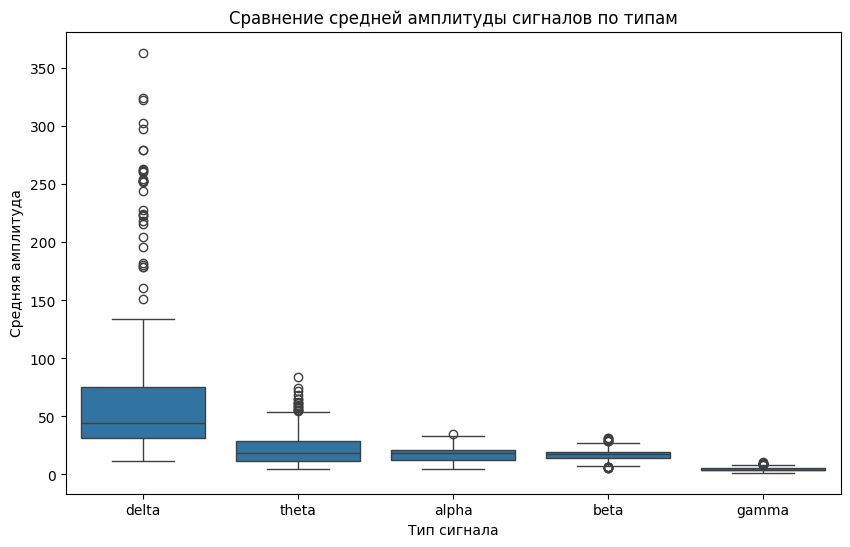

In [ ]:
# Вычисляем среднюю амплитуду (MAV) для каждого наблюдения
df['mean_amplitude'] = df.iloc[:, :15000].abs().mean(axis=1)

# Создаем новый DataFrame с необходимыми столбцами
data_for_boxplot = df[['signal_type', 'mean_amplitude']]

# Построение боксплотов
plt.figure(figsize=(10, 6))
sns.boxplot(x='signal_type', y='mean_amplitude', data=data_for_boxplot)
plt.title("Сравнение средней амплитуды сигналов по типам")
plt.xlabel("Тип сигнала")
plt.ylabel("Средняя амплитуда")
plt.show()


1. **Дельта-волны**:
   - Имеют **наибольшую среднюю амплитуду** среди всех типов сигналов.
   - Отличаются большим размахом значений и наличием выбросов.

2. **Тета-волны**:
   - Имеют **значительно меньшую среднюю амплитуду**, чем дельта-волны.
   - Размах меньше, чем у дельта-волн, но все еще заметен.

3. **Альфа-, бета- и гамма-волны**:
   - Имеют **очень низкие средние амплитуды**, практически близкие к нулю.
   - Размах значений минимален, что указывает на стабильность этих сигналов.

4. **Общий тренд**:
   - Средняя амплитуда сигнала **убывает с увеличением частоты**:
     - Дельта > Тета > Альфа ≈ Бета ≈ Гамма.
   - Размах значений также **убывает с увеличением частоты**:
     - Дельта > Тета > Альфа ≈ Бета ≈ Гамма.

--

| **Тип сигнала** | **Средняя амплитуда** | **Размах**          | **Выбросы** |
|------------------|------------------------|---------------------|-------------|
| **Delta**        | Высокая               | Большой            | Есть        |
| **Theta**        | Низкая                | Умеренный          | Немного     |
| **Alpha**        | Очень низкая          | Малый              | Нет         |
| **Beta**         | Очень низкая          | Малый              | Нет         |
| **Gamma**        | Почти нулевая         | Минимальный        | Нет         |


## Корреляции

По каналам(датчикам)

На всех данных

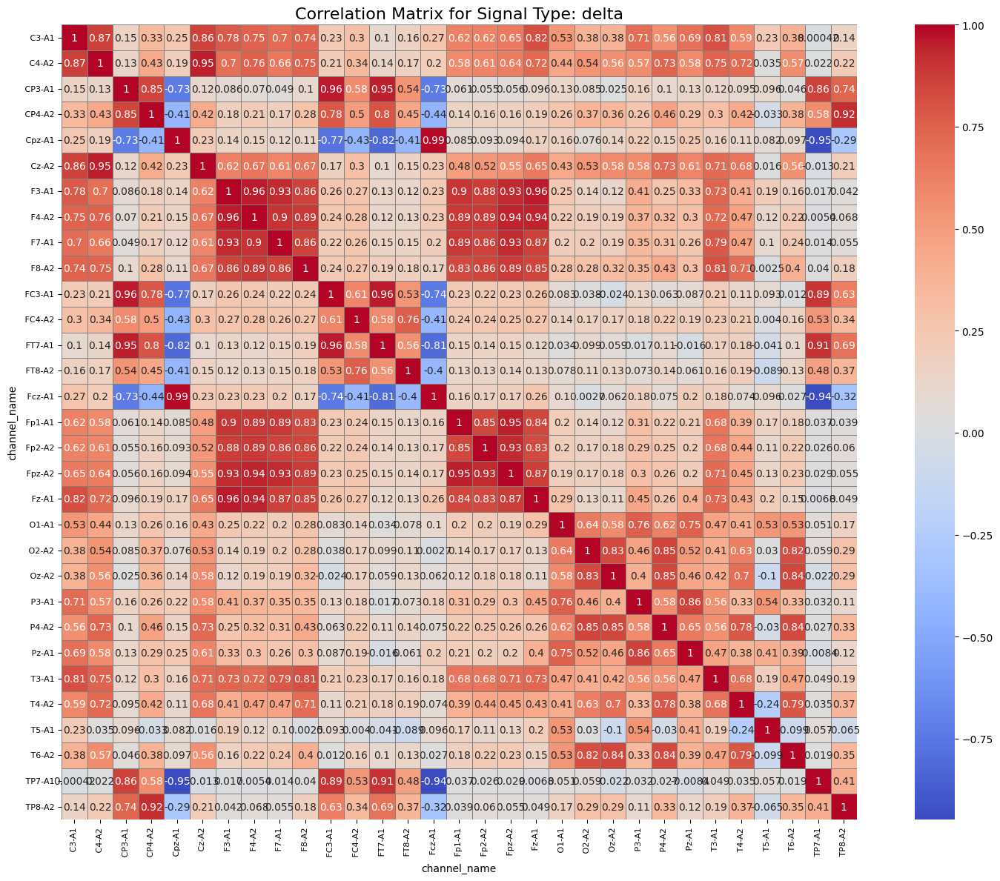

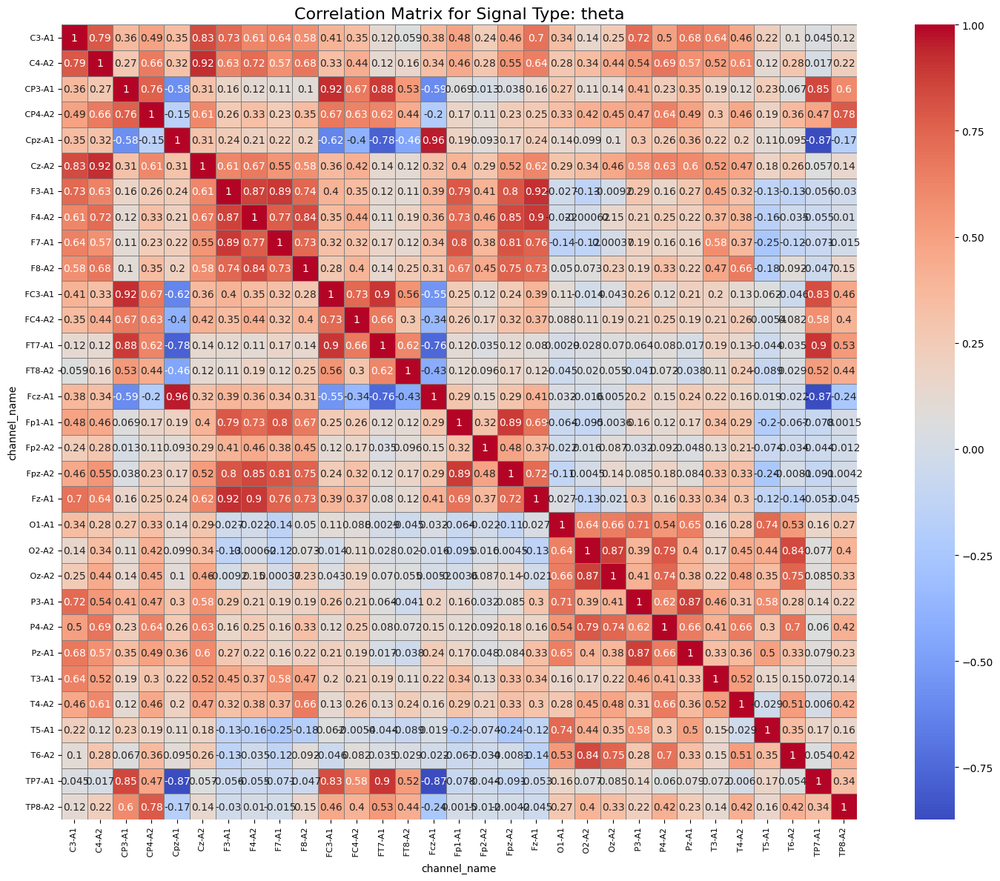

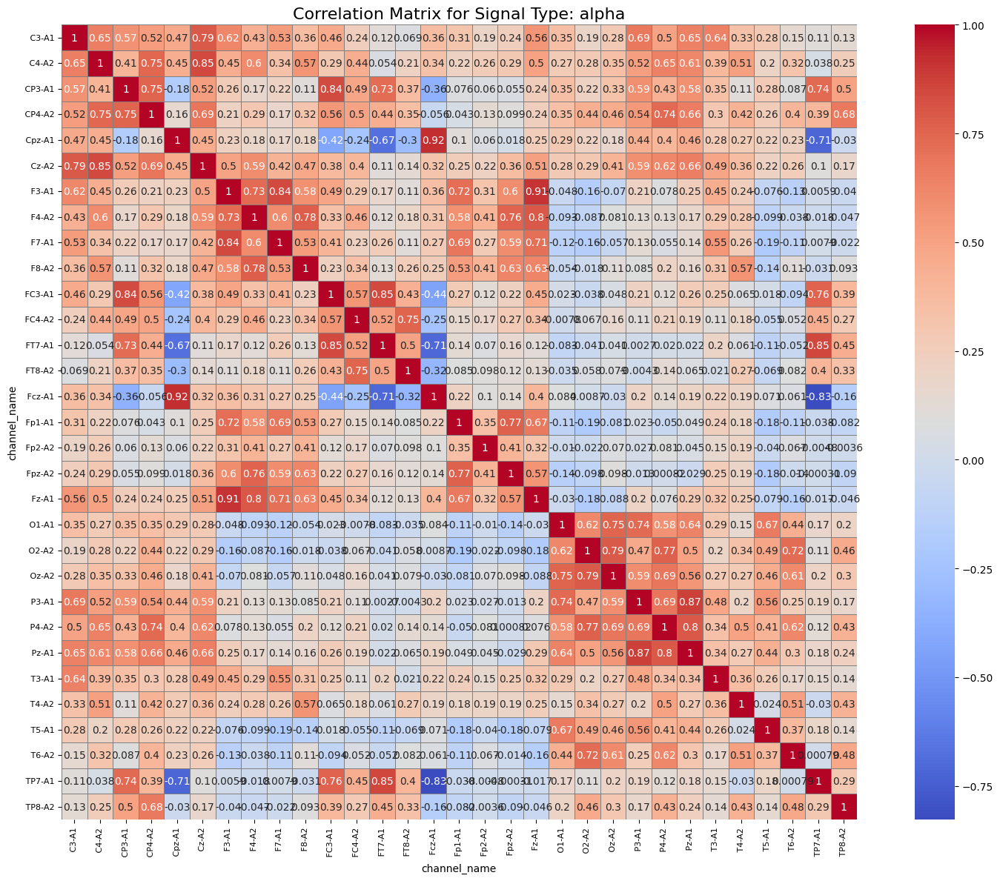

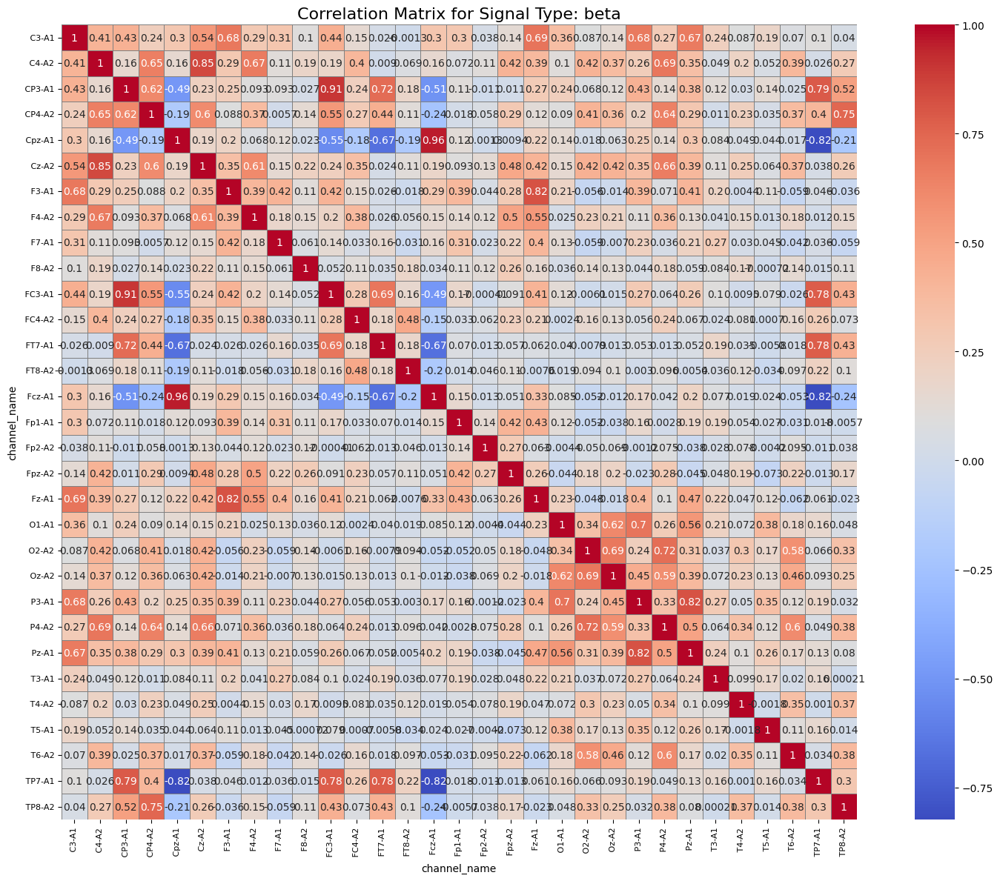

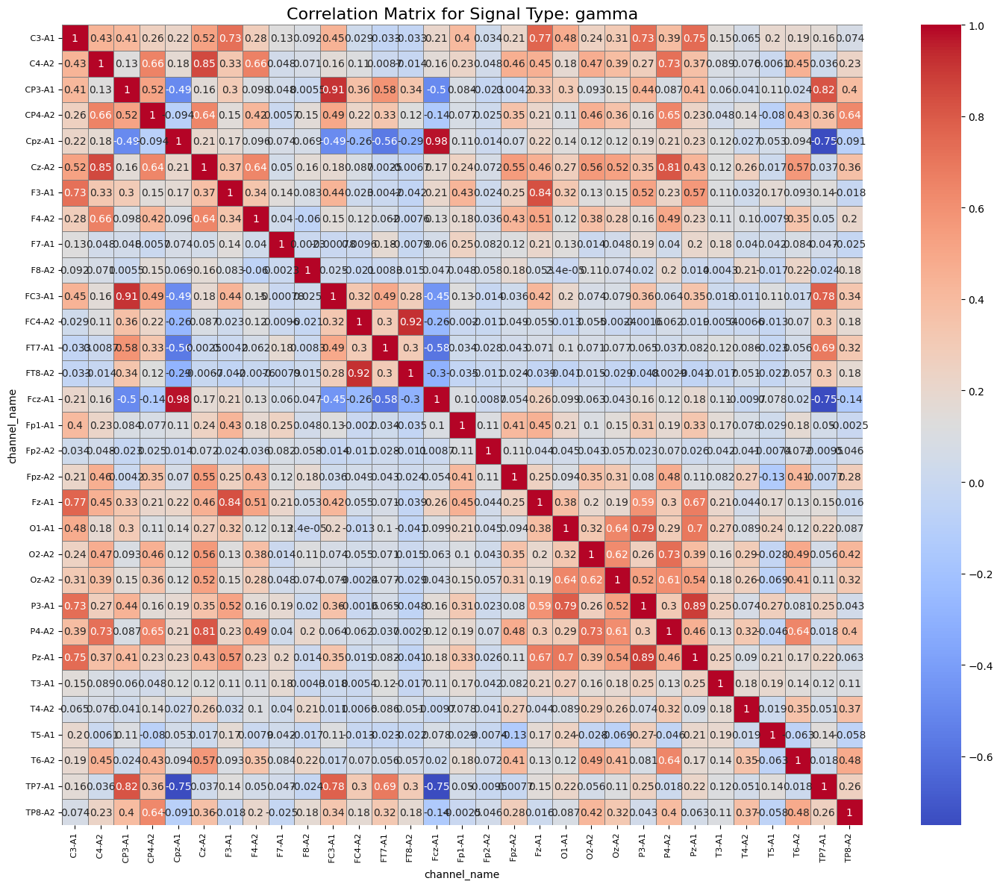

In [ ]:
correlation_data = []

#Группировка данных и усреднение значений для каждого канала
for signal_type in df['signal_type'].unique():
    # Фильтруем данные для текущего типа сигнала
    signal_data = df[df['signal_type'] == signal_type]

    # Группируем данные по channel_name и усредняем значения для всех участников
    averaged_data = (
        signal_data
        .groupby('channel_name')
        .mean(numeric_only=True)  # Усредняем значения временного ряда
        .drop(columns=['channel', 'intensity', 'participant', 'binary_channel'], errors='ignore')  # Удаляем ненужные столбцы
    )
    correlation_data.append({
        "signal_type": signal_type,
        "data": averaged_data.T  # Транспонируем для удобства вычисления корреляции
    })

#Вычисление матриц корреляции для каждого типа сигнала
correlation_matrices = {}

for entry in correlation_data:
    signal_type = entry["signal_type"]
    data = entry["data"]

    # Вычисляем матрицу корреляции
    correlation_matrix = data.corr()
    correlation_matrices[signal_type] = correlation_matrix

#Визуализация матриц корреляции
for signal_type, corr_matrix in correlation_matrices.items():
    plt.figure(figsize=(16, 12))  # Увеличиваем размер графика
    sns.heatmap(
        corr_matrix,
        annot=True,  # Отключаем отображение числовых значений
        cmap="coolwarm",  # Цветовая карта
        cbar=True,  # Показываем цветовую шкалу
        square=True,  # Квадратные ячейки
        linewidths=0.5,  # Добавляем тонкие линии между ячейками
        linecolor="gray"  # Цвет линий
    )
    plt.title(f"Correlation Matrix for Signal Type: {signal_type}", fontsize=16)
    plt.xticks(rotation=90, fontsize=8)  # Уменьшаем размер шрифта меток по оси X
    plt.yticks(rotation=0, fontsize=8)  # Уменьшаем размер шрифта меток по оси Y
    plt.tight_layout()  # Улучшаем размещение элементов графика
    plt.show()

По типам сигналов

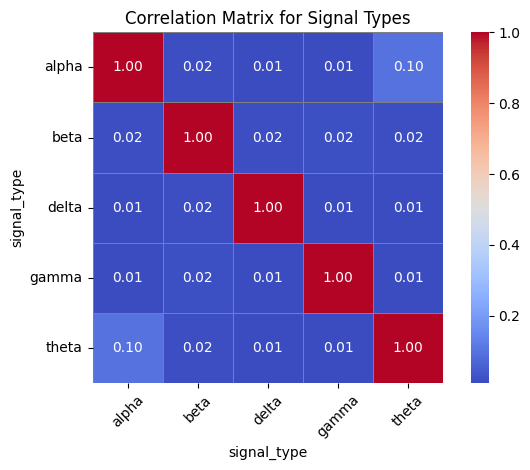

In [ ]:
# Удаляем ненужные столбцы один раз, чтобы избежать повторных операций
columns_to_drop = ['channel_name', 'dataset', 'channel', 'intensity', 'participant', 'binary_channel']
df_cleaned = df.drop(columns=columns_to_drop, errors='ignore')

# Группировка данных по signal_type и усреднение значений
averaged_df = (
    df_cleaned
    .groupby('signal_type')
    .mean(numeric_only=True)  # Усредняем значения временного ряда
)

# Вычисление матрицы корреляции для типов сигналов
correlation_matrix = averaged_df.T.corr()  # Транспонируем для корректного вычисления корреляции

# Визуализация матрицы корреляции
# plt.figure(figsize=(12, 10))  # Размер графика
sns.heatmap(
    correlation_matrix,
    annot=True,  # Показывать числовые значения корреляции
    fmt=".2f",  # Формат отображения чисел
    cmap="coolwarm",  # Цветовая карта
    cbar=True,  # Показываем цветовую шкалу
    square=True,  # Квадратные ячейки
    linewidths=0.5,  # Линии между ячейками
    linecolor="gray"  # Цвет линий
)
plt.title("Correlation Matrix for Signal Types")
plt.xticks(rotation=45)  # Угол поворота меток оси X
plt.yticks(rotation=0)  # Метки оси Y
plt.tight_layout()  # Улучшаем размещение элементов графика
plt.show()

Выводы
- нет каких-либо корреляций между типами сигналов, так что transfer learning тут не получится

## Чистка от выбросов

In [3]:
%%time

# Порог Z-оценки
z_threshold = 2

# Функция для замены выбросов с использованием Z-оценок
def replace_outliers_with_zscore(df, group_by_column='signal_type', z_threshold=3):
    """
    Заменяет выбросы в первых 15000 столбцах с использованием Z-оценок.

    Параметры:
    - df: DataFrame с данными.
    - group_by_column: Столбец, по которому группировать данные (например, 'signal_type').
    - z_threshold: Порог Z-оценки для определения выбросов.

    Возвращает:
    - DataFrame с замененными выбросами.
    """
    # Создаем копию DataFrame
    df_cleaned = df.copy()

    # Группируем данные по signal_type
    for signal_type, group in df.groupby(group_by_column):
        # Выбираем только первые 15000 столбцов (временные ряды)
        signal_columns = df.columns[:15000]
        signals = group[signal_columns].values

        # Вычисляем среднее и стандартное отклонение для текущего типа сигнала
        mean_values = np.mean(signals, axis=1)[:, np.newaxis]  # Среднее по каждому сигналу
        std_values = np.std(signals, axis=1)[:, np.newaxis]    # Стандартное отклонение по каждому сигналу

        # Вычисляем Z-оценки
        z_scores = (signals - mean_values) / std_values

        # Определяем границы для замены выбросов
        lower_bounds = mean_values - z_threshold * std_values
        upper_bounds = mean_values + z_threshold * std_values

        # Заменяем выбросы
        clipped_signals = np.clip(signals, a_min=lower_bounds, a_max=upper_bounds)

        # Обновляем значения в DataFrame
        df_cleaned.loc[group.index, signal_columns] = clipped_signals

    return df_cleaned

# Применяем функцию к первым 15000 столбцам
df = replace_outliers_with_zscore(df, group_by_column='signal_type', z_threshold=z_threshold)


CPU times: user 23 s, sys: 546 ms, total: 23.5 s
Wall time: 25.6 s


# Feature Engeneering

## 1. Статистические и частотные метрики по сигналу

In [ ]:
%%time
# Создаем пустой список для новых признаков
features = []

# Словарь с границами частотных диапазонов
frequency_bands = {
    'delta': (1, 4),
    'theta': (4, 8),
    'alpha': (8, 12),
    'beta': (12, 30),
    'gamma': (30, 100)  # Верхняя граница для гамма-диапазона может быть выше 30 Гц
}

# Перебираем каждую строку датасета
for index, row in df.iterrows():
    signal = row.iloc[:15000].values.astype(float)  # Берем первые 15000 значений сигнала
    signal_type = row['signal_type']  # Тип сигнала для текущей строки

    # --- Статистические метрики ---
    mean_amplitude = np.mean(np.abs(signal))  # Среднее значение амплитуды (MAV)
    std_amplitude = np.std(np.abs(signal))   # Стандартное отклонение амплитуды (MAV)
    max_amplitude = np.max(signal)           # Максимальное значение
    min_amplitude = np.min(signal)           # Минимальное значение
    rms_amplitude = np.sqrt(np.mean(signal**2))  # Среднеквадратичное значение (RMS)

    # --- Частотные характеристики ---
    frequencies, power_spectrum = welch(signal, fs=250, nperseg=256)

    # Определяем границы диапазона для текущего типа сигнала
    freq_min, freq_max = frequency_bands[signal_type]

    # Вычисляем мощность только для соответствующего диапазона
    band_power = np.sum(power_spectrum[(frequencies >= freq_min) & (frequencies <= freq_max)])

    # Пиковая частота (частота с максимальной мощностью)
    peak_frequency = frequencies[np.argmax(power_spectrum)]

    # --- Временные характеристики ---
    zero_crossings = np.sum(np.diff(np.sign(signal)) != 0)  # Количество пересечений нуля
    signal_derivative = np.mean(np.abs(np.diff(signal)))   # Абсолютная разница между соседними значениями

    # --- Добавляем признаки в список ---
    features.append([
        mean_amplitude, std_amplitude, max_amplitude, min_amplitude, rms_amplitude,
        peak_frequency, band_power, zero_crossings, signal_derivative
    ])

# Создаем DataFrame из списка признаков
feature_columns = [
    "mean_amplitude", "std_amplitude_mav", "max_amplitude", "min_amplitude", "rms_amplitude",
    "peak_frequency", "band_power", "zero_crossings", "signal_derivative"
]
features_df = pd.DataFrame(features, columns=feature_columns)

# Добавляем новые признаки к исходному датасету
df = pd.concat([df, features_df], axis=1)

CPU times: user 36.1 s, sys: 16.8 s, total: 52.9 s
Wall time: 1min


## 2. PCA

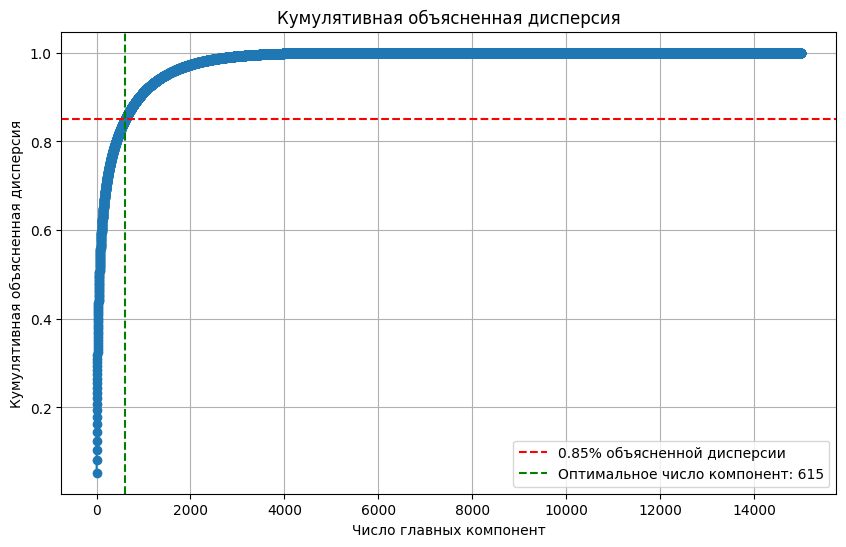

Оптимальное число главных компонент: 615
Объясненная дисперсия: 0.85
CPU times: user 1h 48min 26s, sys: 23min 6s, total: 2h 11min 33s
Wall time: 12min 28s


In [ ]:
%%time
# Выбираем первые 15000 столбцов (временные значения)
X_signal = df.iloc[:, :15000]

# Применяем PCA без ограничения числа компонент
pca = PCA()
pca.fit(X_signal)

# Объясненная дисперсия для каждой компоненты
explained_variance_ratio = pca.explained_variance_ratio_

# Кумулятивная объясненная дисперсия
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Определение оптимального числа компонент
threshold = 0.0001  # Порог прироста (1%)
step = 5          # Шаг проверки (каждые 5 компонент)
optimal_components = None

for i in range(step, len(cumulative_explained_variance), step):
    variance_gain = cumulative_explained_variance[i] - cumulative_explained_variance[i - step]

    # Условие: если прирост меньше порога или достигнута 95% объясненная дисперсия
    if variance_gain < threshold or cumulative_explained_variance[i] >= 0.85:
        optimal_components = i
        break

# Если не достигнут порог или 95%, берем все компоненты
if optimal_components is None:
    optimal_components = len(cumulative_explained_variance)

# Визуализация кумулятивной объясненной дисперсии
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='--')
plt.title("Кумулятивная объясненная дисперсия")
plt.xlabel("Число главных компонент")
plt.ylabel("Кумулятивная объясненная дисперсия")
plt.grid()

# Горизонтальная линия для 95% объясненной дисперсии
plt.axhline(y=cumulative_explained_variance[optimal_components], color='r', linestyle='--', label=f"{cumulative_explained_variance[optimal_components]:.2f}% объясненной дисперсии")

# Вертикальная линия для оптимального числа компонент
if optimal_components is not None:
    plt.axvline(x=optimal_components, color='g', linestyle='--', label=f"Оптимальное число компонент: {optimal_components}")
    plt.legend()

plt.show()

print(f"Оптимальное число главных компонент: {optimal_components}")
print(f"Объясненная дисперсия: {cumulative_explained_variance[optimal_components]:.2f}")

In [ ]:
# Выбираем первые 15000 столбцов (временные значения)
X_signal = df.iloc[:, :15000]

# Применяем PCA с оптимальным числом компонент
pca = PCA(n_components=optimal_components)  # Используем ранее найденное оптимальное число компонент
X_pca = pca.fit_transform(X_signal)

# Создаем DataFrame из PCA-компонентов
pca_columns = [f"PCA_{i+1}" for i in range(optimal_components)]
df_pca = pd.DataFrame(X_pca, columns=pca_columns)

# Добавляем PCA-компоненты к исходному датасету
df = pd.concat([df, df_pca], axis=1)

# Выводим первые строки нового датасета
df.head()

,Time0,Time1,Time2,Time3,Time4,Time5,Time6,Time7,Time8,Time9,...,PCA_606,PCA_607,PCA_608,PCA_609,PCA_610,PCA_611,PCA_612,PCA_613,PCA_614,PCA_615
0,32.819580,22.394499,11.944530,1.509794,-8.869929,-19.140559,-29.255348,-39.181859,-48.879722,-58.298553,...,3.038462,95.986724,35.945686,-49.958646,-81.585088,-91.829099,56.627976,-6.876632,-39.250472,20.477370
1,22.895093,22.571077,22.213273,21.817371,21.388242,20.932859,20.448701,19.929610,19.379078,18.803183,...,20.019558,19.813978,-9.093475,-17.771279,-106.211250,-83.893390,-48.409302,46.170740,-26.416939,-5.072868
2,22.636168,25.515590,28.336306,31.081621,33.736376,36.288001,38.722030,41.023426,43.179827,45.182350,...,-14.052737,80.164588,63.609493,-102.684710,-131.932766,-165.007215,116.753234,-14.248243,-91.381281,90.380978
3,36.106648,38.336931,40.448344,42.426091,44.260684,45.944858,47.468797,48.823125,50.001139,50.994271,...,11.866231,27.873600,-18.585803,-80.726928,-67.779611,-100.020723,-33.288593,80.534416,-84.662535,6.435153
4,26.015135,23.859016,21.597520,19.234030,16.773968,14.223820,11.587520,8.870086,6.079060,3.221594,...,35.032345,89.731583,15.587051,-42.857079,-10.921997,-34.238703,37.713282,11.057850,-59.413872,-47.290124


## 3. Агрегация по временным окнам

In [ ]:
%%time
# Функция для агрегации сигнала по окнам
def aggregate_signal(signal, window_size):
    num_windows = len(signal) // window_size
    aggregated_features = []
    for i in range(num_windows):
        window = signal[i * window_size:(i + 1) * window_size]
        aggregated_features.extend([
            np.mean(window),       # Среднее значение
            np.std(window),        # Стандартное отклонение
            np.max(window),        # Максимум
            np.min(window),        # Минимум
            np.median(window),     # Медиана
            np.sum(np.abs(window)) # Сумма модулей
        ])
    return aggregated_features

# Размер окна
window_size = 500

# Применяем агрегацию к каждому сигналу
aggregated_data = np.array([aggregate_signal(row[:15000], window_size) for _, row in df.iterrows()])

# Создаем DataFrame из агрегированных данных
num_windows = 15000 // window_size
aggregation_columns = [f"Window_{i+1}_{metric}" for i in range(num_windows) for metric in ["mean", "std", "max", "min", "median", "sum_abs"]]
df_aggregated = pd.DataFrame(aggregated_data, columns=aggregation_columns)

df_aggregated
# Добавляем агрегированные данные к датасету
df = pd.concat([df, df_aggregated], axis=1)

CPU times: user 4min 18s, sys: 26 s, total: 4min 44s
Wall time: 4min 54s


## 4. Преобразования исходных столбцов

In [4]:
# Целевая переменная — binary_channel
df['target'] = df['binary_channel']

# Кодируем signal_type числовыми значениями
# df['signal_type_encoded'] = df['signal_type'].astype('category').cat.codes + 1  # +1 для удобства (начинаем с 1)
# df['dataset_encoded'] = df['dataset'].astype('category').cat.codes + 1  # +1 для удобства (начинаем с 1)

# Удаляем старый столбец signal_type, он больше не нужен
df = df.drop(columns=['signal_type', 'channel', 'channel_name', 'dataset', 'binary_channel', 'participant', 'intensity'])

# Выводим первые строки нового датасета
df.head()

,Time0,Time1,Time2,Time3,Time4,Time5,Time6,Time7,Time8,Time9,...,Time14991,Time14992,Time14993,Time14994,Time14995,Time14996,Time14997,Time14998,Time14999,target
0,7.772971,30.677260,53.414131,75.881410,76.423352,76.423352,76.423352,76.423352,76.423352,76.423352,...,22.885069,22.340670,21.823520,21.333031,20.861004,20.412495,19.997012,19.611280,19.253296,1
1,3.552206,6.295904,9.036222,11.755786,14.439544,17.073644,19.643102,22.137441,24.553859,26.886863,...,19.588755,18.119286,16.618160,15.088950,13.542232,11.998175,10.470980,8.958668,7.460398,0
2,15.108177,25.548918,35.963586,46.306004,56.530589,66.585452,76.419773,85.988708,95.247168,104.151343,...,-4.679370,-4.529879,-4.257585,-3.867217,-3.364415,-2.754205,-2.040051,-1.226739,-0.319342,1
3,29.873366,38.394229,46.917213,55.403349,63.813158,72.102332,80.226615,88.146891,95.827475,103.232718,...,-0.362168,-0.499743,-0.548831,-0.513241,-0.389060,-0.167290,0.151349,0.558072,1.051977,0
4,8.950041,12.746146,16.674944,20.718726,24.863267,29.082730,33.344960,37.623750,41.892953,46.123527,...,23.928307,24.552677,25.205476,25.884569,26.589298,27.319037,28.075960,28.863124,29.681844,1


## 5. Сплит данных на трейн, валидацию и тест

In [ ]:
def participant_based_cross_validation(df):
    """
    Реализует участник-ориентированную кросс-валидацию (Leave-One-Subject-Out) с использованием генератора.

    Параметры:
    - df: DataFrame с данными, содержащий поле 'participant' с номерами участников.

    Yields:
    - train_data: Обучающая выборка (DataFrame).
    - test_data: Тестовая выборка (DataFrame).
    """
    # Получаем уникальных участников
    participants = df['participant'].unique()

    # Генерируем разбиения
    for participant in participants:
        # Тестовая выборка: данные текущего участника
        test_data = df[df['participant'] == participant]

        # Обучающая выборка: данные всех остальных участников
        train_data = df[df['participant'] != participant]

        # Возвращаем разбиение через yield
        yield train_data, test_data

In [ ]:
def participant_based_cross_validation_with_validation_fold(df):
    """
    Реализует участник-ориентированную кросс-валидацию с тремя выборками:
    обучающей, валидационной и тестовой.

    Параметры:
    - df: DataFrame с данными, содержащий поле 'participant' с номерами участников.

    Yields:
    - train_data: Обучающая выборка (DataFrame).
    - val_data: Валидационная выборка (DataFrame).
    - test_data: Тестовая выборка (DataFrame).
    """
    # Получаем уникальных участников
    participants = df['participant'].unique()

    # Проверяем, что участников достаточно для разбиения
    if len(participants) < 3:
        raise ValueError("Для разделения на три выборки требуется минимум 3 участника.")

    # Генерируем разбиения
    for i, test_participant in enumerate(participants):
        # Тестовая выборка: данные текущего участника
        test_data = df[df['participant'] == test_participant]

        # Валидационный участник: следующий за тестовым (или первый, если тестовый последний)
        val_index = (i + 1) % len(participants)
        val_participant = participants[val_index]
        val_data = df[df['participant'] == val_participant]

        # Обучающая выборка: данные всех остальных участников
        train_data = df[~df['participant'].isin([test_participant, val_participant])]

        # Возвращаем разбиение через yield
        yield train_data, val_data, test_data

In [ ]:
# Выбираем все признаки, кроме первых 15000 столбцов и целевой переменной
X = df.iloc[:, 15000:]
X = X.drop(columns=['target'])
y = df['target']

## 6. Сравнение параметров для методов FE

--------------------------------------------------------------------------------
PCA: Объясненная дисперсия = 0.85
--------------------------------------------------------------------------------
Агрегация: Размер окна = 250
--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 10
Средняя F1-score на кросс-валидации: 0.54
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


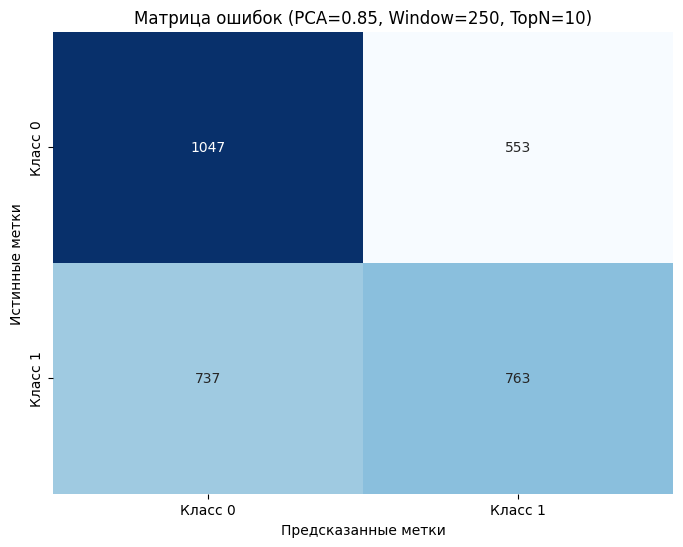

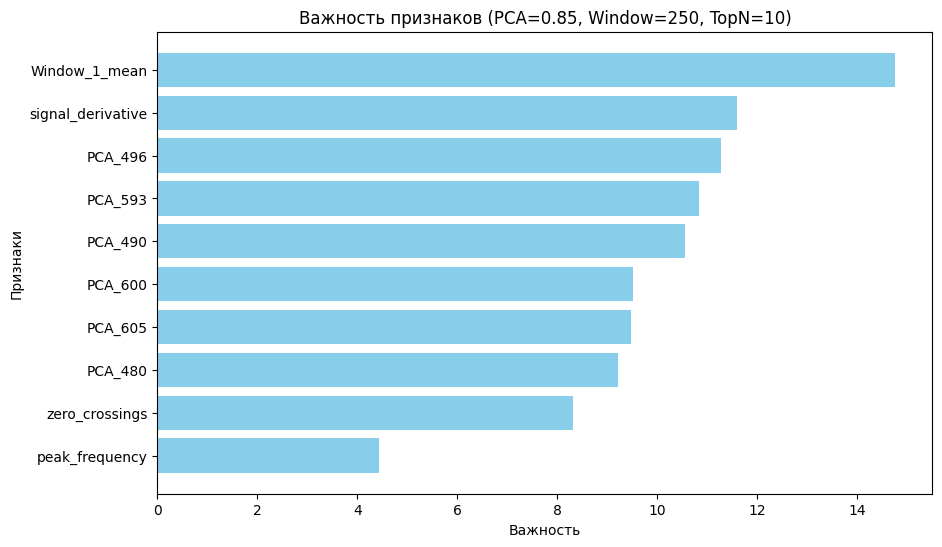

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 20
Средняя F1-score на кросс-валидации: 0.60
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


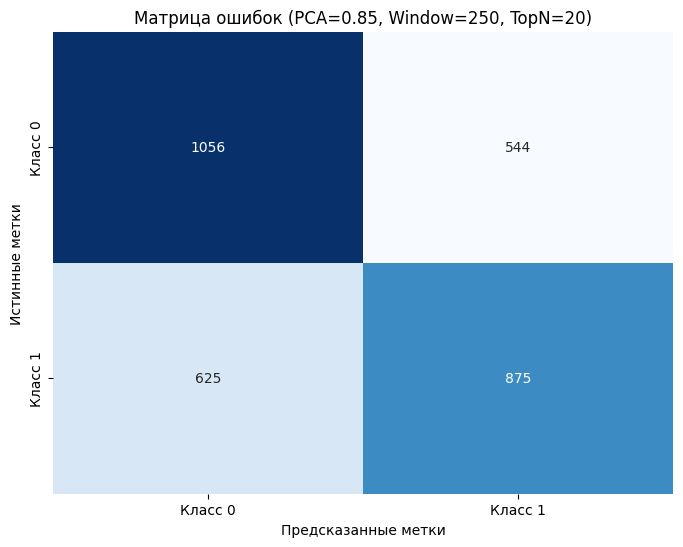

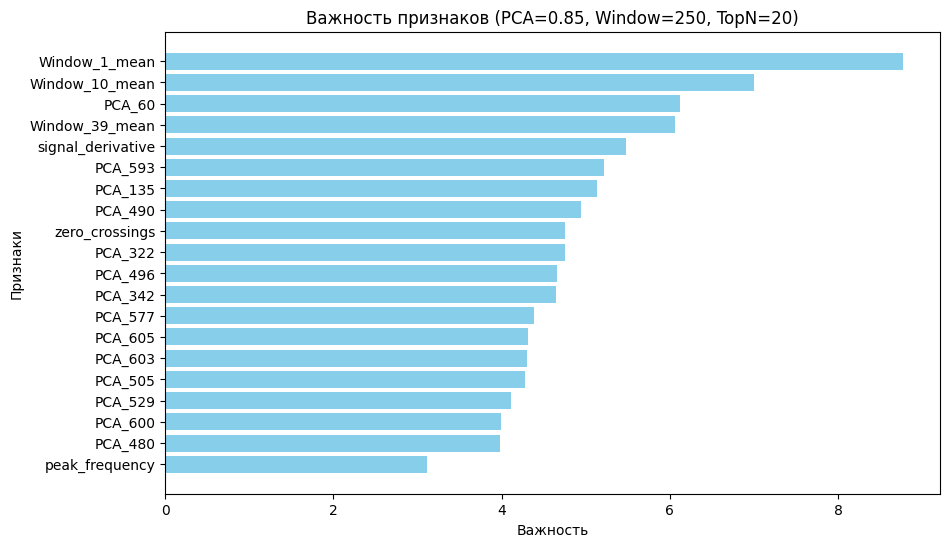

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 40
Средняя F1-score на кросс-валидации: 0.66
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


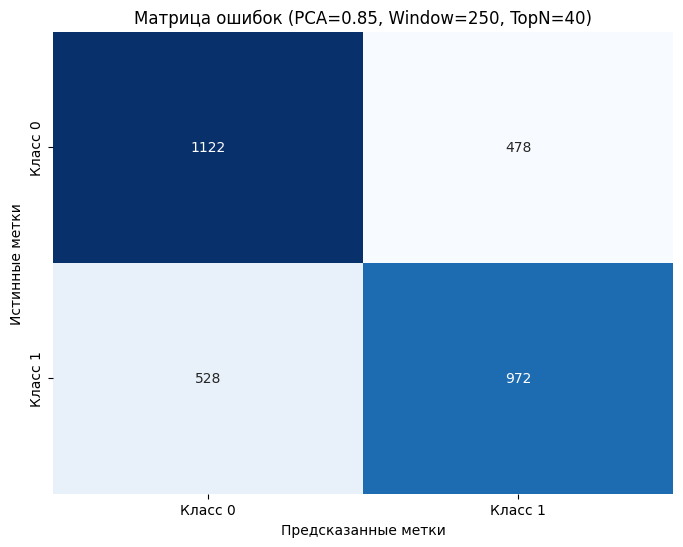

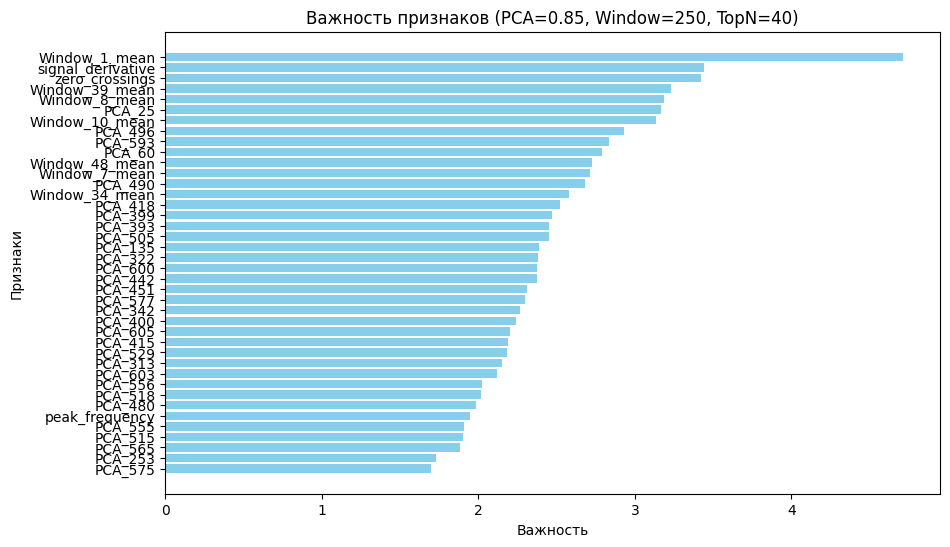

--------------------------------------------------------------------------------
Агрегация: Размер окна = 500
--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 10
Средняя F1-score на кросс-валидации: 0.56
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


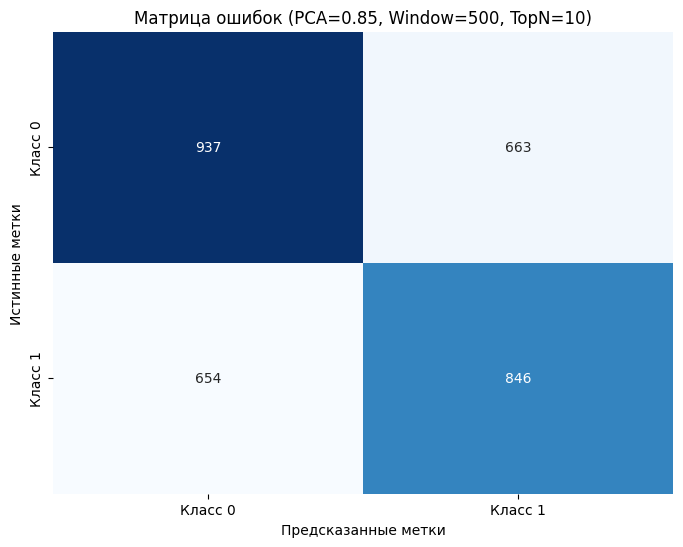

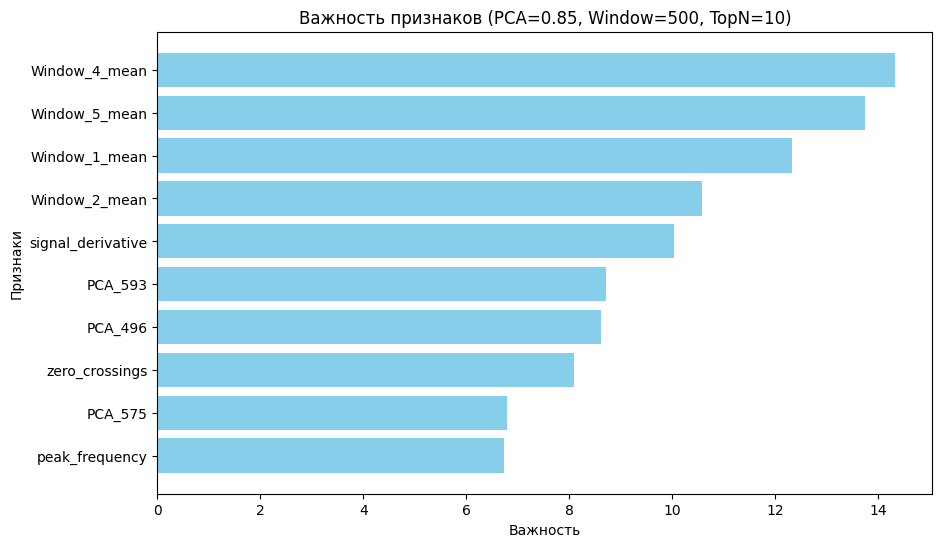

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 20
Средняя F1-score на кросс-валидации: 0.59
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


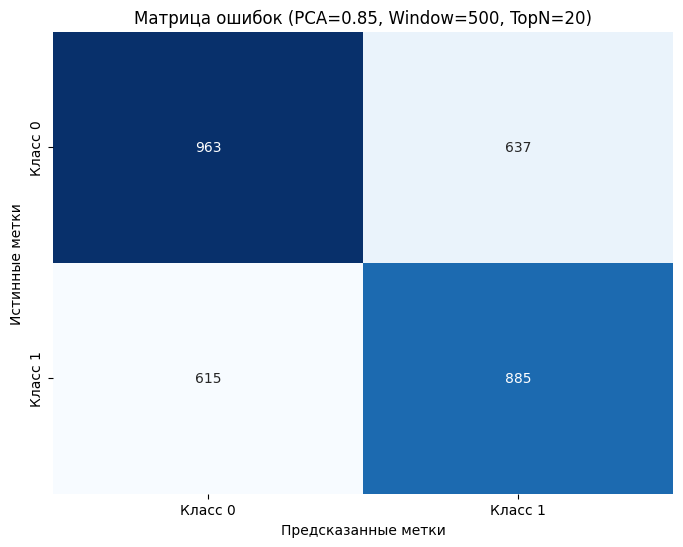

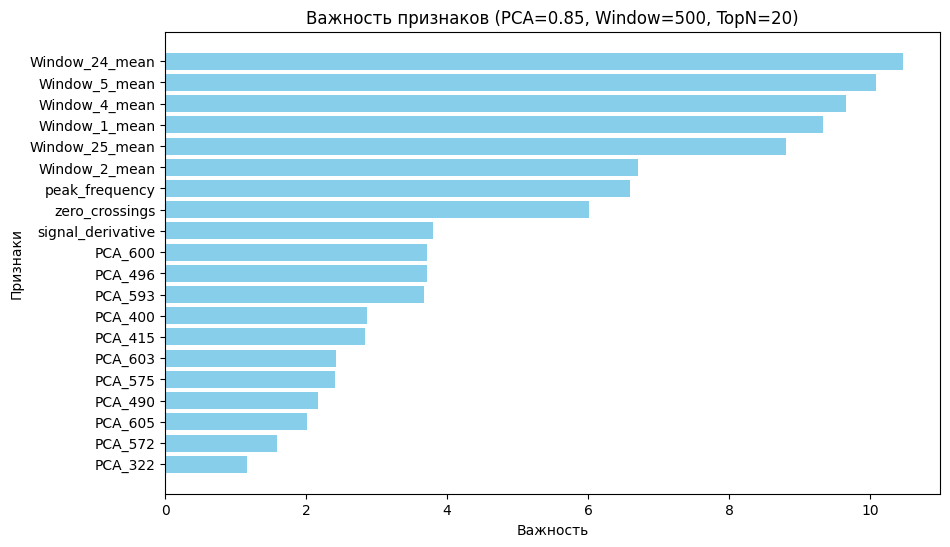

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 40
Средняя F1-score на кросс-валидации: 0.67
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


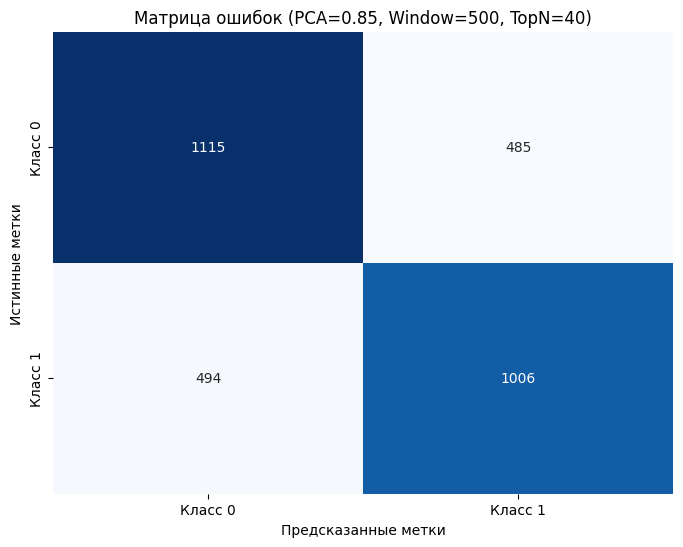

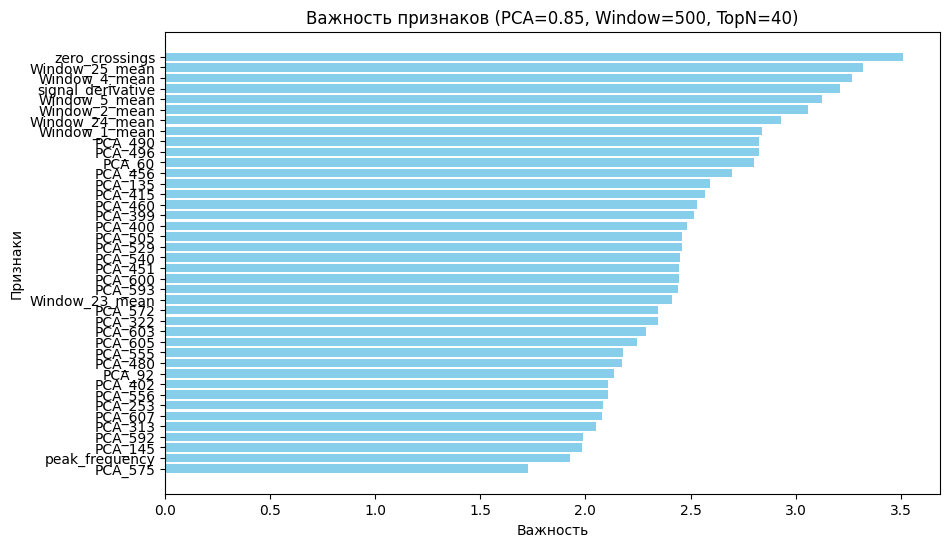

--------------------------------------------------------------------------------
Агрегация: Размер окна = 1000
--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 10
Средняя F1-score на кросс-валидации: 0.59
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


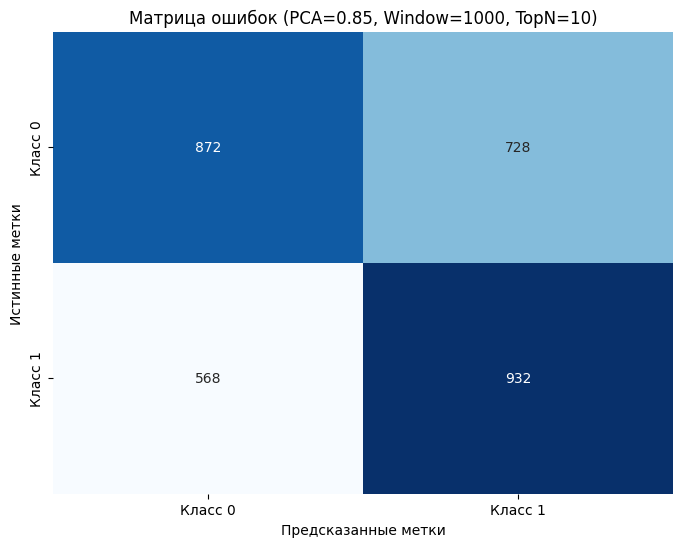

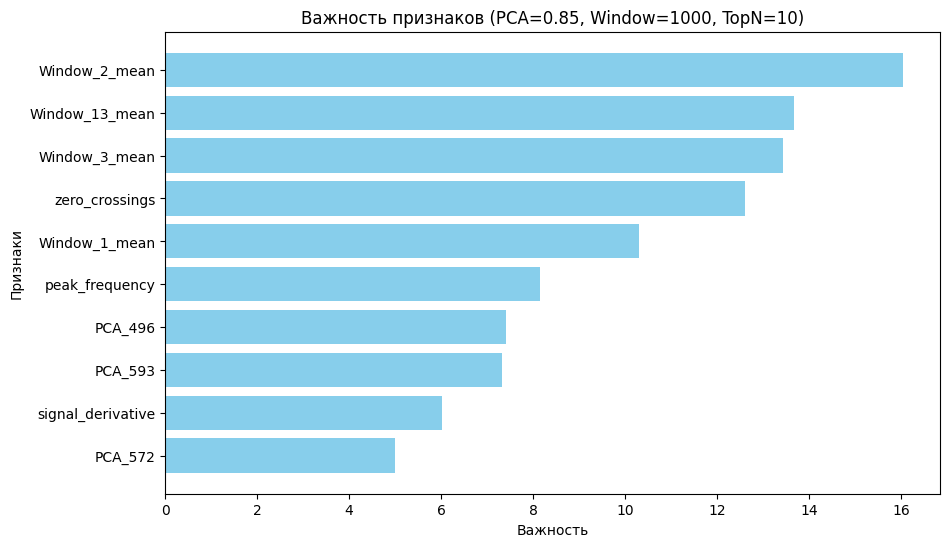

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 20
Средняя F1-score на кросс-валидации: 0.59
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


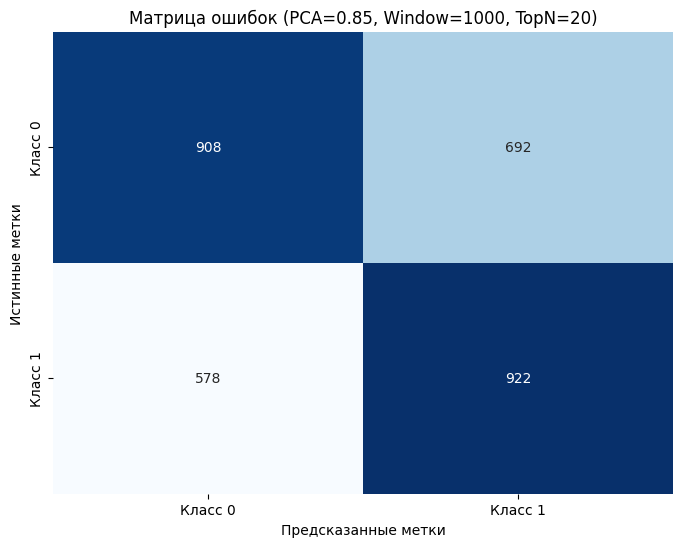

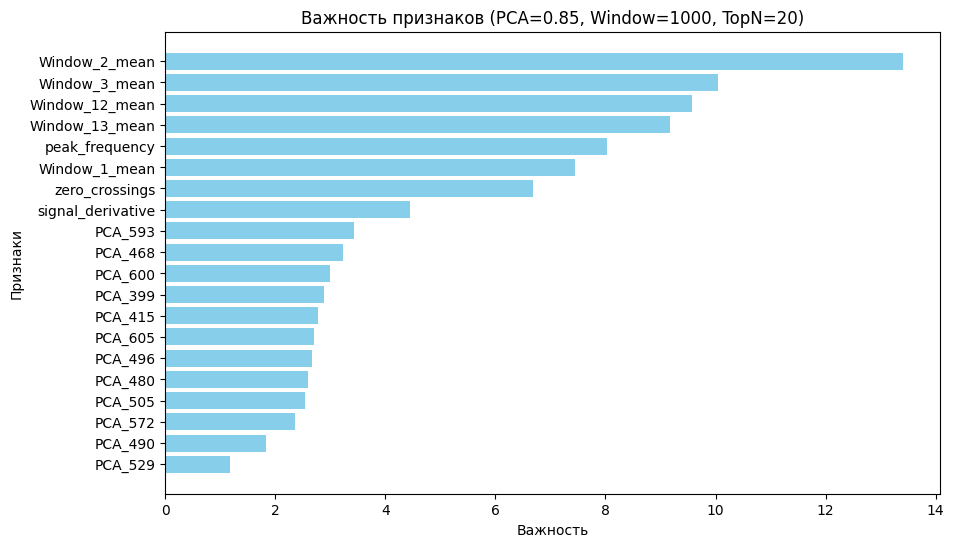

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 40
Средняя F1-score на кросс-валидации: 0.65
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


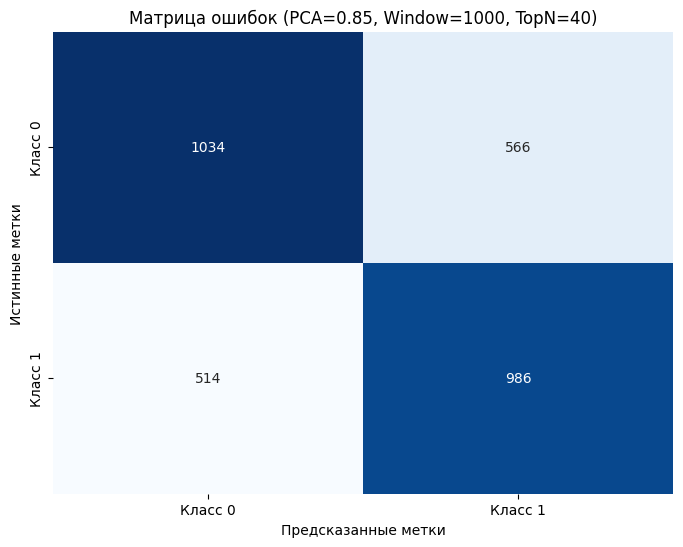

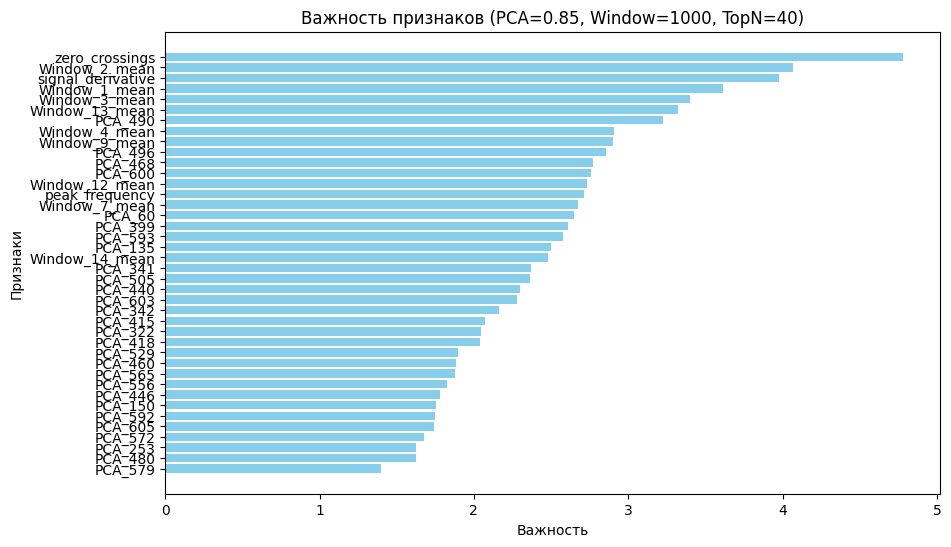

--------------------------------------------------------------------------------
PCA: Объясненная дисперсия = 0.9
--------------------------------------------------------------------------------
Агрегация: Размер окна = 250
--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 10
Средняя F1-score на кросс-валидации: 0.53
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


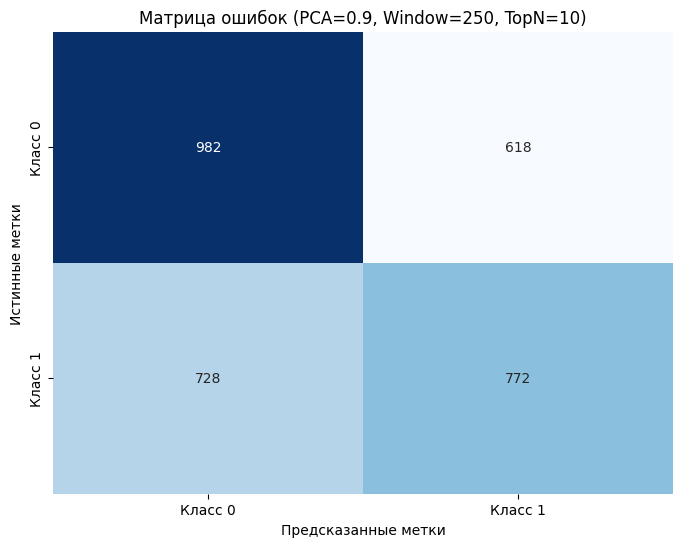

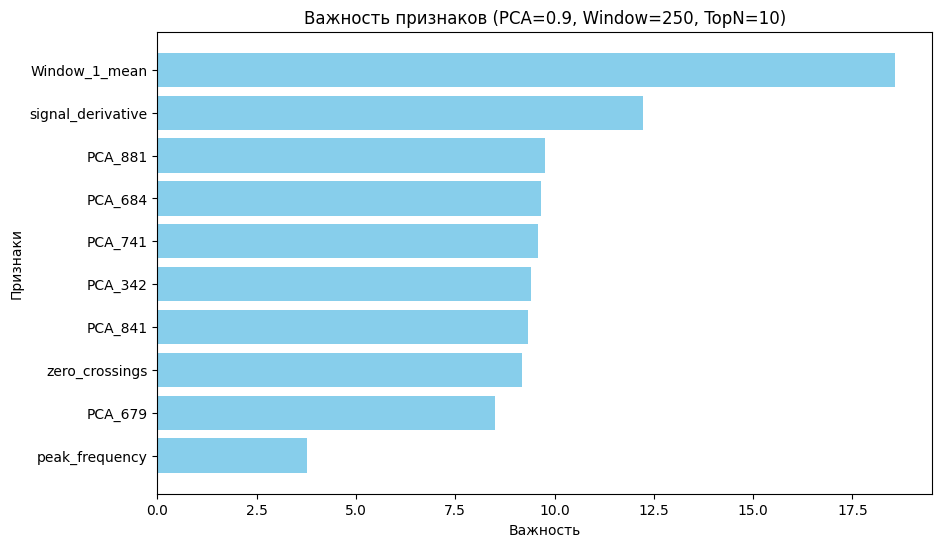

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 20
Средняя F1-score на кросс-валидации: 0.57
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


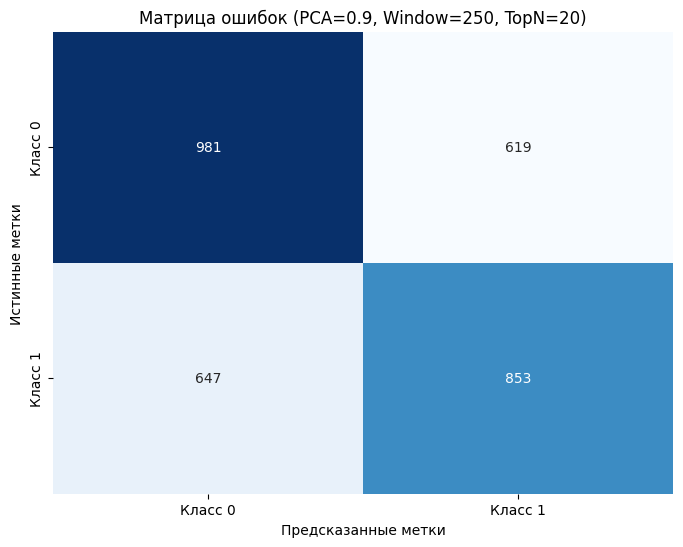

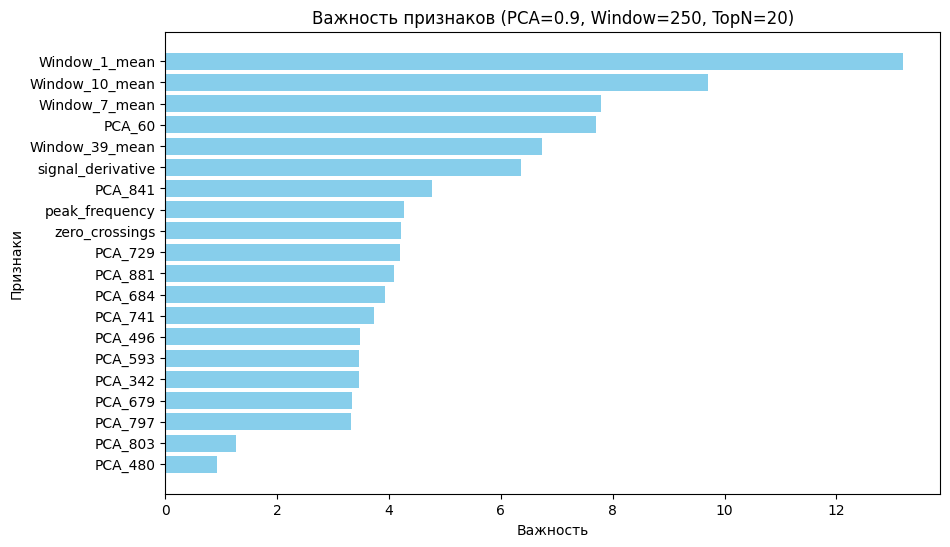

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 40
Средняя F1-score на кросс-валидации: 0.59
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


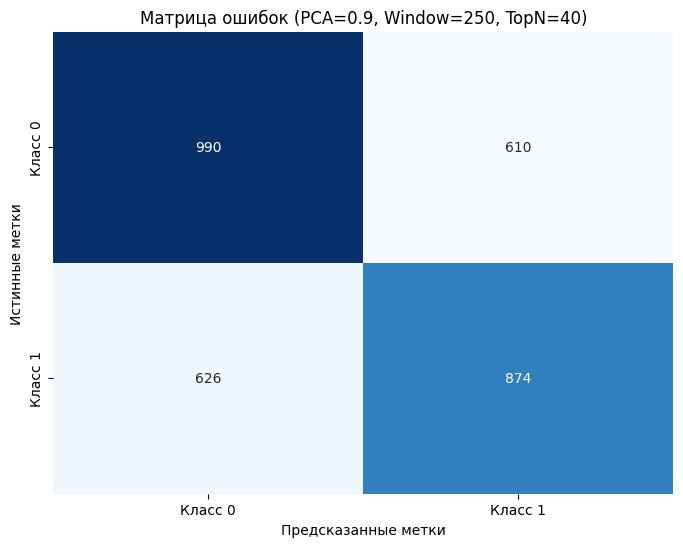

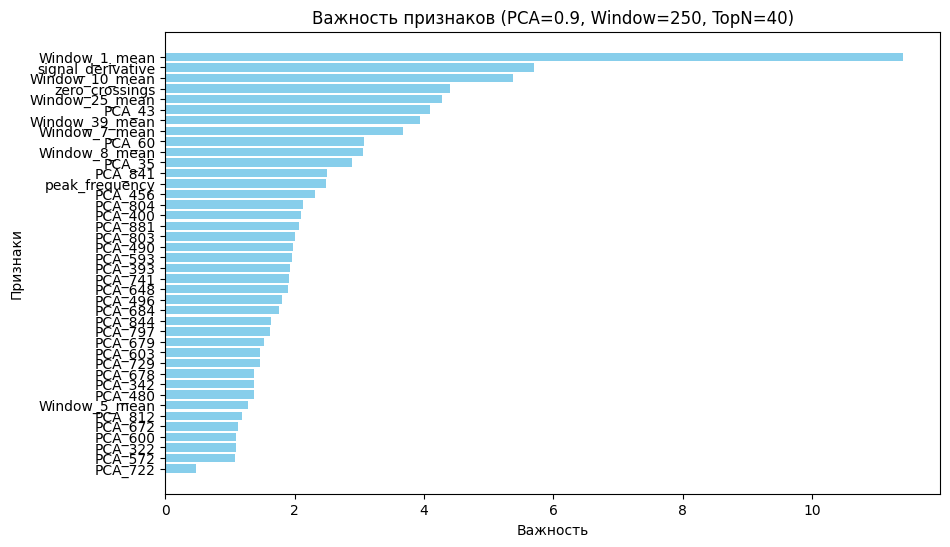

--------------------------------------------------------------------------------
Агрегация: Размер окна = 500
--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 10
Средняя F1-score на кросс-валидации: 0.58
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


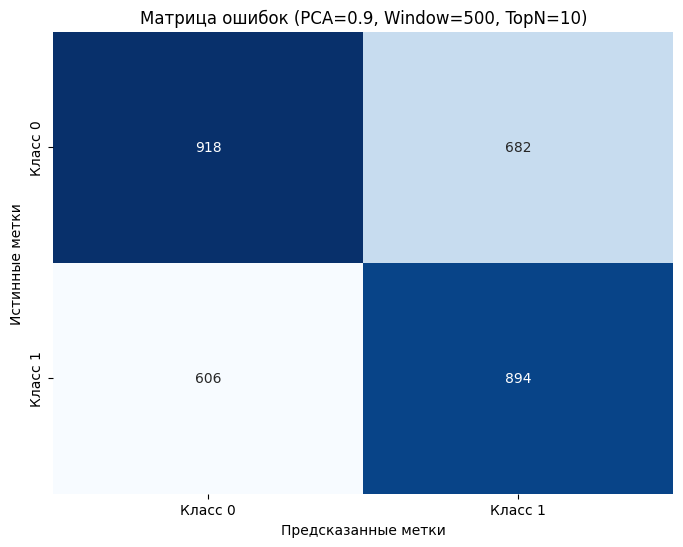

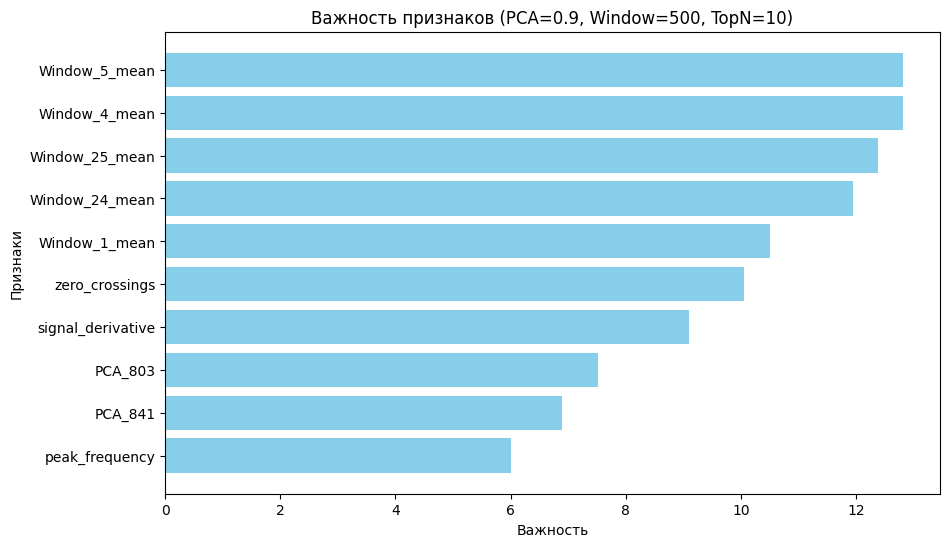

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 20
Средняя F1-score на кросс-валидации: 0.59
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


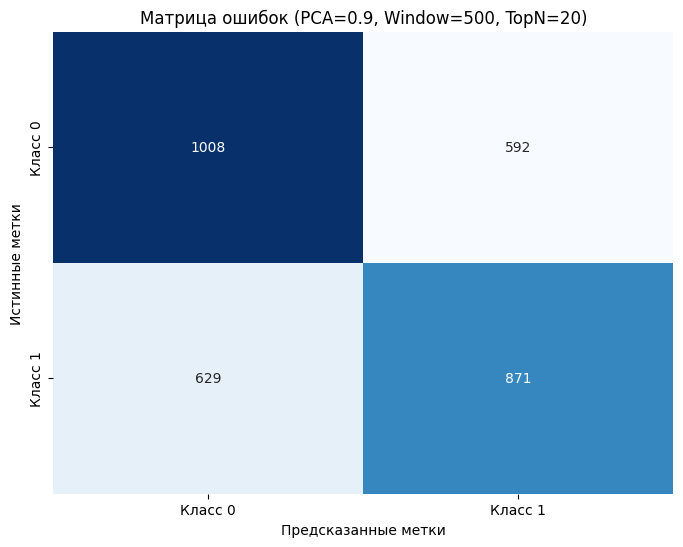

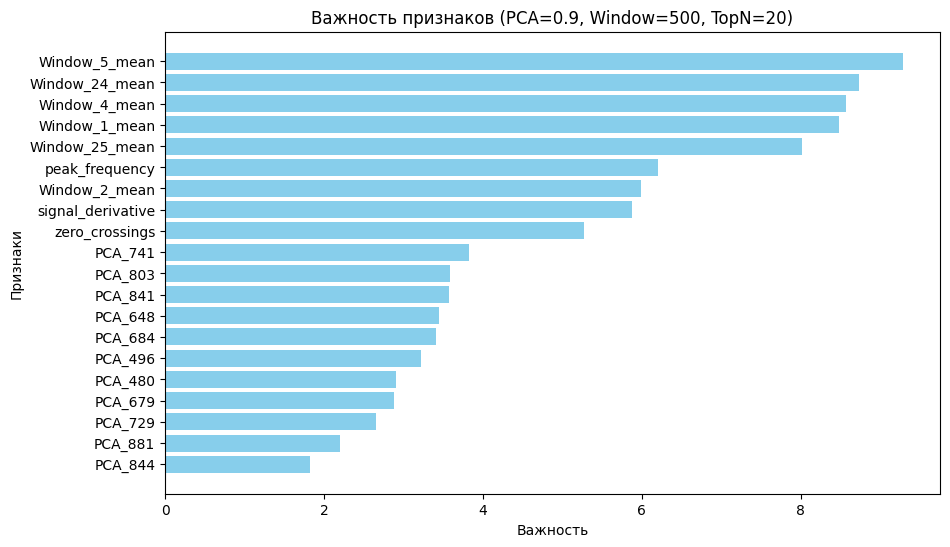

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 40
Средняя F1-score на кросс-валидации: 0.64
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


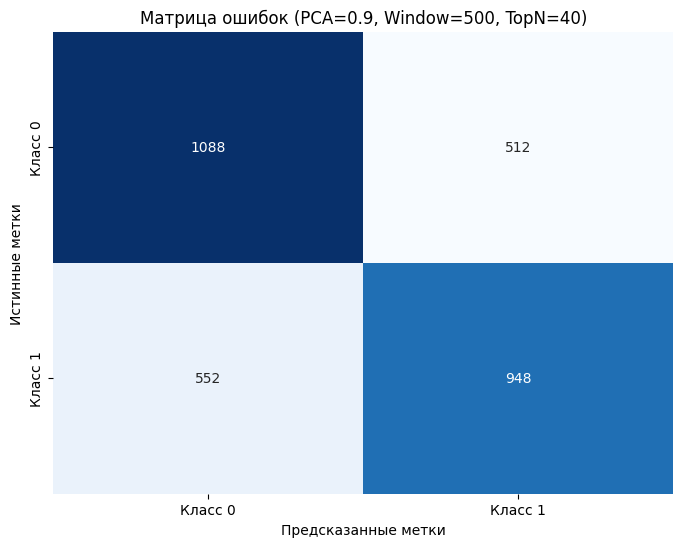

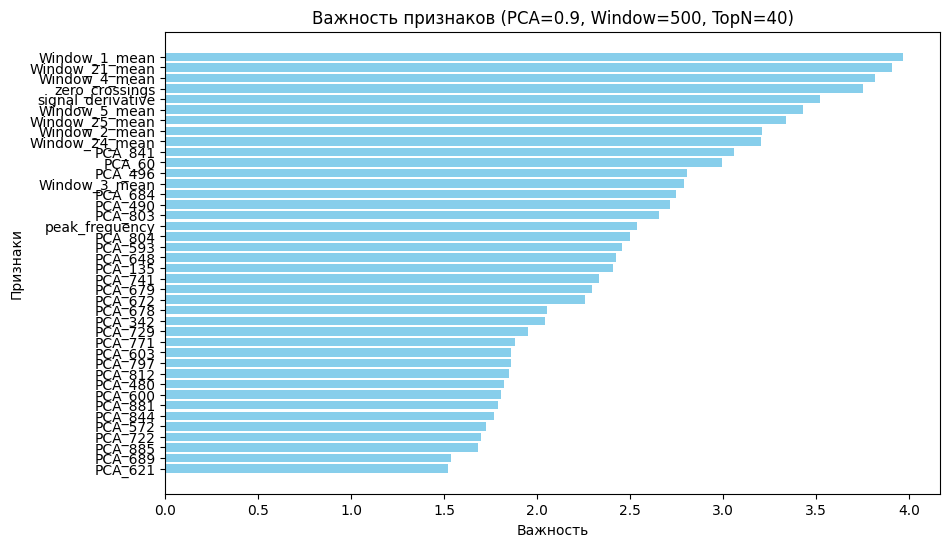

--------------------------------------------------------------------------------
Агрегация: Размер окна = 1000
--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 10
Средняя F1-score на кросс-валидации: 0.60
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


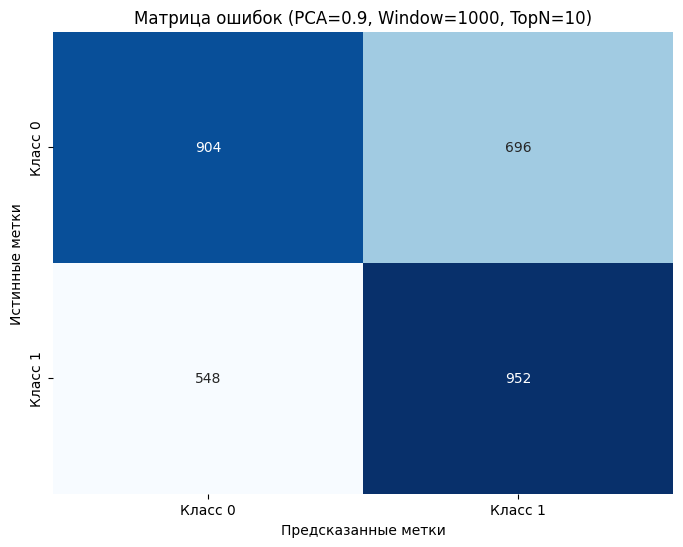

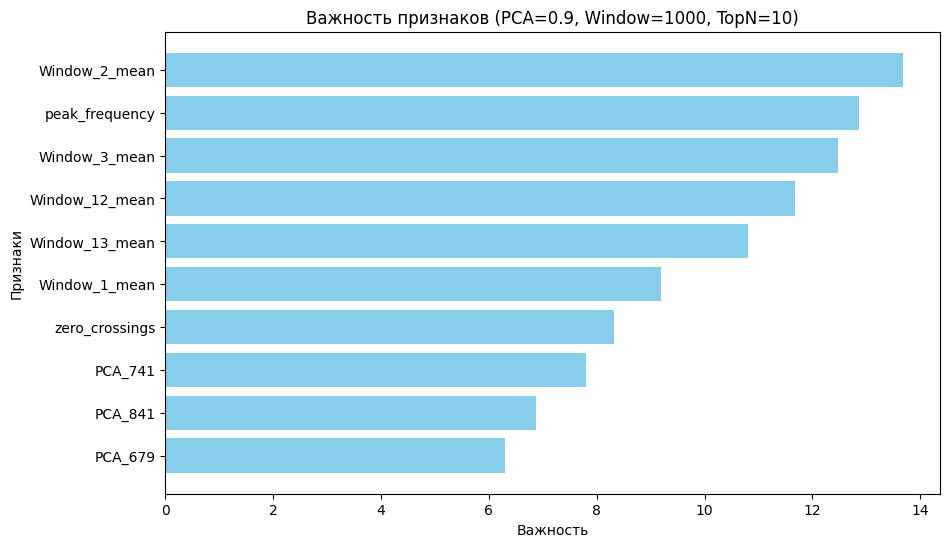

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 20
Средняя F1-score на кросс-валидации: 0.61
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


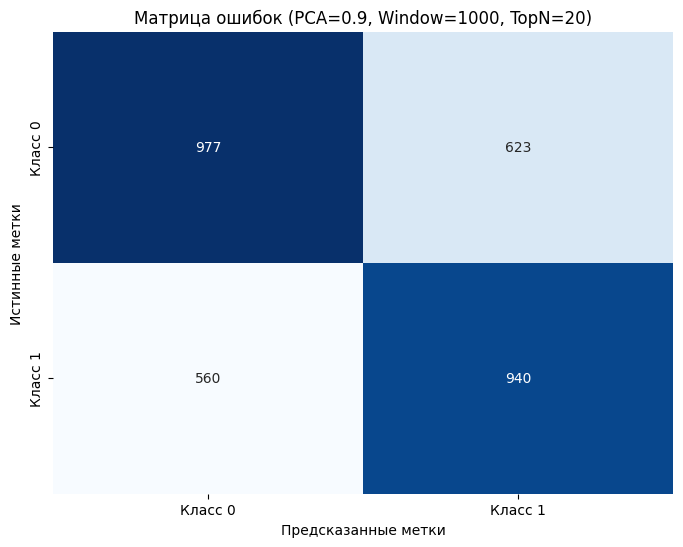

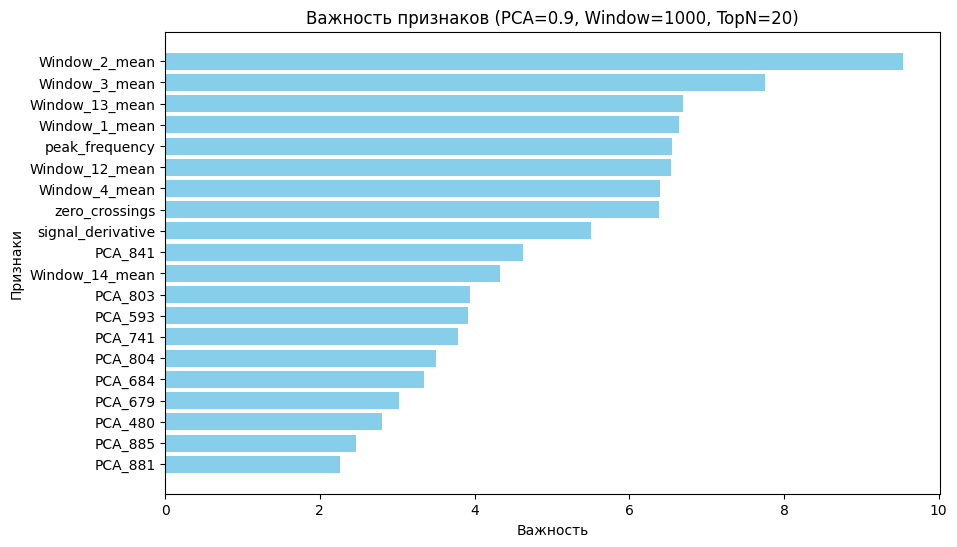

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 40
Средняя F1-score на кросс-валидации: 0.64
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


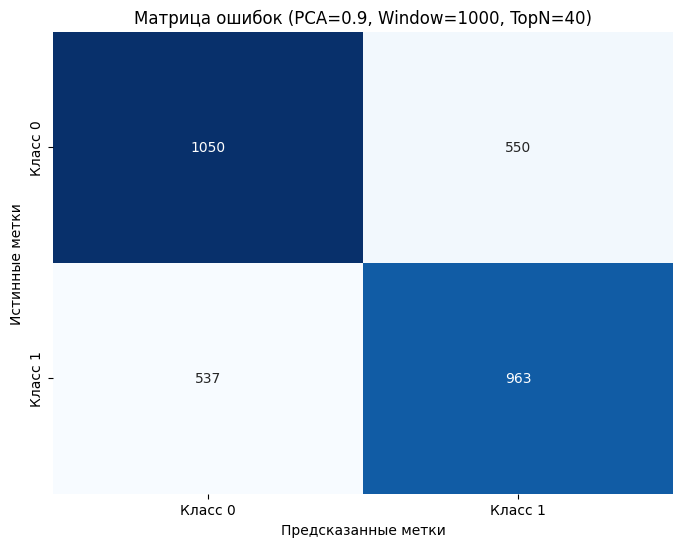

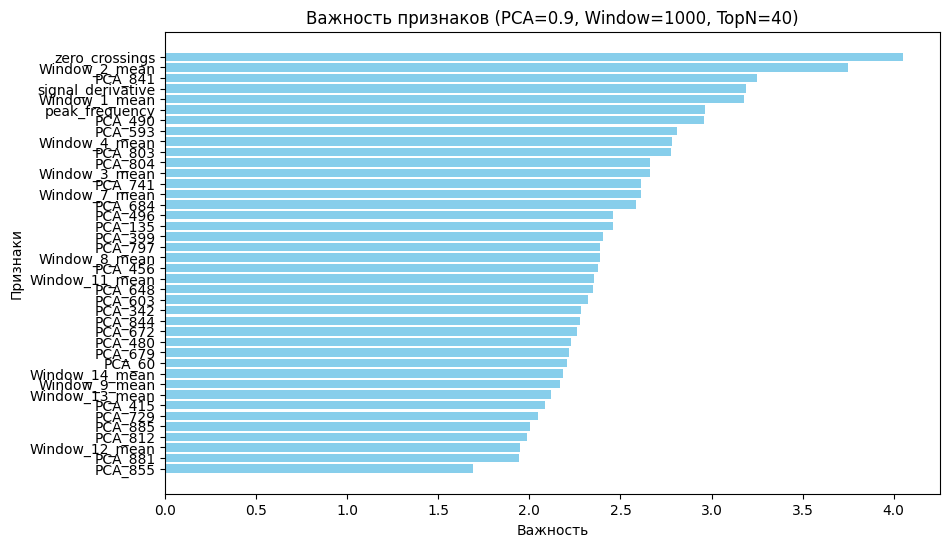

--------------------------------------------------------------------------------
PCA: Объясненная дисперсия = 0.99
--------------------------------------------------------------------------------
Агрегация: Размер окна = 250
--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 10
Средняя F1-score на кросс-валидации: 0.53
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


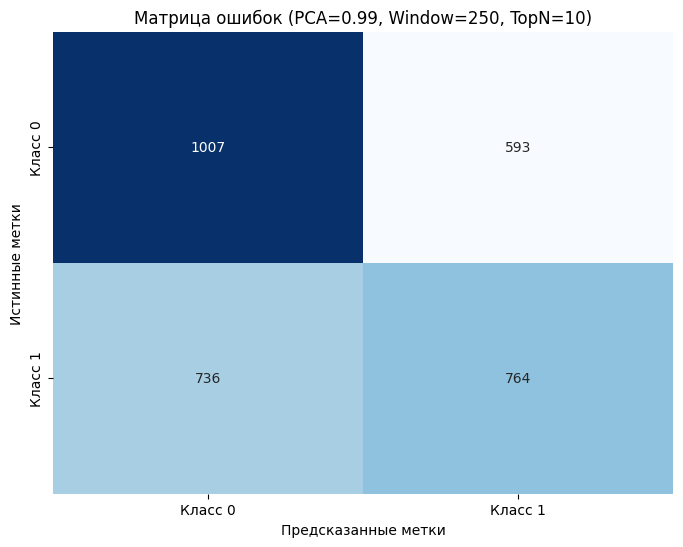

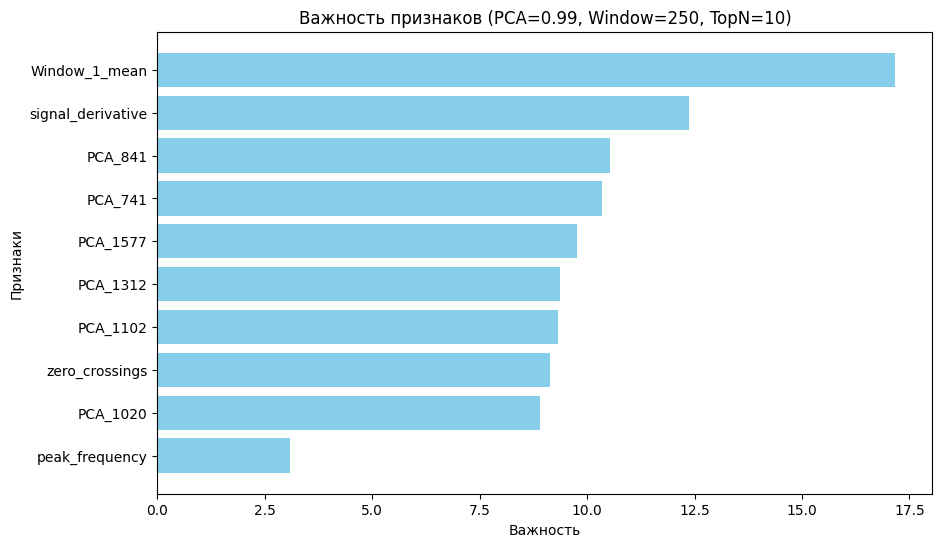

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 20
Средняя F1-score на кросс-валидации: 0.57
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


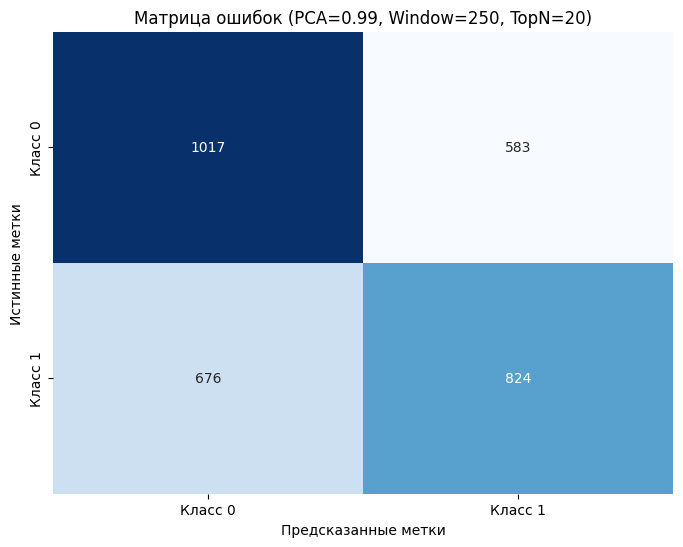

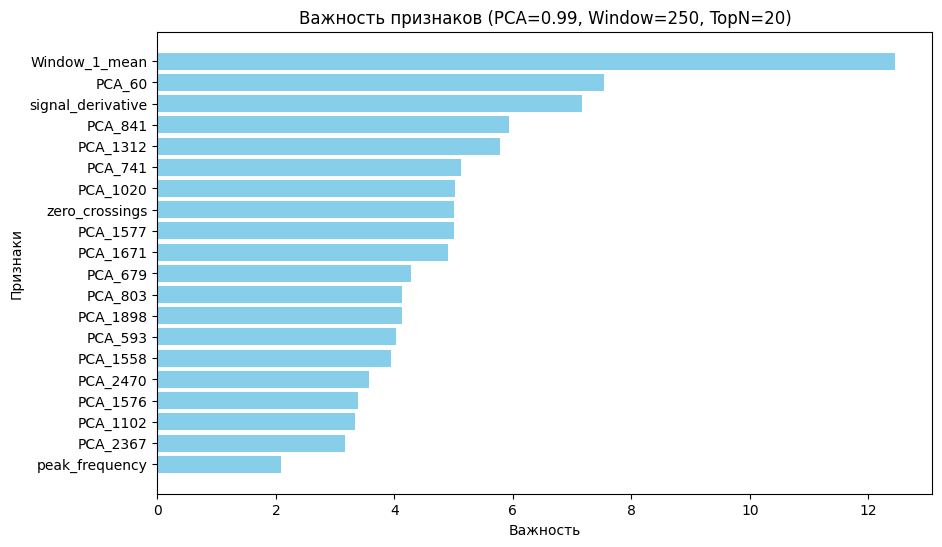

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 40
Средняя F1-score на кросс-валидации: 0.56
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


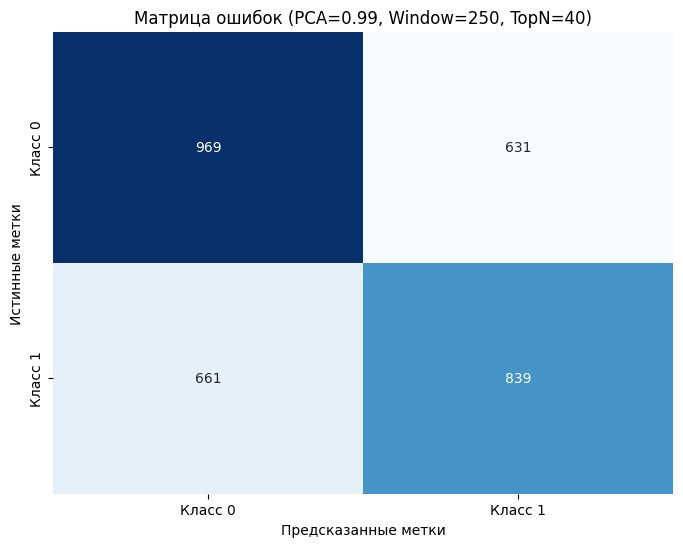

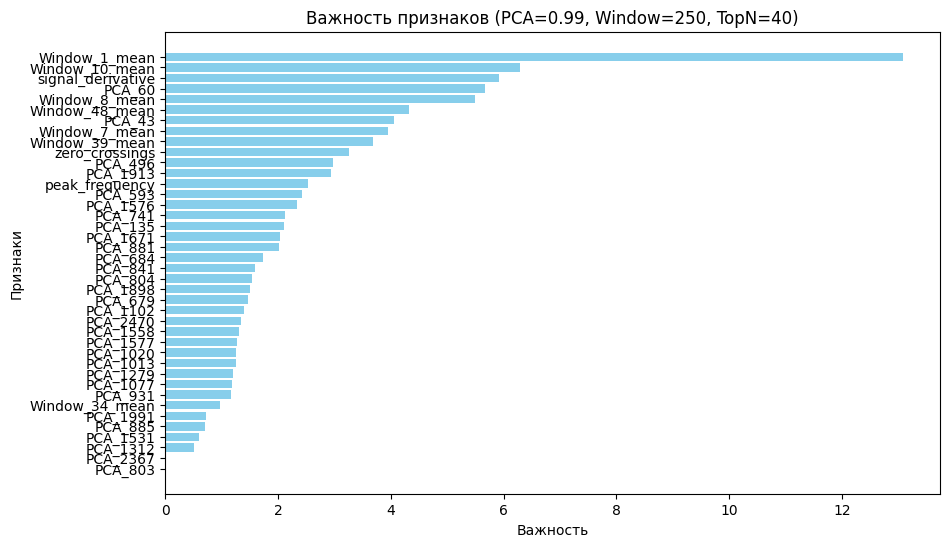

--------------------------------------------------------------------------------
Агрегация: Размер окна = 500
--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 10
Средняя F1-score на кросс-валидации: 0.57
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


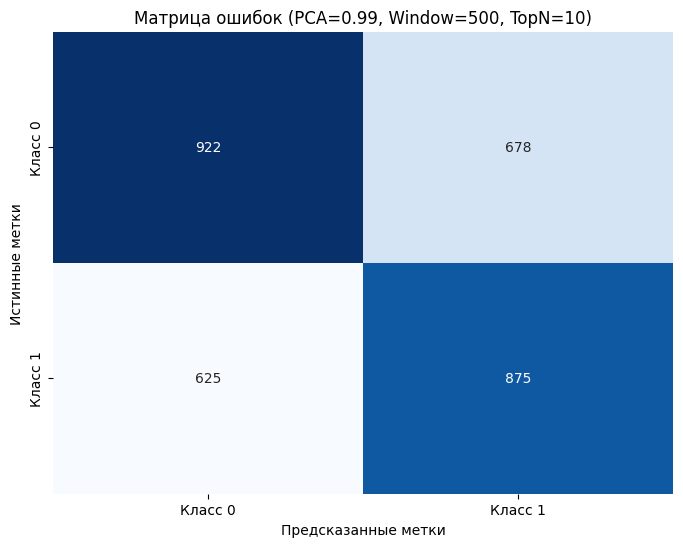

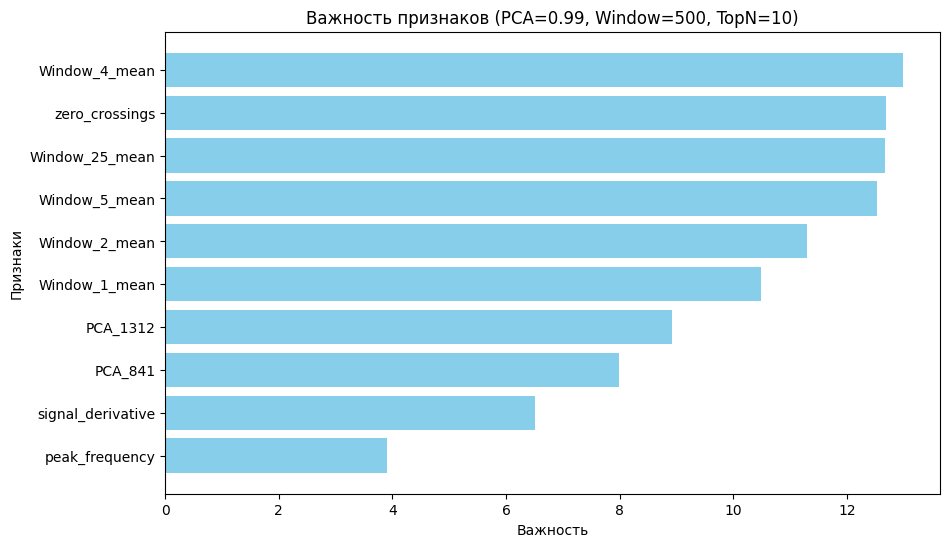

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 20
Средняя F1-score на кросс-валидации: 0.58
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


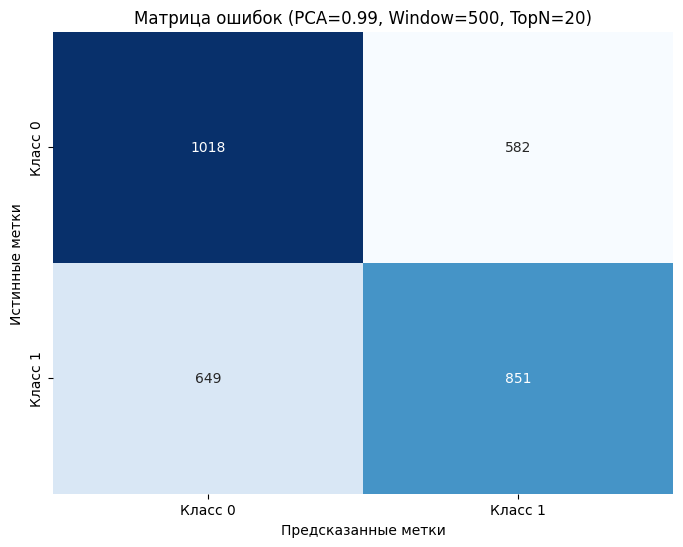

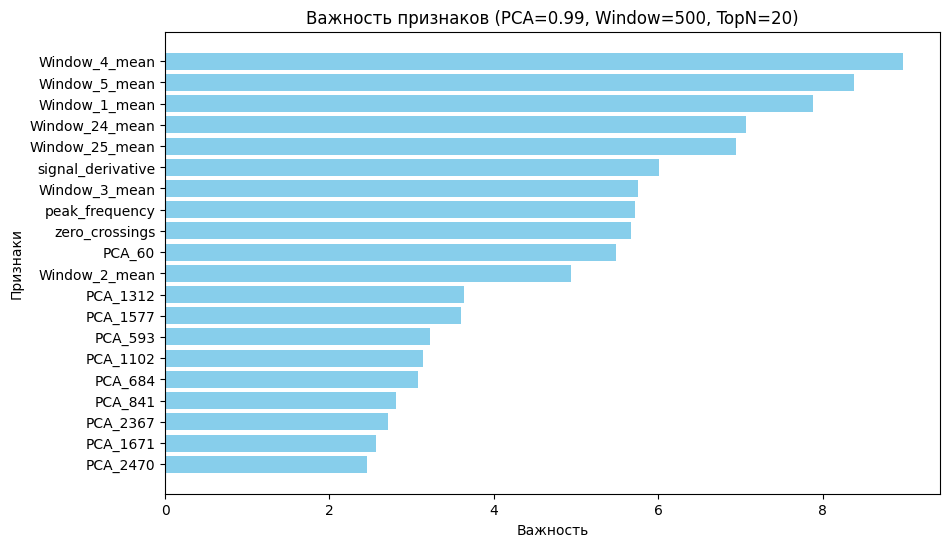

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 40
Средняя F1-score на кросс-валидации: 0.58
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


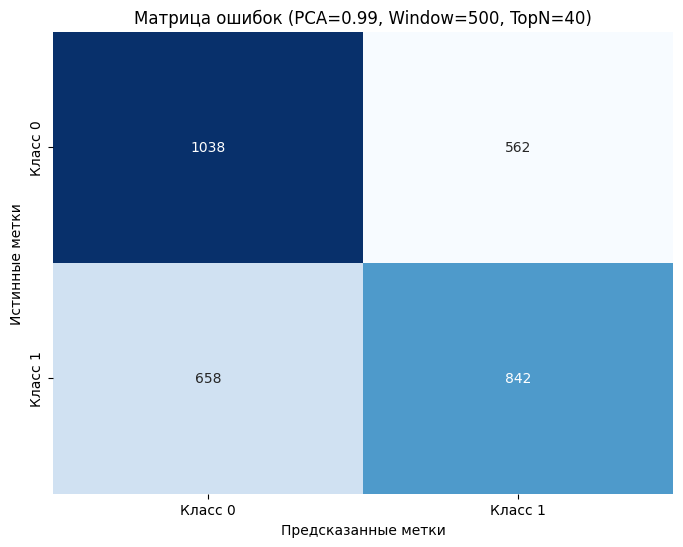

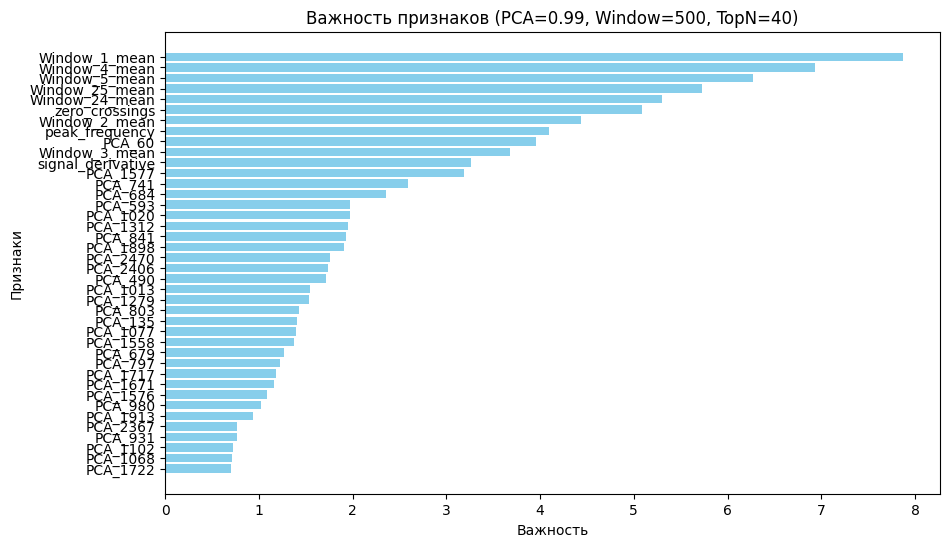

--------------------------------------------------------------------------------
Агрегация: Размер окна = 1000
--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 10
Средняя F1-score на кросс-валидации: 0.59
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


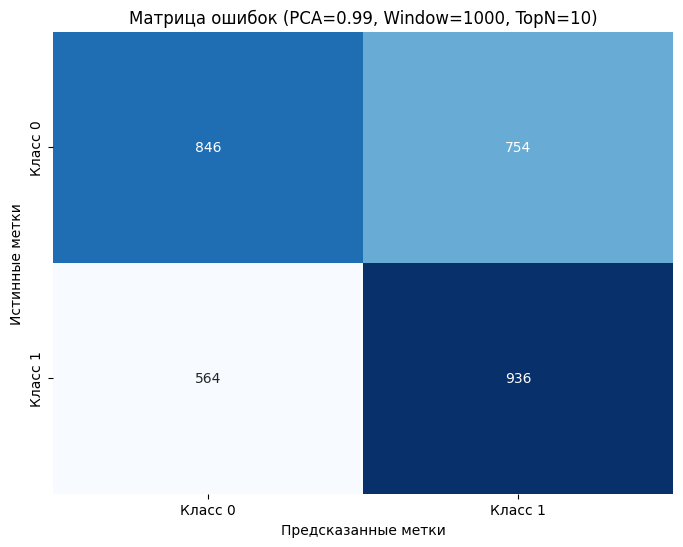

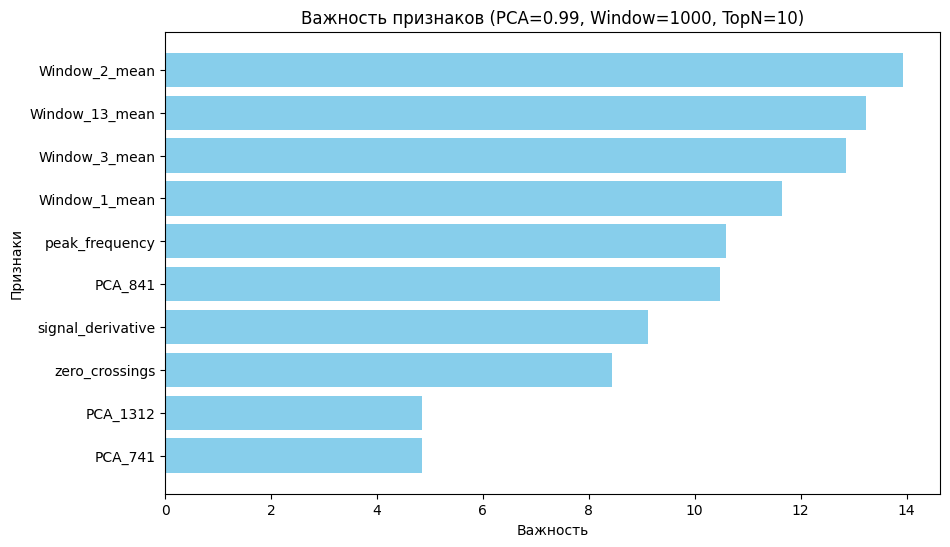

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 20
Средняя F1-score на кросс-валидации: 0.59
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


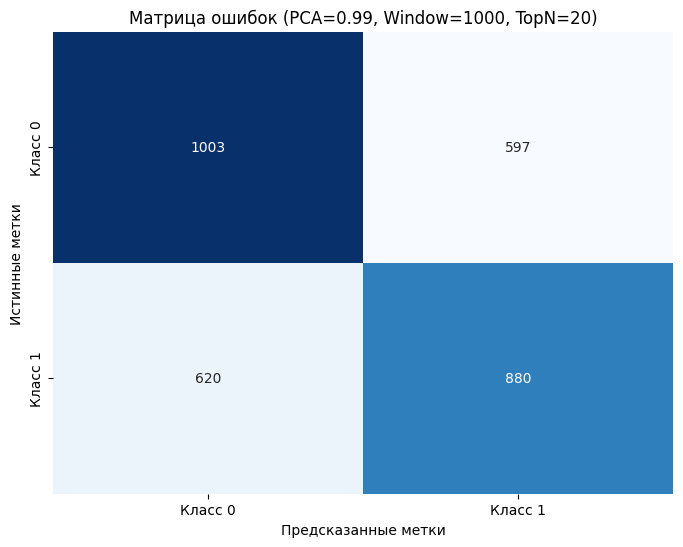

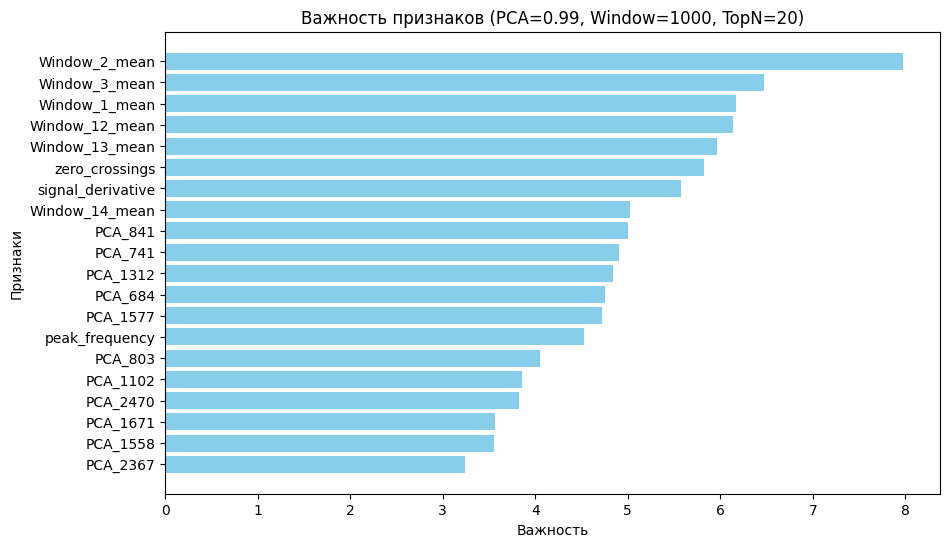

--------------------------------------------------------------------------------
Отбор признаков: Количество топ-признаков = 40
Средняя F1-score на кросс-валидации: 0.65
Результаты успешно сохранены в файл: models/classic_ml_comparison.csv


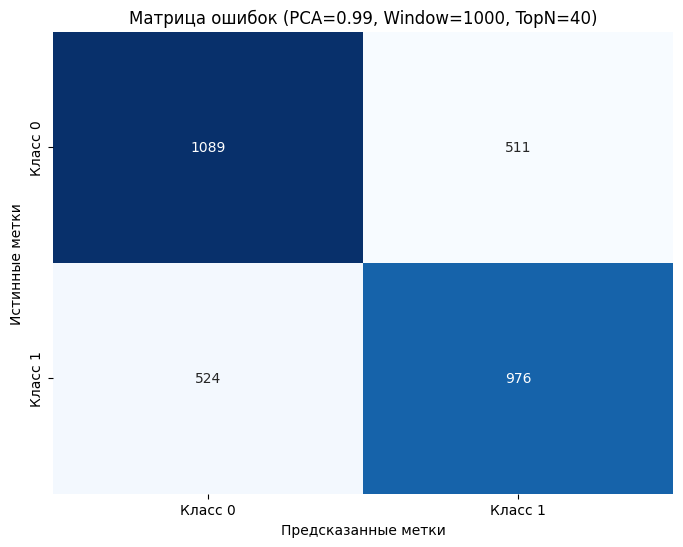

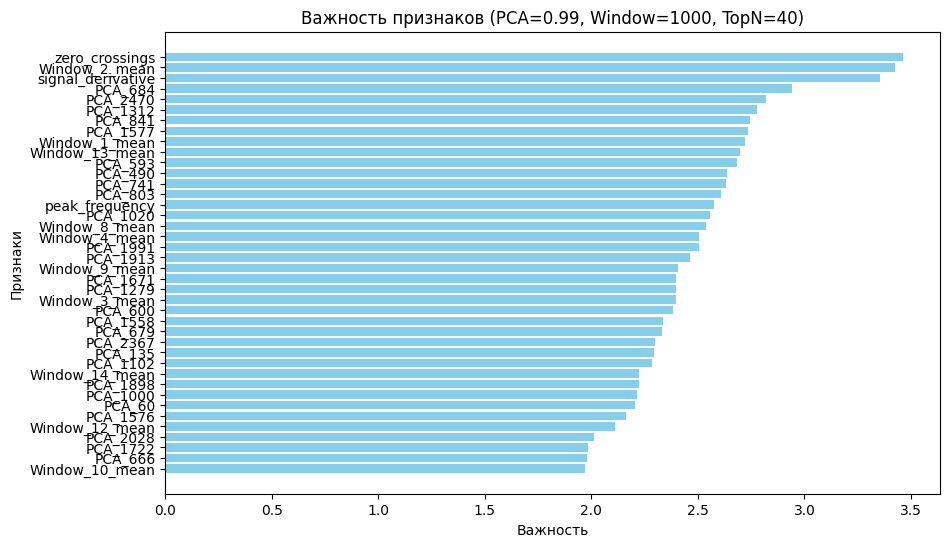

CPU times: user 6h 53min 48s, sys: 1h 4min 9s, total: 7h 57min 57s
Wall time: 1h 1min 39s


In [ ]:
%%time

# Параметры для перебора
explained_variance_ratios = [0.85, 0.9, 0.99]
window_sizes = [250, 500, 1000]
top_n_features_list = [10, 20, 40]

# Функция для агрегации сигнала по окнам
def aggregate_signal(signal, window_size):
    num_windows = len(signal) // window_size
    aggregated_features = []
    for i in range(num_windows):
        window = signal[i * window_size:(i + 1) * window_size]
        aggregated_features.extend([
            np.mean(window),       # Среднее значение
            np.std(window),        # Стандартное отклонение
            np.max(window),        # Максимум
            np.min(window),        # Минимум
            np.median(window),     # Медиана
            np.sum(np.abs(window)) # Сумма модулей
        ])
    return aggregated_features

# Функция для сохранения результатов
def save_results_to_csv(results_df, file_path="results.csv"):
    """
    Сохраняет или обновляет CSV-файл с результатами.
    Если файл существует, добавляет новую строку.
    Если файл не существует, создает новый.
    """
    try:
        # Проверяем, существует ли файл
        existing_df = pd.read_csv(file_path)
        # Добавляем новые данные к существующим
        updated_df = pd.concat([existing_df, results_df], ignore_index=True)
    except FileNotFoundError:
        # Если файл не существует, создаем новый DataFrame
        updated_df = results_df

    # Сохраняем обновленный DataFrame в CSV
    updated_df.to_csv(file_path, index=False)
    print(f"Результаты успешно сохранены в файл: {file_path}")

# Генерация статистических и частотных метрик
features = []
frequency_bands = {
    'delta': (1, 4),
    'theta': (4, 8),
    'alpha': (8, 12),
    'beta': (12, 30),
    'gamma': (30, 100)
}

for index, row in df.iterrows():
    signal = row.iloc[:15000].values.astype(float)
    signal_type = row['signal_type']

    mean_amplitude = np.mean(np.abs(signal))
    std_amplitude = np.std(np.abs(signal))
    max_amplitude = np.max(signal)
    min_amplitude = np.min(signal)
    rms_amplitude = np.sqrt(np.mean(signal**2))

    frequencies, power_spectrum = welch(signal, fs=250, nperseg=256)
    freq_min, freq_max = frequency_bands[signal_type]
    band_power = np.sum(power_spectrum[(frequencies >= freq_min) & (frequencies <= freq_max)])
    peak_frequency = frequencies[np.argmax(power_spectrum)]

    zero_crossings = np.sum(np.diff(np.sign(signal)) != 0)
    signal_derivative = np.mean(np.abs(np.diff(signal)))

    features.append([
        mean_amplitude, std_amplitude, max_amplitude, min_amplitude, rms_amplitude,
        peak_frequency, band_power, zero_crossings, signal_derivative
    ])

feature_columns = [
    "mean_amplitude", "std_amplitude_mav", "max_amplitude", "min_amplitude", "rms_amplitude",
    "peak_frequency", "band_power", "zero_crossings", "signal_derivative"
]
features_df = pd.DataFrame(features, columns=feature_columns)
df = pd.concat([df, features_df], axis=1)

df['target'] = df['binary_channel']
# Удаляем ненужные столбцы
df = df.drop(columns=['signal_type', 'channel', 'channel_name', 'dataset', 'participant', 'binary_channel', 'intensity'])

# Перебор параметров
results = []
for explained_variance_ratio in explained_variance_ratios:
    print("-" * 80)
    print(f"PCA: Объясненная дисперсия = {explained_variance_ratio}")
    X_signal = df.iloc[:, :15000]
    pca = PCA()
    X_pca = pca.fit_transform(X_signal)
    cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)
    optimal_components = np.argmax(cumulative_explained_variance >= explained_variance_ratio) + 1
    X_pca_reduced = X_pca[:, :optimal_components]
    pca_columns = [f"PCA_{i+1}" for i in range(optimal_components)]
    df_pca = pd.DataFrame(X_pca_reduced, columns=pca_columns)
    df_with_pca = pd.concat([df, df_pca], axis=1)

    for window_size in window_sizes:
        print("-" * 80)
        print(f"Агрегация: Размер окна = {window_size}")
        aggregated_data = np.array([aggregate_signal(row[:15000], window_size) for _, row in df.iterrows()])
        num_windows = 15000 // window_size
        aggregation_columns = [
            f"Window_{i+1}_{metric}" for i in range(num_windows) for metric in ["mean", "std", "max", "min", "median", "sum_abs"]
        ]
        df_aggregated = pd.DataFrame(aggregated_data, columns=aggregation_columns)
        df_final = pd.concat([df_with_pca, df_aggregated], axis=1)

        # Feature selection с помощью CatBoost
        X = df_final.iloc[:, 15000:].drop(columns=['target'])
        y = df['target']
        model_selection = CatBoostClassifier(random_state=42, verbose=0)
        model_selection.fit(X, y)
        feature_importances = pd.Series(model_selection.get_feature_importance(), index=X.columns).sort_values(ascending=False)

        for top_n_features in top_n_features_list:
            print("-" * 80)
            print(f"Отбор признаков: Количество топ-признаков = {top_n_features}")
            top_features = feature_importances.index[:top_n_features]
            X_selected = df_final[top_features]
            X_selected_with_participant = pd.concat([X_selected, df_raw['participant']], axis=1)

            # Кросс-валидация
            cv_scores = []
            for train_data, val_data, test_data in participant_based_cross_validation_with_validation_fold(
                pd.concat([X_selected_with_participant, y], axis=1)
            ):
                X_train, y_train = train_data.iloc[:, :-2], train_data.iloc[:, -1]
                X_val, y_val = val_data.iloc[:, :-2], val_data.iloc[:, -1]
                X_test, y_test = test_data.iloc[:, :-2], test_data.iloc[:, -1]

                train_pool = Pool(X_train, label=y_train)
                val_pool = Pool(X_val, label=y_val)

                model = CatBoostClassifier(
                    loss_function='Logloss',
                    eval_metric='F1',
                    random_seed=42,
                    learning_rate=0.01,
                    l2_leaf_reg=3,
                    iterations=1000,
                    depth=10,
                    bagging_temperature=0.5,
                    verbose=0
                )
                model.fit(train_pool, eval_set=val_pool, early_stopping_rounds=50)

                y_pred = model.predict(X_test)
                f1 = f1_score(y_test, y_pred)
                cv_scores.append(f1)

            mean_f1_cv = np.mean(cv_scores)
            print(f"Средняя F1-score на кросс-валидации: {mean_f1_cv:.2f}")

            # Сохранение результатов
            new_result = pd.DataFrame({
                "feature_selection_configuration": ["Feature importance catboost"],
                "model": ["CatBoost"],
                "explained_variance_ratio_PCA": [explained_variance_ratio],
                "window_size": [window_size],
                "top_n_features": [top_n_features],
                "f1_score_value": [round(mean_f1_cv, 2)]
            })
            save_results_to_csv(new_result, file_path="models/classic_ml_comparison.csv")

            # Визуализация
            cm = confusion_matrix(y_test, y_pred)
            plt.figure(figsize=(8, 6))
            sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                        xticklabels=["Класс 0", "Класс 1"],
                        yticklabels=["Класс 0", "Класс 1"])
            plt.title(f"Матрица ошибок (PCA={explained_variance_ratio}, Window={window_size}, TopN={top_n_features})")
            plt.xlabel("Предсказанные метки")
            plt.ylabel("Истинные метки")
            plt.show()

            feature_importance = model.get_feature_importance(prettified=True)[:40]
            plt.figure(figsize=(10, 6))
            plt.barh(feature_importance['Feature Id'], feature_importance['Importances'], color='skyblue')
            plt.gca().invert_yaxis()
            plt.title(f"Важность признаков (PCA={explained_variance_ratio}, Window={window_size}, TopN={top_n_features})")
            plt.xlabel("Важность")
            plt.ylabel("Признаки")
            plt.show()

# Снижение размерности

## 1. Встроенные методы Feature selection

### Lasso-регрессия

**Feature importance**

Топ-20 наиболее значимых признаков:
mean_amplitude   -0.0
PCA_531          -0.0
PCA_521           0.0
PCA_522          -0.0
PCA_523           0.0
PCA_524           0.0
PCA_525          -0.0
PCA_526          -0.0
PCA_527           0.0
PCA_528           0.0
PCA_529           0.0
PCA_530          -0.0
PCA_532          -0.0
PCA_594           0.0
PCA_533          -0.0
PCA_534          -0.0
PCA_535          -0.0
PCA_536          -0.0
PCA_537           0.0
PCA_538          -0.0
dtype: float64


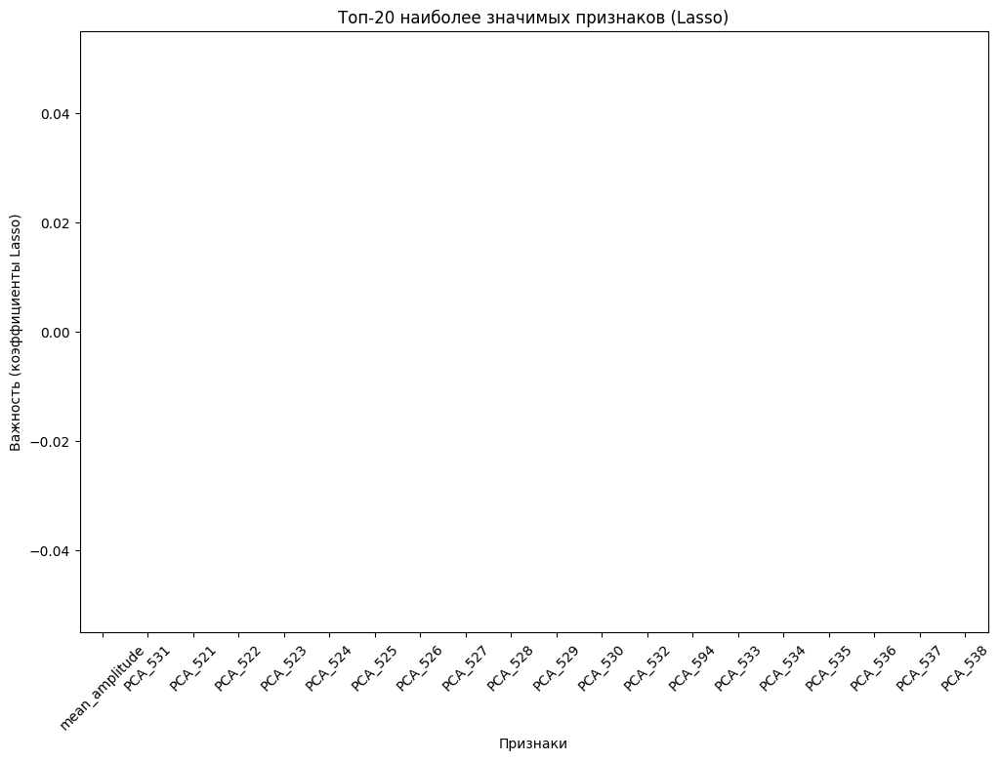

Количество удаленных признаков (коэффициенты равны нулю): 803
CPU times: user 35.6 s, sys: 31.2 s, total: 1min 6s
Wall time: 6.26 s


In [ ]:
%%time
# Обучаем модель Lasso с кросс-валидацией
lasso = LassoCV(cv=5, random_state=42)
lasso.fit(X, y)

# Получаем коэффициенты признаков
feature_importances_lasso = pd.Series(lasso.coef_, index=X.columns).sort_values(ascending=False)

# Выводим топ-20 наиболее значимых признаков (по модулю коэффициентов)
print("Топ-20 наиболее значимых признаков:")
print(feature_importances_lasso.head(20))

# Визуализация важности признаков
plt.figure(figsize=(12, 8))
feature_importances_lasso.head(20).plot(kind='bar', color='skyblue')
plt.title("Топ-20 наиболее значимых признаков (Lasso)")
plt.xlabel("Признаки")
plt.ylabel("Важность (коэффициенты Lasso)")
plt.xticks(rotation=45)
plt.show()

# Подсчет удаленных признаков (коэффициенты равны нулю)
zero_coef_count = np.sum(lasso.coef_ == 0)
print(f"Количество удаленных признаков (коэффициенты равны нулю): {zero_coef_count}")

**Feature stability**

Стабильность признаков:
     Feature  Mean Importance  Std Importance
605  PCA_597         0.000163    1.091726e-05
452  PCA_444         0.000107    7.962283e-07
434  PCA_426         0.000094    2.101548e-05
464  PCA_456         0.000093    1.397057e-05
560  PCA_552         0.000083    1.837721e-05
423  PCA_415         0.000077    2.010803e-05
473  PCA_465         0.000075    1.820182e-05
451  PCA_443         0.000073    1.598420e-05
492  PCA_484         0.000073    1.388991e-05
218  PCA_210         0.000072    7.909596e-06
332  PCA_324         0.000072    8.737718e-06
577  PCA_569         0.000065    1.176045e-05
570  PCA_562         0.000064    1.768476e-05
478  PCA_470         0.000064    2.240657e-05
429  PCA_421         0.000058    1.264350e-05
349  PCA_341         0.000055    3.561736e-07
587  PCA_579         0.000051    2.195648e-05
61    PCA_53         0.000049    3.972683e-06
447  PCA_439         0.000046    1.006142e-05
94    PCA_86         0.000045    6.278981e-06


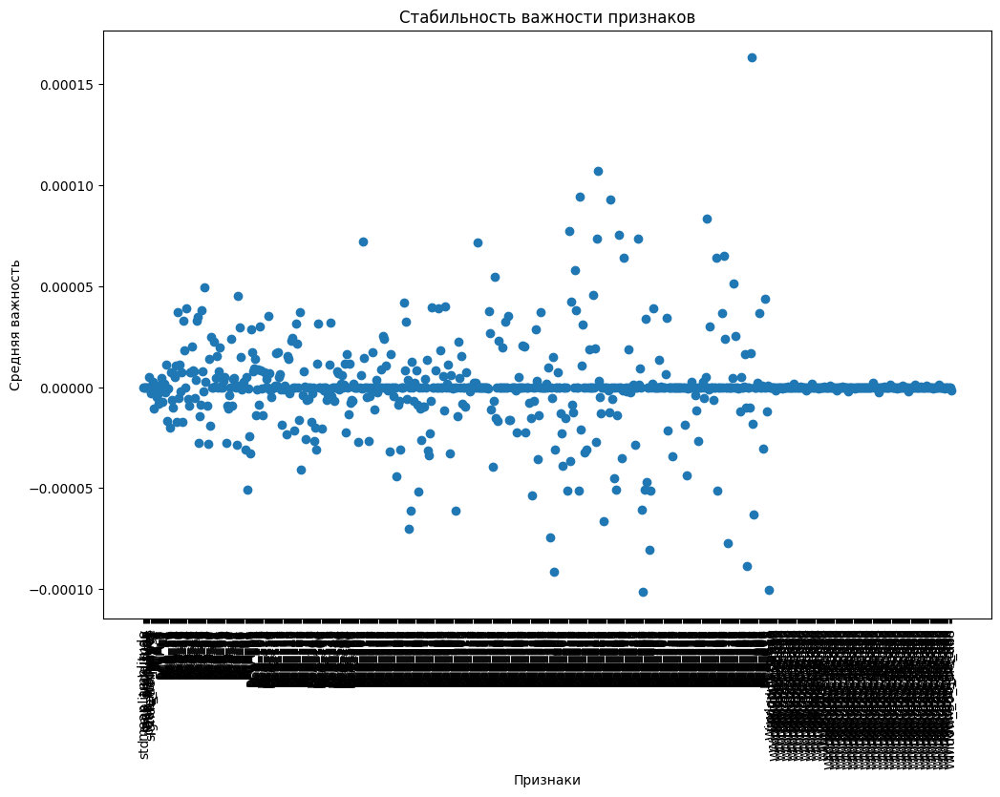

CPU times: user 3min 39s, sys: 3min 38s, total: 7min 17s
Wall time: 39.7 s


In [ ]:
%%time
# Выбираем все признаки, кроме первых 15000 столбцов и целевой переменной
X = df.iloc[:, 15000:]  # Все признаки, кроме временных значений и target
X = X.drop(columns=['target'])
y = df['target']          # Целевая переменная

# Функция для вычисления стабильности важности признаков с использованием Lasso
def compute_feature_stability(X, y, n_iterations=10):
    feature_importances = []

    for i in range(n_iterations):
        # Разделяем данные на тренировочную и тестовую выборки
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=i)

        # Обучаем модель Lasso с кросс-валидацией
        model = LassoCV(cv=5, random_state=42)
        model.fit(X_train, y_train)

        # Получаем коэффициенты признаков (важность признаков)
        importance_scores = model.coef_
        feature_importances.append(importance_scores)

    # Средняя важность признаков
    mean_importance = np.mean(feature_importances, axis=0)

    # Стандартное отклонение важности признаков
    std_importance = np.std(feature_importances, axis=0)

    return pd.DataFrame({
        'Feature': X.columns,
        'Mean Importance': mean_importance,
        'Std Importance': std_importance
    })

# Вычисляем стабильность признаков
stability_df_lasso = compute_feature_stability(X, y, n_iterations=3)

# Выводим результаты
print("Стабильность признаков:")
print(stability_df_lasso.sort_values(by='Mean Importance', ascending=False)[:20])

# Визуализация
plt.figure(figsize=(12, 8))
plt.scatter(
    stability_df_lasso['Feature'],
    stability_df_lasso['Mean Importance']
)
plt.xticks(rotation=90)
plt.title("Стабильность важности признаков")
plt.xlabel("Признаки")
plt.ylabel("Средняя важность")
plt.show()

### RandomForest

**Feature importance**

Топ-20 наиболее значимых признаков:
Window_1_mean        0.002726
zero_crossings       0.002411
PCA_60               0.002403
Window_3_mean        0.002354
Window_4_mean        0.002251
Window_2_mean        0.002237
Window_25_mean       0.002108
Window_8_mean        0.002087
Window_5_mean        0.002060
signal_derivative    0.002049
Window_9_mean        0.001966
Window_14_mean       0.001962
Window_1_median      0.001954
PCA_135              0.001925
Window_6_mean        0.001910
Window_10_mean       0.001900
PCA_596              0.001882
Window_23_mean       0.001869
PCA_23               0.001862
Window_21_mean       0.001849
dtype: float64


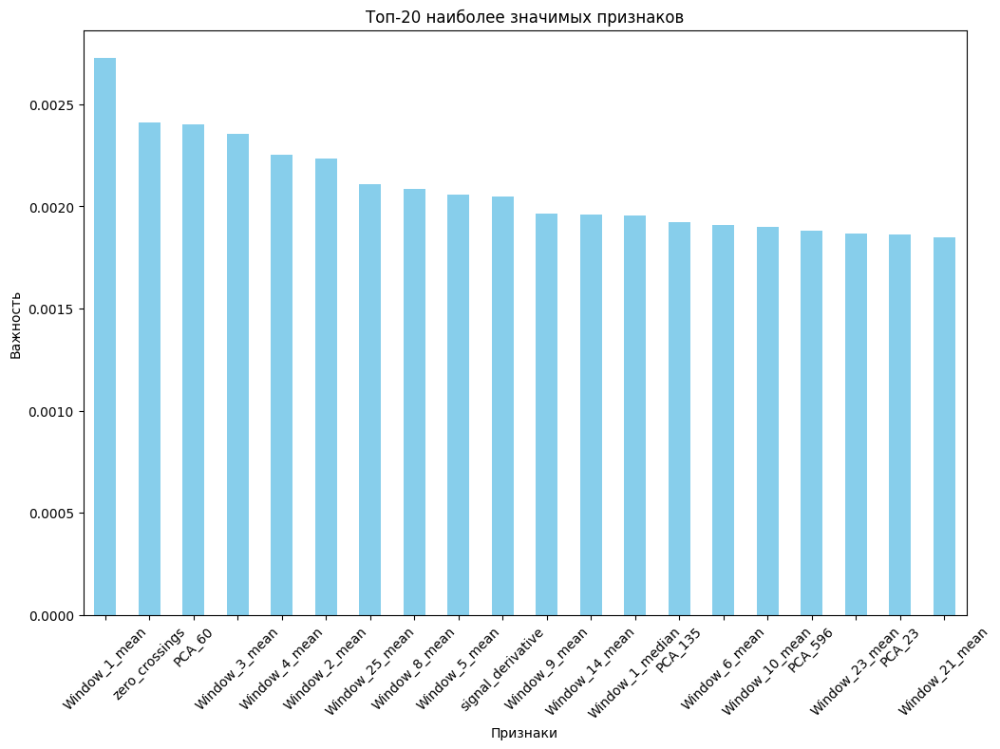

In [ ]:
# Обучаем модель Random Forest
model = RandomForestClassifier(random_state=42)
model.fit(X, y)

# Получаем важность признаков
feature_importances_forest = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)

# Выводим топ-20 наиболее значимых признаков
print("Топ-20 наиболее значимых признаков:")
print(feature_importances_forest.head(20))

# Визуализация важности признаков
plt.figure(figsize=(12, 8))
feature_importances_forest.head(20).plot(kind='bar', color='skyblue')
plt.title("Топ-20 наиболее значимых признаков")
plt.xlabel("Признаки")
plt.ylabel("Важность")
plt.xticks(rotation=45)
plt.show()

**Feature stability признаков методом перестановок**

Стабильность признаков:
            Feature  Mean Importance  Std Importance
68           PCA_60         0.005946        0.001994
143         PCA_135         0.004440        0.001615
61           PCA_53         0.004275        0.001307
636   Window_3_mean         0.003849        0.002672
7    zero_crossings         0.003422        0.002450
51           PCA_43         0.003224        0.001421
24           PCA_16         0.003155        0.002140
756  Window_23_mean         0.003076        0.003191
624   Window_1_mean         0.002918        0.001701
33           PCA_25         0.002783        0.001969
34           PCA_26         0.002728        0.000566
702  Window_14_mean         0.002598        0.002058
642   Window_4_mean         0.002487        0.001162
43           PCA_35         0.002467        0.001152
44           PCA_36         0.002463        0.000370
476         PCA_468         0.002442        0.002116
672   Window_9_mean         0.002414        0.001329
484         PCA_476   

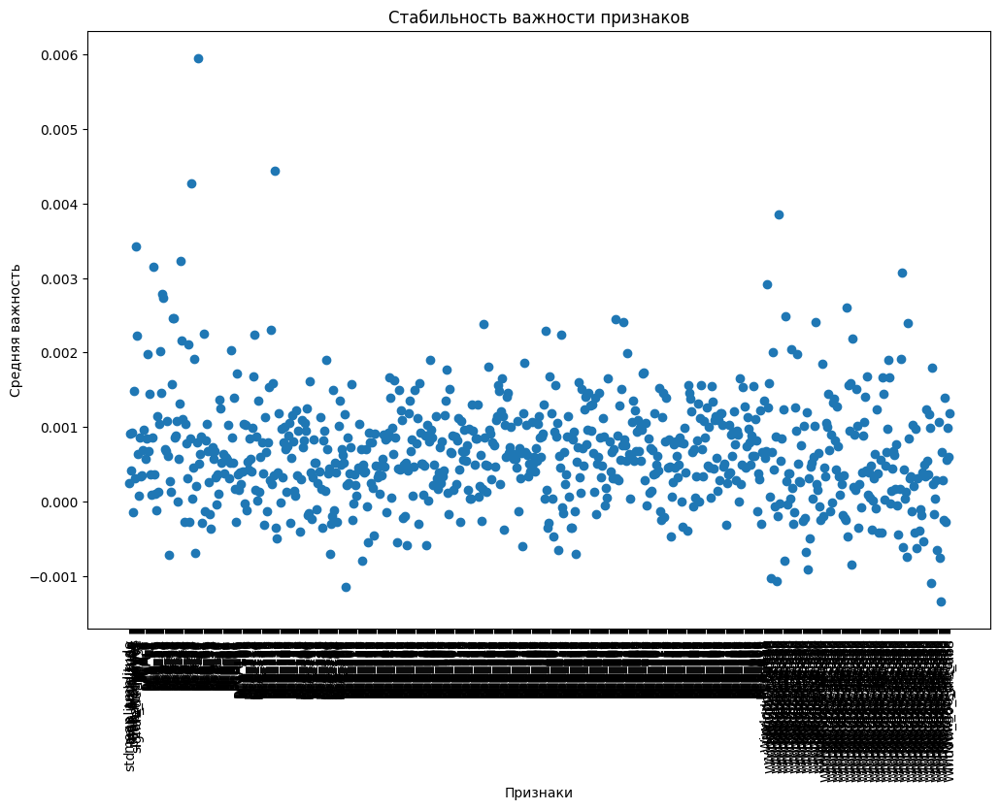

CPU times: user 21min 21s, sys: 45.1 s, total: 22min 6s
Wall time: 22min 6s


In [ ]:
%%time

# Функция для вычисления стабильности важности признаков
def compute_feature_stability(X, y, n_iterations=10):
    feature_importances = []

    for i in range(n_iterations):
        # Разделяем данные на тренировочную и тестовую выборки
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=i)

        # Обучаем модель
        model = RandomForestClassifier(random_state=42)
        model.fit(X_train, y_train)

        # Вычисляем важность признаков через перестановки
        result = permutation_importance(model, X_test, y_test, scoring='f1', random_state=42, n_repeats=5)
        feature_importances.append(result.importances_mean)

    # Средняя важность признаков
    mean_importance = np.mean(feature_importances, axis=0)

    # Стандартное отклонение важности признаков
    std_importance = np.std(feature_importances, axis=0)

    return pd.DataFrame({
        'Feature': X.columns,
        'Mean Importance': mean_importance,
        'Std Importance': std_importance
    })

# Вычисляем стабильность признаков
stability_df_forest = compute_feature_stability(X, y, n_iterations=3)

# Выводим результаты
print("Стабильность признаков:")
print(stability_df_forest.sort_values(by='Mean Importance', ascending=False)[:20])

# Визуализация
plt.figure(figsize=(12, 8))
# plt.errorbar(
#     stability_df['Feature'],
#     stability_df['Mean Importance'],
#     yerr=stability_df['Std Importance'],
#     fmt='o',
#     capsize=5
# )

plt.scatter(
    stability_df_forest['Feature'],
    stability_df_forest['Mean Importance']
)
plt.xticks(rotation=90)
plt.title("Стабильность важности признаков")
plt.xlabel("Признаки")
plt.ylabel("Средняя важность")
plt.show()

Все признаки не дают никакой новой информации. Их важность либо почти ноль процентов либо стандартное отклонение равно среднему значению

### Catboost

**Feature importance**

Топ-20 наиболее значимых признаков:
zero_crossings       2.073934
peak_frequency       0.811084
Window_1_mean        0.673042
signal_derivative    0.624680
PCA_597              0.578094
Window_25_mean       0.550621
PCA_576              0.541131
PCA_415              0.536351
PCA_505              0.531334
Window_2_mean        0.514973
PCA_573              0.497594
PCA_529              0.492752
PCA_60               0.469233
Window_3_mean        0.462267
Window_4_mean        0.458923
PCA_596              0.454686
PCA_253              0.443551
PCA_484              0.429593
PCA_498              0.406205
Window_5_mean        0.405873
dtype: float64


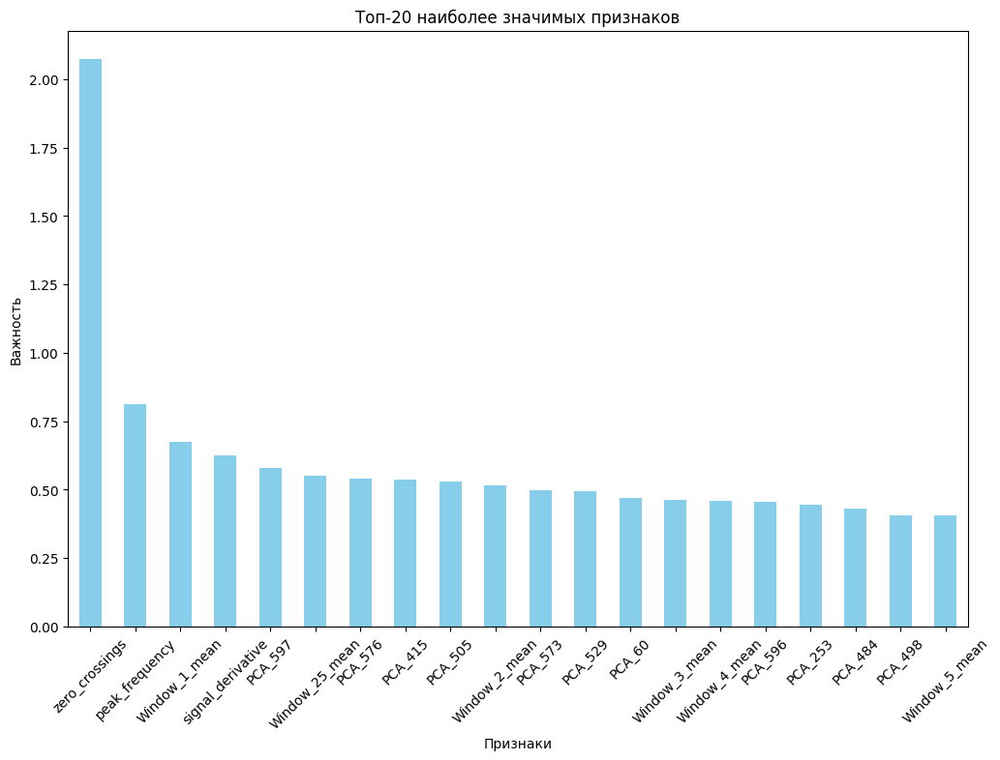

CPU times: user 3min 37s, sys: 3.34 s, total: 3min 41s
Wall time: 20 s


In [ ]:
%%time
# Обучаем модель CatBoost
model = CatBoostClassifier(
    random_state=42,
    verbose=0  # Отключаем вывод логов обучения
)
model.fit(X, y)

# Получаем важность признаков
feature_importances_catboost = pd.Series(model.get_feature_importance(), index=X.columns).sort_values(ascending=False)

# Выводим топ-20 наиболее значимых признаков
print("Топ-20 наиболее значимых признаков:")
print(feature_importances_catboost.head(20))

# Визуализация важности признаков
plt.figure(figsize=(12, 8))
feature_importances_catboost.head(20).plot(kind='bar', color='skyblue')
plt.title("Топ-20 наиболее значимых признаков")
plt.xlabel("Признаки")
plt.ylabel("Важность")
plt.xticks(rotation=45)
plt.show()

**Feature stability методом перестановок**

Стабильность признаков:
               Feature  Mean Importance  Std Importance
7       zero_crossings         2.069262        0.096031
5       peak_frequency         1.006523        0.113837
624      Window_1_mean         0.740183        0.092380
604            PCA_596         0.612897        0.122132
630      Window_2_mean         0.611884        0.030818
642      Window_4_mean         0.583471        0.044569
605            PCA_597         0.549920        0.044270
537            PCA_529         0.543610        0.102366
8    signal_derivative         0.535308        0.111536
581            PCA_573         0.508794        0.084018
423            PCA_415         0.496678        0.115088
513            PCA_505         0.480591        0.168789
350            PCA_342         0.469278        0.090611
648      Window_5_mean         0.469107        0.096631
584            PCA_576         0.456416        0.085751
762     Window_24_mean         0.445257        0.036854
504            PCA_496  

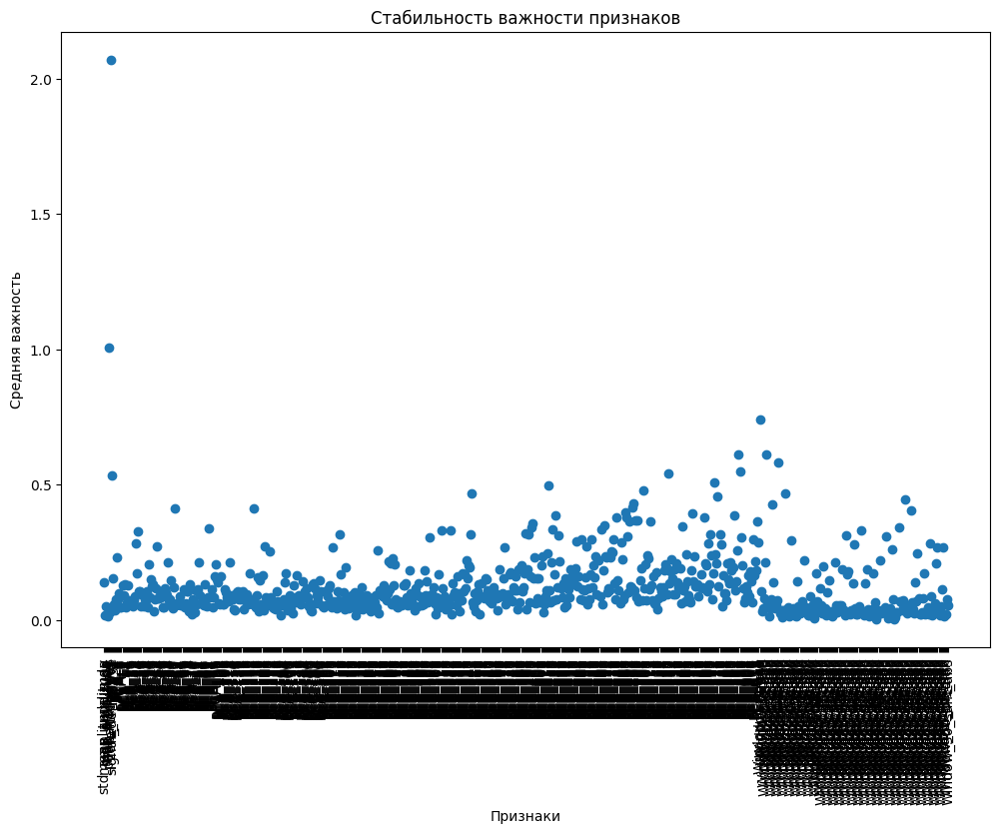

CPU times: user 10min 19s, sys: 10 s, total: 10min 29s
Wall time: 57.6 s


In [ ]:
%%time

# Функция для вычисления стабильности важности признаков с использованием встроенных методов CatBoost
def compute_feature_stability(X, y, n_iterations=10):
    feature_importances = []

    for i in range(n_iterations):
        # Разделяем данные на тренировочную и тестовую выборки
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=i)

        # Создаем пулы данных для CatBoost
        train_pool = Pool(X_train, label=y_train)
        test_pool = Pool(X_test, label=y_test)

        # Обучаем модель CatBoost
        model = CatBoostClassifier(
            random_state=42,
            verbose=0  # Отключаем вывод логов обучения
        )
        model.fit(train_pool)

        # Получаем важность признаков через встроенный метод
        importance_scores = model.get_feature_importance(type="FeatureImportance", prettified=False)
        feature_importances.append(importance_scores)

    # Средняя важность признаков
    mean_importance = np.mean(feature_importances, axis=0)

    # Стандартное отклонение важности признаков
    std_importance = np.std(feature_importances, axis=0)

    return pd.DataFrame({
        'Feature': X.columns,
        'Mean Importance': mean_importance,
        'Std Importance': std_importance
    })

# Вычисляем стабильность признаков
stability_df_catboost = compute_feature_stability(X, y, n_iterations=3)

# Выводим результаты
print("Стабильность признаков:")
print(stability_df_catboost.sort_values(by='Mean Importance', ascending=False)[:20])

# Визуализация
plt.figure(figsize=(12, 8))
plt.scatter(
    stability_df_catboost['Feature'],
    stability_df_catboost['Mean Importance']
)
plt.xticks(rotation=90)
plt.title("Стабильность важности признаков")
plt.xlabel("Признаки")
plt.ylabel("Средняя важность")
plt.show()

## 2. Оберточные методы Feature selection

### RFE(Recursive Feature Elimination)

Выбранные признаки: Index(['zero_crossings', 'signal_derivative', 'PCA_25', 'PCA_60', 'PCA_396',
       'PCA_426', 'PCA_468', 'PCA_484', 'PCA_505', 'PCA_573', 'PCA_596',
       'Window_1_mean', 'Window_3_mean', 'Window_4_mean', 'Window_5_mean',
       'Window_14_mean', 'Window_21_mean', 'Window_23_mean', 'Window_24_mean',
       'Window_25_mean'],
      dtype='object')
Средняя f1-score модели на кросс-валидации (топ-5 признаков): 0.55


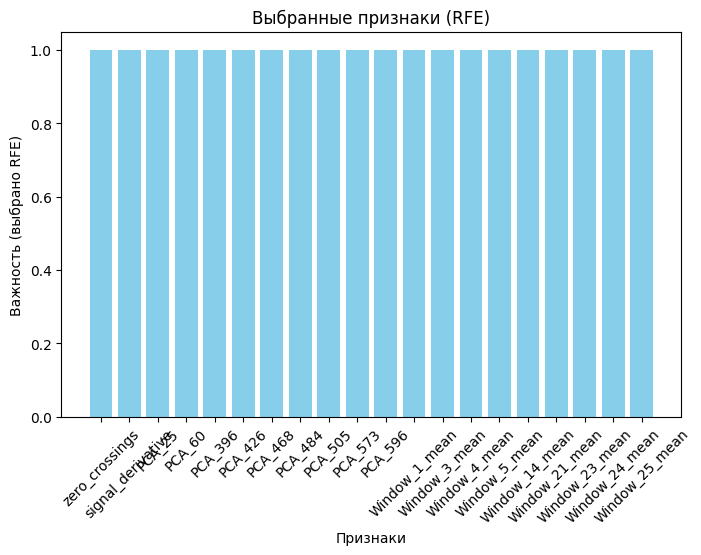

CPU times: user 13h 54min 4s, sys: 2min 14s, total: 13h 56min 18s
Wall time: 1h 15min 14s


In [ ]:
%%time

# Функция для выполнения RFE с использованием RandomForest
def rfe_with_random_forest(X, y, n_features_to_select=5):
    # Базовая модель: RandomForestClassifier
    base_model = RandomForestClassifier(
        random_state=42,       # Для воспроизводимости результатов
        n_jobs=-1              # Используем все доступные CPU
    )

    # Инициализация RFE
    rfe = RFE(estimator=base_model, n_features_to_select=n_features_to_select)
    rfe.fit(X, y)

    feature_ranking = pd.Series(rfe.ranking_, index=X.columns).sort_values()

    # Выбираем наиболее важные признаки
    selected_features = X.columns[rfe.support_]
    print("Выбранные признаки:", selected_features)

    # Кросс-валидация на выбранных признаках
    X_selected = X[selected_features]
    cv_scores = cross_val_score(base_model, X_selected, y, cv=5, scoring='f1')
    return cv_scores, selected_features, feature_ranking

# Выполняем RFE для выбора 5 лучших признаков
cv_scores, selected_features_rfe, features_rfe = rfe_with_random_forest(X, y, n_features_to_select=20)

# Выводим среднюю f1-score модели
f1_score = np.mean(cv_scores)
print(f"Средняя f1-score модели на кросс-валидации (топ-5 признаков): {f1_score:.2f}")

# Визуализация важности выбранных признаков
plt.figure(figsize=(8, 5))
plt.bar(selected_features_rfe, np.ones(len(selected_features_rfe)), color='skyblue')
plt.title("Выбранные признаки (RFE)")
plt.xlabel("Признаки")
plt.ylabel("Важность (выбрано RFE)")
plt.xticks(rotation=45)
plt.show()

## 3. Фильтрационные методы Feature selection

### Correlation

In [ ]:
%%time
df_corr = df.iloc[:, 15000:]  # Все признаки, кроме временных значений и target

# # Вычисление корреляции (для числовых данных)
# correlation = df_corr.corrwith(df_corr['target'])
# top_features = correlation.abs().sort_values(ascending=False).index[:5]
# print("Топ-5 признаков по корреляции:", top_features)

# Вычисляем матрицу корреляций (метод Пирсона)
correlation_matrix = df_corr.corr()

# Визуализация матрицы корреляций
# plt.figure(figsize=(12, 8))
# sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt='.2f', cbar=True)

# Подчеркиваем связь с целевой переменной
features_correlation = correlation_matrix['target'].sort_values(ascending=False)
print("Корреляция с целевой переменной:")
print(features_correlation)
features_correlation = features_correlation.drop('target')  # Убираем корреляцию target с самим собой

# # Отображение графика
# plt.title("Матрица корреляций")
# plt.show()

Корреляция с целевой переменной:
target               1.000000
Window_1_mean        0.059461
Window_1_median      0.049229
Window_4_mean        0.040218
Window_2_mean        0.039835
                       ...   
PCA_489             -0.020972
PCA_614             -0.020992
PCA_450             -0.021393
PCA_592             -0.021907
Window_13_sum_abs   -0.022089
Name: target, Length: 805, dtype: float64
CPU times: user 22.1 s, sys: 373 ms, total: 22.5 s
Wall time: 22.5 s


### Mutual Information

Топ-5 признаков по Mutual Information:
PCA_435           0.011298
zero_crossings    0.009811
PCA_520           0.009719
Window_7_mean     0.009415
PCA_595           0.009008
Name: Mutual Information, dtype: float64


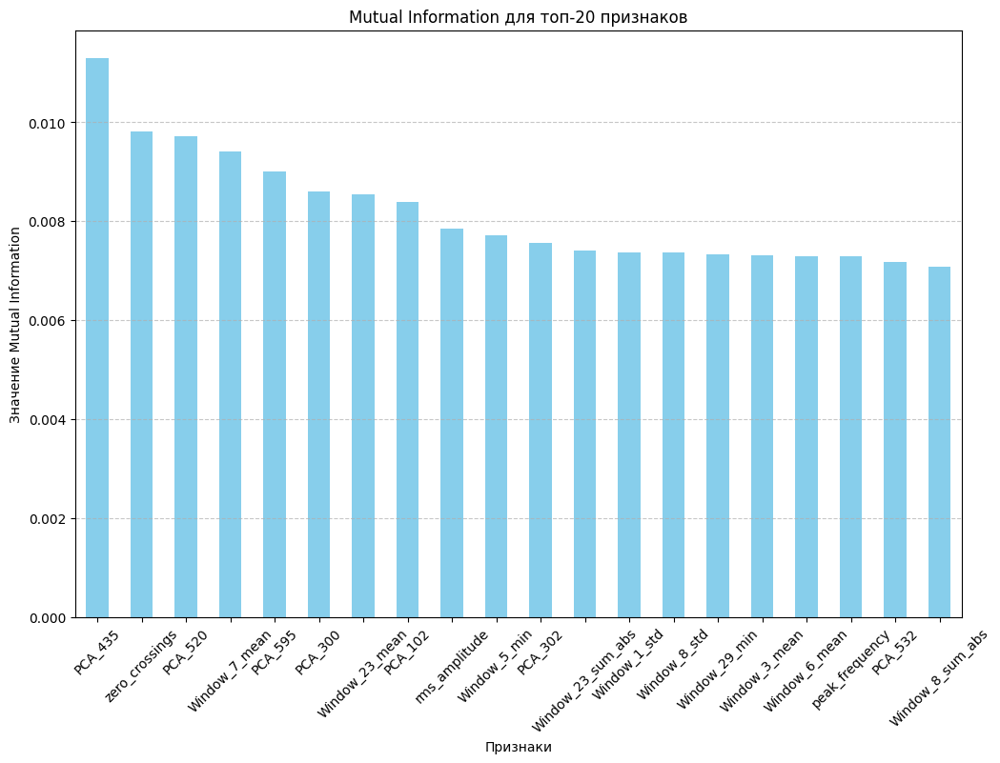

CPU times: user 44.9 s, sys: 501 ms, total: 45.4 s
Wall time: 45.4 s


In [ ]:
%%time
# Вычисляем Mutual Information
mi_scores = mutual_info_classif(X, y, random_state=42)

# Создаем Series для удобства работы
features_mi = pd.Series(mi_scores, index=X.columns, name="Mutual Information")

# Сортируем признаки по убыванию MI
features_mi = features_mi.sort_values(ascending=False)

# Выводим топ-5 признаков
print("Топ-5 признаков по Mutual Information:")
print(features_mi.head(5))

# Визуализация Mutual Information
plt.figure(figsize=(12, 8))
features_mi.head(20).plot(kind='bar', color='skyblue')
plt.title("Mutual Information для топ-20 признаков")
plt.xlabel("Признаки")
plt.ylabel("Значение Mutual Information")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

## 4. Сравнение всех методов FS


Оценка для n_features = 10
Lasso Feature Importances: Средняя F1-score = 0.55
Lasso Stability: Средняя F1-score = 0.56
Random Forest Feature Importances: Средняя F1-score = 0.61
Random Forest Stability: Средняя F1-score = 0.61
CatBoost Feature Importances: Средняя F1-score = 0.58
CatBoost Stability: Средняя F1-score = 0.59
RFE Features: Средняя F1-score = 0.48
Correlation Features: Средняя F1-score = 0.57
Mutual Information Features: Средняя F1-score = 0.60
All Features: Средняя F1-score = 0.72

Оценка для n_features = 20
Lasso Feature Importances: Средняя F1-score = 0.59
Lasso Stability: Средняя F1-score = 0.59
Random Forest Feature Importances: Средняя F1-score = 0.63
Random Forest Stability: Средняя F1-score = 0.64
CatBoost Feature Importances: Средняя F1-score = 0.64
CatBoost Stability: Средняя F1-score = 0.64
RFE Features: Средняя F1-score = 0.50
Correlation Features: Средняя F1-score = 0.58
Mutual Information Features: Средняя F1-score = 0.62
All Features: Средняя F1-score = 0.7

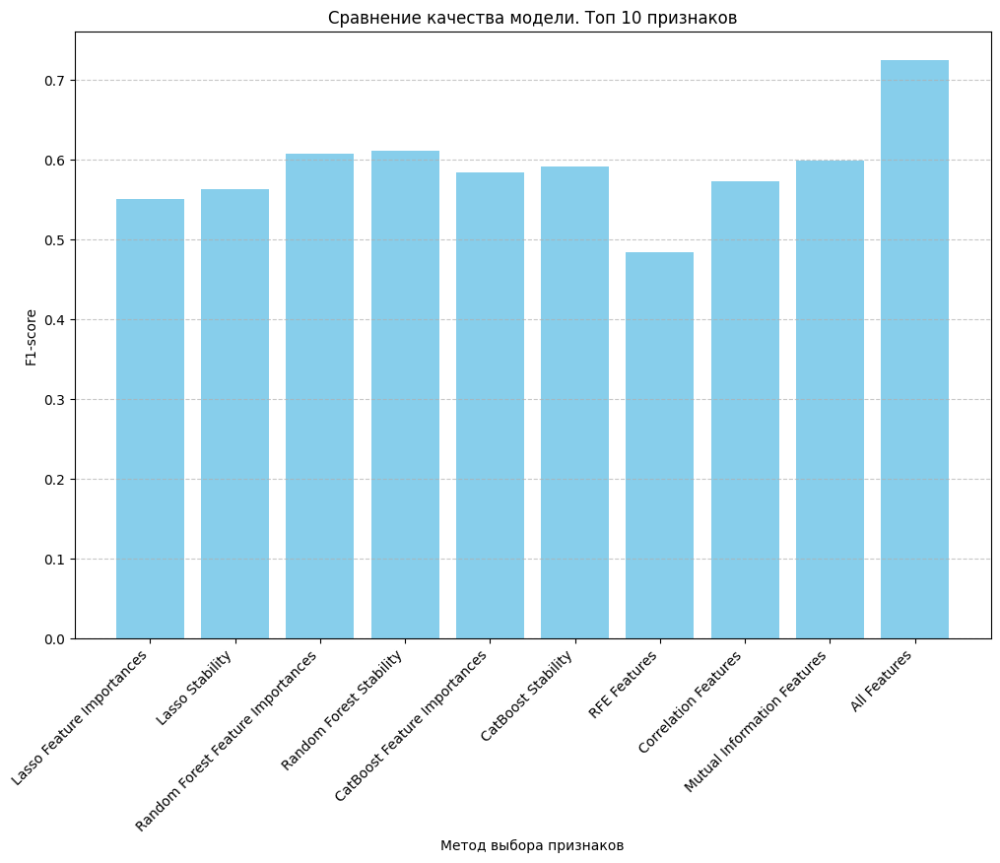

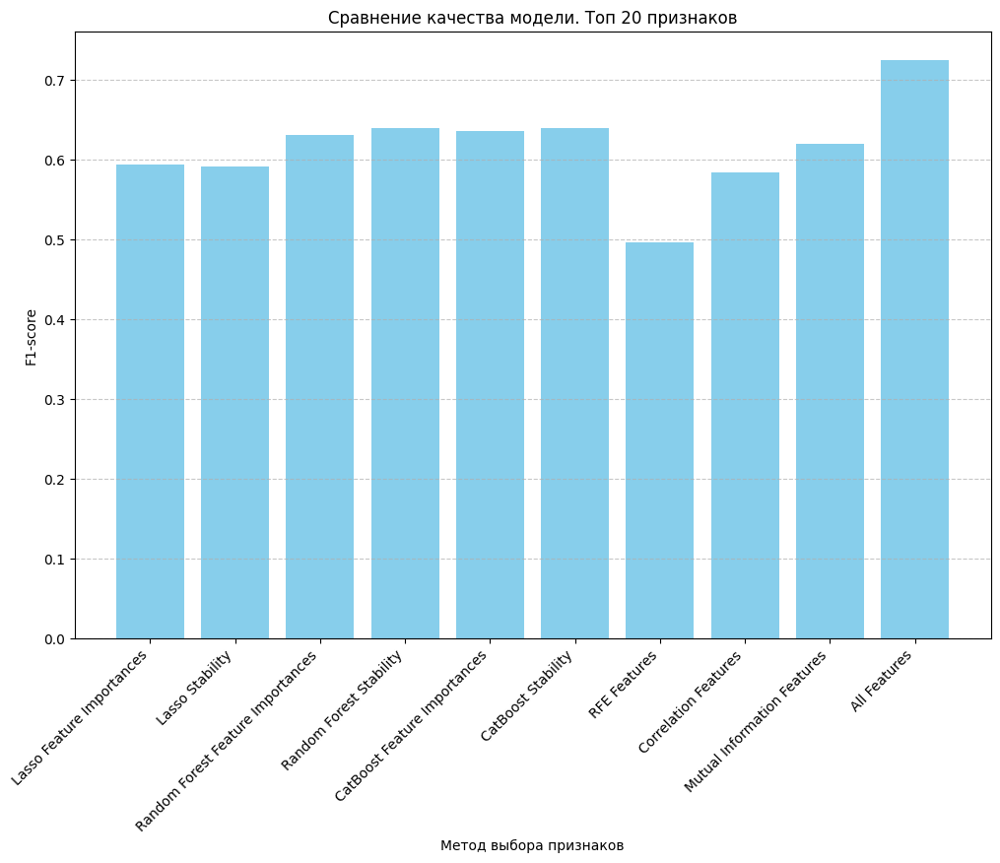

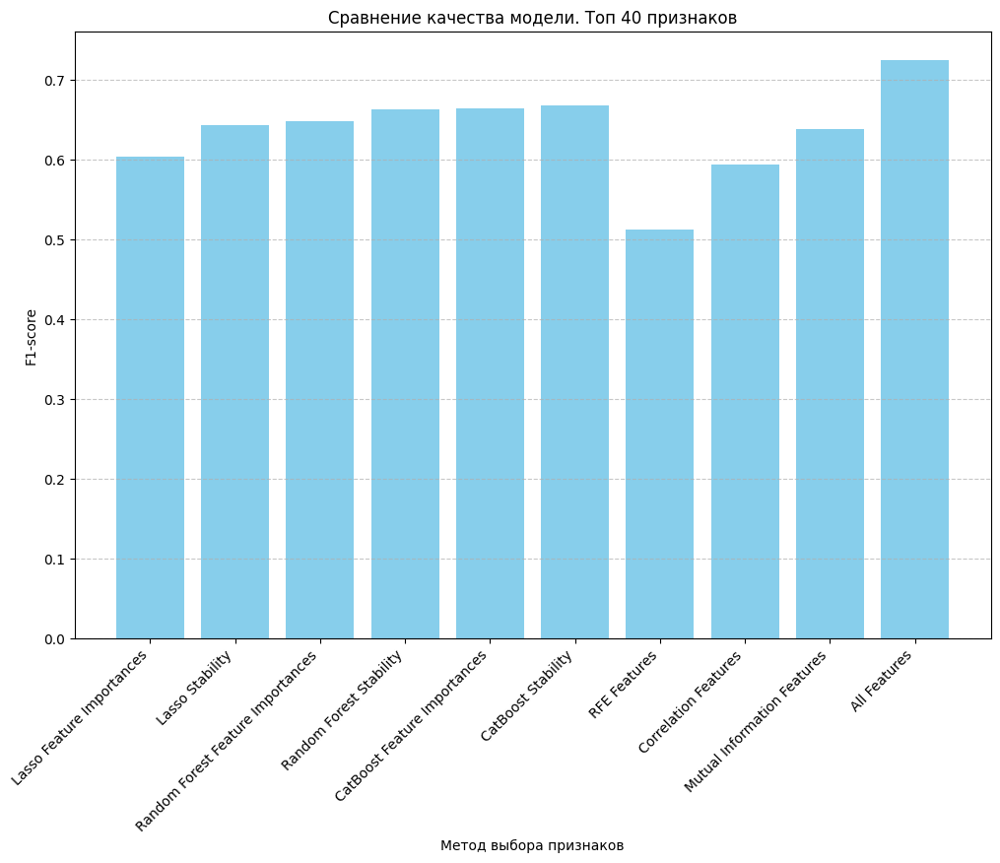

CPU times: user 25min 6s, sys: 51.7 s, total: 25min 58s
Wall time: 2min 21s


In [ ]:
%%time

# Импортируем необходимые библиотеки
from sklearn.metrics import f1_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Список датасетов с важностями признаков
datasets = {
    "Lasso Feature Importances": feature_importances_lasso,
    "Lasso Stability": stability_df_lasso,
    "Random Forest Feature Importances": feature_importances_forest,
    "Random Forest Stability": stability_df_forest,
    "CatBoost Feature Importances": feature_importances_catboost,
    "CatBoost Stability": stability_df_catboost,
    "RFE Features": features_rfe,
    "Correlation Features": features_correlation,
    "Mutual Information Features": features_mi,
    "All Features": df.iloc[:, 15000:].drop(columns=['target'])
}

# Целевая переменная
y = df['target']

# Функция для оценки качества модели
def evaluate_model_on_dataset(dataset, y, df_features, participants, n_features, dataset_name=None):
    if dataset_name == "All Features":
        # Если это датасет "All Features", используем все признаки
        X_selected = dataset
    elif "Stability" in dataset_name:
        # Если это stability_df, сортируем по полю Mean Importance и берем топ-N признаков
        top_features = dataset.sort_values(by='Mean Importance', ascending=False)['Feature'][:n_features]
        X_selected = df_features[top_features]
    else:
        # Для остальных датасетов берем топ-N признаков
        if isinstance(dataset, pd.Series):  # Если Series с важностями
            top_features = dataset.sort_values(ascending=False).index[:n_features]
        elif isinstance(dataset, pd.DataFrame):  # Если DataFrame
            top_features = dataset.columns[:n_features]
        X_selected = df_features[top_features]

    # Добавляем поле participant в X_selected
    X_selected_with_participant = pd.concat([X_selected, participants], axis=1)

    # Оценка качества модели с помощью нашей кросс-валидации
    model = CatBoostClassifier(
        random_state=42,
        verbose=0  # Отключаем вывод логов обучения
    )

    # Используем нашу кросс-валидацию
    scores_list = []
    for train_data, test_data in participant_based_cross_validation(pd.concat([X_selected_with_participant, y], axis=1)):
        X_train, y_train = train_data.iloc[:, :-2], train_data.iloc[:, -1]  # Убираем participant и target
        X_test, y_test = test_data.iloc[:, :-2], test_data.iloc[:, -1]  # Убираем participant и target

        # Обучение модели
        model.fit(X_train, y_train)

        # Оценка на тестовой выборке
        current_score = f1_score(y_test, model.predict(X_test))
        scores_list.append(current_score)

    return np.mean(scores_list)

# Параметры: количество признаков для выбора
n_features_values = [5, 10, 20]

# Словарь для хранения результатов
all_results = {}

# Оценка качества модели для каждого значения n_features
for n_features in n_features_values:
    print(f"\nОценка для n_features = {n_features}")
    results = {}

    # Оценка качества модели на каждом датасете
    for name, dataset in datasets.items():
        f1_score_value = evaluate_model_on_dataset(
            dataset,
            y,
            df_features=df,
            participants=df_raw['participant'],
            n_features=n_features,
            dataset_name=name
        )
        results[name] = f1_score_value
        print(f"{name}: Средняя F1-score = {f1_score_value:.2f}")

    # Сохраняем результаты для текущего n_features
    all_results[n_features] = results

# Визуализация результатов для каждого значения n_features
for n_features, results in all_results.items():
    plt.figure(figsize=(12, 8))
    plt.bar(results.keys(), results.values(), color='skyblue')
    plt.title(f"Сравнение качества модели. Топ {n_features} признаков")
    plt.xlabel("Метод выбора признаков")
    plt.ylabel("F1-score")
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

# Обучение классических моделей

Функция для сохранения результатов

In [ ]:
# Функция для сохранения результатов в CSV
def save_results_to_csv(results_df, file_path="results.csv"):
    """
    Сохраняет или обновляет CSV-файл с результатами.
    Если файл существует, добавляет новую строку.
    Если файл не существует, создает новый.
    """
    try:
        # Проверяем, существует ли файл
        existing_df = pd.read_csv(file_path)
        # Добавляем новые данные к существующим
        updated_df = pd.concat([existing_df, results_df], ignore_index=True)
    except FileNotFoundError:
        # Если файл не существует, создаем новый DataFrame
        updated_df = results_df

    # Сохраняем обновленный DataFrame в CSV
    updated_df.to_csv(file_path, index=False)
    print(f"Результаты успешно сохранены в файл: {file_path}")

## 1. Catboost

F1-score на тестовой выборке (Raw data): 0.75
Матрица ошибок:
[[1298  302]
 [ 420 1080]]


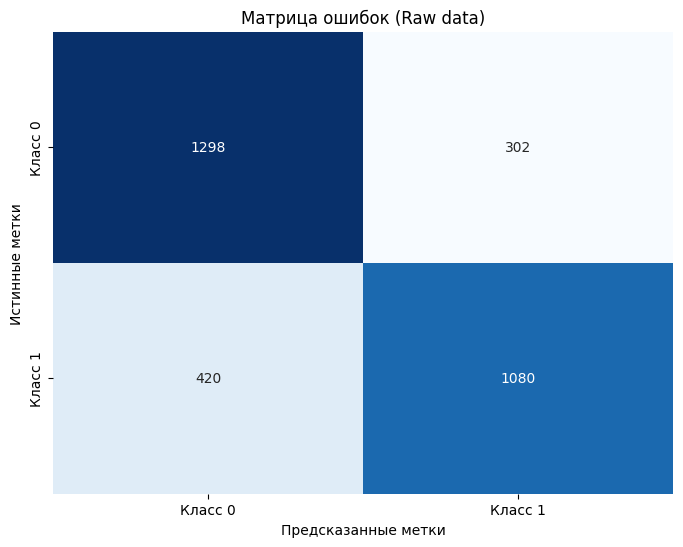

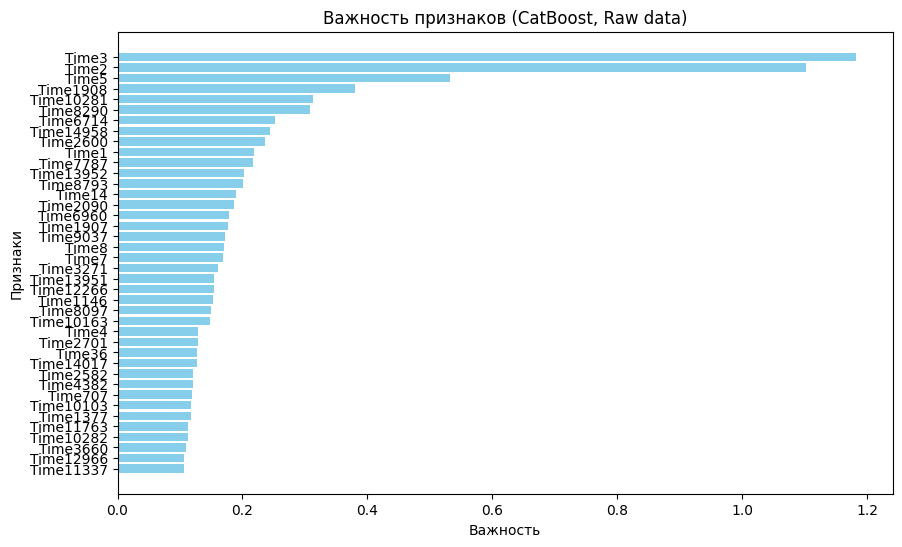

Результаты успешно сохранены в файл: models/classic_ml_models.csv
F1-score на тестовой выборке (All features): 0.70
Матрица ошибок:
[[1199  401]
 [ 471 1029]]


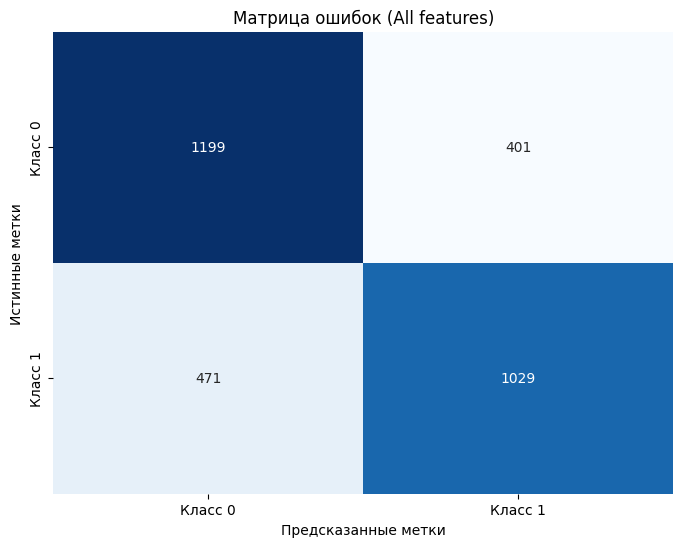

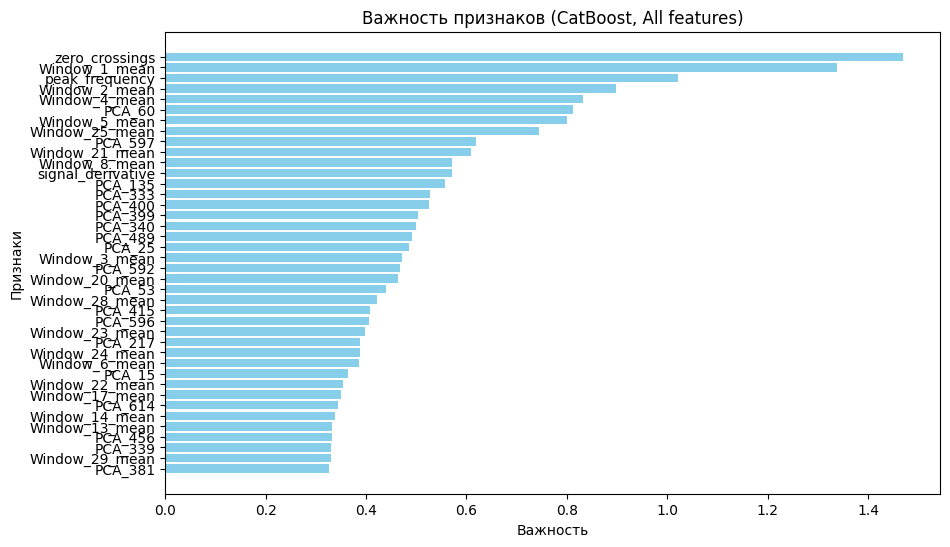

Результаты успешно сохранены в файл: models/classic_ml_models.csv
F1-score на тестовой выборке (Feature importance stability catboost): 0.64
Матрица ошибок:
[[1078  522]
 [ 548  952]]


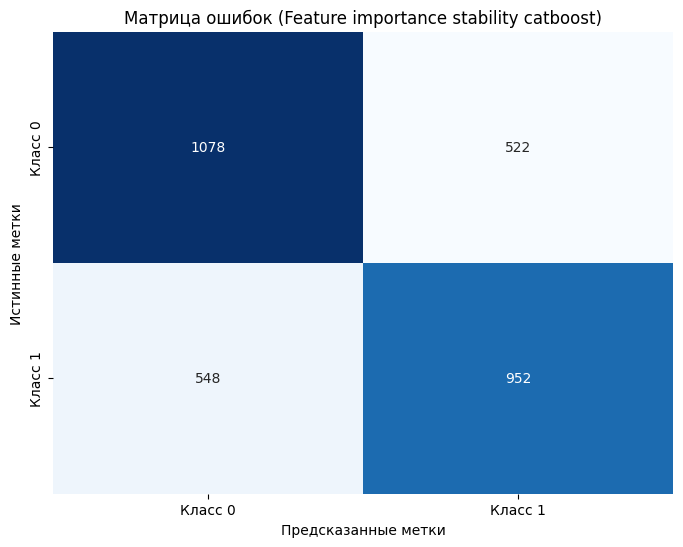

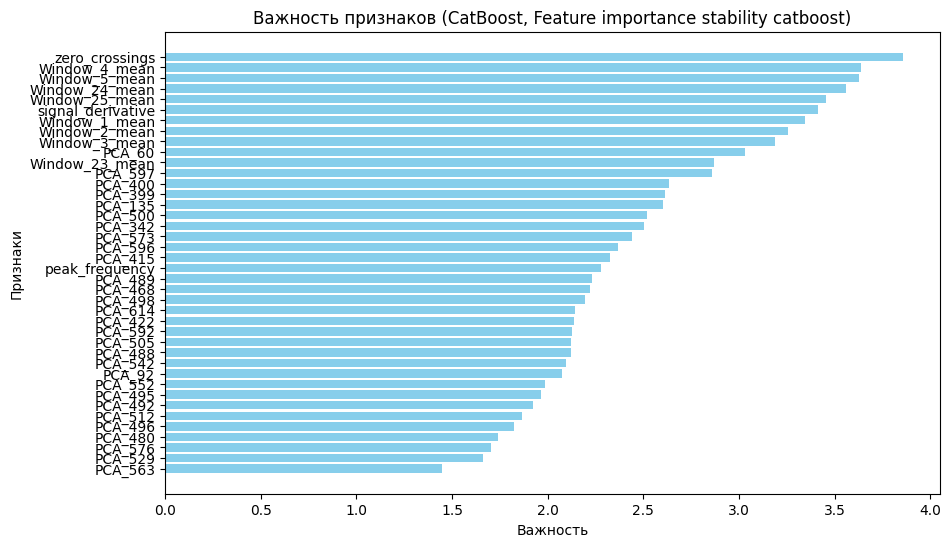

Результаты успешно сохранены в файл: models/classic_ml_models.csv
CPU times: user 8h 42min 34s, sys: 1min 48s, total: 8h 44min 22s
Wall time: 48min 41s


In [ ]:
%%time

# Путь к файлу для сохранения результатов
path = "models/classic_ml_models.csv"

# Список конфигураций для перебора
configurations = [
    {"name": "Raw data", "data": df.iloc[:, :15000], "top_n_features": None},
    {"name": "All features", "data": df.iloc[:, 15000:].drop(columns=['target']), "top_n_features": None},
    # {"name": "Feature importance stability catboost", "data": df[feature_importances_catboost.sort_values(ascending=False).index[:40]], "top_n_features": 40}
    {"name": "Feature importance stability catboost", "data": df[stability_df_catboost.sort_values(by='Mean Importance', ascending=False)['Feature'][:40]], "top_n_features": 40}
]

# Перебор конфигураций
for config in configurations:
    # Конфигурация эксперимента
    feature_selection_configuration = config["name"]
    model_name = "CatBoost"
    explained_variance_ratio_PCA = round(cumulative_explained_variance[optimal_components], 2).item()
    window_size_column = window_size
    top_n_features_column = config["top_n_features"]

    # Выбираем данные в зависимости от конфигурации
    X_selected = config["data"]
    y = df['target']

    # Объединяем выбранные признаки и целевую переменную с 'participant' для кросс-валидации
    X_selected_with_participant = pd.concat([X_selected, df_raw['participant']], axis=1)
    y = df['target']
    data_for_cv = pd.concat([X_selected_with_participant, y], axis=1)
    
    # Список для хранения F1-score на каждой итерации
    cv_scores = []

    # Кросс-валидация с использованием participant-based подхода
    for train_data, val_data, test_data in participant_based_cross_validation_with_validation_fold(data_for_cv):
        # Разделяем данные на признаки и метки
        X_train, y_train = train_data.iloc[:, :-2], train_data.iloc[:, -1]
        X_val, y_val = val_data.iloc[:, :-2], val_data.iloc[:, -1]
        X_test, y_test = test_data.iloc[:, :-2], test_data.iloc[:, -1]
    
        # Создаем пул данных для CatBoost
        train_pool = Pool(X_train, label=y_train)
        val_pool = Pool(X_val, label=y_val)
        test_pool = Pool(X_test, label=y_test)
    
        # Обучение модели CatBoost с лучшими параметрами
        model = CatBoostClassifier(
            loss_function='Logloss',
            eval_metric='F1',
            random_seed=42,
            learning_rate=0.01,
            l2_leaf_reg=3,
            iterations=1000,
            depth=10,
            bagging_temperature=0.5,
            verbose=0  # Отключаем логи
        )
        model.fit(
            train_pool,
            eval_set=val_pool,  # Валидационная выборка для контроля переобучения
            early_stopping_rounds=50
        )
    
        # Оценка качества модели на тестовой выборке
        y_pred = model.predict(X_test)
        f1 = f1_score(y_test, y_pred)
        cv_scores.append(f1)
        print(f"F1-score на текущей итерации: {f1:.2f}")
    
        # Построение матрицы ошибок для текущего разбиения
        cm = confusion_matrix(y_test, y_pred)
        print("Матрица ошибок:")
        print(cm)
    
        # Визуализация матрицы ошибок
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                    xticklabels=["Класс 0", "Класс 1"],
                    yticklabels=["Класс 0", "Класс 1"])
        plt.title("Матрица ошибок")
        plt.xlabel("Предсказанные метки")
        plt.ylabel("Истинные метки")
        plt.show()
    
        # Визуализация важности признаков для текущей модели
        feature_importance = model.get_feature_importance(prettified=True)[:40]
        plt.figure(figsize=(10, 6))
        plt.barh(feature_importance['Feature Id'], feature_importance['Importances'], color='skyblue')
        plt.gca().invert_yaxis()  # Инвертируем ось Y для удобства чтения
        plt.title("Важность признаков (CatBoost)")
        plt.xlabel("Важность")
        plt.ylabel("Признаки")
        plt.show()
    
        # Создаем новую строку для сохранения
        new_result = pd.DataFrame({
            "feature_selection_configuration": [feature_selection_configuration],
            "model": [model_name],
            "explained_variance_ratio_PCA": [explained_variance_ratio_PCA],
            "window_size": [window_size_column],
            "top_n_features": [top_n_features_column],
            "f1_score_value": [round(f1, 2)]
        })

    # Сохраняем результаты в CSV
    save_results_to_csv(new_result, file_path=path)

Добавим оптимизацию гиперпараметров, подбор функции потерь, обработку дисбаланса классов(которого на моих данных нет)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Лучшие параметры: {'random_seed': 42, 'loss_function': 'Logloss', 'learning_rate': 0.01, 'l2_leaf_reg': 3, 'iterations': 1000, 'depth': 10, 'bagging_temperature': 0.5}
F1-score на тестовой выборке: 0.68


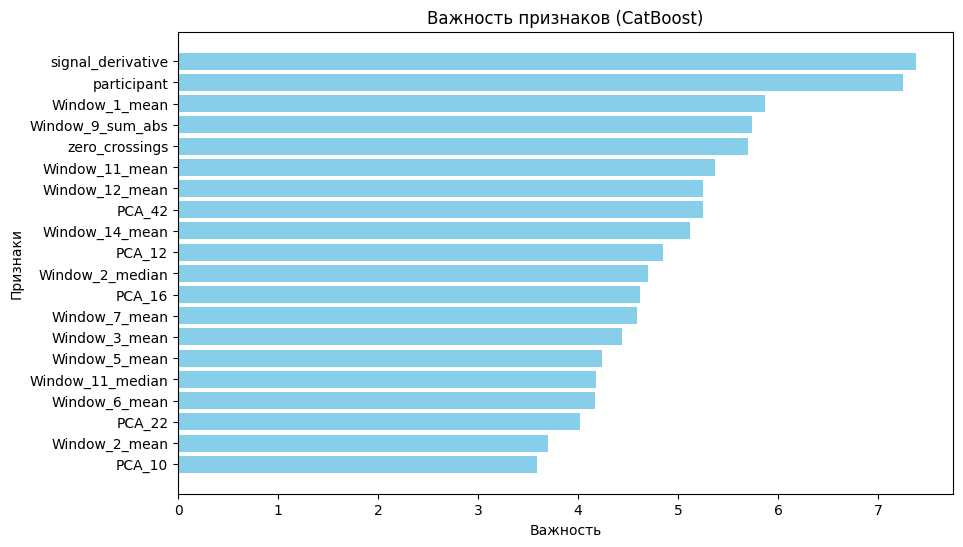

CPU times: user 2min 11s, sys: 6.85 s, total: 2min 18s
Wall time: 43min 3s


In [ ]:
%%time
# Выбираем топ-20 признаков по feature_importances_catboost
top_features = feature_importances_catboost.sort_values(ascending=False).index[:20]
X_selected = df[top_features]
y = df['target']

# Разделяем данные на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(
    X_selected, y, test_size=0.2, random_state=42, stratify=y
)

# Создаем пул данных для CatBoost
train_pool = Pool(X_train, label=y_train)
test_pool = Pool(X_test, label=y_test)

# Определение пространства поиска для случайного поиска
param_distributions = {
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'depth': [4, 6, 8, 10],
    'iterations': [500, 1000, 1500],
    'l2_leaf_reg': [1, 3, 5, 10],
    'bagging_temperature': [0, 0.5, 1],
    'loss_function': ['Logloss'],
    'random_seed': [42]
}

# Создаем базовую модель CatBoost
model = CatBoostClassifier(
    verbose=0,  # Отключаем логи
    early_stopping_rounds=50
)

# Настройка случайного поиска
random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_distributions,
    n_iter=20,  # Количество комбинаций для проверки
    scoring=make_scorer(f1_score),  # Метрика для оптимизации
    cv=5,  # Количество фолдов для кросс-валидации
    random_state=42,
    n_jobs=-1,  # Используем все доступные CPU
    verbose=1
)

# Обучение модели с использованием случайного поиска
random_search.fit(X_train, y_train)

# Лучшие параметры и качество модели
best_params = random_search.best_params_
print("Лучшие параметры:", best_params)
best_model = random_search.best_estimator_

# Оценка качества модели на тестовой выборке
y_pred = best_model.predict(X_test)
f1 = f1_score(y_test, y_pred)
print(f"F1-score на тестовой выборке: {f1:.2f}")

# Визуализация важности признаков
feature_importance = model.get_feature_importance(prettified=True)
plt.figure(figsize=(10, 6))
plt.barh(feature_importance['Feature Id'], feature_importance['Importances'], color='skyblue')
plt.gca().invert_yaxis()  # Инвертируем ось Y для удобства чтения
plt.title("Важность признаков (CatBoost)")
plt.xlabel("Важность")
plt.ylabel("Признаки")
plt.show()


#Лучшие параметры: {'random_seed': 42, 'loss_function': 'Logloss', 'learning_rate': 0.01, 'l2_leaf_reg': 3, 'iterations': 1000, 'depth': 10, 'bagging_temperature': 0.5}
# F1-score на тестовой выборке: 0.68

## 2. Random Forest

исходный вариант

F1-score на тестовой выборке (Raw data): 0.67
Матрица ошибок:
[[1255  345]
 [ 569  931]]


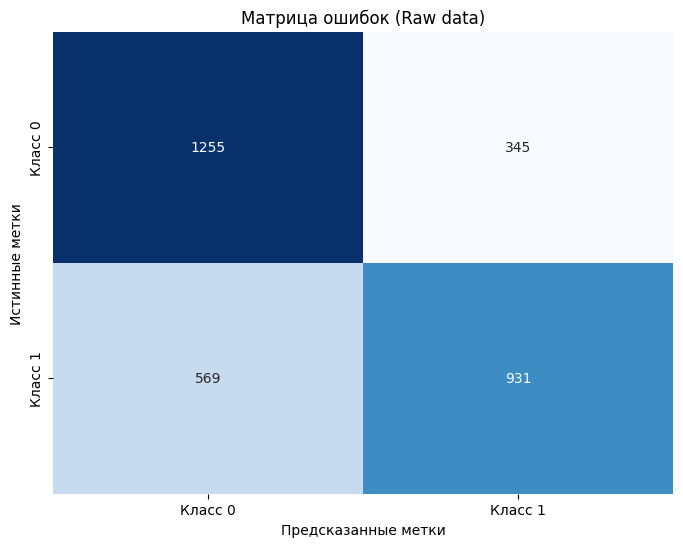

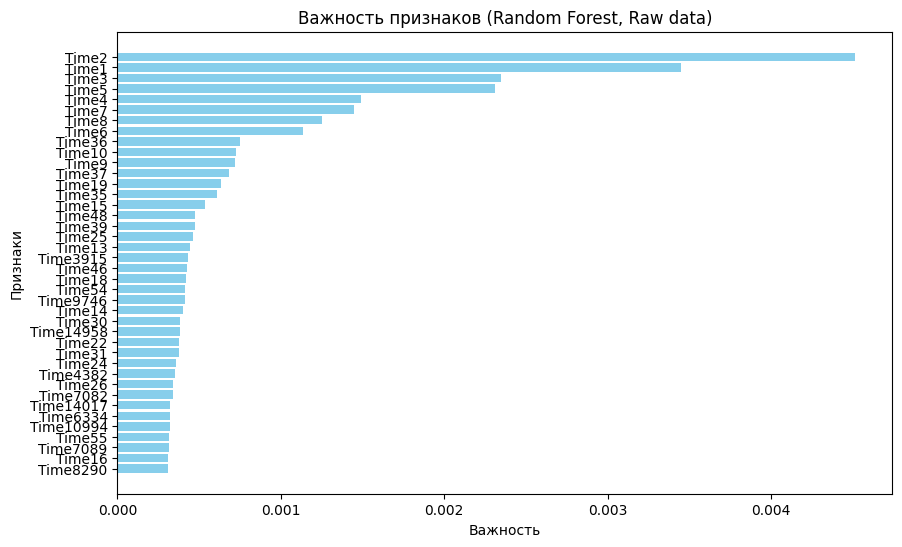

Результаты успешно сохранены в файл: models/classic_ml_models.csv
F1-score на тестовой выборке (All features): 0.63
Матрица ошибок:
[[1130  470]
 [ 602  898]]


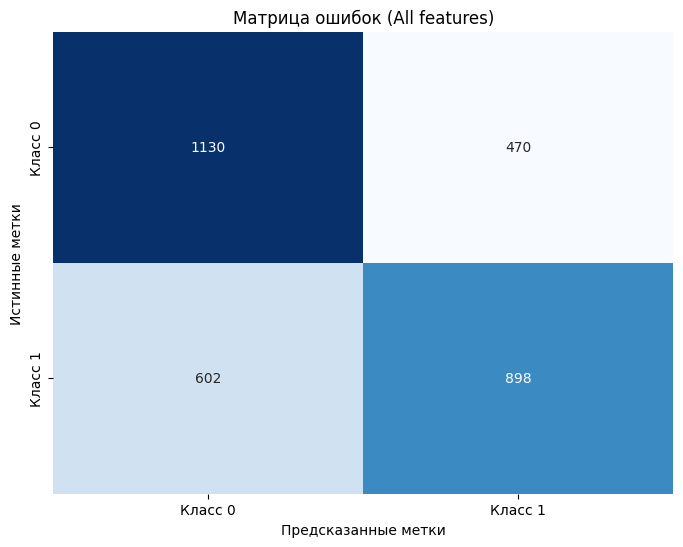

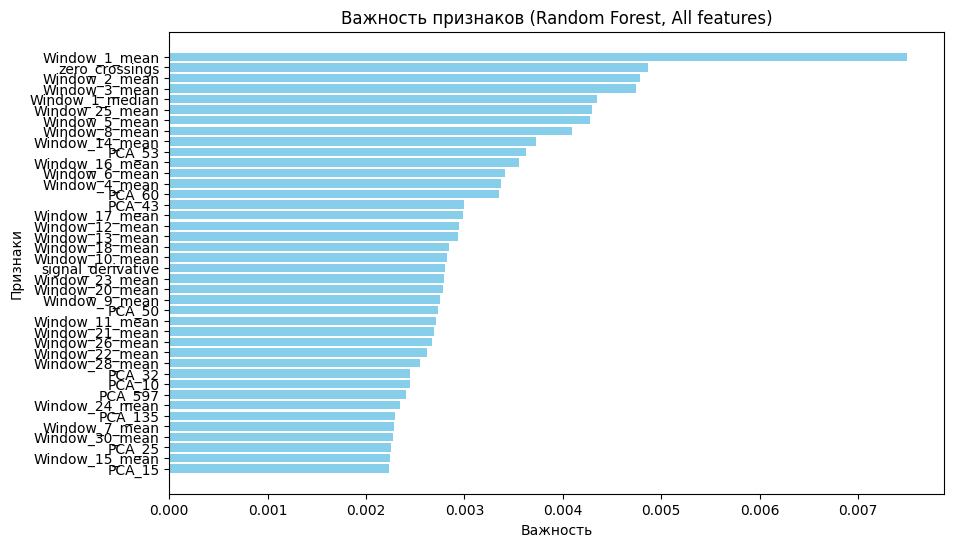

Результаты успешно сохранены в файл: models/classic_ml_models.csv
F1-score на тестовой выборке (Feature importance stability catboost): 0.61
Матрица ошибок:
[[1064  536]
 [ 596  904]]


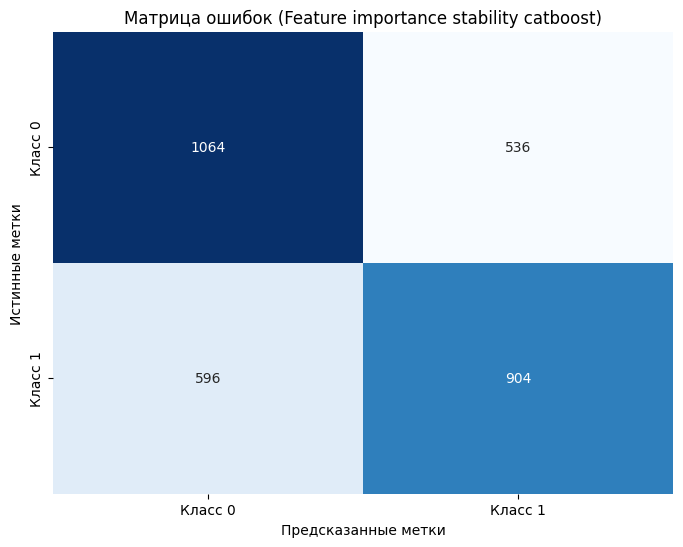

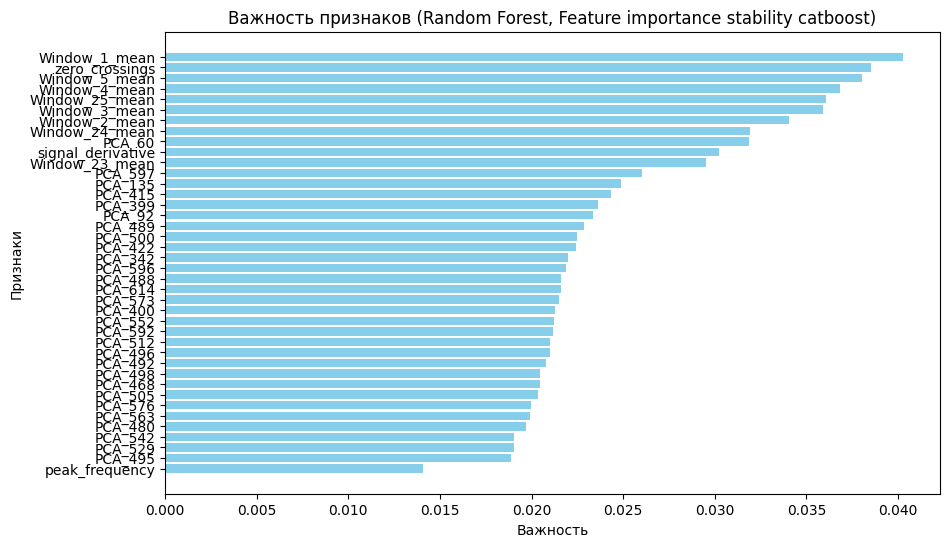

Результаты успешно сохранены в файл: models/classic_ml_models.csv
CPU times: user 4min 27s, sys: 3.01 s, total: 4min 30s
Wall time: 29.8 s


In [ ]:
%%time

# Путь к файлу для сохранения результатов
path = "models/classic_ml_models.csv"

# Список конфигураций для перебора
configurations = [
    {"name": "Raw data", "data": df.iloc[:, :15000], "top_n_features": None},
    {"name": "All features", "data": df.iloc[:, 15000:].drop(columns=['target']), "top_n_features": None},
    # {"name": "Feature importance stability catboost", "data": df[feature_importances_catboost.sort_values(ascending=False).index[:40]], "top_n_features": 40}
    {"name": "Feature importance stability catboost", "data": df[stability_df_catboost.sort_values(by='Mean Importance', ascending=False)['Feature'][:40]], "top_n_features": 40}
]

# Перебор конфигураций
for config in configurations:
    # Конфигурация эксперимента
    feature_selection_configuration = config["name"]
    model_name = "RandomForest"
    explained_variance_ratio_PCA = round(cumulative_explained_variance[optimal_components], 2).item()
    window_size_column = window_size
    top_n_features_column = config["top_n_features"]

    # Выбираем данные в зависимости от конфигурации
    X_selected = config["data"]
    y = df['target']

    X_selected_with_participant = pd.concat([X_selected, df_raw['participant']], axis=1)
    y = df['target']
    # y = df.iloc[:3100, :]['target']
    
    # Генератор для кросс-валидации по участникам
    cv_scores = []
    for train_data, val_data, test_data in participant_based_cross_validation_with_validation_fold(pd.concat([X_selected_with_participant, y], axis=1)):
        # Разделяем данные на признаки и метки
        X_train, y_train = train_data.iloc[:, :-2], train_data.iloc[:, -1]
        X_val, y_val = val_data.iloc[:, :-2], val_data.iloc[:, -1]
        X_test, y_test = test_data.iloc[:, :-2], test_data.iloc[:, -1]
    
        # Обучение модели Random Forest
        model = RandomForestClassifier(
            n_estimators=100,       # Количество деревьев
            max_depth=10,           # Максимальная глубина деревьев
            random_state=42,
            n_jobs=-1               # Используем все доступные CPU
        )
        model.fit(X_train, y_train)
    
        # Оценка качества модели на тестовой выборке
        y_pred = model.predict(X_test)
        f1 = f1_score(y_test, y_pred)
        cv_scores.append(f1)
        print(f"F1-score на текущей итерации: {f1:.2f}")
    
    # Усредняем результаты кросс-валидации
    mean_f1_cv = np.mean(cv_scores)
    print(f"Средняя F1-score на кросс-валидации: {mean_f1_cv:.2f}")
    
    # Построение матрицы ошибок для последнего разбиения
    cm = confusion_matrix(y_test, y_pred)
    print("Матрица ошибок:")
    print(cm)
    
    # Визуализация матрицы ошибок
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=["Класс 0", "Класс 1"],
                yticklabels=["Класс 0", "Класс 1"])
    plt.title("Матрица ошибок")
    plt.xlabel("Предсказанные метки")
    plt.ylabel("Истинные метки")
    plt.show()
    
    # Визуализация важности признаков для последней модели
    feature_importance = pd.DataFrame({
        'Feature': X_selected.columns,
        'Importance': model.feature_importances_
    }).sort_values(by='Importance', ascending=False)[:40]
    
    plt.figure(figsize=(10, 6))
    plt.barh(feature_importance['Feature'], feature_importance['Importance'], color='skyblue')
    plt.gca().invert_yaxis()  # Инвертируем ось Y для удобства чтения
    plt.title("Важность признаков (Random Forest)")
    plt.xlabel("Важность")
    plt.ylabel("Признаки")
    plt.show()

    # Создаем новую строку для сохранения
    new_result = pd.DataFrame({
        "feature_selection_configuration": [feature_selection_configuration],
        "model": [model_name],
        "explained_variance_ratio_PCA": [explained_variance_ratio_PCA],
        "window_size": [window_size_column],
        "top_n_features": [top_n_features_column],
        "f1_score_value": [round(f1, 2)]
    })

    # Сохраняем результаты в CSV
    save_results_to_csv(new_result, file_path=path)

## 3. Logistic Regression

исходный вариант

F1-score на тестовой выборке (Raw data): 0.73
Матрица ошибок:
[[1214  386]
 [ 412 1088]]


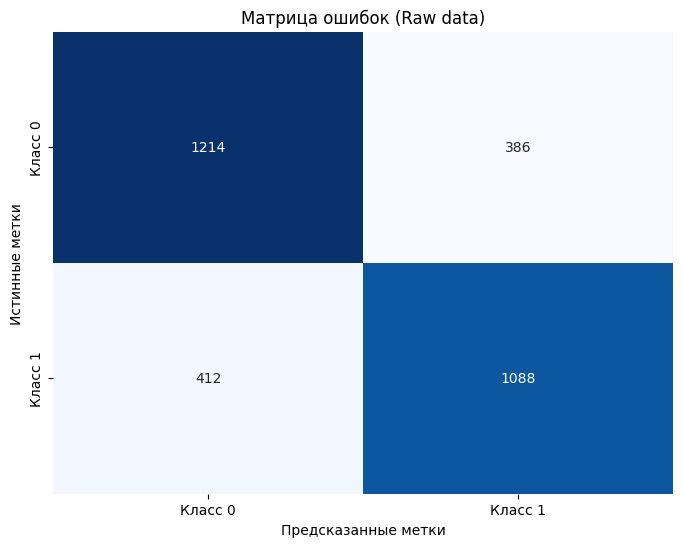

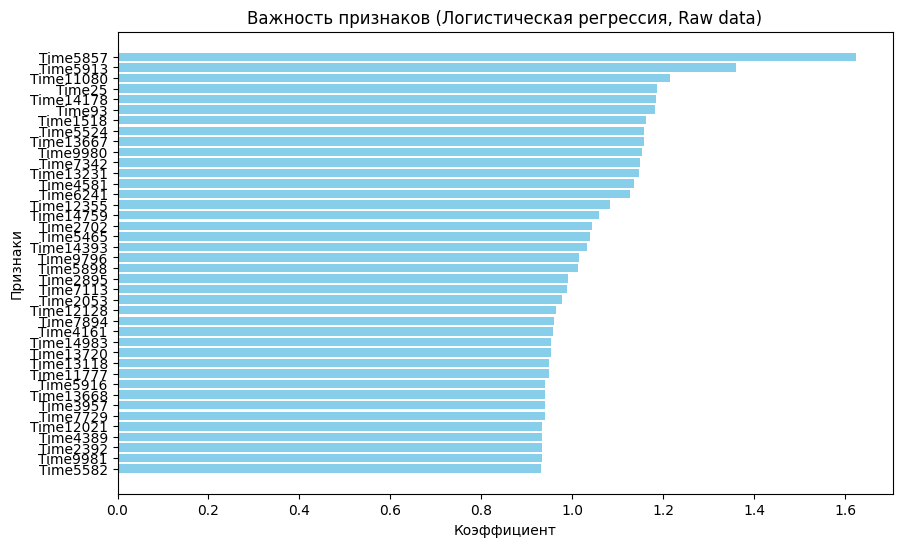

Результаты успешно сохранены в файл: models/classic_ml_models.csv
F1-score на тестовой выборке (All features): 0.52
Матрица ошибок:
[[1017  583]
 [ 772  728]]


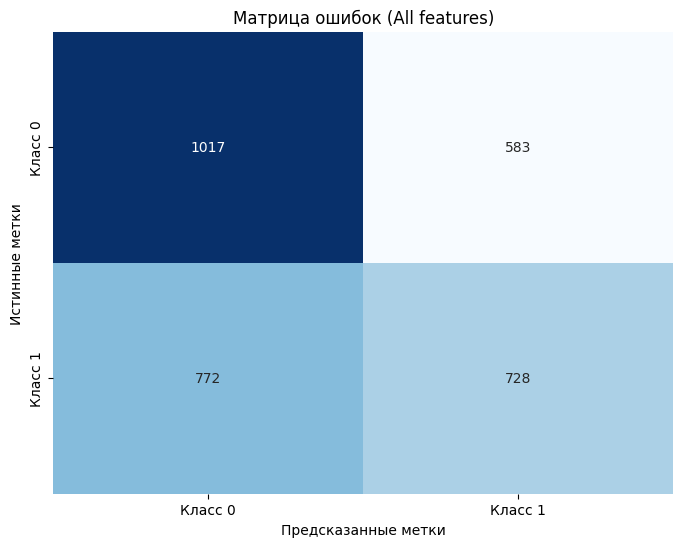

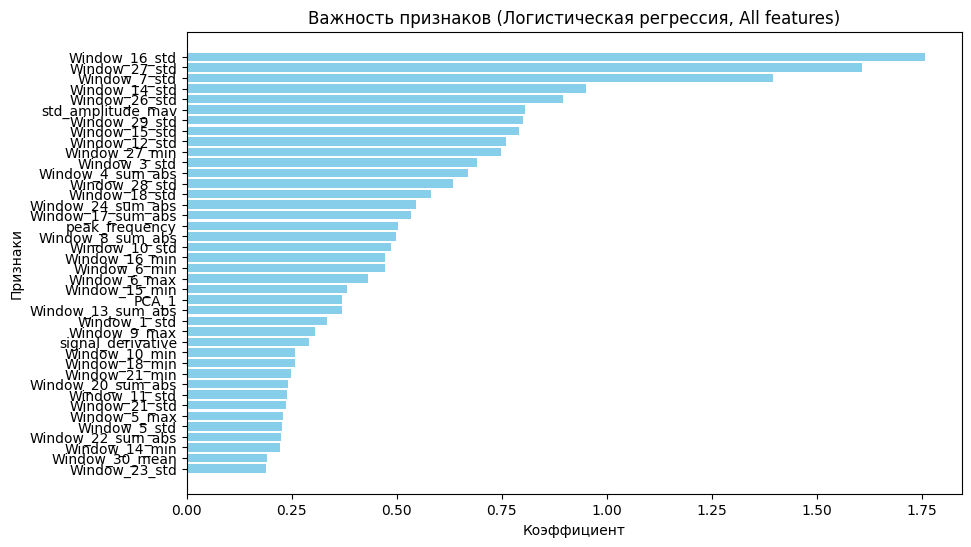

Результаты успешно сохранены в файл: models/classic_ml_models.csv
F1-score на тестовой выборке (Feature importance stability catboost): 0.40
Матрица ошибок:
[[1178  422]
 [1015  485]]


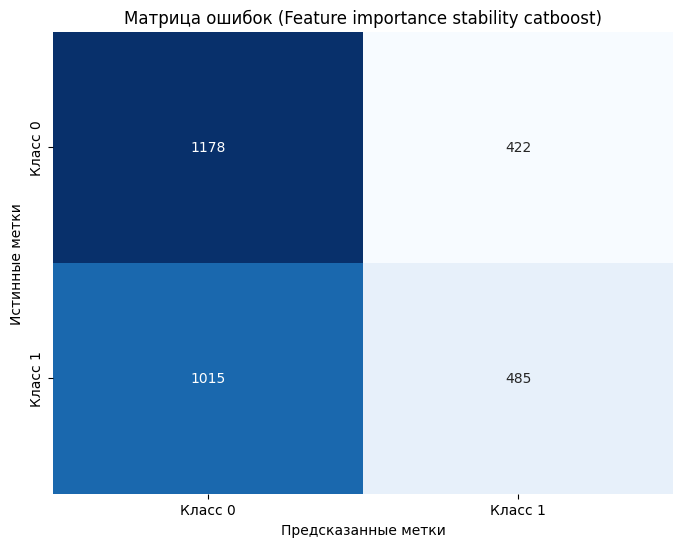

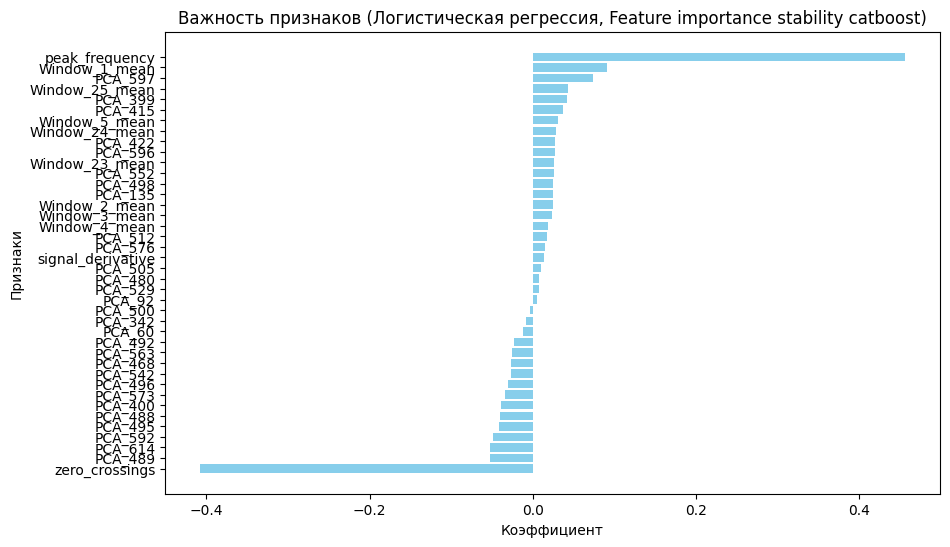

Результаты успешно сохранены в файл: models/classic_ml_models.csv
CPU times: user 26min 42s, sys: 52min 27s, total: 1h 19min 9s
Wall time: 7min 2s


In [ ]:
%%time

# Путь к файлу для сохранения результатов
path = "models/classic_ml_models.csv"

# Список конфигураций для перебора
configurations = [
    {"name": "Raw data", "data": df.iloc[:, :15000], "top_n_features": None},
    {"name": "All features", "data": df.iloc[:, 15000:].drop(columns=['target']), "top_n_features": None},
    # {"name": "Feature importance stability catboost", "data": df[feature_importances_catboost.sort_values(ascending=False).index[:40]], "top_n_features": 40}
    {"name": "Feature importance stability catboost", "data": df[stability_df_catboost.sort_values(by='Mean Importance', ascending=False)['Feature'][:40]], "top_n_features": 40}
]


# Перебор конфигураций
for config in configurations:
    # Конфигурация эксперимента
    feature_selection_configuration = config["name"]
    model_name = "LogisticRegression"
    explained_variance_ratio_PCA = round(cumulative_explained_variance[optimal_components], 2).item()
    window_size_column = window_size
    top_n_features_column = config["top_n_features"]

    # Выбираем данные в зависимости от конфигурации
    X_selected = config["data"]
    y = df['target']
    X_selected_with_participant = pd.concat([X_selected, df_raw['participant']], axis=1)
    y = df['target']
    # y = df.iloc[:3100, :]['target']
    
    # Генератор для кросс-валидации по участникам
    cv_scores = []
    for train_data, val_data, test_data in participant_based_cross_validation_with_validation_fold(pd.concat([X_selected_with_participant, y], axis=1)):
        # Разделяем данные на признаки и метки
        X_train, y_train = train_data.iloc[:, :-2], train_data.iloc[:, -1]
        X_val, y_val = val_data.iloc[:, :-2], val_data.iloc[:, -1]
        X_test, y_test = test_data.iloc[:, :-2], test_data.iloc[:, -1]
    
        # Масштабирование данных для логистической регрессии
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_val_scaled = scaler.transform(X_val)
        X_test_scaled = scaler.transform(X_test)
    
        # Обучение модели логистической регрессии
        model = LogisticRegression(
            penalty='l2',          # Регуляризация L2 (по умолчанию)
            C=1.0,                 # Обратная сила регуляризации
            solver='lbfgs',        # Оптимизатор
            max_iter=1000,         # Максимальное количество итераций
            random_state=42
        )
        model.fit(X_train_scaled, y_train)
    
        # Оценка качества модели на тестовой выборке
        y_pred = model.predict(X_test_scaled)
        f1 = f1_score(y_test, y_pred)
        cv_scores.append(f1)
        print(f"F1-score на текущей итерации: {f1:.2f}")
    
    # Усредняем результаты кросс-валидации
    mean_f1_cv = np.mean(cv_scores)
    print(f"Средняя F1-score на кросс-валидации: {mean_f1_cv:.2f}")
    
    # Построение матрицы ошибок для последнего разбиения
    cm = confusion_matrix(y_test, y_pred)
    print("Матрица ошибок:")
    print(cm)
    
    # Визуализация матрицы ошибок
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=["Класс 0", "Класс 1"],
                yticklabels=["Класс 0", "Класс 1"])
    plt.title("Матрица ошибок")
    plt.xlabel("Предсказанные метки")
    plt.ylabel("Истинные метки")
    plt.show()
    
    # Визуализация важности признаков (коэффициенты модели) для последней модели
    feature_importance = pd.DataFrame({
        'Feature': X_selected.columns,
        'Coefficient': model.coef_[0]  # Коэффициенты логистической регрессии
    }).sort_values(by='Coefficient', ascending=False)[:40]
    
    plt.figure(figsize=(10, 6))
    plt.barh(feature_importance['Feature'], feature_importance['Coefficient'], color='skyblue')
    plt.gca().invert_yaxis()  # Инвертируем ось Y для удобства чтения
    plt.title("Важность признаков (Логистическая регрессия)")
    plt.xlabel("Коэффициент")
    plt.ylabel("Признаки")
    plt.show()

    # Сохраняем результаты в CSV
    save_results_to_csv(new_result, file_path=path)

# ETNA

В ETNA есть экспериментальный блок с классификацией временных рядов https://docs.etna.ai/stable/tutorials/305-classification.html


Попробуем применить его на наших данных


Для ETNA не подходит базовый Python 3.11 как в колабе, поэтому откатываюсь до 3.10

In [ ]:
!python --version

Python 3.11.12


In [ ]:
# Установка зависимостей
!sudo apt-get update -y
!sudo apt-get install -y software-properties-common

# Установка Python 3.10
!sudo add-apt-repository ppa:deadsnakes/ppa -y
!sudo apt-get install python3.10 -y

# Установка pip для Python 3.10
!sudo apt-get install python3.10-distutils -y
!wget https://bootstrap.pypa.io/get-pip.py
!python3.10 get-pip.py

In [ ]:
# Создание алиаса для Python 3.10
!sudo update-alternatives --install /usr/bin/python3 python3 /usr/bin/python3.10 1
!sudo update-alternatives --config python3

In [ ]:
!python --version

In [ ]:
!pip uninstall etna -y

Found existing installation: etna 2.10.0
Uninstalling etna-2.10.0:
  Successfully uninstalled etna-2.10.0


In [ ]:
!pip uninstall "etna[all]" -y

In [ ]:
!pip cache purge

Files removed: 1789 (540.0 MB)


In [ ]:
!pip install etna

In [ ]:
!pip install "etna[all]"

In [ ]:
!{sys.executable} -m pip install etna

In [ ]:
import etna

In [ ]:
!pip install scipy==1.14.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.1/23.1 MB 619.3 kB/s eta 0:00:0000:0100:02
  Attempting uninstall: scipy
    Found existing installation: scipy 1.11.4
    Uninstalling scipy-1.11.4:
      Successfully uninstalled scipy-1.11.4

[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [ ]:
!pip install --upgrade scipy

  Using cached scipy-1.15.3-cp310-cp310-macosx_14_0_arm64.whl.metadata (61 kB)
Using cached scipy-1.15.3-cp310-cp310-macosx_14_0_arm64.whl (22.4 MB)
  Attempting uninstall: scipy
    Found existing installation: scipy 1.9.3
    Uninstalling scipy-1.9.3:
      Successfully uninstalled scipy-1.9.3

[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [ ]:
import pandas as pd
import numpy as np
from etna.datasets import TSDataset
from etna.experimental.classification.feature_extraction.tsfresh import TSFreshFeatureExtractor
from etna.experimental.classification.classification import TimeSeriesBinaryClassifier
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt

In [ ]:
import psutil
from IPython.display import display
import ipywidgets as widgets
import threading
import time

def update_memory_usage(label):
    while True:
        process = psutil.Process()
        memory_usage = process.memory_info().rss / 1024**2
        label.value = f"Memory usage: {memory_usage:.2f} MB"
        time.sleep(1)

# Создайте виджет
label = widgets.Label(value="Memory usage: Calculating...")
display(label)

# Запустите обновление в фоновом потоке
thread = threading.Thread(target=update_memory_usage, args=(label,))
thread.daemon = True
thread.start()

Label(value='Memory usage: Calculating...')

In [ ]:
import psutil
import time

def monitor_memory(interval=1):
    while True:
        process = psutil.Process()
        print(f"Memory usage: {process.memory_info().rss / 1024**2:.2f} MB")
        time.sleep(interval)


# Запустите мониторинг
monitor_memory()

Memory usage: 2740.39 MB
Memory usage: 2437.41 MB
Memory usage: 2437.44 MB
Memory usage: 2437.52 MB
Memory usage: 2437.55 MB
Memory usage: 2308.16 MB


KeyboardInterrupt: 

In [ ]:
%%time
# можно еще так попробовать
# Создаем пустой список для хранения данных
data_list = []

# Преобразуем данные
for _, row in df_raw.iterrows():
    participant = row['participant']
    signal_type = row['signal_type']
    channel = row['channel']
    dataset = row['dataset']
    intensity = row['intensity']
    class_label = row['binary_channel']
    values = row[:15000].values

    # Создаем временную метку
    timestamps = pd.date_range(start="2023-01-01", periods=len(values), freq="4ms").values  # NumPy array

    # Формируем segment
    segment = f"{participant}_{signal_type}_{intensity}_{channel}_{dataset}"

    # Готовим данные для добавления в список
    data_list.extend([
        {
            "timestamp": timestamps[i],
            "segment": segment,
            "target": values[i],
            "class_label": class_label
        }
        for i in range(len(values))
    ])

# Создаем DataFrame из списка словарей
df_etna = pd.DataFrame(data_list)

CPU times: user 33.5 s, sys: 15 s, total: 48.5 s
Wall time: 1min 17s


In [ ]:
# %%time
# # Создаем пустой список для хранения данных
# data_list = []

# # Преобразуем данные
# for _, row in df.iterrows():
#     participant = row['participant']
#     signal_type = row['signal_type']
#     channel = row['channel']
#     dataset = row['dataset']
#     intensity = row['intensity']
#     class_label = row['binary_channel']
#     values = row[:15000].values

#     # Создаем временную метку
#     timestamps = pd.date_range(start="2023-01-01", periods=len(values), freq="4ms").values  # NumPy array

#     # Формируем segment
#     segment = f"{participant}_{signal_type}_{intensity}_{channel}_{dataset}"

#     # Готовим данные для добавления в список
#     data_list.extend([
#         {
#             "timestamp": timestamp,
#             "segment": segment,
#             "target": value,
#             "class_label": class_label
#         }
#         for timestamp, value in zip(timestamps, values)
#     ])

# # Создаем DataFrame из списка словарей
# df_etna = pd.DataFrame(data_list)

CPU times: user 33.7 s, sys: 21.4 s, total: 55.1 s
Wall time: 1min 43s


In [ ]:
df_etna

,timestamp,segment,target,class_label
0,2023-01-01 00:00:00.000,1_delta_0.1_0_Cubes for spectra,7.772971,1
1,2023-01-01 00:00:00.004,1_delta_0.1_0_Cubes for spectra,30.677260,1
2,2023-01-01 00:00:00.008,1_delta_0.1_0_Cubes for spectra,53.414131,1
3,2023-01-01 00:00:00.012,1_delta_0.1_0_Cubes for spectra,75.881410,1
4,2023-01-01 00:00:00.016,1_delta_0.1_0_Cubes for spectra,97.975434,1
...,...,...,...,...
46499995,2023-01-01 00:00:59.980,2_gamma_1.0_30_Cubes for spectra,3.379856,1
46499996,2023-01-01 00:00:59.984,2_gamma_1.0_30_Cubes for spectra,1.138590,1
46499997,2023-01-01 00:00:59.988,2_gamma_1.0_30_Cubes for spectra,-1.836758,1
46499998,2023-01-01 00:00:59.992,2_gamma_1.0_30_Cubes for spectra,-3.280598,1


In [ ]:
# ts = TSDataset.to_dataset(df_etna)
ts = TSDataset(df=df_etna, freq="4ms")  # Частота данных: 4ms

In [ ]:
ts

segment                 1_alpha_0.1_0_Cubes for spectra              \
feature                                     class_label      target   
timestamp                                                             
2023-01-01 00:00:00.000                               1   -1.351959   
2023-01-01 00:00:00.004                               1   30.845713   
2023-01-01 00:00:00.008                               1   61.107166   
2023-01-01 00:00:00.012                               1   87.503109   
2023-01-01 00:00:00.016                               1  108.363776   
...                                                 ...         ...   
2023-01-01 00:00:59.980                               1    1.793616   
2023-01-01 00:00:59.984                               1   12.988689   
2023-01-01 00:00:59.988                               1   23.606233   
2023-01-01 00:00:59.992                               1   32.868202   
2023-01-01 00:00:59.996                               1   40.075005   

segment                 1_alpha_0.1_10_Cubes for spectra             \
feature                                      class_label     target   
timestamp                                                             
2023-01-01 00:00:00.000                                1  -4.229185   
2023-01-01 00:00:00.004                                1   3.273915   
2023-01-01 00:00:00.008                                1  10.583028   
2023-01-01 00:00:00.012                                1  17.235839   
2023-01-01 00:00:00.016                                1  22.812845   
...                                                  ...        ...   
2023-01-01 00:00:59.980                                1  -3.288106   
2023-01-01 00:00:59.984                                1  -0.480404   
2023-01-01 00:00:59.988                                1   2.438599   
2023-01-01 00:00:59.992                                1   5.273043   
2023-01-01 00:00:59.996                                1   7.827451   

segment                 1_alpha_0.1_11_Cubes for spectra            \
feature                                      class_label    target   
timestamp                                                            
2023-01-01 00:00:00.000                                0 -1.252372   
2023-01-01 00:00:00.004                                0 -2.245431   
2023-01-01 00:00:00.008                                0 -3.092954   
2023-01-01 00:00:00.012                                0 -3.748131   
2023-01-01 00:00:00.016                                0 -4.179705   
...                                                  ...       ...   
2023-01-01 00:00:59.980                                0 -6.770386   
2023-01-01 00:00:59.984                                0 -3.974009   
2023-01-01 00:00:59.988                                0 -0.873644   
2023-01-01 00:00:59.992                                0  2.307491   
2023-01-01 00:00:59.996                                0  5.341499   

segment                 1_alpha_0.1_12_Cubes for spectra             \
feature                                      class_label     target   
timestamp                                                             
2023-01-01 00:00:00.000                                1  -0.932636   
2023-01-01 00:00:00.004                                1  10.924619   
2023-01-01 00:00:00.008                                1  22.055931   
2023-01-01 00:00:00.012                                1  31.788555   
2023-01-01 00:00:00.016                                1  39.547910   
...                                                  ...        ...   
2023-01-01 00:00:59.980                                1   7.261585   
2023-01-01 00:00:59.984                                1   8.695407   
2023-01-01 00:00:59.988                                1   9.678055   
2023-01-01 00:00:59.992                                1  10.185201   
2023-01-01 00:00:59.996                                1  10.208689   

segment                 1_alpha_0.

In [ ]:
ts.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
1_alpha_0.1_0_Cubes for spectra,2023-01-01,2023-01-01 00:00:59.996,15000,0,3100,1,0,0,4ms
1_alpha_0.1_10_Cubes for spectra,2023-01-01,2023-01-01 00:00:59.996,15000,0,3100,1,0,0,4ms
1_alpha_0.1_11_Cubes for spectra,2023-01-01,2023-01-01 00:00:59.996,15000,0,3100,1,0,0,4ms
1_alpha_0.1_12_Cubes for spectra,2023-01-01,2023-01-01 00:00:59.996,15000,0,3100,1,0,0,4ms
1_alpha_0.1_13_Cubes for spectra,2023-01-01,2023-01-01 00:00:59.996,15000,0,3100,1,0,0,4ms
...,...,...,...,...,...,...,...,...,...
2_theta_1.0_5_Cubes for spectra,2023-01-01,2023-01-01 00:00:59.996,15000,0,3100,1,0,0,4ms
2_theta_1.0_6_Cubes for spectra,2023-01-01,2023-01-01 00:00:59.996,15000,0,3100,1,0,0,4ms
2_theta_1.0_7_Cubes for spectra,2023-01-01,2023-01-01 00:00:59.996,15000,0,3100,1,0,0,4ms


In [ ]:
tsfresh_feature_extractor = TSFreshFeatureExtractor(default_fc_parameters='efficient', fill_na_value=-100)

In [ ]:
df_etna.reset_index(drop=True)

,timestamp,segment,target,class_label
0,2023-01-01 00:00:00,1_delta,0.12,0
1,2023-01-01 00:00:04,1_delta,0.15,0
2,2023-01-01 00:00:08,1_delta,0.18,0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=i)

In [ ]:
X = df_raw.iloc[:, :15000]
y = df_raw['binary_channel']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

y_train = y_train.astype("int64")
y_test = y_test.astype("int64")

In [ ]:
X_train.index

Int64Index([1173,  168, 2589, 1011, 2978, 3042, 1967,  874, 1502, 1322,
            ...
             330, 1238,  466, 2169, 1638, 3092, 1095, 1130, 1294,  860],
           dtype='int64', length=2480)

In [ ]:
y_train.values

array([0, 0, 1, ..., 1, 0, 0])

In [ ]:
type(y_train.values)

numpy.ndarray

In [ ]:
%%time
# data_list = []

# # Преобразуем данные
# for _, row in df_raw.iterrows():
#     participant = row['participant']
#     signal_type = row['signal_type']
#     channel = row['channel']
#     dataset = row['dataset']
#     intensity = row['intensity']
#     class_label = row['binary_channel']
#     values = row[:15000].values

#     # Создаем временную метку
#     timestamps = pd.date_range(start="2023-01-01", periods=len(values), freq="4ms").values  # NumPy array

#     # Формируем segment
#     segment = f"{participant}_{signal_type}_{intensity}_{channel}_{dataset}"

#     # Готовим данные для добавления в список
#     data_list.extend([
#         {
#             "timestamp": timestamps[i],
#             "segment": segment,
#             "target": values[i],
#             "class_label": class_label
#         }
#         for i in range(len(values))
#     ])

# # Создаем DataFrame из списка словарей
# df_etna = pd.DataFrame(data_list)

# Преобразуем данные в формат TSDataset
# ts = TSDataset.to_dataset(df_etna)
# ts = TSDataset(df=df_etna, freq="4ms")  # Частота данных: 4ms

# Извлечение признаков
feature_extractor = TSFreshFeatureExtractor(default_fc_parameters="efficient")

model = LogisticRegression(max_iter=1000)
clf = TimeSeriesBinaryClassifier(feature_extractor=feature_extractor, classifier=model)

from sklearn.model_selection import KFold
mask = np.zeros(len(X_train))
for fold_idx, (train_index, test_index) in enumerate(KFold(n_splits=5).split(X_train)):
    mask[test_index] = fold_idx


metrics = clf.masked_crossval_score(x=X_train, y=y_train, mask=mask)

metrics

ValueError: If using all scalar values, you must pass an index

In [ ]:
# import pandas as pd
# import numpy as np
# from etna.datasets import TSDataset
# from etna.experimental.classification.feature_extraction import TSFreshFeatureExtractor
# from etna.experimental.classification import TimeSeriesBinaryClassifier
# from sklearn.metrics import f1_score
# import matplotlib.pyplot as plt

# Создаем пустой список для хранения данных
data_list = []

# Преобразуем данные
for _, row in df_raw.iterrows():
    participant = row['participant']
    signal_type = row['signal_type']
    channel = row['channel']
    dataset = row['dataset']
    intensity = row['intensity']
    class_label = row['binary_channel']
    values = row[:15000].values

    # Создаем временную метку
    timestamps = pd.date_range(start="2023-01-01", periods=len(values), freq="4ms").values  # NumPy array

    # Формируем segment
    segment = f"{participant}_{signal_type}_{intensity}_{channel}_{dataset}"

    # Готовим данные для добавления в список
    data_list.extend([
        {
            "timestamp": timestamps[i],
            "segment": segment,
            "target": values[i],
            "class_label": class_label
        }
        for i in range(len(values))
    ])

# Создаем DataFrame из списка словарей
df_etna = pd.DataFrame(data_list)

# Преобразуем данные в формат TSDataset
# ts = TSDataset.to_dataset(df_etna)
ts = TSDataset(df=df_etna, freq="4ms")  # Частота данных: 4ms

# Извлечение признаков
feature_extractor = TSFreshFeatureExtractor(default_fc_parameters="efficient")
X = feature_extractor.fit_transform(ts)

# Метки классов
y = df_etna.groupby('segment')['class_label'].first()

# Обучение классификатора
classifier = TimeSeriesBinaryClassifier()
classifier.fit(X, y)

# Предсказание
y_pred = classifier.predict(X)

# Оценка качества с использованием F1-score
f1 = f1_score(y, y_pred)
print(f"F1-score: {f1:.2f}")

# Просмотр извлеченных признаков
extracted_features = feature_extractor.get_features_data()
print("Извлеченные признаки:")
print(extracted_features.head())

# Вклад признаков в предсказание
if hasattr(classifier.model, 'feature_importances_'):
    feature_importances = pd.DataFrame({
        'Feature': extracted_features.columns,
        'Importance': classifier.model.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    print("\nВклад признаков в предсказание:")
    print(feature_importances.head(10))

    # Визуализация важности признаков
    plt.figure(figsize=(10, 6))
    plt.barh(feature_importances['Feature'][:10], feature_importances['Importance'][:10], color='skyblue')
    plt.gca().invert_yaxis()  # Инвертируем ось Y для удобства чтения
    plt.title("Важность признаков")
    plt.xlabel("Важность")
    plt.ylabel("Признаки")
    plt.show()
else:
    print("Модель не поддерживает вывод важности признаков.")


TypeError: object of type 'int' has no len()

In [ ]:
# Создаем пустой DataFrame для нового формата
df_etna = []

# Преобразуем данные
for _, row in df.iterrows():
    participant = row['participant']
    signal_type_encoded = row['signal_type_encoded']
    class_label = row['target']
    values = row[:15000].values  # Значения временного ряда (первые 15000 столбцов)

    # Создаем временную метку
    timestamps = pd.date_range(start="2023-01-01", periods=len(values), freq="4ms")  # 1/250 секунды = 4ms

    # Формируем segment
    segment = f"{participant}_{signal_type_encoded}"

    # Добавляем данные в новый формат
    for timestamp, value in zip(timestamps, values):
        df_etna.append({
            "timestamp": timestamp,
            "segment": segment,
            "target": value,
            "class_label": class_label
        })

# Создаем DataFrame в новом формате
df_etna = pd.DataFrame(df_etna)

In [ ]:
df_etna.head(30)

In [ ]:
import pandas as pd
import numpy as np
from etna.datasets import TSDataset
from etna.experimental.classification.feature_extraction import TSFreshFeatureExtractor
from etna.experimental.classification import TimeSeriesBinaryClassifier
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt

# Исходный датасет
# Предположим, что данные выглядят так:
# participant, signal_type_encoded, class_label, value_1, value_2, ..., value_15000
df = pd.read_csv("your_dataset.csv")

# Создаем пустой DataFrame для нового формата
df_etna = []

# Преобразуем данные
for _, row in df.iterrows():
    participant = row['participant']
    signal_type_encoded = row['signal_type_encoded']
    class_label = row['class_label']
    values = row[3:].values  # Значения временного ряда (первые 15000 столбцов)

    # Создаем временную метку
    timestamps = pd.date_range(start="2023-01-01", periods=len(values), freq="4ms")  # 1/250 секунды = 4ms

    # Формируем segment
    segment = f"{participant}_{signal_type_encoded}"

    # Добавляем данные в новый формат
    for timestamp, value in zip(timestamps, values):
        df_etna.append({
            "timestamp": timestamp,
            "segment": segment,
            "target": value,
            "class_label": class_label
        })

# Создаем DataFrame в новом формате
df_etna = pd.DataFrame(df_etna)

# Преобразуем данные в формат TSDataset
ts = TSDataset.to_dataset(df_etna)
ts = TSDataset(df=ts, freq="4ms")  # Частота данных: 4ms

# Извлечение признаков
feature_extractor = TSFreshFeatureExtractor(default_fc_parameters="efficient")
X = feature_extractor.fit_transform(ts)

# Метки классов
y = df_etna.groupby('segment')['class_label'].first()

# Обучение классификатора
classifier = TimeSeriesBinaryClassifier()
classifier.fit(X, y)

# Предсказание
y_pred = classifier.predict(X)

# Оценка качества с использованием F1-score
f1 = f1_score(y, y_pred)
print(f"F1-score: {f1:.2f}")

# Просмотр извлеченных признаков
extracted_features = feature_extractor.get_features_data()
print("Извлеченные признаки:")
print(extracted_features.head())

# Вклад признаков в предсказание
if hasattr(classifier.model, 'feature_importances_'):
    feature_importances = pd.DataFrame({
        'Feature': extracted_features.columns,
        'Importance': classifier.model.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    print("\nВклад признаков в предсказание:")
    print(feature_importances.head(10))

    # Визуализация важности признаков
    plt.figure(figsize=(10, 6))
    plt.barh(feature_importances['Feature'][:10], feature_importances['Importance'][:10], color='skyblue')
    plt.gca().invert_yaxis()  # Инвертируем ось Y для удобства чтения
    plt.title("Важность признаков")
    plt.xlabel("Важность")
    plt.ylabel("Признаки")
    plt.show()
else:
    print("Модель не поддерживает вывод важности признаков.")

# DL

### Функция для обучения модели

In [5]:
def train_and_evaluate_model(model, X_train, y_train, X_val, y_val, X_test, y_test,
                             criterion, optimizer, num_epochs, device,
                             save_model_path=None, scheduler=None):
    """
    Обучение модели и оценка метрик на тренировочных, валидационных и тестовых данных.

    Параметры:
    - model: Модель PyTorch.
    - X_train, y_train: Тренировочные данные.
    - X_val, y_val: Валидационные данные.
    - X_test, y_test: Тестовые данные.
    - criterion: Функция потерь.
    - optimizer: Оптимизатор.
    - num_epochs: Количество эпох.
    - device: Устройство (CPU или GPU).
    - save_model_path: Путь для сохранения модели. Если None, модель не сохраняется.
    - scheduler: Планировщик скорости обучения (Learning Rate Scheduler). Если None, не используется.

    Возвращает:
    - test_loss: Потери на тестовых данных.
    - test_f1: F1-score на тестовых данных.
    """
    # Перевод данных на устройство
    X_train_tensor = X_train.to(device)
    y_train_tensor = y_train.to(device)
    X_val_tensor = X_val.to(device)
    y_val_tensor = y_val.to(device)
    X_test_tensor = X_test.to(device)
    y_test_tensor = y_test.to(device)

    # Логирование метрик
    train_losses = []
    train_f1_scores = []
    val_losses = []
    val_f1_scores = []

    # Обучение модели
    for epoch in tqdm(range(num_epochs), desc="Epochs", unit="epoch"):
        model.train()
        optimizer.zero_grad()

        # Прямое распространение
        outputs = model(X_train_tensor)

        # Вычисление потерь
        loss = criterion(outputs, y_train_tensor)

        # Обратное распространение и обновление параметров
        loss.backward()
        optimizer.step()

        # Шаг планировщика скорости обучения
        if scheduler is not None:
            scheduler.step()

        # Вычисление F1-score на тренировочных данных
        _, predicted = torch.max(outputs, 1)
        train_f1 = f1_score(y_train_tensor.cpu().numpy(), predicted.cpu().numpy(), average='weighted')

        # Сохранение метрик
        train_losses.append(loss.item())
        train_f1_scores.append(train_f1)

        # Тестирование на валидационных данных
        model.eval()
        with torch.no_grad():
            val_outputs = model(X_val_tensor)
            val_loss = criterion(val_outputs, y_val_tensor)

            _, val_predicted = torch.max(val_outputs, 1)
            val_f1 = f1_score(y_val_tensor.cpu().numpy(), val_predicted.cpu().numpy(), average='weighted')

            val_losses.append(val_loss.item())
            val_f1_scores.append(val_f1)

        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train F1-Score: {train_f1:.4f}, "
              f"Validation Loss: {val_loss.item():.4f}, Validation F1-Score: {val_f1:.4f}")

    # Финальное предсказание на тестовых данных
    model.eval()
    with torch.no_grad():
        test_outputs = model(X_test_tensor)
        test_loss = criterion(test_outputs, y_test_tensor)

        _, test_predicted = torch.max(test_outputs, 1)
        test_f1 = f1_score(y_test_tensor.cpu().numpy(), test_predicted.cpu().numpy(), average='weighted')

    print(f"Test Loss: {test_loss.item():.4f}, Test F1-Score: {test_f1:.4f}")

    # Сохранение модели, если указан путь
    if save_model_path:
        torch.save(model.state_dict(), save_model_path)
        print("Модель сохранена.")

    # Визуализация метрик на одном графике
    plt.figure(figsize=(12, 6))

    # Основной график (потери)
    ax1 = plt.gca()  # Основная ось для Loss
    ax1.plot(train_losses, label='Train Loss', color='tab:blue')
    ax1.plot(val_losses, label='Validation Loss', color='tab:orange')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.tick_params(axis='y')
    ax1.legend(loc='upper left')

    # Дополнительная ось для F1-score
    ax2 = ax1.twinx()  # Вторая ось для F1-score
    ax2.plot(train_f1_scores, label='Train F1-Score', color='tab:green', linestyle='--')
    ax2.plot(val_f1_scores, label='Validation F1-Score', color='tab:red', linestyle='--')
    ax2.set_ylabel('F1-Score')
    ax2.tick_params(axis='y')
    ax2.legend(loc='upper right')

    # Общие настройки
    plt.title('Loss and F1-Score over Epochs')
    plt.tight_layout()
    plt.show()

    return test_loss.item(), test_f1

## Воспроизводим модель из статьи

In [ ]:
# Определение модели
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()

        # Определение слоев
        layers = []
        current_size = input_size

        for hidden_size in hidden_sizes:
            layers.append(nn.Linear(current_size, hidden_size))  # Полносвязный слой
            layers.append(nn.BatchNorm1d(hidden_size))  # Batch Normalization
            layers.append(nn.Tanh())  # Активация Tanh
            current_size = hidden_size

        # Выходной слой с Softmax
        layers.append(nn.Linear(hidden_sizes[-1], output_size))
        layers.append(nn.Softmax(dim=1))

        # Создание последовательности слоев
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

In [ ]:
# Параметры модели
input_size = 15000  # Размер входных данных
hidden_sizes = [2500, 1000, 500, 200, 100, 50, 25, 15]  # Размеры скрытых слоев
output_size = 2  # Размер выходного слоя (два класса)

# исходный датасет
X_selected = df.iloc[:, :15000]

X_selected_with_participant = pd.concat([X_selected, df_raw['participant']], axis=1)
y = df['target']

Epochs:   1%|▌                                                        | 1/100 [00:02<04:13,  2.56s/epoch]

Epoch [1/100], Loss: 0.7004, Train F1-Score: 0.4874, Validation Loss: 0.6891, Validation F1-Score: 0.5470


Epochs:   2%|█▏                                                       | 2/100 [00:04<04:01,  2.46s/epoch]

Epoch [2/100], Loss: 0.6517, Train F1-Score: 0.6936, Validation Loss: 0.6728, Validation F1-Score: 0.6783


Epochs:   3%|█▋                                                       | 3/100 [00:07<03:58,  2.46s/epoch]

Epoch [3/100], Loss: 0.5861, Train F1-Score: 0.7684, Validation Loss: 0.6712, Validation F1-Score: 0.6841


Epochs:   4%|██▎                                                      | 4/100 [00:09<03:56,  2.46s/epoch]

Epoch [4/100], Loss: 0.5755, Train F1-Score: 0.7681, Validation Loss: 0.6647, Validation F1-Score: 0.6747


Epochs:   5%|██▊                                                      | 5/100 [00:12<03:53,  2.45s/epoch]

Epoch [5/100], Loss: 0.5894, Train F1-Score: 0.7301, Validation Loss: 0.6606, Validation F1-Score: 0.6987


Epochs:   6%|███▍                                                     | 6/100 [00:14<03:48,  2.43s/epoch]

Epoch [6/100], Loss: 0.5819, Train F1-Score: 0.7554, Validation Loss: 0.6567, Validation F1-Score: 0.7112


Epochs:   7%|███▉                                                     | 7/100 [00:17<03:48,  2.46s/epoch]

Epoch [7/100], Loss: 0.5475, Train F1-Score: 0.8141, Validation Loss: 0.6453, Validation F1-Score: 0.7341


Epochs:   8%|████▌                                                    | 8/100 [00:19<03:47,  2.47s/epoch]

Epoch [8/100], Loss: 0.5304, Train F1-Score: 0.8317, Validation Loss: 0.6416, Validation F1-Score: 0.7257


Epochs:   9%|█████▏                                                   | 9/100 [00:22<03:42,  2.44s/epoch]

Epoch [9/100], Loss: 0.5209, Train F1-Score: 0.8415, Validation Loss: 0.6396, Validation F1-Score: 0.7434


Epochs:  10%|█████▌                                                  | 10/100 [00:24<03:37,  2.42s/epoch]

Epoch [10/100], Loss: 0.5088, Train F1-Score: 0.8633, Validation Loss: 0.6410, Validation F1-Score: 0.7513


Epochs:  11%|██████▏                                                 | 11/100 [00:26<03:34,  2.41s/epoch]

Epoch [11/100], Loss: 0.4962, Train F1-Score: 0.8963, Validation Loss: 0.6209, Validation F1-Score: 0.7637


Epochs:  12%|██████▋                                                 | 12/100 [00:29<03:31,  2.41s/epoch]

Epoch [12/100], Loss: 0.4891, Train F1-Score: 0.8943, Validation Loss: 0.6278, Validation F1-Score: 0.7723


Epochs:  13%|███████▎                                                | 13/100 [00:31<03:29,  2.41s/epoch]

Epoch [13/100], Loss: 0.4758, Train F1-Score: 0.9172, Validation Loss: 0.6071, Validation F1-Score: 0.7682


Epochs:  14%|███████▊                                                | 14/100 [00:34<03:26,  2.40s/epoch]

Epoch [14/100], Loss: 0.4802, Train F1-Score: 0.8975, Validation Loss: 0.6209, Validation F1-Score: 0.7684


Epochs:  15%|████████▍                                               | 15/100 [00:36<03:23,  2.39s/epoch]

Epoch [15/100], Loss: 0.4730, Train F1-Score: 0.9164, Validation Loss: 0.6170, Validation F1-Score: 0.7754


Epochs:  16%|████████▉                                               | 16/100 [00:38<03:22,  2.41s/epoch]

Epoch [16/100], Loss: 0.4668, Train F1-Score: 0.9252, Validation Loss: 0.5906, Validation F1-Score: 0.7857


Epochs:  17%|█████████▌                                              | 17/100 [00:41<03:21,  2.42s/epoch]

Epoch [17/100], Loss: 0.4588, Train F1-Score: 0.9308, Validation Loss: 0.5977, Validation F1-Score: 0.8026


Epochs:  18%|██████████                                              | 18/100 [00:43<03:18,  2.41s/epoch]

Epoch [18/100], Loss: 0.4472, Train F1-Score: 0.9511, Validation Loss: 0.5976, Validation F1-Score: 0.8126


Epochs:  19%|██████████▋                                             | 19/100 [00:46<03:16,  2.42s/epoch]

Epoch [19/100], Loss: 0.4396, Train F1-Score: 0.9644, Validation Loss: 0.5780, Validation F1-Score: 0.8138


Epochs:  20%|███████████▏                                            | 20/100 [00:48<03:12,  2.40s/epoch]

Epoch [20/100], Loss: 0.4344, Train F1-Score: 0.9626, Validation Loss: 0.5878, Validation F1-Score: 0.8529


Epochs:  21%|███████████▊                                            | 21/100 [00:50<03:09,  2.40s/epoch]

Epoch [21/100], Loss: 0.4228, Train F1-Score: 0.9820, Validation Loss: 0.5599, Validation F1-Score: 0.8323


Epochs:  22%|████████████▎                                           | 22/100 [00:53<03:07,  2.40s/epoch]

Epoch [22/100], Loss: 0.4244, Train F1-Score: 0.9741, Validation Loss: 0.5783, Validation F1-Score: 0.8465


Epochs:  23%|████████████▉                                           | 23/100 [00:55<03:04,  2.40s/epoch]

Epoch [23/100], Loss: 0.4169, Train F1-Score: 0.9865, Validation Loss: 0.5481, Validation F1-Score: 0.8407


Epochs:  24%|█████████████▍                                          | 24/100 [00:58<03:02,  2.40s/epoch]

Epoch [24/100], Loss: 0.4177, Train F1-Score: 0.9783, Validation Loss: 0.5615, Validation F1-Score: 0.8607


Epochs:  25%|██████████████                                          | 25/100 [01:00<02:59,  2.39s/epoch]

Epoch [25/100], Loss: 0.4099, Train F1-Score: 0.9888, Validation Loss: 0.5424, Validation F1-Score: 0.8668


Epochs:  26%|██████████████▌                                         | 26/100 [01:03<03:02,  2.47s/epoch]

Epoch [26/100], Loss: 0.4065, Train F1-Score: 0.9890, Validation Loss: 0.5484, Validation F1-Score: 0.8787


Epochs:  27%|███████████████                                         | 27/100 [01:05<02:57,  2.44s/epoch]

Epoch [27/100], Loss: 0.4026, Train F1-Score: 0.9937, Validation Loss: 0.5262, Validation F1-Score: 0.8768


Epochs:  28%|███████████████▋                                        | 28/100 [01:07<02:54,  2.42s/epoch]

Epoch [28/100], Loss: 0.4015, Train F1-Score: 0.9924, Validation Loss: 0.5421, Validation F1-Score: 0.8910


Epochs:  29%|████████████████▏                                       | 29/100 [01:10<02:51,  2.41s/epoch]

Epoch [29/100], Loss: 0.3994, Train F1-Score: 0.9948, Validation Loss: 0.5124, Validation F1-Score: 0.8639


Epochs:  30%|████████████████▊                                       | 30/100 [01:12<02:49,  2.41s/epoch]

Epoch [30/100], Loss: 0.4015, Train F1-Score: 0.9913, Validation Loss: 0.5249, Validation F1-Score: 0.8916


Epochs:  31%|█████████████████▎                                      | 31/100 [01:15<02:47,  2.43s/epoch]

Epoch [31/100], Loss: 0.3970, Train F1-Score: 0.9946, Validation Loss: 0.5133, Validation F1-Score: 0.8884


Epochs:  32%|█████████████████▉                                      | 32/100 [01:17<02:45,  2.43s/epoch]

Epoch [32/100], Loss: 0.3960, Train F1-Score: 0.9945, Validation Loss: 0.5179, Validation F1-Score: 0.8962


Epochs:  33%|██████████████████▍                                     | 33/100 [01:20<02:43,  2.44s/epoch]

Epoch [33/100], Loss: 0.3944, Train F1-Score: 0.9956, Validation Loss: 0.5017, Validation F1-Score: 0.8916


Epochs:  34%|███████████████████                                     | 34/100 [01:22<02:43,  2.47s/epoch]

Epoch [34/100], Loss: 0.3940, Train F1-Score: 0.9953, Validation Loss: 0.5105, Validation F1-Score: 0.8962


Epochs:  35%|███████████████████▌                                    | 35/100 [01:25<02:41,  2.48s/epoch]

Epoch [35/100], Loss: 0.3922, Train F1-Score: 0.9966, Validation Loss: 0.4956, Validation F1-Score: 0.8926


Epochs:  36%|████████████████████▏                                   | 36/100 [01:27<02:38,  2.48s/epoch]

Epoch [36/100], Loss: 0.3918, Train F1-Score: 0.9966, Validation Loss: 0.5045, Validation F1-Score: 0.8974


Epochs:  37%|████████████████████▋                                   | 37/100 [01:30<02:37,  2.49s/epoch]

Epoch [37/100], Loss: 0.3910, Train F1-Score: 0.9965, Validation Loss: 0.4901, Validation F1-Score: 0.8929


Epochs:  38%|█████████████████████▎                                  | 38/100 [01:32<02:32,  2.47s/epoch]

Epoch [38/100], Loss: 0.3908, Train F1-Score: 0.9961, Validation Loss: 0.4967, Validation F1-Score: 0.9007


Epochs:  39%|█████████████████████▊                                  | 39/100 [01:34<02:29,  2.45s/epoch]

Epoch [39/100], Loss: 0.3893, Train F1-Score: 0.9973, Validation Loss: 0.4872, Validation F1-Score: 0.8945


Epochs:  40%|██████████████████████▍                                 | 40/100 [01:37<02:26,  2.44s/epoch]

Epoch [40/100], Loss: 0.3888, Train F1-Score: 0.9973, Validation Loss: 0.4923, Validation F1-Score: 0.9020


Epochs:  41%|██████████████████████▉                                 | 41/100 [01:39<02:27,  2.50s/epoch]

Epoch [41/100], Loss: 0.3881, Train F1-Score: 0.9978, Validation Loss: 0.4837, Validation F1-Score: 0.8936


Epochs:  42%|███████████████████████▌                                | 42/100 [01:42<02:23,  2.48s/epoch]

Epoch [42/100], Loss: 0.3878, Train F1-Score: 0.9973, Validation Loss: 0.4886, Validation F1-Score: 0.9039


Epochs:  43%|████████████████████████                                | 43/100 [01:44<02:20,  2.47s/epoch]

Epoch [43/100], Loss: 0.3871, Train F1-Score: 0.9976, Validation Loss: 0.4801, Validation F1-Score: 0.8968


Epochs:  44%|████████████████████████▋                               | 44/100 [01:47<02:17,  2.45s/epoch]

Epoch [44/100], Loss: 0.3870, Train F1-Score: 0.9972, Validation Loss: 0.4853, Validation F1-Score: 0.9039


Epochs:  45%|█████████████████████████▏                              | 45/100 [01:49<02:13,  2.43s/epoch]

Epoch [45/100], Loss: 0.3862, Train F1-Score: 0.9976, Validation Loss: 0.4783, Validation F1-Score: 0.8971


Epochs:  46%|█████████████████████████▊                              | 46/100 [01:52<02:11,  2.44s/epoch]

Epoch [46/100], Loss: 0.3859, Train F1-Score: 0.9977, Validation Loss: 0.4830, Validation F1-Score: 0.9032


Epochs:  47%|██████████████████████████▎                             | 47/100 [01:54<02:09,  2.45s/epoch]

Epoch [47/100], Loss: 0.3856, Train F1-Score: 0.9976, Validation Loss: 0.4757, Validation F1-Score: 0.8987


Epochs:  48%|██████████████████████████▉                             | 48/100 [01:57<02:08,  2.47s/epoch]

Epoch [48/100], Loss: 0.3854, Train F1-Score: 0.9975, Validation Loss: 0.4806, Validation F1-Score: 0.9032


Epochs:  49%|███████████████████████████▍                            | 49/100 [01:59<02:05,  2.46s/epoch]

Epoch [49/100], Loss: 0.3848, Train F1-Score: 0.9978, Validation Loss: 0.4731, Validation F1-Score: 0.8981


Epochs:  50%|████████████████████████████                            | 50/100 [02:01<02:01,  2.44s/epoch]

Epoch [50/100], Loss: 0.3847, Train F1-Score: 0.9974, Validation Loss: 0.4782, Validation F1-Score: 0.9045


Epochs:  51%|████████████████████████████▌                           | 51/100 [02:04<02:00,  2.45s/epoch]

Epoch [51/100], Loss: 0.3841, Train F1-Score: 0.9977, Validation Loss: 0.4707, Validation F1-Score: 0.8991


Epochs:  52%|█████████████████████████████                           | 52/100 [02:06<01:57,  2.44s/epoch]

Epoch [52/100], Loss: 0.3837, Train F1-Score: 0.9981, Validation Loss: 0.4766, Validation F1-Score: 0.9032


Epochs:  53%|█████████████████████████████▋                          | 53/100 [02:09<01:53,  2.42s/epoch]

Epoch [53/100], Loss: 0.3835, Train F1-Score: 0.9975, Validation Loss: 0.4697, Validation F1-Score: 0.8987


Epochs:  54%|██████████████████████████████▏                         | 54/100 [02:11<01:50,  2.41s/epoch]

Epoch [54/100], Loss: 0.3834, Train F1-Score: 0.9974, Validation Loss: 0.4745, Validation F1-Score: 0.9058


Epochs:  55%|██████████████████████████████▊                         | 55/100 [02:13<01:48,  2.42s/epoch]

Epoch [55/100], Loss: 0.3828, Train F1-Score: 0.9976, Validation Loss: 0.4692, Validation F1-Score: 0.8984


Epochs:  56%|███████████████████████████████▎                        | 56/100 [02:16<01:46,  2.42s/epoch]

Epoch [56/100], Loss: 0.3827, Train F1-Score: 0.9975, Validation Loss: 0.4729, Validation F1-Score: 0.9068


Epochs:  57%|███████████████████████████████▉                        | 57/100 [02:18<01:43,  2.41s/epoch]

Epoch [57/100], Loss: 0.3820, Train F1-Score: 0.9983, Validation Loss: 0.4679, Validation F1-Score: 0.9003


Epochs:  58%|████████████████████████████████▍                       | 58/100 [02:21<01:41,  2.41s/epoch]

Epoch [58/100], Loss: 0.3819, Train F1-Score: 0.9978, Validation Loss: 0.4728, Validation F1-Score: 0.9036


Epochs:  59%|█████████████████████████████████                       | 59/100 [02:23<01:38,  2.40s/epoch]

Epoch [59/100], Loss: 0.3817, Train F1-Score: 0.9976, Validation Loss: 0.4669, Validation F1-Score: 0.9003


Epochs:  60%|█████████████████████████████████▌                      | 60/100 [02:26<01:36,  2.41s/epoch]

Epoch [60/100], Loss: 0.3814, Train F1-Score: 0.9977, Validation Loss: 0.4705, Validation F1-Score: 0.9058


Epochs:  61%|██████████████████████████████████▏                     | 61/100 [02:28<01:33,  2.40s/epoch]

Epoch [61/100], Loss: 0.3807, Train F1-Score: 0.9984, Validation Loss: 0.4661, Validation F1-Score: 0.9023


Epochs:  62%|██████████████████████████████████▋                     | 62/100 [02:30<01:30,  2.39s/epoch]

Epoch [62/100], Loss: 0.3809, Train F1-Score: 0.9977, Validation Loss: 0.4698, Validation F1-Score: 0.9042


Epochs:  63%|███████████████████████████████████▎                    | 63/100 [02:33<01:28,  2.38s/epoch]

Epoch [63/100], Loss: 0.3804, Train F1-Score: 0.9982, Validation Loss: 0.4660, Validation F1-Score: 0.9020


Epochs:  64%|███████████████████████████████████▊                    | 64/100 [02:35<01:25,  2.39s/epoch]

Epoch [64/100], Loss: 0.3801, Train F1-Score: 0.9982, Validation Loss: 0.4688, Validation F1-Score: 0.9055


Epochs:  65%|████████████████████████████████████▍                   | 65/100 [02:37<01:24,  2.41s/epoch]

Epoch [65/100], Loss: 0.3798, Train F1-Score: 0.9983, Validation Loss: 0.4653, Validation F1-Score: 0.9036


Epochs:  66%|████████████████████████████████████▉                   | 66/100 [02:40<01:21,  2.40s/epoch]

Epoch [66/100], Loss: 0.3796, Train F1-Score: 0.9982, Validation Loss: 0.4681, Validation F1-Score: 0.9055


Epochs:  67%|█████████████████████████████████████▌                  | 67/100 [02:42<01:19,  2.39s/epoch]

Epoch [67/100], Loss: 0.3793, Train F1-Score: 0.9984, Validation Loss: 0.4648, Validation F1-Score: 0.9026


Epochs:  68%|██████████████████████████████████████                  | 68/100 [02:45<01:16,  2.40s/epoch]

Epoch [68/100], Loss: 0.3792, Train F1-Score: 0.9981, Validation Loss: 0.4679, Validation F1-Score: 0.9055


Epochs:  69%|██████████████████████████████████████▋                 | 69/100 [02:47<01:14,  2.41s/epoch]

Epoch [69/100], Loss: 0.3789, Train F1-Score: 0.9983, Validation Loss: 0.4647, Validation F1-Score: 0.9029


Epochs:  70%|███████████████████████████████████████▏                | 70/100 [02:49<01:11,  2.40s/epoch]

Epoch [70/100], Loss: 0.3787, Train F1-Score: 0.9984, Validation Loss: 0.4672, Validation F1-Score: 0.9042


Epochs:  71%|███████████████████████████████████████▊                | 71/100 [02:52<01:09,  2.40s/epoch]

Epoch [71/100], Loss: 0.3787, Train F1-Score: 0.9980, Validation Loss: 0.4643, Validation F1-Score: 0.9042


Epochs:  72%|████████████████████████████████████████▎               | 72/100 [02:54<01:07,  2.41s/epoch]

Epoch [72/100], Loss: 0.3785, Train F1-Score: 0.9982, Validation Loss: 0.4657, Validation F1-Score: 0.9039


Epochs:  73%|████████████████████████████████████████▉               | 73/100 [02:57<01:05,  2.42s/epoch]

Epoch [73/100], Loss: 0.3783, Train F1-Score: 0.9983, Validation Loss: 0.4645, Validation F1-Score: 0.9036


Epochs:  74%|█████████████████████████████████████████▍              | 74/100 [02:59<01:03,  2.43s/epoch]

Epoch [74/100], Loss: 0.3777, Train F1-Score: 0.9985, Validation Loss: 0.4649, Validation F1-Score: 0.9042


Epochs:  75%|██████████████████████████████████████████              | 75/100 [03:02<01:00,  2.44s/epoch]

Epoch [75/100], Loss: 0.3776, Train F1-Score: 0.9985, Validation Loss: 0.4640, Validation F1-Score: 0.9049


Epochs:  76%|██████████████████████████████████████████▌             | 76/100 [03:04<00:58,  2.44s/epoch]

Epoch [76/100], Loss: 0.3774, Train F1-Score: 0.9985, Validation Loss: 0.4648, Validation F1-Score: 0.9042


Epochs:  77%|███████████████████████████████████████████             | 77/100 [03:07<00:56,  2.45s/epoch]

Epoch [77/100], Loss: 0.3773, Train F1-Score: 0.9983, Validation Loss: 0.4636, Validation F1-Score: 0.9055


Epochs:  78%|███████████████████████████████████████████▋            | 78/100 [03:09<00:53,  2.45s/epoch]

Epoch [78/100], Loss: 0.3772, Train F1-Score: 0.9983, Validation Loss: 0.4644, Validation F1-Score: 0.9026


Epochs:  79%|████████████████████████████████████████████▏           | 79/100 [03:11<00:51,  2.46s/epoch]

Epoch [79/100], Loss: 0.3770, Train F1-Score: 0.9984, Validation Loss: 0.4637, Validation F1-Score: 0.9039


Epochs:  80%|████████████████████████████████████████████▊           | 80/100 [03:14<00:48,  2.44s/epoch]

Epoch [80/100], Loss: 0.3770, Train F1-Score: 0.9981, Validation Loss: 0.4633, Validation F1-Score: 0.9049


Epochs:  81%|█████████████████████████████████████████████▎          | 81/100 [03:16<00:46,  2.46s/epoch]

Epoch [81/100], Loss: 0.3769, Train F1-Score: 0.9978, Validation Loss: 0.4632, Validation F1-Score: 0.9042


Epochs:  82%|█████████████████████████████████████████████▉          | 82/100 [03:19<00:44,  2.47s/epoch]

Epoch [82/100], Loss: 0.3765, Train F1-Score: 0.9981, Validation Loss: 0.4627, Validation F1-Score: 0.9052


Epochs:  83%|██████████████████████████████████████████████▍         | 83/100 [03:22<00:42,  2.52s/epoch]

Epoch [83/100], Loss: 0.3763, Train F1-Score: 0.9984, Validation Loss: 0.4634, Validation F1-Score: 0.9042


Epochs:  84%|███████████████████████████████████████████████         | 84/100 [03:24<00:42,  2.64s/epoch]

Epoch [84/100], Loss: 0.3760, Train F1-Score: 0.9986, Validation Loss: 0.4616, Validation F1-Score: 0.9058


Epochs:  85%|███████████████████████████████████████████████▌        | 85/100 [03:27<00:39,  2.61s/epoch]

Epoch [85/100], Loss: 0.3759, Train F1-Score: 0.9985, Validation Loss: 0.4632, Validation F1-Score: 0.9036


Epochs:  86%|████████████████████████████████████████████████▏       | 86/100 [03:30<00:36,  2.59s/epoch]

Epoch [86/100], Loss: 0.3757, Train F1-Score: 0.9985, Validation Loss: 0.4618, Validation F1-Score: 0.9042


Epochs:  87%|████████████████████████████████████████████████▋       | 87/100 [03:32<00:33,  2.61s/epoch]

Epoch [87/100], Loss: 0.3756, Train F1-Score: 0.9983, Validation Loss: 0.4625, Validation F1-Score: 0.9039


Epochs:  88%|█████████████████████████████████████████████████▎      | 88/100 [03:35<00:30,  2.56s/epoch]

Epoch [88/100], Loss: 0.3752, Train F1-Score: 0.9985, Validation Loss: 0.4612, Validation F1-Score: 0.9065


Epochs:  89%|█████████████████████████████████████████████████▊      | 89/100 [03:37<00:27,  2.53s/epoch]

Epoch [89/100], Loss: 0.3751, Train F1-Score: 0.9985, Validation Loss: 0.4621, Validation F1-Score: 0.9042


Epochs:  90%|██████████████████████████████████████████████████▍     | 90/100 [03:40<00:24,  2.50s/epoch]

Epoch [90/100], Loss: 0.3749, Train F1-Score: 0.9987, Validation Loss: 0.4610, Validation F1-Score: 0.9058


Epochs:  91%|██████████████████████████████████████████████████▉     | 91/100 [03:42<00:22,  2.48s/epoch]

Epoch [91/100], Loss: 0.3747, Train F1-Score: 0.9987, Validation Loss: 0.4611, Validation F1-Score: 0.9049


Epochs:  92%|███████████████████████████████████████████████████▌    | 92/100 [03:44<00:19,  2.46s/epoch]

Epoch [92/100], Loss: 0.3746, Train F1-Score: 0.9986, Validation Loss: 0.4617, Validation F1-Score: 0.9052


Epochs:  93%|████████████████████████████████████████████████████    | 93/100 [03:47<00:17,  2.46s/epoch]

Epoch [93/100], Loss: 0.3745, Train F1-Score: 0.9985, Validation Loss: 0.4602, Validation F1-Score: 0.9042


Epochs:  94%|████████████████████████████████████████████████████▋   | 94/100 [03:49<00:14,  2.46s/epoch]

Epoch [94/100], Loss: 0.3743, Train F1-Score: 0.9988, Validation Loss: 0.4614, Validation F1-Score: 0.9055


Epochs:  95%|█████████████████████████████████████████████████████▏  | 95/100 [03:52<00:12,  2.46s/epoch]

Epoch [95/100], Loss: 0.3742, Train F1-Score: 0.9983, Validation Loss: 0.4605, Validation F1-Score: 0.9052


Epochs:  96%|█████████████████████████████████████████████████████▊  | 96/100 [03:54<00:09,  2.44s/epoch]

Epoch [96/100], Loss: 0.3740, Train F1-Score: 0.9988, Validation Loss: 0.4611, Validation F1-Score: 0.9049


Epochs:  97%|██████████████████████████████████████████████████████▎ | 97/100 [03:57<00:07,  2.43s/epoch]

Epoch [97/100], Loss: 0.3737, Train F1-Score: 0.9990, Validation Loss: 0.4594, Validation F1-Score: 0.9065


Epochs:  98%|██████████████████████████████████████████████████████▉ | 98/100 [03:59<00:04,  2.42s/epoch]

Epoch [98/100], Loss: 0.3737, Train F1-Score: 0.9989, Validation Loss: 0.4616, Validation F1-Score: 0.9039


Epochs:  99%|███████████████████████████████████████████████████████▍| 99/100 [04:01<00:02,  2.43s/epoch]

Epoch [99/100], Loss: 0.3736, Train F1-Score: 0.9987, Validation Loss: 0.4589, Validation F1-Score: 0.9026


Epochs: 100%|███████████████████████████████████████████████████████| 100/100 [04:04<00:00,  2.44s/epoch]

Epoch [100/100], Loss: 0.3734, Train F1-Score: 0.9987, Validation Loss: 0.4615, Validation F1-Score: 0.9058
Test Loss: 0.4585, Test F1-Score: 0.9055


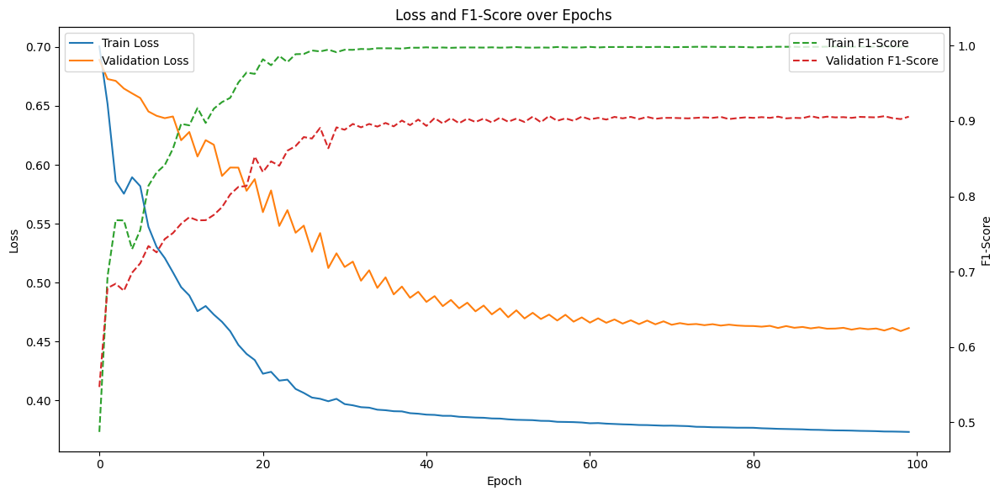

Final Test Loss: 0.4585, Final Test F1-Score: 0.9055


In [ ]:
# Кросс-валидация по участникам
cv_scores = []
cv_loss = []
for train_data, val_data, test_data in participant_based_cross_validation_with_validation_fold(pd.concat([X_selected_with_participant, y], axis=1)):
    # Разделяем данные на признаки и метки
    X_train, y_train = train_data.iloc[:, :-2], train_data.iloc[:, -1]
    X_val, y_val = val_data.iloc[:, :-2], val_data.iloc[:, -1]
    X_test, y_test = test_data.iloc[:, :-2], test_data.iloc[:, -1]

    # Преобразуем данные в тензоры PyTorch
    X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32).to(device)
    y_train_tensor = torch.tensor(y_train.values, dtype=torch.long).to(device)
    X_val_tensor = torch.tensor(X_val.values, dtype=torch.float32).to(device)
    y_val_tensor = torch.tensor(y_val.values, dtype=torch.long).to(device)
    X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32).to(device)
    y_test_tensor = torch.tensor(y_test.values, dtype=torch.long).to(device)

    model = MLP(input_size, hidden_sizes, output_size)

    # Гиперпараметры
    learning_rate = 0.001
    num_epochs = 100
    batch_size = 64

    # Перевод модели на GPU (если доступно)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    # Функция потерь и оптимизатор
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adagrad(model.parameters(), lr=learning_rate)

    # Обучение и оценка модели
    test_loss, test_f1 = train_and_evaluate_model(
        model=model,
        X_train=X_train_tensor,
        y_train=y_train_tensor,
        X_val=X_val_tensor,
        y_val=y_val_tensor,
        X_test=X_test_tensor,
        y_test=y_test_tensor,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=num_epochs,
        device=device
    )

    # Сохраняем результаты для текущей итерации
    cv_scores.append(test_f1)
    cv_loss.append(test_loss)

# Усредняем результаты кросс-валидации
mean_f1_cv = np.mean(cv_scores)
mean_loss_cv = np.mean(cv_loss)

print(f"Final Test Loss: {mean_loss_cv:.4f}, Final Test F1-Score: {mean_f1_cv:.4f}")

## Оптимизируем модель из статьи

Снижаем количество слоев, добавляем батчнорм, дропаут шедулер

In [ ]:
# Определение модели
class MLP_optimized(nn.Module):
    def __init__(self, input_size, hidden_sizes, output_size, dropout_rate=0.3):
        super(MLP_optimized, self).__init__()

        # Определение слоев
        layers = []
        current_size = input_size

        for i, hidden_size in enumerate(hidden_sizes):
            layers.append(nn.Linear(current_size, hidden_size))  # Полносвязный слой
            layers.append(nn.BatchNorm1d(hidden_size))           # Batch Normalization
            layers.append(nn.ReLU())                             # Активация ReLU
            layers.append(nn.Dropout(dropout_rate))              # Dropout для предотвращения переобучения
            current_size = hidden_size

        # Выходной слой
        layers.append(nn.Linear(current_size, output_size))
        layers.append(nn.Softmax(dim=1))

        # Создание последовательности слоев
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

In [ ]:
# Параметры модели
input_size = 15000         # Размер входных данных
hidden_sizes = [4096, 1024, 256]  # Размеры скрытых слоев (уменьшено до 3 слоев)
output_size = 2            # Размер выходного слоя (два класса)

# исходный датасет
X_selected = df.iloc[:, :15000]

X_selected_with_participant = pd.concat([X_selected, df_raw['participant']], axis=1)
y = df['target']

Epochs:   1%|▌                                                        | 1/100 [00:04<07:57,  4.83s/epoch]

Epoch [1/100], Loss: 0.6983, Train F1-Score: 0.4974, Validation Loss: 0.6660, Validation F1-Score: 0.5702


Epochs:   2%|█▏                                                       | 2/100 [00:09<07:26,  4.56s/epoch]

Epoch [2/100], Loss: 0.6474, Train F1-Score: 0.7112, Validation Loss: 0.6779, Validation F1-Score: 0.4649


Epochs:   3%|█▋                                                       | 3/100 [00:13<07:11,  4.45s/epoch]

Epoch [3/100], Loss: 0.5978, Train F1-Score: 0.6876, Validation Loss: 0.7554, Validation F1-Score: 0.3510


Epochs:   4%|██▎                                                      | 4/100 [00:17<06:57,  4.35s/epoch]

Epoch [4/100], Loss: 0.6791, Train F1-Score: 0.5775, Validation Loss: 0.6896, Validation F1-Score: 0.4215


Epochs:   5%|██▊                                                      | 5/100 [00:22<06:54,  4.37s/epoch]

Epoch [5/100], Loss: 0.5747, Train F1-Score: 0.7303, Validation Loss: 0.6195, Validation F1-Score: 0.6688


Epochs:   6%|███▍                                                     | 6/100 [00:26<06:47,  4.34s/epoch]

Epoch [6/100], Loss: 0.5109, Train F1-Score: 0.8172, Validation Loss: 0.6163, Validation F1-Score: 0.6658


Epochs:   7%|███▉                                                     | 7/100 [00:30<06:41,  4.31s/epoch]

Epoch [7/100], Loss: 0.5442, Train F1-Score: 0.7540, Validation Loss: 0.5972, Validation F1-Score: 0.7279


Epochs:   8%|████▌                                                    | 8/100 [00:34<06:31,  4.25s/epoch]

Epoch [8/100], Loss: 0.5068, Train F1-Score: 0.7921, Validation Loss: 0.5990, Validation F1-Score: 0.7006


Epochs:   9%|█████▏                                                   | 9/100 [00:38<06:22,  4.21s/epoch]

Epoch [9/100], Loss: 0.5251, Train F1-Score: 0.7733, Validation Loss: 0.5700, Validation F1-Score: 0.7733


Epochs:  10%|█████▌                                                  | 10/100 [00:43<06:16,  4.18s/epoch]

Epoch [10/100], Loss: 0.4451, Train F1-Score: 0.8811, Validation Loss: 0.5638, Validation F1-Score: 0.7904


Epochs:  11%|██████▏                                                 | 11/100 [00:47<06:09,  4.16s/epoch]

Epoch [11/100], Loss: 0.4274, Train F1-Score: 0.8984, Validation Loss: 0.5525, Validation F1-Score: 0.7900


Epochs:  12%|██████▋                                                 | 12/100 [00:51<06:06,  4.16s/epoch]

Epoch [12/100], Loss: 0.4301, Train F1-Score: 0.8894, Validation Loss: 0.5458, Validation F1-Score: 0.7893


Epochs:  13%|███████▎                                                | 13/100 [00:55<06:01,  4.15s/epoch]

Epoch [13/100], Loss: 0.4382, Train F1-Score: 0.8705, Validation Loss: 0.5765, Validation F1-Score: 0.7060


Epochs:  14%|███████▊                                                | 14/100 [00:59<05:56,  4.15s/epoch]

Epoch [14/100], Loss: 0.4867, Train F1-Score: 0.8177, Validation Loss: 0.5429, Validation F1-Score: 0.7764


Epochs:  15%|████████▍                                               | 15/100 [01:03<05:52,  4.14s/epoch]

Epoch [15/100], Loss: 0.4259, Train F1-Score: 0.8910, Validation Loss: 0.5179, Validation F1-Score: 0.8217


Epochs:  16%|████████▉                                               | 16/100 [01:07<05:47,  4.14s/epoch]

Epoch [16/100], Loss: 0.4175, Train F1-Score: 0.8978, Validation Loss: 0.5072, Validation F1-Score: 0.8208


Epochs:  17%|█████████▌                                              | 17/100 [01:11<05:43,  4.14s/epoch]

Epoch [17/100], Loss: 0.4054, Train F1-Score: 0.9134, Validation Loss: 0.5005, Validation F1-Score: 0.8304


Epochs:  18%|██████████                                              | 18/100 [01:16<05:39,  4.14s/epoch]

Epoch [18/100], Loss: 0.3969, Train F1-Score: 0.9218, Validation Loss: 0.4914, Validation F1-Score: 0.8337


Epochs:  19%|██████████▋                                             | 19/100 [01:20<05:38,  4.18s/epoch]

Epoch [19/100], Loss: 0.3867, Train F1-Score: 0.9331, Validation Loss: 0.4861, Validation F1-Score: 0.8353


Epochs:  20%|███████████▏                                            | 20/100 [01:24<05:34,  4.18s/epoch]

Epoch [20/100], Loss: 0.3849, Train F1-Score: 0.9339, Validation Loss: 0.4791, Validation F1-Score: 0.8390


Epochs:  21%|███████████▊                                            | 21/100 [01:28<05:30,  4.18s/epoch]

Epoch [21/100], Loss: 0.3770, Train F1-Score: 0.9452, Validation Loss: 0.4602, Validation F1-Score: 0.8687


Epochs:  22%|████████████▎                                           | 22/100 [01:32<05:26,  4.19s/epoch]

Epoch [22/100], Loss: 0.3550, Train F1-Score: 0.9695, Validation Loss: 0.4535, Validation F1-Score: 0.8787


Epochs:  23%|████████████▉                                           | 23/100 [01:37<05:23,  4.20s/epoch]

Epoch [23/100], Loss: 0.3503, Train F1-Score: 0.9750, Validation Loss: 0.4492, Validation F1-Score: 0.8839


Epochs:  24%|█████████████▍                                          | 24/100 [01:41<05:17,  4.17s/epoch]

Epoch [24/100], Loss: 0.3479, Train F1-Score: 0.9780, Validation Loss: 0.4444, Validation F1-Score: 0.8836


Epochs:  25%|██████████████                                          | 25/100 [01:45<05:11,  4.15s/epoch]

Epoch [25/100], Loss: 0.3459, Train F1-Score: 0.9796, Validation Loss: 0.4414, Validation F1-Score: 0.8871


Epochs:  26%|██████████████▌                                         | 26/100 [01:49<05:05,  4.13s/epoch]

Epoch [26/100], Loss: 0.3434, Train F1-Score: 0.9819, Validation Loss: 0.4377, Validation F1-Score: 0.8894


Epochs:  27%|███████████████                                         | 27/100 [01:53<05:03,  4.16s/epoch]

Epoch [27/100], Loss: 0.3416, Train F1-Score: 0.9839, Validation Loss: 0.4367, Validation F1-Score: 0.8906


Epochs:  28%|███████████████▋                                        | 28/100 [01:57<04:59,  4.16s/epoch]

Epoch [28/100], Loss: 0.3406, Train F1-Score: 0.9842, Validation Loss: 0.4334, Validation F1-Score: 0.8913


Epochs:  29%|████████████████▏                                       | 29/100 [02:01<04:54,  4.15s/epoch]

Epoch [29/100], Loss: 0.3390, Train F1-Score: 0.9861, Validation Loss: 0.4319, Validation F1-Score: 0.8923


Epochs:  30%|████████████████▊                                       | 30/100 [02:06<04:50,  4.15s/epoch]

Epoch [30/100], Loss: 0.3377, Train F1-Score: 0.9873, Validation Loss: 0.4291, Validation F1-Score: 0.8961


Epochs:  31%|█████████████████▎                                      | 31/100 [02:10<04:45,  4.14s/epoch]

Epoch [31/100], Loss: 0.3368, Train F1-Score: 0.9876, Validation Loss: 0.4280, Validation F1-Score: 0.8958


Epochs:  32%|█████████████████▉                                      | 32/100 [02:14<04:41,  4.14s/epoch]

Epoch [32/100], Loss: 0.3357, Train F1-Score: 0.9883, Validation Loss: 0.4266, Validation F1-Score: 0.8951


Epochs:  33%|██████████████████▍                                     | 33/100 [02:18<04:37,  4.15s/epoch]

Epoch [33/100], Loss: 0.3348, Train F1-Score: 0.9886, Validation Loss: 0.4250, Validation F1-Score: 0.8971


Epochs:  34%|███████████████████                                     | 34/100 [02:22<04:32,  4.13s/epoch]

Epoch [34/100], Loss: 0.3340, Train F1-Score: 0.9894, Validation Loss: 0.4236, Validation F1-Score: 0.8990


Epochs:  35%|███████████████████▌                                    | 35/100 [02:26<04:27,  4.12s/epoch]

Epoch [35/100], Loss: 0.3328, Train F1-Score: 0.9908, Validation Loss: 0.4226, Validation F1-Score: 0.9000


Epochs:  36%|████████████████████▏                                   | 36/100 [02:30<04:23,  4.11s/epoch]

Epoch [36/100], Loss: 0.3322, Train F1-Score: 0.9906, Validation Loss: 0.4217, Validation F1-Score: 0.8997


Epochs:  37%|████████████████████▋                                   | 37/100 [02:34<04:18,  4.10s/epoch]

Epoch [37/100], Loss: 0.3312, Train F1-Score: 0.9916, Validation Loss: 0.4197, Validation F1-Score: 0.9013


Epochs:  38%|█████████████████████▎                                  | 38/100 [02:39<04:14,  4.10s/epoch]

Epoch [38/100], Loss: 0.3302, Train F1-Score: 0.9926, Validation Loss: 0.4202, Validation F1-Score: 0.8984


Epochs:  39%|█████████████████████▊                                  | 39/100 [02:43<04:10,  4.11s/epoch]

Epoch [39/100], Loss: 0.3301, Train F1-Score: 0.9929, Validation Loss: 0.4191, Validation F1-Score: 0.8993


Epochs:  40%|██████████████████████▍                                 | 40/100 [02:47<04:06,  4.11s/epoch]

Epoch [40/100], Loss: 0.3294, Train F1-Score: 0.9931, Validation Loss: 0.4177, Validation F1-Score: 0.9003


Epochs:  41%|██████████████████████▉                                 | 41/100 [02:51<04:02,  4.10s/epoch]

Epoch [41/100], Loss: 0.3292, Train F1-Score: 0.9931, Validation Loss: 0.4160, Validation F1-Score: 0.9016


Epochs:  42%|███████████████████████▌                                | 42/100 [02:55<03:57,  4.10s/epoch]

Epoch [42/100], Loss: 0.3273, Train F1-Score: 0.9949, Validation Loss: 0.4155, Validation F1-Score: 0.9022


Epochs:  43%|████████████████████████                                | 43/100 [02:59<03:53,  4.10s/epoch]

Epoch [43/100], Loss: 0.3270, Train F1-Score: 0.9953, Validation Loss: 0.4146, Validation F1-Score: 0.9048


Epochs:  44%|████████████████████████▋                               | 44/100 [03:03<03:49,  4.09s/epoch]

Epoch [44/100], Loss: 0.3263, Train F1-Score: 0.9954, Validation Loss: 0.4141, Validation F1-Score: 0.9055


Epochs:  45%|█████████████████████████▏                              | 45/100 [03:07<03:44,  4.09s/epoch]

Epoch [45/100], Loss: 0.3263, Train F1-Score: 0.9956, Validation Loss: 0.4138, Validation F1-Score: 0.9074


Epochs:  46%|█████████████████████████▊                              | 46/100 [03:11<03:40,  4.09s/epoch]

Epoch [46/100], Loss: 0.3259, Train F1-Score: 0.9957, Validation Loss: 0.4136, Validation F1-Score: 0.9042


Epochs:  47%|██████████████████████████▎                             | 47/100 [03:15<03:37,  4.10s/epoch]

Epoch [47/100], Loss: 0.3258, Train F1-Score: 0.9956, Validation Loss: 0.4134, Validation F1-Score: 0.9032


Epochs:  48%|██████████████████████████▉                             | 48/100 [03:20<03:34,  4.12s/epoch]

Epoch [48/100], Loss: 0.3257, Train F1-Score: 0.9958, Validation Loss: 0.4124, Validation F1-Score: 0.9051


Epochs:  49%|███████████████████████████▍                            | 49/100 [03:24<03:31,  4.14s/epoch]

Epoch [49/100], Loss: 0.3256, Train F1-Score: 0.9955, Validation Loss: 0.4120, Validation F1-Score: 0.9045


Epochs:  50%|████████████████████████████                            | 50/100 [03:28<03:27,  4.14s/epoch]

Epoch [50/100], Loss: 0.3252, Train F1-Score: 0.9962, Validation Loss: 0.4119, Validation F1-Score: 0.9051


Epochs:  51%|████████████████████████████▌                           | 51/100 [03:32<03:22,  4.13s/epoch]

Epoch [51/100], Loss: 0.3249, Train F1-Score: 0.9963, Validation Loss: 0.4117, Validation F1-Score: 0.9048


Epochs:  52%|█████████████████████████████                           | 52/100 [03:36<03:17,  4.11s/epoch]

Epoch [52/100], Loss: 0.3249, Train F1-Score: 0.9959, Validation Loss: 0.4116, Validation F1-Score: 0.9038


Epochs:  53%|█████████████████████████████▋                          | 53/100 [03:40<03:12,  4.10s/epoch]

Epoch [53/100], Loss: 0.3248, Train F1-Score: 0.9960, Validation Loss: 0.4107, Validation F1-Score: 0.9051


Epochs:  54%|██████████████████████████████▏                         | 54/100 [03:44<03:08,  4.10s/epoch]

Epoch [54/100], Loss: 0.3245, Train F1-Score: 0.9960, Validation Loss: 0.4107, Validation F1-Score: 0.9042


Epochs:  55%|██████████████████████████████▊                         | 55/100 [03:48<03:04,  4.10s/epoch]

Epoch [55/100], Loss: 0.3244, Train F1-Score: 0.9964, Validation Loss: 0.4101, Validation F1-Score: 0.9048


Epochs:  56%|███████████████████████████████▎                        | 56/100 [03:52<03:00,  4.11s/epoch]

Epoch [56/100], Loss: 0.3242, Train F1-Score: 0.9962, Validation Loss: 0.4102, Validation F1-Score: 0.9051


Epochs:  57%|███████████████████████████████▉                        | 57/100 [03:57<02:56,  4.10s/epoch]

Epoch [57/100], Loss: 0.3242, Train F1-Score: 0.9964, Validation Loss: 0.4097, Validation F1-Score: 0.9039


Epochs:  58%|████████████████████████████████▍                       | 58/100 [04:01<02:51,  4.09s/epoch]

Epoch [58/100], Loss: 0.3237, Train F1-Score: 0.9967, Validation Loss: 0.4092, Validation F1-Score: 0.9055


Epochs:  59%|█████████████████████████████████                       | 59/100 [04:05<02:47,  4.09s/epoch]

Epoch [59/100], Loss: 0.3237, Train F1-Score: 0.9964, Validation Loss: 0.4096, Validation F1-Score: 0.9054


Epochs:  60%|█████████████████████████████████▌                      | 60/100 [04:09<02:43,  4.09s/epoch]

Epoch [60/100], Loss: 0.3233, Train F1-Score: 0.9968, Validation Loss: 0.4089, Validation F1-Score: 0.9058


Epochs:  61%|██████████████████████████████████▏                     | 61/100 [04:13<02:39,  4.08s/epoch]

Epoch [61/100], Loss: 0.3232, Train F1-Score: 0.9969, Validation Loss: 0.4085, Validation F1-Score: 0.9064


Epochs:  62%|██████████████████████████████████▋                     | 62/100 [04:17<02:35,  4.08s/epoch]

Epoch [62/100], Loss: 0.3229, Train F1-Score: 0.9969, Validation Loss: 0.4084, Validation F1-Score: 0.9067


Epochs:  63%|███████████████████████████████████▎                    | 63/100 [04:21<02:31,  4.10s/epoch]

Epoch [63/100], Loss: 0.3228, Train F1-Score: 0.9973, Validation Loss: 0.4084, Validation F1-Score: 0.9074


Epochs:  64%|███████████████████████████████████▊                    | 64/100 [04:25<02:28,  4.14s/epoch]

Epoch [64/100], Loss: 0.3228, Train F1-Score: 0.9973, Validation Loss: 0.4081, Validation F1-Score: 0.9067


Epochs:  65%|████████████████████████████████████▍                   | 65/100 [04:30<02:25,  4.16s/epoch]

Epoch [65/100], Loss: 0.3229, Train F1-Score: 0.9970, Validation Loss: 0.4079, Validation F1-Score: 0.9064


Epochs:  66%|████████████████████████████████████▉                   | 66/100 [04:34<02:21,  4.15s/epoch]

Epoch [66/100], Loss: 0.3229, Train F1-Score: 0.9972, Validation Loss: 0.4080, Validation F1-Score: 0.9064


Epochs:  67%|█████████████████████████████████████▌                  | 67/100 [04:38<02:16,  4.14s/epoch]

Epoch [67/100], Loss: 0.3228, Train F1-Score: 0.9971, Validation Loss: 0.4076, Validation F1-Score: 0.9080


Epochs:  68%|██████████████████████████████████████                  | 68/100 [04:42<02:12,  4.13s/epoch]

Epoch [68/100], Loss: 0.3226, Train F1-Score: 0.9974, Validation Loss: 0.4078, Validation F1-Score: 0.9080


Epochs:  69%|██████████████████████████████████████▋                 | 69/100 [04:46<02:07,  4.12s/epoch]

Epoch [69/100], Loss: 0.3227, Train F1-Score: 0.9973, Validation Loss: 0.4075, Validation F1-Score: 0.9074


Epochs:  70%|███████████████████████████████████████▏                | 70/100 [04:50<02:03,  4.12s/epoch]

Epoch [70/100], Loss: 0.3224, Train F1-Score: 0.9973, Validation Loss: 0.4074, Validation F1-Score: 0.9071


Epochs:  71%|███████████████████████████████████████▊                | 71/100 [04:54<01:59,  4.11s/epoch]

Epoch [71/100], Loss: 0.3224, Train F1-Score: 0.9974, Validation Loss: 0.4073, Validation F1-Score: 0.9074


Epochs:  72%|████████████████████████████████████████▎               | 72/100 [04:58<01:56,  4.15s/epoch]

Epoch [72/100], Loss: 0.3226, Train F1-Score: 0.9971, Validation Loss: 0.4074, Validation F1-Score: 0.9071


Epochs:  73%|████████████████████████████████████████▉               | 73/100 [05:03<01:52,  4.16s/epoch]

Epoch [73/100], Loss: 0.3223, Train F1-Score: 0.9973, Validation Loss: 0.4072, Validation F1-Score: 0.9074


Epochs:  74%|█████████████████████████████████████████▍              | 74/100 [05:07<01:48,  4.17s/epoch]

Epoch [74/100], Loss: 0.3223, Train F1-Score: 0.9971, Validation Loss: 0.4069, Validation F1-Score: 0.9087


Epochs:  75%|██████████████████████████████████████████              | 75/100 [05:11<01:44,  4.18s/epoch]

Epoch [75/100], Loss: 0.3219, Train F1-Score: 0.9975, Validation Loss: 0.4070, Validation F1-Score: 0.9074


Epochs:  76%|██████████████████████████████████████████▌             | 76/100 [05:15<01:40,  4.18s/epoch]

Epoch [76/100], Loss: 0.3221, Train F1-Score: 0.9974, Validation Loss: 0.4068, Validation F1-Score: 0.9074


Epochs:  77%|███████████████████████████████████████████             | 77/100 [05:19<01:36,  4.18s/epoch]

Epoch [77/100], Loss: 0.3222, Train F1-Score: 0.9973, Validation Loss: 0.4065, Validation F1-Score: 0.9077


Epochs:  78%|███████████████████████████████████████████▋            | 78/100 [05:24<01:31,  4.17s/epoch]

Epoch [78/100], Loss: 0.3222, Train F1-Score: 0.9970, Validation Loss: 0.4066, Validation F1-Score: 0.9067


Epochs:  79%|████████████████████████████████████████████▏           | 79/100 [05:28<01:27,  4.16s/epoch]

Epoch [79/100], Loss: 0.3221, Train F1-Score: 0.9973, Validation Loss: 0.4067, Validation F1-Score: 0.9071


Epochs:  80%|████████████████████████████████████████████▊           | 80/100 [05:32<01:23,  4.16s/epoch]

Epoch [80/100], Loss: 0.3221, Train F1-Score: 0.9972, Validation Loss: 0.4064, Validation F1-Score: 0.9071


Epochs:  81%|█████████████████████████████████████████████▎          | 81/100 [05:36<01:21,  4.28s/epoch]

Epoch [81/100], Loss: 0.3220, Train F1-Score: 0.9973, Validation Loss: 0.4063, Validation F1-Score: 0.9067


Epochs:  82%|█████████████████████████████████████████████▉          | 82/100 [05:41<01:19,  4.43s/epoch]

Epoch [82/100], Loss: 0.3219, Train F1-Score: 0.9975, Validation Loss: 0.4063, Validation F1-Score: 0.9071


Epochs:  83%|██████████████████████████████████████████████▍         | 83/100 [05:46<01:15,  4.42s/epoch]

Epoch [83/100], Loss: 0.3219, Train F1-Score: 0.9975, Validation Loss: 0.4064, Validation F1-Score: 0.9074


Epochs:  84%|███████████████████████████████████████████████         | 84/100 [05:50<01:09,  4.35s/epoch]

Epoch [84/100], Loss: 0.3218, Train F1-Score: 0.9976, Validation Loss: 0.4062, Validation F1-Score: 0.9071


Epochs:  85%|███████████████████████████████████████████████▌        | 85/100 [05:54<01:04,  4.29s/epoch]

Epoch [85/100], Loss: 0.3216, Train F1-Score: 0.9977, Validation Loss: 0.4061, Validation F1-Score: 0.9084


Epochs:  86%|████████████████████████████████████████████████▏       | 86/100 [05:58<00:59,  4.23s/epoch]

Epoch [86/100], Loss: 0.3218, Train F1-Score: 0.9975, Validation Loss: 0.4061, Validation F1-Score: 0.9080


Epochs:  87%|████████████████████████████████████████████████▋       | 87/100 [06:02<00:54,  4.19s/epoch]

Epoch [87/100], Loss: 0.3217, Train F1-Score: 0.9976, Validation Loss: 0.4061, Validation F1-Score: 0.9087


Epochs:  88%|█████████████████████████████████████████████████▎      | 88/100 [06:06<00:49,  4.16s/epoch]

Epoch [88/100], Loss: 0.3218, Train F1-Score: 0.9973, Validation Loss: 0.4060, Validation F1-Score: 0.9084


Epochs:  89%|█████████████████████████████████████████████████▊      | 89/100 [06:10<00:45,  4.13s/epoch]

Epoch [89/100], Loss: 0.3218, Train F1-Score: 0.9976, Validation Loss: 0.4060, Validation F1-Score: 0.9084


Epochs:  90%|██████████████████████████████████████████████████▍     | 90/100 [06:14<00:41,  4.13s/epoch]

Epoch [90/100], Loss: 0.3217, Train F1-Score: 0.9975, Validation Loss: 0.4060, Validation F1-Score: 0.9084


Epochs:  91%|██████████████████████████████████████████████████▉     | 91/100 [06:18<00:37,  4.12s/epoch]

Epoch [91/100], Loss: 0.3214, Train F1-Score: 0.9976, Validation Loss: 0.4058, Validation F1-Score: 0.9087


Epochs:  92%|███████████████████████████████████████████████████▌    | 92/100 [06:23<00:33,  4.13s/epoch]

Epoch [92/100], Loss: 0.3216, Train F1-Score: 0.9975, Validation Loss: 0.4058, Validation F1-Score: 0.9084


Epochs:  93%|████████████████████████████████████████████████████    | 93/100 [06:27<00:28,  4.11s/epoch]

Epoch [93/100], Loss: 0.3215, Train F1-Score: 0.9977, Validation Loss: 0.4058, Validation F1-Score: 0.9087


Epochs:  94%|████████████████████████████████████████████████████▋   | 94/100 [06:31<00:24,  4.10s/epoch]

Epoch [94/100], Loss: 0.3215, Train F1-Score: 0.9977, Validation Loss: 0.4057, Validation F1-Score: 0.9084


Epochs:  95%|█████████████████████████████████████████████████████▏  | 95/100 [06:35<00:20,  4.11s/epoch]

Epoch [95/100], Loss: 0.3217, Train F1-Score: 0.9975, Validation Loss: 0.4057, Validation F1-Score: 0.9084


Epochs:  96%|█████████████████████████████████████████████████████▊  | 96/100 [06:39<00:16,  4.10s/epoch]

Epoch [96/100], Loss: 0.3216, Train F1-Score: 0.9975, Validation Loss: 0.4056, Validation F1-Score: 0.9087


Epochs:  97%|██████████████████████████████████████████████████████▎ | 97/100 [06:43<00:12,  4.09s/epoch]

Epoch [97/100], Loss: 0.3214, Train F1-Score: 0.9978, Validation Loss: 0.4056, Validation F1-Score: 0.9084


Epochs:  98%|██████████████████████████████████████████████████████▉ | 98/100 [06:47<00:08,  4.08s/epoch]

Epoch [98/100], Loss: 0.3215, Train F1-Score: 0.9977, Validation Loss: 0.4056, Validation F1-Score: 0.9077


Epochs:  99%|███████████████████████████████████████████████████████▍| 99/100 [06:51<00:04,  4.08s/epoch]

Epoch [99/100], Loss: 0.3215, Train F1-Score: 0.9977, Validation Loss: 0.4057, Validation F1-Score: 0.9080


Epochs: 100%|███████████████████████████████████████████████████████| 100/100 [06:55<00:00,  4.16s/epoch]

Epoch [100/100], Loss: 0.3214, Train F1-Score: 0.9977, Validation Loss: 0.4057, Validation F1-Score: 0.9080


Test Loss: 0.4007, Test F1-Score: 0.9126


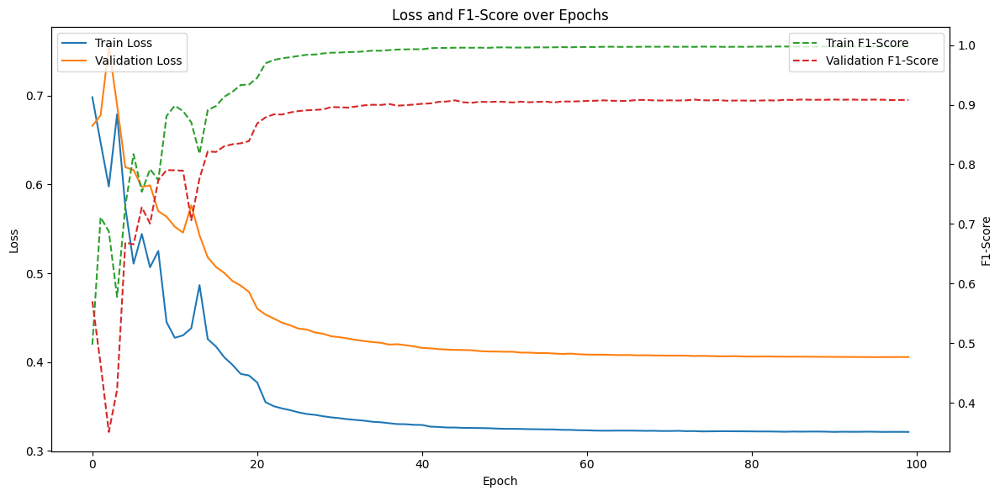

Final Test Loss: 0.4007, Final Test F1-Score: 0.9126


In [ ]:
# Кросс-валидация по участникам
cv_scores = []
cv_loss = []
for train_data, val_data, test_data in participant_based_cross_validation_with_validation_fold(pd.concat([X_selected_with_participant, y], axis=1)):
    # Разделяем данные на признаки и метки
    X_train, y_train = train_data.iloc[:, :-2], train_data.iloc[:, -1]
    X_val, y_val = val_data.iloc[:, :-2], val_data.iloc[:, -1]
    X_test, y_test = test_data.iloc[:, :-2], test_data.iloc[:, -1]

    # Преобразуем данные в тензоры PyTorch
    X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32).to(device)
    y_train_tensor = torch.tensor(y_train.values, dtype=torch.long).to(device)
    X_val_tensor = torch.tensor(X_val.values, dtype=torch.float32).to(device)
    y_val_tensor = torch.tensor(y_val.values, dtype=torch.long).to(device)
    X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32).to(device)
    y_test_tensor = torch.tensor(y_test.values, dtype=torch.long).to(device)

    # Создание экземпляра модели
    model_optimized = MLP_optimized(input_size, hidden_sizes, output_size)
    
    # Гиперпараметры
    learning_rate = 0.001
    num_epochs = 100
    batch_size = 64
    
    # Перевод модели на GPU (если доступно)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model_optimized.to(device)
    
    # Оптимизатор и функция потерь
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adagrad(model_optimized.parameters(), lr=learning_rate)
    
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.5)

    # Обучение и оценка модели
    test_loss, test_f1 = train_and_evaluate_model(
        model=model_optimized,
        X_train=X_train_tensor,
        y_train=y_train_tensor,
        X_val=X_val_tensor,
        y_val=y_val_tensor,
        X_test=X_test_tensor,
        y_test=y_test_tensor,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=num_epochs,
        device=device
    )

    # Сохраняем результаты для текущей итерации
    cv_scores.append(test_f1)
    cv_loss.append(test_loss)

# Усредняем результаты кросс-валидации
mean_f1_cv = np.mean(cv_scores)
mean_loss_cv = np.mean(cv_loss)

print(f"Final Test Loss: {mean_loss_cv:.4f}, Final Test F1-Score: {mean_f1_cv:.4f}")

В такой модели приходится снижать batch_size до 32, тк модель не влезает по видеопамяти

In [ ]:
from torch.utils.checkpoint import checkpoint

class Conv_plus_MLP(nn.Module):
    def __init__(self, input_size, output_size, dropout_rate=0.3):
        super(Conv_plus_MLP, self).__init__()

        # Сверточные слои
        self.conv_layers = nn.Sequential(
            nn.Conv1d(in_channels=1, out_channels=32, kernel_size=5, stride=1, padding=2),  # Первый сверточный слой
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2),  # Уменьшение размерности

            nn.Conv1d(in_channels=32, out_channels=64, kernel_size=5, stride=1, padding=2),  # Второй сверточный слой
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2),

            nn.Conv1d(in_channels=64, out_channels=128, kernel_size=5, stride=1, padding=2),  # Третий сверточный слой
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2)
        )

        # Полносвязные слои
        self.fc_layers = nn.Sequential(
            nn.Linear(128 * (input_size // 8), 4096),  # Размер после сверток
            nn.BatchNorm1d(4096),
            nn.ReLU(),
            nn.Dropout(dropout_rate),

            nn.Linear(4096, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.Dropout(dropout_rate),

            nn.Linear(1024, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(dropout_rate),

            nn.Linear(256, output_size),
            nn.Softmax(dim=1)
        )

    def forward(self, x):
        # Преобразование входа для сверток
        x = x.unsqueeze(1)  # Добавляем канал (batch_size, 1, input_size)

        # Используем checkpoint для экономии памяти
        x = checkpoint(self.conv_layers, x)

        # Разворачиваем в вектор
        x = x.view(x.size(0), -1)

        # Применяем полносвязные слои
        x = self.fc_layers(x)
        return x

In [ ]:
# Параметры модели
input_size = 15000  # Размер входных данных
output_size = 2     # Размер выходного слоя (два класса)

# Создание экземпляра модели
model_cnn_mlp = Conv_plus_MLP(input_size, output_size)

# Гиперпараметры
learning_rate = 0.001
num_epochs = 100
batch_size = 64

# Перевод модели на GPU (если доступно)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_cnn_mlp.to(device)
X_train_tensor, y_train_tensor = X_train_tensor.to(device), y_train_tensor.to(device)
X_val_tensor, y_val_tensor = X_val_tensor.to(device), y_val_tensor.to(device)
X_test_tensor, y_test_tensor = X_test_tensor.to(device), y_test_tensor.to(device)

# Оптимизатор и функция потерь
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adagrad(model_cnn_mlp.parameters(), lr=learning_rate)

# scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.5)

Epochs:   1%|          | 1/100 [00:02<03:51,  2.34s/epoch]

Epoch [1/100], Loss: 0.7000, Train F1-Score: 0.4976, Validation Loss: 0.7578, Validation F1-Score: 0.3121


Epochs:   2%|▏         | 2/100 [00:04<03:34,  2.19s/epoch]

Epoch [2/100], Loss: 0.6801, Train F1-Score: 0.5635, Validation Loss: 0.7416, Validation F1-Score: 0.3624


Epochs:   3%|▎         | 3/100 [00:06<03:28,  2.15s/epoch]

Epoch [3/100], Loss: 0.7215, Train F1-Score: 0.4908, Validation Loss: 0.6960, Validation F1-Score: 0.5131


Epochs:   4%|▍         | 4/100 [00:08<03:24,  2.13s/epoch]

Epoch [4/100], Loss: 0.6657, Train F1-Score: 0.5903, Validation Loss: 0.6982, Validation F1-Score: 0.4542


Epochs:   5%|▌         | 5/100 [00:10<03:23,  2.14s/epoch]

Epoch [5/100], Loss: 0.6490, Train F1-Score: 0.6330, Validation Loss: 0.6883, Validation F1-Score: 0.5759


Epochs:   6%|▌         | 6/100 [00:12<03:18,  2.11s/epoch]

Epoch [6/100], Loss: 0.6881, Train F1-Score: 0.5631, Validation Loss: 0.6908, Validation F1-Score: 0.5418


Epochs:   7%|▋         | 7/100 [00:14<03:17,  2.12s/epoch]

Epoch [7/100], Loss: 0.6230, Train F1-Score: 0.6880, Validation Loss: 0.6921, Validation F1-Score: 0.5250


Epochs:   8%|▊         | 8/100 [00:17<03:17,  2.14s/epoch]

Epoch [8/100], Loss: 0.6306, Train F1-Score: 0.6425, Validation Loss: 0.6955, Validation F1-Score: 0.3751


Epochs:   9%|▉         | 9/100 [00:19<03:15,  2.14s/epoch]

Epoch [9/100], Loss: 0.6491, Train F1-Score: 0.5952, Validation Loss: 0.6943, Validation F1-Score: 0.5438


Epochs:  10%|█         | 10/100 [00:21<03:14,  2.16s/epoch]

Epoch [10/100], Loss: 0.6337, Train F1-Score: 0.6186, Validation Loss: 0.6757, Validation F1-Score: 0.5428


Epochs:  11%|█         | 11/100 [00:23<03:13,  2.18s/epoch]

Epoch [11/100], Loss: 0.5920, Train F1-Score: 0.7359, Validation Loss: 0.6889, Validation F1-Score: 0.4607


Epochs:  12%|█▏        | 12/100 [00:25<03:10,  2.16s/epoch]

Epoch [12/100], Loss: 0.5970, Train F1-Score: 0.6647, Validation Loss: 0.6683, Validation F1-Score: 0.5965


Epochs:  13%|█▎        | 13/100 [00:28<03:08,  2.17s/epoch]

Epoch [13/100], Loss: 0.6320, Train F1-Score: 0.6330, Validation Loss: 0.6728, Validation F1-Score: 0.5959


Epochs:  14%|█▍        | 14/100 [00:30<03:05,  2.16s/epoch]

Epoch [14/100], Loss: 0.5733, Train F1-Score: 0.7717, Validation Loss: 0.6731, Validation F1-Score: 0.4947


Epochs:  15%|█▌        | 15/100 [00:32<03:03,  2.16s/epoch]

Epoch [15/100], Loss: 0.5436, Train F1-Score: 0.7640, Validation Loss: 0.6605, Validation F1-Score: 0.5480


Epochs:  16%|█▌        | 16/100 [00:34<03:01,  2.16s/epoch]

Epoch [16/100], Loss: 0.5018, Train F1-Score: 0.8553, Validation Loss: 0.6903, Validation F1-Score: 0.4042


Epochs:  17%|█▋        | 17/100 [00:36<02:59,  2.17s/epoch]

Epoch [17/100], Loss: 0.5500, Train F1-Score: 0.7278, Validation Loss: 0.6996, Validation F1-Score: 0.5745


Epochs:  18%|█▊        | 18/100 [00:38<02:59,  2.19s/epoch]

Epoch [18/100], Loss: 0.5694, Train F1-Score: 0.7116, Validation Loss: 0.6552, Validation F1-Score: 0.5946


Epochs:  19%|█▉        | 19/100 [00:41<02:58,  2.20s/epoch]

Epoch [19/100], Loss: 0.4995, Train F1-Score: 0.8343, Validation Loss: 0.6433, Validation F1-Score: 0.6183


Epochs:  20%|██        | 20/100 [00:43<02:56,  2.20s/epoch]

Epoch [20/100], Loss: 0.4585, Train F1-Score: 0.8893, Validation Loss: 0.6450, Validation F1-Score: 0.6120


Epochs:  21%|██        | 21/100 [00:45<02:54,  2.20s/epoch]

Epoch [21/100], Loss: 0.4806, Train F1-Score: 0.8563, Validation Loss: 0.6482, Validation F1-Score: 0.6165


Epochs:  22%|██▏       | 22/100 [00:47<02:52,  2.21s/epoch]

Epoch [22/100], Loss: 0.5261, Train F1-Score: 0.7639, Validation Loss: 0.6904, Validation F1-Score: 0.4779


Epochs:  23%|██▎       | 23/100 [00:50<02:50,  2.21s/epoch]

Epoch [23/100], Loss: 0.5353, Train F1-Score: 0.7417, Validation Loss: 0.6721, Validation F1-Score: 0.5699


Epochs:  24%|██▍       | 24/100 [00:52<02:48,  2.22s/epoch]

Epoch [24/100], Loss: 0.5599, Train F1-Score: 0.7298, Validation Loss: 0.6872, Validation F1-Score: 0.5730


Epochs:  25%|██▌       | 25/100 [00:54<02:46,  2.22s/epoch]

Epoch [25/100], Loss: 0.5415, Train F1-Score: 0.7436, Validation Loss: 0.6514, Validation F1-Score: 0.5333


Epochs:  26%|██▌       | 26/100 [00:56<02:44,  2.23s/epoch]

Epoch [26/100], Loss: 0.5400, Train F1-Score: 0.7421, Validation Loss: 0.6332, Validation F1-Score: 0.6293


Epochs:  27%|██▋       | 27/100 [00:58<02:42,  2.22s/epoch]

Epoch [27/100], Loss: 0.4632, Train F1-Score: 0.8527, Validation Loss: 0.6020, Validation F1-Score: 0.6496


Epochs:  28%|██▊       | 28/100 [01:01<02:40,  2.23s/epoch]

Epoch [28/100], Loss: 0.4446, Train F1-Score: 0.9081, Validation Loss: 0.6359, Validation F1-Score: 0.6179


Epochs:  29%|██▉       | 29/100 [01:03<02:38,  2.23s/epoch]

Epoch [29/100], Loss: 0.4779, Train F1-Score: 0.8327, Validation Loss: 0.6211, Validation F1-Score: 0.6397


Epochs:  30%|███       | 30/100 [01:05<02:36,  2.24s/epoch]

Epoch [30/100], Loss: 0.4710, Train F1-Score: 0.8323, Validation Loss: 0.7023, Validation F1-Score: 0.5022


Epochs:  31%|███       | 31/100 [01:07<02:36,  2.26s/epoch]

Epoch [31/100], Loss: 0.4715, Train F1-Score: 0.8407, Validation Loss: 0.5992, Validation F1-Score: 0.6614


Epochs:  32%|███▏      | 32/100 [01:10<02:34,  2.27s/epoch]

Epoch [32/100], Loss: 0.4544, Train F1-Score: 0.8524, Validation Loss: 0.6021, Validation F1-Score: 0.7038


Epochs:  33%|███▎      | 33/100 [01:12<02:32,  2.27s/epoch]

Epoch [33/100], Loss: 0.4334, Train F1-Score: 0.9002, Validation Loss: 0.6219, Validation F1-Score: 0.6324


Epochs:  34%|███▍      | 34/100 [01:14<02:30,  2.28s/epoch]

Epoch [34/100], Loss: 0.4494, Train F1-Score: 0.8676, Validation Loss: 0.6053, Validation F1-Score: 0.6530


Epochs:  35%|███▌      | 35/100 [01:17<02:29,  2.30s/epoch]

Epoch [35/100], Loss: 0.4095, Train F1-Score: 0.9164, Validation Loss: 0.5729, Validation F1-Score: 0.7124


Epochs:  36%|███▌      | 36/100 [01:19<02:26,  2.29s/epoch]

Epoch [36/100], Loss: 0.4196, Train F1-Score: 0.8950, Validation Loss: 0.6392, Validation F1-Score: 0.6285


Epochs:  37%|███▋      | 37/100 [01:21<02:25,  2.31s/epoch]

Epoch [37/100], Loss: 0.4626, Train F1-Score: 0.8529, Validation Loss: 0.6473, Validation F1-Score: 0.5662


Epochs:  38%|███▊      | 38/100 [01:24<02:24,  2.32s/epoch]

Epoch [38/100], Loss: 0.4312, Train F1-Score: 0.9018, Validation Loss: 0.6544, Validation F1-Score: 0.5974


Epochs:  39%|███▉      | 39/100 [01:26<02:22,  2.34s/epoch]

Epoch [39/100], Loss: 0.4350, Train F1-Score: 0.8734, Validation Loss: 0.5802, Validation F1-Score: 0.6921


Epochs:  40%|████      | 40/100 [01:28<02:20,  2.34s/epoch]

Epoch [40/100], Loss: 0.4407, Train F1-Score: 0.8702, Validation Loss: 0.6711, Validation F1-Score: 0.5829


Epochs:  41%|████      | 41/100 [01:31<02:16,  2.32s/epoch]

Epoch [41/100], Loss: 0.4594, Train F1-Score: 0.8601, Validation Loss: 0.5779, Validation F1-Score: 0.7079


Epochs:  42%|████▏     | 42/100 [01:33<02:14,  2.32s/epoch]

Epoch [42/100], Loss: 0.4063, Train F1-Score: 0.9192, Validation Loss: 0.5715, Validation F1-Score: 0.7267


Epochs:  43%|████▎     | 43/100 [01:35<02:11,  2.31s/epoch]

Epoch [43/100], Loss: 0.3957, Train F1-Score: 0.9371, Validation Loss: 0.6503, Validation F1-Score: 0.5983


Epochs:  44%|████▍     | 44/100 [01:38<02:08,  2.29s/epoch]

Epoch [44/100], Loss: 0.4626, Train F1-Score: 0.8403, Validation Loss: 0.6469, Validation F1-Score: 0.5957


Epochs:  45%|████▌     | 45/100 [01:40<02:04,  2.27s/epoch]

Epoch [45/100], Loss: 0.4173, Train F1-Score: 0.9015, Validation Loss: 0.5410, Validation F1-Score: 0.7691


Epochs:  46%|████▌     | 46/100 [01:42<02:02,  2.26s/epoch]

Epoch [46/100], Loss: 0.3838, Train F1-Score: 0.9545, Validation Loss: 0.5569, Validation F1-Score: 0.7314


Epochs:  47%|████▋     | 47/100 [01:44<02:00,  2.27s/epoch]

Epoch [47/100], Loss: 0.3827, Train F1-Score: 0.9345, Validation Loss: 0.5220, Validation F1-Score: 0.7691


Epochs:  48%|████▊     | 48/100 [01:47<01:58,  2.28s/epoch]

Epoch [48/100], Loss: 0.3971, Train F1-Score: 0.9185, Validation Loss: 0.5804, Validation F1-Score: 0.7061


Epochs:  49%|████▉     | 49/100 [01:49<01:55,  2.27s/epoch]

Epoch [49/100], Loss: 0.4107, Train F1-Score: 0.9052, Validation Loss: 0.5268, Validation F1-Score: 0.7860


Epochs:  50%|█████     | 50/100 [01:51<01:53,  2.27s/epoch]

Epoch [50/100], Loss: 0.3807, Train F1-Score: 0.9488, Validation Loss: 0.5302, Validation F1-Score: 0.7602


Epochs:  51%|█████     | 51/100 [01:53<01:51,  2.27s/epoch]

Epoch [51/100], Loss: 0.3764, Train F1-Score: 0.9447, Validation Loss: 0.5321, Validation F1-Score: 0.7743


Epochs:  52%|█████▏    | 52/100 [01:56<01:49,  2.27s/epoch]

Epoch [52/100], Loss: 0.3847, Train F1-Score: 0.9351, Validation Loss: 0.5478, Validation F1-Score: 0.7412


Epochs:  53%|█████▎    | 53/100 [01:58<01:47,  2.28s/epoch]

Epoch [53/100], Loss: 0.3850, Train F1-Score: 0.9332, Validation Loss: 0.5196, Validation F1-Score: 0.7669


Epochs:  54%|█████▍    | 54/100 [02:00<01:43,  2.26s/epoch]

Epoch [54/100], Loss: 0.3774, Train F1-Score: 0.9460, Validation Loss: 0.5185, Validation F1-Score: 0.7872


Epochs:  55%|█████▌    | 55/100 [02:02<01:41,  2.26s/epoch]

Epoch [55/100], Loss: 0.3667, Train F1-Score: 0.9524, Validation Loss: 0.4996, Validation F1-Score: 0.7928


Epochs:  56%|█████▌    | 56/100 [02:05<01:39,  2.26s/epoch]

Epoch [56/100], Loss: 0.3689, Train F1-Score: 0.9541, Validation Loss: 0.5511, Validation F1-Score: 0.7316


Epochs:  57%|█████▋    | 57/100 [02:07<01:36,  2.25s/epoch]

Epoch [57/100], Loss: 0.3888, Train F1-Score: 0.9256, Validation Loss: 0.5144, Validation F1-Score: 0.7813


Epochs:  58%|█████▊    | 58/100 [02:09<01:34,  2.25s/epoch]

Epoch [58/100], Loss: 0.3905, Train F1-Score: 0.9291, Validation Loss: 0.6173, Validation F1-Score: 0.6566


Epochs:  59%|█████▉    | 59/100 [02:11<01:31,  2.23s/epoch]

Epoch [59/100], Loss: 0.4414, Train F1-Score: 0.8597, Validation Loss: 0.4802, Validation F1-Score: 0.8400


Epochs:  60%|██████    | 60/100 [02:14<01:28,  2.22s/epoch]

Epoch [60/100], Loss: 0.3669, Train F1-Score: 0.9585, Validation Loss: 0.5482, Validation F1-Score: 0.7405


Epochs:  61%|██████    | 61/100 [02:16<01:27,  2.23s/epoch]

Epoch [61/100], Loss: 0.3833, Train F1-Score: 0.9296, Validation Loss: 0.5182, Validation F1-Score: 0.7958


Epochs:  62%|██████▏   | 62/100 [02:18<01:24,  2.21s/epoch]

Epoch [62/100], Loss: 0.3781, Train F1-Score: 0.9399, Validation Loss: 0.5186, Validation F1-Score: 0.7775


Epochs:  63%|██████▎   | 63/100 [02:20<01:22,  2.22s/epoch]

Epoch [63/100], Loss: 0.3697, Train F1-Score: 0.9483, Validation Loss: 0.4905, Validation F1-Score: 0.8096


Epochs:  64%|██████▍   | 64/100 [02:22<01:20,  2.24s/epoch]

Epoch [64/100], Loss: 0.3619, Train F1-Score: 0.9613, Validation Loss: 0.5055, Validation F1-Score: 0.8032


Epochs:  65%|██████▌   | 65/100 [02:25<01:18,  2.24s/epoch]

Epoch [65/100], Loss: 0.3577, Train F1-Score: 0.9601, Validation Loss: 0.4850, Validation F1-Score: 0.8227


Epochs:  66%|██████▌   | 66/100 [02:27<01:16,  2.25s/epoch]

Epoch [66/100], Loss: 0.3505, Train F1-Score: 0.9718, Validation Loss: 0.5029, Validation F1-Score: 0.8023


Epochs:  67%|██████▋   | 67/100 [02:29<01:13,  2.24s/epoch]

Epoch [67/100], Loss: 0.3541, Train F1-Score: 0.9673, Validation Loss: 0.4976, Validation F1-Score: 0.8257


Epochs:  68%|██████▊   | 68/100 [02:31<01:12,  2.25s/epoch]

Epoch [68/100], Loss: 0.3509, Train F1-Score: 0.9706, Validation Loss: 0.4883, Validation F1-Score: 0.8157


Epochs:  69%|██████▉   | 69/100 [02:34<01:10,  2.26s/epoch]

Epoch [69/100], Loss: 0.3506, Train F1-Score: 0.9730, Validation Loss: 0.4769, Validation F1-Score: 0.8356


Epochs:  70%|███████   | 70/100 [02:36<01:08,  2.27s/epoch]

Epoch [70/100], Loss: 0.3474, Train F1-Score: 0.9730, Validation Loss: 0.4930, Validation F1-Score: 0.7969


Epochs:  71%|███████   | 71/100 [02:38<01:05,  2.26s/epoch]

Epoch [71/100], Loss: 0.3440, Train F1-Score: 0.9786, Validation Loss: 0.4747, Validation F1-Score: 0.8356


Epochs:  72%|███████▏  | 72/100 [02:41<01:03,  2.26s/epoch]

Epoch [72/100], Loss: 0.3436, Train F1-Score: 0.9778, Validation Loss: 0.4882, Validation F1-Score: 0.8161


Epochs:  73%|███████▎  | 73/100 [02:43<01:01,  2.26s/epoch]

Epoch [73/100], Loss: 0.3455, Train F1-Score: 0.9758, Validation Loss: 0.4818, Validation F1-Score: 0.8418


Epochs:  74%|███████▍  | 74/100 [02:45<00:58,  2.26s/epoch]

Epoch [74/100], Loss: 0.3488, Train F1-Score: 0.9706, Validation Loss: 0.4910, Validation F1-Score: 0.8117


Epochs:  75%|███████▌  | 75/100 [02:47<00:56,  2.27s/epoch]

Epoch [75/100], Loss: 0.3483, Train F1-Score: 0.9738, Validation Loss: 0.4817, Validation F1-Score: 0.8356


Epochs:  76%|███████▌  | 76/100 [02:50<00:54,  2.27s/epoch]

Epoch [76/100], Loss: 0.3460, Train F1-Score: 0.9766, Validation Loss: 0.4834, Validation F1-Score: 0.8194


Epochs:  77%|███████▋  | 77/100 [02:52<00:52,  2.28s/epoch]

Epoch [77/100], Loss: 0.3375, Train F1-Score: 0.9843, Validation Loss: 0.4598, Validation F1-Score: 0.8452


Epochs:  78%|███████▊  | 78/100 [02:54<00:50,  2.29s/epoch]

Epoch [78/100], Loss: 0.3376, Train F1-Score: 0.9835, Validation Loss: 0.4611, Validation F1-Score: 0.8544


Epochs:  79%|███████▉  | 79/100 [02:57<00:48,  2.29s/epoch]

Epoch [79/100], Loss: 0.3350, Train F1-Score: 0.9863, Validation Loss: 0.4759, Validation F1-Score: 0.8387


Epochs:  80%|████████  | 80/100 [02:59<00:45,  2.30s/epoch]

Epoch [80/100], Loss: 0.3364, Train F1-Score: 0.9835, Validation Loss: 0.4652, Validation F1-Score: 0.8562


Epochs:  81%|████████  | 81/100 [03:01<00:43,  2.29s/epoch]

Epoch [81/100], Loss: 0.3422, Train F1-Score: 0.9782, Validation Loss: 0.4902, Validation F1-Score: 0.8317


Epochs:  82%|████████▏ | 82/100 [03:03<00:40,  2.27s/epoch]

Epoch [82/100], Loss: 0.3435, Train F1-Score: 0.9778, Validation Loss: 0.4578, Validation F1-Score: 0.8574


Epochs:  83%|████████▎ | 83/100 [03:06<00:38,  2.28s/epoch]

Epoch [83/100], Loss: 0.3336, Train F1-Score: 0.9899, Validation Loss: 0.4634, Validation F1-Score: 0.8356


Epochs:  84%|████████▍ | 84/100 [03:08<00:36,  2.29s/epoch]

Epoch [84/100], Loss: 0.3320, Train F1-Score: 0.9895, Validation Loss: 0.4495, Validation F1-Score: 0.8700


Epochs:  85%|████████▌ | 85/100 [03:10<00:34,  2.28s/epoch]

Epoch [85/100], Loss: 0.3307, Train F1-Score: 0.9915, Validation Loss: 0.4726, Validation F1-Score: 0.8291


Epochs:  86%|████████▌ | 86/100 [03:12<00:31,  2.27s/epoch]

Epoch [86/100], Loss: 0.3330, Train F1-Score: 0.9871, Validation Loss: 0.4461, Validation F1-Score: 0.8733


Epochs:  87%|████████▋ | 87/100 [03:15<00:29,  2.28s/epoch]

Epoch [87/100], Loss: 0.3307, Train F1-Score: 0.9899, Validation Loss: 0.4711, Validation F1-Score: 0.8386


Epochs:  88%|████████▊ | 88/100 [03:17<00:27,  2.28s/epoch]

Epoch [88/100], Loss: 0.3326, Train F1-Score: 0.9871, Validation Loss: 0.4533, Validation F1-Score: 0.8701


Epochs:  89%|████████▉ | 89/100 [03:19<00:25,  2.27s/epoch]

Epoch [89/100], Loss: 0.3310, Train F1-Score: 0.9899, Validation Loss: 0.4596, Validation F1-Score: 0.8356


Epochs:  90%|█████████ | 90/100 [03:22<00:22,  2.26s/epoch]

Epoch [90/100], Loss: 0.3280, Train F1-Score: 0.9911, Validation Loss: 0.4473, Validation F1-Score: 0.8735


Epochs:  91%|█████████ | 91/100 [03:24<00:20,  2.25s/epoch]

Epoch [91/100], Loss: 0.3284, Train F1-Score: 0.9919, Validation Loss: 0.4575, Validation F1-Score: 0.8420


Epochs:  92%|█████████▏| 92/100 [03:26<00:18,  2.25s/epoch]

Epoch [92/100], Loss: 0.3305, Train F1-Score: 0.9887, Validation Loss: 0.4523, Validation F1-Score: 0.8603


Epochs:  93%|█████████▎| 93/100 [03:28<00:15,  2.26s/epoch]

Epoch [93/100], Loss: 0.3333, Train F1-Score: 0.9855, Validation Loss: 0.4961, Validation F1-Score: 0.8016


Epochs:  94%|█████████▍| 94/100 [03:31<00:13,  2.26s/epoch]

Epoch [94/100], Loss: 0.3462, Train F1-Score: 0.9722, Validation Loss: 0.4838, Validation F1-Score: 0.8243


Epochs:  95%|█████████▌| 95/100 [03:33<00:11,  2.26s/epoch]

Epoch [95/100], Loss: 0.3541, Train F1-Score: 0.9673, Validation Loss: 0.4969, Validation F1-Score: 0.8096


Epochs:  96%|█████████▌| 96/100 [03:35<00:09,  2.26s/epoch]

Epoch [96/100], Loss: 0.3532, Train F1-Score: 0.9674, Validation Loss: 0.4640, Validation F1-Score: 0.8545


Epochs:  97%|█████████▋| 97/100 [03:37<00:06,  2.26s/epoch]

Epoch [97/100], Loss: 0.3337, Train F1-Score: 0.9891, Validation Loss: 0.4477, Validation F1-Score: 0.8638


Epochs:  98%|█████████▊| 98/100 [03:40<00:04,  2.26s/epoch]

Epoch [98/100], Loss: 0.3291, Train F1-Score: 0.9919, Validation Loss: 0.4708, Validation F1-Score: 0.8259


Epochs:  99%|█████████▉| 99/100 [03:42<00:02,  2.25s/epoch]

Epoch [99/100], Loss: 0.3309, Train F1-Score: 0.9907, Validation Loss: 0.4611, Validation F1-Score: 0.8388


Epochs: 100%|██████████| 100/100 [03:44<00:00,  2.25s/epoch]

Epoch [100/100], Loss: 0.3286, Train F1-Score: 0.9919, Validation Loss: 0.4410, Validation F1-Score: 0.8770


Test Loss: 0.4577, Test F1-Score: 0.8610


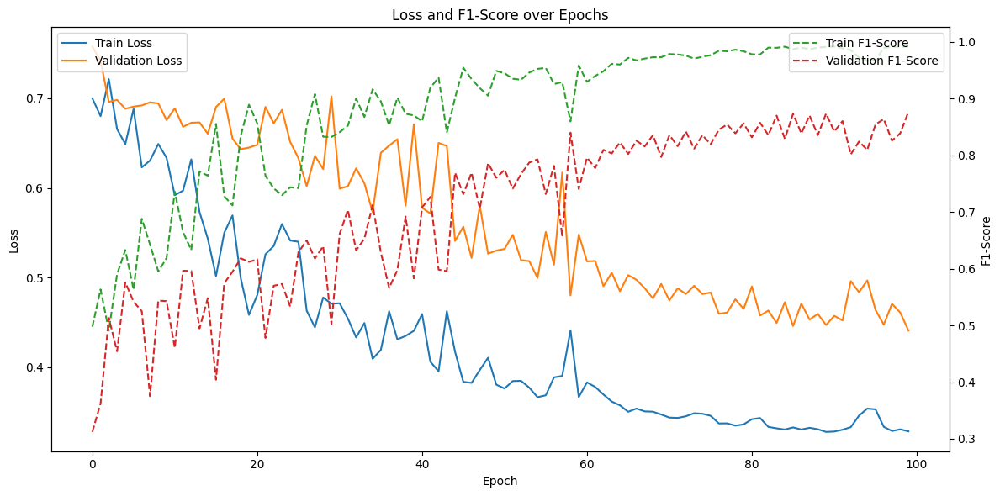

Final Test Loss: 0.4577, Final Test F1-Score: 0.8610
CPU times: user 3min 40s, sys: 422 ms, total: 3min 41s
Wall time: 3min 45s


In [ ]:
%%time
test_loss_cnn_mlp, test_f1_cnn_mlp = train_and_evaluate_model(
    model=model_cnn_mlp,
    X_train=X_train_tensor,
    y_train=y_train_tensor,
    X_val=X_val_tensor,
    y_val=y_val_tensor,
    X_test=X_test_tensor,
    y_test=y_test_tensor,
    criterion=criterion,
    optimizer=optimizer,
    num_epochs=num_epochs,
    device=device
)

print(f"Final Test Loss: {test_loss_cnn_mlp:.4f}, Final Test F1-Score: {test_f1_cnn_mlp:.4f}")

In [ ]:
%%time
test_loss_cnn_mlp, test_f1_cnn_mlp = train_and_evaluate_model(
    model=model_cnn_mlp,
    X_train=X_train_tensor,
    y_train=y_train_tensor,
    X_val=X_val_tensor,
    y_val=y_val_tensor,
    X_test=X_test_tensor,
    y_test=y_test_tensor,
    criterion=criterion,
    optimizer=optimizer,
    num_epochs=num_epochs,
    device=device
)

print(f"Final Test Loss: {test_loss_cnn_mlp:.4f}, Final Test F1-Score: {test_f1_cnn_mlp:.4f}")

Epochs:   0%|          | 0/100 [00:00<?, ?epoch/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 4.44 GiB. GPU 0 has a total capacity of 14.74 GiB of which 2.65 GiB is free. Process 461992 has 12.09 GiB memory in use. Of the allocated memory 11.97 GiB is allocated by PyTorch, and 1.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

## Новые архитектуры

### CNN

In [11]:
class PureCNN(nn.Module):
    def __init__(self, input_size, output_size, dropout_rate=0.3):
        super(PureCNN, self).__init__()

        # Сверточные слои
        self.conv_layers = nn.Sequential(
            nn.Conv1d(in_channels=1, out_channels=8, kernel_size=5, stride=1, padding=2),  # Первый сверточный слой
            nn.BatchNorm1d(8),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2),  # Уменьшение размерности

            nn.Conv1d(in_channels=8, out_channels=16, kernel_size=5, stride=1, padding=2),  # Второй сверточный слой
            nn.BatchNorm1d(16),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2),

            nn.Conv1d(in_channels=16, out_channels=32, kernel_size=5, stride=1, padding=2),  # Третий сверточный слой
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2)
        )

        # Глобальный пуллинг
        self.global_pool = nn.AdaptiveAvgPool1d(1)  # Приведение к фиксированной размерности

        # Финальный слой для бинарной классификации
        self.fc = nn.Sequential(
            nn.Linear(32, output_size),  # Выходной слой
            nn.Softmax(dim=1)
        )

    def forward(self, x):
        # Преобразование входа для сверток
        x = x.unsqueeze(1)  # Добавляем канал (batch_size, 1, input_size)

        # Применяем сверточные слои
        x = checkpoint(self.conv_layers, x)

        # Глобальный пуллинг
        x = self.global_pool(x)  # Размерность: (batch_size, 128, 1)
        x = x.squeeze(-1)        # Удаляем последнее измерение: (batch_size, 128)

        # Применяем финальный слой
        x = self.fc(x)
        return x

In [13]:
# Параметры модели
input_size = 15000  # Размер входных данных
output_size = 2     # Размер выходного слоя (два класса)

# исходный датасет
X_selected = df.iloc[:, :15000]

X_selected_with_participant = pd.concat([X_selected, df_raw['participant']], axis=1)
y = df['target']

Epochs:   1%|          | 1/100 [00:01<02:15,  1.37s/epoch]

Epoch [1/100], Loss: 0.6954, Train F1-Score: 0.3863, Validation Loss: 0.6957, Validation F1-Score: 0.3494


Epochs:   2%|▏         | 2/100 [00:01<01:10,  1.40epoch/s]

Epoch [2/100], Loss: 0.6952, Train F1-Score: 0.3863, Validation Loss: 0.6959, Validation F1-Score: 0.3382


Epochs:   3%|▎         | 3/100 [00:01<00:49,  1.97epoch/s]

Epoch [3/100], Loss: 0.6950, Train F1-Score: 0.3857, Validation Loss: 0.6962, Validation F1-Score: 0.3266


Epochs:   4%|▍         | 4/100 [00:02<00:39,  2.45epoch/s]

Epoch [4/100], Loss: 0.6949, Train F1-Score: 0.3857, Validation Loss: 0.6965, Validation F1-Score: 0.3230


Epochs:   5%|▌         | 5/100 [00:02<00:33,  2.81epoch/s]

Epoch [5/100], Loss: 0.6947, Train F1-Score: 0.3859, Validation Loss: 0.6968, Validation F1-Score: 0.3246


Epochs:   6%|▌         | 6/100 [00:02<00:30,  3.09epoch/s]

Epoch [6/100], Loss: 0.6946, Train F1-Score: 0.3859, Validation Loss: 0.6970, Validation F1-Score: 0.3246


Epochs:   7%|▋         | 7/100 [00:02<00:28,  3.30epoch/s]

Epoch [7/100], Loss: 0.6945, Train F1-Score: 0.3861, Validation Loss: 0.6972, Validation F1-Score: 0.3246


Epochs:   8%|▊         | 8/100 [00:03<00:26,  3.44epoch/s]

Epoch [8/100], Loss: 0.6945, Train F1-Score: 0.3863, Validation Loss: 0.6973, Validation F1-Score: 0.3246


Epochs:   9%|▉         | 9/100 [00:03<00:25,  3.56epoch/s]

Epoch [9/100], Loss: 0.6944, Train F1-Score: 0.3863, Validation Loss: 0.6975, Validation F1-Score: 0.3246


Epochs:  10%|█         | 10/100 [00:03<00:24,  3.63epoch/s]

Epoch [10/100], Loss: 0.6943, Train F1-Score: 0.3865, Validation Loss: 0.6977, Validation F1-Score: 0.3246


Epochs:  11%|█         | 11/100 [00:03<00:24,  3.70epoch/s]

Epoch [11/100], Loss: 0.6942, Train F1-Score: 0.3865, Validation Loss: 0.6978, Validation F1-Score: 0.3246


Epochs:  12%|█▏        | 12/100 [00:04<00:23,  3.72epoch/s]

Epoch [12/100], Loss: 0.6942, Train F1-Score: 0.3868, Validation Loss: 0.6980, Validation F1-Score: 0.3246


Epochs:  13%|█▎        | 13/100 [00:04<00:23,  3.76epoch/s]

Epoch [13/100], Loss: 0.6941, Train F1-Score: 0.3861, Validation Loss: 0.6981, Validation F1-Score: 0.3246


Epochs:  14%|█▍        | 14/100 [00:04<00:22,  3.79epoch/s]

Epoch [14/100], Loss: 0.6941, Train F1-Score: 0.3853, Validation Loss: 0.6983, Validation F1-Score: 0.3246


Epochs:  15%|█▌        | 15/100 [00:05<00:22,  3.79epoch/s]

Epoch [15/100], Loss: 0.6940, Train F1-Score: 0.3845, Validation Loss: 0.6984, Validation F1-Score: 0.3246


Epochs:  16%|█▌        | 16/100 [00:05<00:22,  3.79epoch/s]

Epoch [16/100], Loss: 0.6940, Train F1-Score: 0.3837, Validation Loss: 0.6985, Validation F1-Score: 0.3246


Epochs:  17%|█▋        | 17/100 [00:05<00:21,  3.80epoch/s]

Epoch [17/100], Loss: 0.6939, Train F1-Score: 0.3837, Validation Loss: 0.6987, Validation F1-Score: 0.3246


Epochs:  18%|█▊        | 18/100 [00:05<00:21,  3.79epoch/s]

Epoch [18/100], Loss: 0.6939, Train F1-Score: 0.3830, Validation Loss: 0.6988, Validation F1-Score: 0.3246


Epochs:  19%|█▉        | 19/100 [00:06<00:21,  3.80epoch/s]

Epoch [19/100], Loss: 0.6938, Train F1-Score: 0.3830, Validation Loss: 0.6988, Validation F1-Score: 0.3246


Epochs:  20%|██        | 20/100 [00:06<00:21,  3.80epoch/s]

Epoch [20/100], Loss: 0.6938, Train F1-Score: 0.3830, Validation Loss: 0.6989, Validation F1-Score: 0.3246


Epochs:  21%|██        | 21/100 [00:06<00:20,  3.80epoch/s]

Epoch [21/100], Loss: 0.6937, Train F1-Score: 0.3830, Validation Loss: 0.6990, Validation F1-Score: 0.3246


Epochs:  22%|██▏       | 22/100 [00:06<00:20,  3.81epoch/s]

Epoch [22/100], Loss: 0.6937, Train F1-Score: 0.3830, Validation Loss: 0.6991, Validation F1-Score: 0.3246


Epochs:  23%|██▎       | 23/100 [00:07<00:20,  3.81epoch/s]

Epoch [23/100], Loss: 0.6937, Train F1-Score: 0.3830, Validation Loss: 0.6991, Validation F1-Score: 0.3230


Epochs:  24%|██▍       | 24/100 [00:07<00:19,  3.80epoch/s]

Epoch [24/100], Loss: 0.6936, Train F1-Score: 0.3822, Validation Loss: 0.6991, Validation F1-Score: 0.3230


Epochs:  25%|██▌       | 25/100 [00:07<00:19,  3.80epoch/s]

Epoch [25/100], Loss: 0.6936, Train F1-Score: 0.3822, Validation Loss: 0.6992, Validation F1-Score: 0.3230


Epochs:  26%|██▌       | 26/100 [00:07<00:19,  3.79epoch/s]

Epoch [26/100], Loss: 0.6936, Train F1-Score: 0.3814, Validation Loss: 0.6992, Validation F1-Score: 0.3230


Epochs:  27%|██▋       | 27/100 [00:08<00:19,  3.80epoch/s]

Epoch [27/100], Loss: 0.6935, Train F1-Score: 0.3814, Validation Loss: 0.6992, Validation F1-Score: 0.3230


Epochs:  28%|██▊       | 28/100 [00:08<00:18,  3.80epoch/s]

Epoch [28/100], Loss: 0.6935, Train F1-Score: 0.3814, Validation Loss: 0.6992, Validation F1-Score: 0.3230


Epochs:  29%|██▉       | 29/100 [00:08<00:18,  3.81epoch/s]

Epoch [29/100], Loss: 0.6935, Train F1-Score: 0.3816, Validation Loss: 0.6992, Validation F1-Score: 0.3230


Epochs:  30%|███       | 30/100 [00:08<00:18,  3.81epoch/s]

Epoch [30/100], Loss: 0.6934, Train F1-Score: 0.3816, Validation Loss: 0.6992, Validation F1-Score: 0.3230


Epochs:  31%|███       | 31/100 [00:09<00:18,  3.81epoch/s]

Epoch [31/100], Loss: 0.6934, Train F1-Score: 0.3816, Validation Loss: 0.6992, Validation F1-Score: 0.3230


Epochs:  32%|███▏      | 32/100 [00:09<00:17,  3.80epoch/s]

Epoch [32/100], Loss: 0.6934, Train F1-Score: 0.3816, Validation Loss: 0.6991, Validation F1-Score: 0.3230


Epochs:  33%|███▎      | 33/100 [00:09<00:17,  3.80epoch/s]

Epoch [33/100], Loss: 0.6933, Train F1-Score: 0.3816, Validation Loss: 0.6991, Validation F1-Score: 0.3230


Epochs:  34%|███▍      | 34/100 [00:10<00:17,  3.79epoch/s]

Epoch [34/100], Loss: 0.6933, Train F1-Score: 0.3807, Validation Loss: 0.6991, Validation F1-Score: 0.3230


Epochs:  35%|███▌      | 35/100 [00:10<00:17,  3.80epoch/s]

Epoch [35/100], Loss: 0.6933, Train F1-Score: 0.3809, Validation Loss: 0.6990, Validation F1-Score: 0.3230


Epochs:  36%|███▌      | 36/100 [00:10<00:16,  3.80epoch/s]

Epoch [36/100], Loss: 0.6933, Train F1-Score: 0.3801, Validation Loss: 0.6990, Validation F1-Score: 0.3230


Epochs:  37%|███▋      | 37/100 [00:10<00:16,  3.80epoch/s]

Epoch [37/100], Loss: 0.6932, Train F1-Score: 0.3801, Validation Loss: 0.6989, Validation F1-Score: 0.3230


Epochs:  38%|███▊      | 38/100 [00:11<00:16,  3.79epoch/s]

Epoch [38/100], Loss: 0.6932, Train F1-Score: 0.3801, Validation Loss: 0.6989, Validation F1-Score: 0.3230


Epochs:  39%|███▉      | 39/100 [00:11<00:16,  3.80epoch/s]

Epoch [39/100], Loss: 0.6932, Train F1-Score: 0.3801, Validation Loss: 0.6988, Validation F1-Score: 0.3230


Epochs:  40%|████      | 40/100 [00:11<00:15,  3.81epoch/s]

Epoch [40/100], Loss: 0.6932, Train F1-Score: 0.3803, Validation Loss: 0.6987, Validation F1-Score: 0.3215


Epochs:  41%|████      | 41/100 [00:11<00:15,  3.82epoch/s]

Epoch [41/100], Loss: 0.6931, Train F1-Score: 0.3795, Validation Loss: 0.6987, Validation F1-Score: 0.3215


Epochs:  42%|████▏     | 42/100 [00:12<00:15,  3.82epoch/s]

Epoch [42/100], Loss: 0.6931, Train F1-Score: 0.3795, Validation Loss: 0.6986, Validation F1-Score: 0.3215


Epochs:  43%|████▎     | 43/100 [00:12<00:14,  3.83epoch/s]

Epoch [43/100], Loss: 0.6931, Train F1-Score: 0.3795, Validation Loss: 0.6986, Validation F1-Score: 0.3215


Epochs:  44%|████▍     | 44/100 [00:12<00:14,  3.84epoch/s]

Epoch [44/100], Loss: 0.6931, Train F1-Score: 0.3795, Validation Loss: 0.6985, Validation F1-Score: 0.3215


Epochs:  45%|████▌     | 45/100 [00:12<00:14,  3.86epoch/s]

Epoch [45/100], Loss: 0.6930, Train F1-Score: 0.3795, Validation Loss: 0.6985, Validation F1-Score: 0.3215


Epochs:  46%|████▌     | 46/100 [00:13<00:14,  3.85epoch/s]

Epoch [46/100], Loss: 0.6930, Train F1-Score: 0.3769, Validation Loss: 0.6984, Validation F1-Score: 0.3215


Epochs:  47%|████▋     | 47/100 [00:13<00:13,  3.85epoch/s]

Epoch [47/100], Loss: 0.6930, Train F1-Score: 0.3769, Validation Loss: 0.6984, Validation F1-Score: 0.3215


Epochs:  48%|████▊     | 48/100 [00:13<00:13,  3.85epoch/s]

Epoch [48/100], Loss: 0.6930, Train F1-Score: 0.3761, Validation Loss: 0.6983, Validation F1-Score: 0.3215


Epochs:  49%|████▉     | 49/100 [00:13<00:13,  3.86epoch/s]

Epoch [49/100], Loss: 0.6930, Train F1-Score: 0.3752, Validation Loss: 0.6982, Validation F1-Score: 0.3215


Epochs:  50%|█████     | 50/100 [00:14<00:12,  3.85epoch/s]

Epoch [50/100], Loss: 0.6929, Train F1-Score: 0.3756, Validation Loss: 0.6982, Validation F1-Score: 0.3215


Epochs:  51%|█████     | 51/100 [00:14<00:12,  3.85epoch/s]

Epoch [51/100], Loss: 0.6929, Train F1-Score: 0.3756, Validation Loss: 0.6981, Validation F1-Score: 0.3215


Epochs:  52%|█████▏    | 52/100 [00:14<00:12,  3.85epoch/s]

Epoch [52/100], Loss: 0.6929, Train F1-Score: 0.3760, Validation Loss: 0.6981, Validation F1-Score: 0.3215


Epochs:  53%|█████▎    | 53/100 [00:14<00:12,  3.85epoch/s]

Epoch [53/100], Loss: 0.6929, Train F1-Score: 0.3754, Validation Loss: 0.6980, Validation F1-Score: 0.3215


Epochs:  54%|█████▍    | 54/100 [00:15<00:11,  3.86epoch/s]

Epoch [54/100], Loss: 0.6929, Train F1-Score: 0.3754, Validation Loss: 0.6980, Validation F1-Score: 0.3215


Epochs:  55%|█████▌    | 55/100 [00:15<00:11,  3.86epoch/s]

Epoch [55/100], Loss: 0.6928, Train F1-Score: 0.3754, Validation Loss: 0.6979, Validation F1-Score: 0.3215


Epochs:  56%|█████▌    | 56/100 [00:15<00:11,  3.84epoch/s]

Epoch [56/100], Loss: 0.6928, Train F1-Score: 0.3754, Validation Loss: 0.6979, Validation F1-Score: 0.3215


Epochs:  57%|█████▋    | 57/100 [00:16<00:11,  3.84epoch/s]

Epoch [57/100], Loss: 0.6928, Train F1-Score: 0.3756, Validation Loss: 0.6979, Validation F1-Score: 0.3215


Epochs:  58%|█████▊    | 58/100 [00:16<00:10,  3.84epoch/s]

Epoch [58/100], Loss: 0.6928, Train F1-Score: 0.3758, Validation Loss: 0.6978, Validation F1-Score: 0.3215


Epochs:  59%|█████▉    | 59/100 [00:16<00:10,  3.84epoch/s]

Epoch [59/100], Loss: 0.6928, Train F1-Score: 0.3758, Validation Loss: 0.6978, Validation F1-Score: 0.3215


Epochs:  60%|██████    | 60/100 [00:16<00:10,  3.86epoch/s]

Epoch [60/100], Loss: 0.6928, Train F1-Score: 0.3758, Validation Loss: 0.6977, Validation F1-Score: 0.3215


Epochs:  61%|██████    | 61/100 [00:17<00:10,  3.86epoch/s]

Epoch [61/100], Loss: 0.6927, Train F1-Score: 0.3758, Validation Loss: 0.6977, Validation F1-Score: 0.3215


Epochs:  62%|██████▏   | 62/100 [00:17<00:09,  3.85epoch/s]

Epoch [62/100], Loss: 0.6927, Train F1-Score: 0.3749, Validation Loss: 0.6977, Validation F1-Score: 0.3215


Epochs:  63%|██████▎   | 63/100 [00:17<00:09,  3.84epoch/s]

Epoch [63/100], Loss: 0.6927, Train F1-Score: 0.3749, Validation Loss: 0.6976, Validation F1-Score: 0.3230


Epochs:  64%|██████▍   | 64/100 [00:17<00:09,  3.84epoch/s]

Epoch [64/100], Loss: 0.6927, Train F1-Score: 0.3749, Validation Loss: 0.6976, Validation F1-Score: 0.3230


Epochs:  65%|██████▌   | 65/100 [00:18<00:09,  3.84epoch/s]

Epoch [65/100], Loss: 0.6927, Train F1-Score: 0.3741, Validation Loss: 0.6975, Validation F1-Score: 0.3230


Epochs:  66%|██████▌   | 66/100 [00:18<00:08,  3.84epoch/s]

Epoch [66/100], Loss: 0.6927, Train F1-Score: 0.3743, Validation Loss: 0.6975, Validation F1-Score: 0.3230


Epochs:  67%|██████▋   | 67/100 [00:18<00:08,  3.85epoch/s]

Epoch [67/100], Loss: 0.6927, Train F1-Score: 0.3726, Validation Loss: 0.6975, Validation F1-Score: 0.3230


Epochs:  68%|██████▊   | 68/100 [00:18<00:08,  3.85epoch/s]

Epoch [68/100], Loss: 0.6926, Train F1-Score: 0.3726, Validation Loss: 0.6974, Validation F1-Score: 0.3230


Epochs:  69%|██████▉   | 69/100 [00:19<00:08,  3.83epoch/s]

Epoch [69/100], Loss: 0.6926, Train F1-Score: 0.3717, Validation Loss: 0.6974, Validation F1-Score: 0.3230


Epochs:  70%|███████   | 70/100 [00:19<00:07,  3.83epoch/s]

Epoch [70/100], Loss: 0.6926, Train F1-Score: 0.3717, Validation Loss: 0.6974, Validation F1-Score: 0.3230


Epochs:  71%|███████   | 71/100 [00:19<00:07,  3.82epoch/s]

Epoch [71/100], Loss: 0.6926, Train F1-Score: 0.3717, Validation Loss: 0.6973, Validation F1-Score: 0.3230


Epochs:  72%|███████▏  | 72/100 [00:19<00:07,  3.82epoch/s]

Epoch [72/100], Loss: 0.6926, Train F1-Score: 0.3717, Validation Loss: 0.6973, Validation F1-Score: 0.3230


Epochs:  73%|███████▎  | 73/100 [00:20<00:07,  3.82epoch/s]

Epoch [73/100], Loss: 0.6926, Train F1-Score: 0.3717, Validation Loss: 0.6973, Validation F1-Score: 0.3230


Epochs:  74%|███████▍  | 74/100 [00:20<00:06,  3.82epoch/s]

Epoch [74/100], Loss: 0.6926, Train F1-Score: 0.3719, Validation Loss: 0.6972, Validation F1-Score: 0.3230


Epochs:  75%|███████▌  | 75/100 [00:20<00:06,  3.84epoch/s]

Epoch [75/100], Loss: 0.6925, Train F1-Score: 0.3719, Validation Loss: 0.6972, Validation F1-Score: 0.3230


Epochs:  76%|███████▌  | 76/100 [00:20<00:06,  3.84epoch/s]

Epoch [76/100], Loss: 0.6925, Train F1-Score: 0.3719, Validation Loss: 0.6972, Validation F1-Score: 0.3230


Epochs:  77%|███████▋  | 77/100 [00:21<00:05,  3.84epoch/s]

Epoch [77/100], Loss: 0.6925, Train F1-Score: 0.3721, Validation Loss: 0.6971, Validation F1-Score: 0.3230


Epochs:  78%|███████▊  | 78/100 [00:21<00:05,  3.82epoch/s]

Epoch [78/100], Loss: 0.6925, Train F1-Score: 0.3721, Validation Loss: 0.6971, Validation F1-Score: 0.3230


Epochs:  79%|███████▉  | 79/100 [00:21<00:05,  3.80epoch/s]

Epoch [79/100], Loss: 0.6925, Train F1-Score: 0.3721, Validation Loss: 0.6971, Validation F1-Score: 0.3230


Epochs:  80%|████████  | 80/100 [00:22<00:05,  3.80epoch/s]

Epoch [80/100], Loss: 0.6925, Train F1-Score: 0.3721, Validation Loss: 0.6971, Validation F1-Score: 0.3230


Epochs:  81%|████████  | 81/100 [00:22<00:04,  3.80epoch/s]

Epoch [81/100], Loss: 0.6925, Train F1-Score: 0.3713, Validation Loss: 0.6970, Validation F1-Score: 0.3230


Epochs:  82%|████████▏ | 82/100 [00:22<00:04,  3.80epoch/s]

Epoch [82/100], Loss: 0.6925, Train F1-Score: 0.3713, Validation Loss: 0.6970, Validation F1-Score: 0.3230


Epochs:  83%|████████▎ | 83/100 [00:22<00:04,  3.79epoch/s]

Epoch [83/100], Loss: 0.6924, Train F1-Score: 0.3713, Validation Loss: 0.6970, Validation F1-Score: 0.3230


Epochs:  84%|████████▍ | 84/100 [00:23<00:04,  3.80epoch/s]

Epoch [84/100], Loss: 0.6924, Train F1-Score: 0.3718, Validation Loss: 0.6969, Validation F1-Score: 0.3230


Epochs:  85%|████████▌ | 85/100 [00:23<00:03,  3.81epoch/s]

Epoch [85/100], Loss: 0.6924, Train F1-Score: 0.3718, Validation Loss: 0.6969, Validation F1-Score: 0.3230


Epochs:  86%|████████▌ | 86/100 [00:23<00:03,  3.81epoch/s]

Epoch [86/100], Loss: 0.6924, Train F1-Score: 0.3718, Validation Loss: 0.6969, Validation F1-Score: 0.3230


Epochs:  87%|████████▋ | 87/100 [00:23<00:03,  3.80epoch/s]

Epoch [87/100], Loss: 0.6924, Train F1-Score: 0.3718, Validation Loss: 0.6969, Validation F1-Score: 0.3230


Epochs:  88%|████████▊ | 88/100 [00:24<00:03,  3.80epoch/s]

Epoch [88/100], Loss: 0.6924, Train F1-Score: 0.3710, Validation Loss: 0.6968, Validation F1-Score: 0.3230


Epochs:  89%|████████▉ | 89/100 [00:24<00:02,  3.78epoch/s]

Epoch [89/100], Loss: 0.6924, Train F1-Score: 0.3710, Validation Loss: 0.6968, Validation F1-Score: 0.3230


Epochs:  90%|█████████ | 90/100 [00:24<00:02,  3.80epoch/s]

Epoch [90/100], Loss: 0.6924, Train F1-Score: 0.3710, Validation Loss: 0.6968, Validation F1-Score: 0.3230


Epochs:  91%|█████████ | 91/100 [00:24<00:02,  3.80epoch/s]

Epoch [91/100], Loss: 0.6924, Train F1-Score: 0.3703, Validation Loss: 0.6968, Validation F1-Score: 0.3230


Epochs:  92%|█████████▏| 92/100 [00:25<00:02,  3.81epoch/s]

Epoch [92/100], Loss: 0.6923, Train F1-Score: 0.3703, Validation Loss: 0.6967, Validation F1-Score: 0.3230


Epochs:  93%|█████████▎| 93/100 [00:25<00:01,  3.80epoch/s]

Epoch [93/100], Loss: 0.6923, Train F1-Score: 0.3694, Validation Loss: 0.6967, Validation F1-Score: 0.3230


Epochs:  94%|█████████▍| 94/100 [00:25<00:01,  3.80epoch/s]

Epoch [94/100], Loss: 0.6923, Train F1-Score: 0.3694, Validation Loss: 0.6967, Validation F1-Score: 0.3230


Epochs:  95%|█████████▌| 95/100 [00:25<00:01,  3.81epoch/s]

Epoch [95/100], Loss: 0.6923, Train F1-Score: 0.3694, Validation Loss: 0.6967, Validation F1-Score: 0.3230


Epochs:  96%|█████████▌| 96/100 [00:26<00:01,  3.81epoch/s]

Epoch [96/100], Loss: 0.6923, Train F1-Score: 0.3694, Validation Loss: 0.6966, Validation F1-Score: 0.3230


Epochs:  97%|█████████▋| 97/100 [00:26<00:00,  3.81epoch/s]

Epoch [97/100], Loss: 0.6923, Train F1-Score: 0.3694, Validation Loss: 0.6966, Validation F1-Score: 0.3230


Epochs:  98%|█████████▊| 98/100 [00:26<00:00,  3.80epoch/s]

Epoch [98/100], Loss: 0.6923, Train F1-Score: 0.3694, Validation Loss: 0.6966, Validation F1-Score: 0.3230


Epochs:  99%|█████████▉| 99/100 [00:27<00:00,  3.80epoch/s]

Epoch [99/100], Loss: 0.6923, Train F1-Score: 0.3696, Validation Loss: 0.6966, Validation F1-Score: 0.3246


Epochs: 100%|██████████| 100/100 [00:27<00:00,  3.67epoch/s]

Epoch [100/100], Loss: 0.6923, Train F1-Score: 0.3698, Validation Loss: 0.6966, Validation F1-Score: 0.3246
Test Loss: 0.6915, Test F1-Score: 0.3811


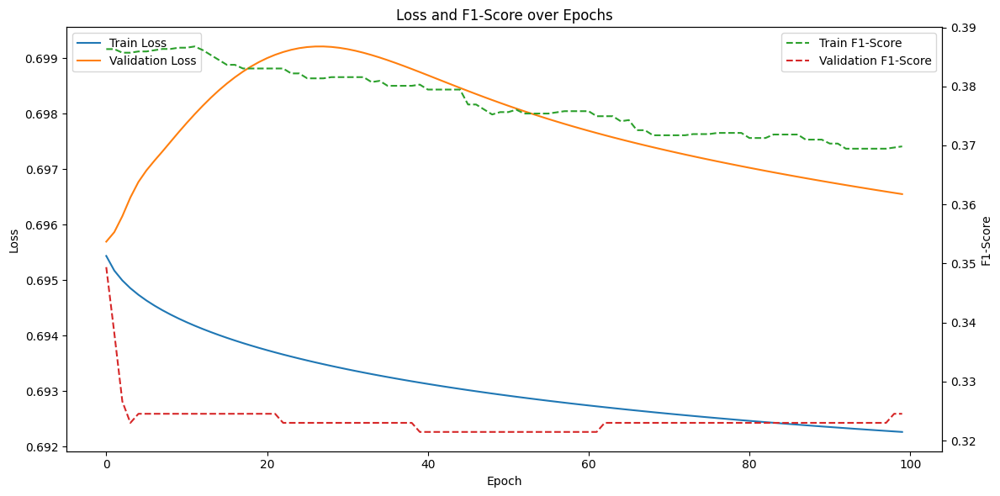

Final Test Loss: 0.6915, Final Test F1-Score: 0.3811
CPU times: user 25.9 s, sys: 210 ms, total: 26.1 s
Wall time: 27.7 s


In [14]:
# Кросс-валидация по участникам
cv_scores = []
cv_loss = []
for train_data, val_data, test_data in participant_based_cross_validation_with_validation_fold(pd.concat([X_selected_with_participant, y], axis=1)):
    # Разделяем данные на признаки и метки
    X_train, y_train = train_data.iloc[:, :-2], train_data.iloc[:, -1]
    X_val, y_val = val_data.iloc[:, :-2], val_data.iloc[:, -1]
    X_test, y_test = test_data.iloc[:, :-2], test_data.iloc[:, -1]

    # Преобразуем данные в тензоры PyTorch
    X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32).to(device)
    y_train_tensor = torch.tensor(y_train.values, dtype=torch.long).to(device)
    X_val_tensor = torch.tensor(X_val.values, dtype=torch.float32).to(device)
    y_val_tensor = torch.tensor(y_val.values, dtype=torch.long).to(device)
    X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32).to(device)
    y_test_tensor = torch.tensor(y_test.values, dtype=torch.long).to(device)

    # Создание экземпляра модели
    model_cnn = PureCNN(input_size, output_size)
    
    # Гиперпараметры
    learning_rate = 0.001
    num_epochs = 100
    batch_size = 64
    
    # Перевод модели на GPU (если доступно)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model_optimized.to(device)
    
    # Оптимизатор и функция потерь
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adagrad(model_cnn.parameters(), lr=learning_rate)

    # Обучение и оценка модели
    test_loss, test_f1 = train_and_evaluate_model(
        model=model_cnn,
        X_train=X_train_tensor,
        y_train=y_train_tensor,
        X_val=X_val_tensor,
        y_val=y_val_tensor,
        X_test=X_test_tensor,
        y_test=y_test_tensor,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=num_epochs,
        device=device
    )

    # Сохраняем результаты для текущей итерации
    cv_scores.append(test_f1)
    cv_loss.append(test_loss)

# Усредняем результаты кросс-валидации
mean_f1_cv = np.mean(cv_scores)
mean_loss_cv = np.mean(cv_loss)

print(f"Final Test Loss: {mean_loss_cv:.4f}, Final Test F1-Score: {mean_f1_cv:.4f}")

### CNN + MLP

In [15]:
class CNN_plus_MLP(nn.Module):
    def __init__(self, input_size, output_size, dropout_rate=0.4):
        super(CNN_plus_MLP, self).__init__()

        # Сверточные слои
        self.conv_layers = nn.Sequential(
            nn.Conv1d(in_channels=1, out_channels=8, kernel_size=5, stride=1, padding=2),  # Первый сверточный слой
            nn.BatchNorm1d(8),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2),  # Уменьшение размерности

            nn.Conv1d(in_channels=8, out_channels=16, kernel_size=5, stride=1, padding=2),  # Второй сверточный слой
            nn.BatchNorm1d(16),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2),

            nn.Conv1d(in_channels=16, out_channels=32, kernel_size=5, stride=1, padding=2),  # Третий сверточный слой
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2)
        )

        # Полносвязные слои
        self.fc_layers = nn.Sequential(
            nn.Linear(32 * (input_size // 8), 4096),  # Размер после сверток
            nn.BatchNorm1d(4096),
            nn.ReLU(),
            nn.Dropout(dropout_rate),

            nn.Linear(4096, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.Dropout(dropout_rate),

            nn.Linear(1024, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(dropout_rate),

            nn.Linear(256, output_size),
            nn.Softmax(dim=1)
        )

    def forward(self, x):
        # Преобразование входа для сверток
        x = x.unsqueeze(1)  # Добавляем канал (batch_size, 1, input_size)

        # Используем checkpoint для экономии памяти
        x = checkpoint(self.conv_layers, x)

        # Разворачиваем в вектор
        x = x.view(x.size(0), -1)

        # Применяем полносвязные слои
        x = self.fc_layers(x)
        return x

In [16]:
# Параметры модели
input_size = 15000  # Размер входных данных
output_size = 2     # Размер выходного слоя (два класса)

Epochs:   1%|          | 1/100 [00:01<01:58,  1.19s/epoch]

Epoch [1/100], Loss: 0.6987, Train F1-Score: 0.4472, Validation Loss: 0.6920, Validation F1-Score: 0.4578


Epochs:   2%|▏         | 2/100 [00:02<01:54,  1.16s/epoch]

Epoch [2/100], Loss: 0.6722, Train F1-Score: 0.5649, Validation Loss: 0.6927, Validation F1-Score: 0.5053


Epochs:   3%|▎         | 3/100 [00:03<01:52,  1.16s/epoch]

Epoch [3/100], Loss: 0.6541, Train F1-Score: 0.6164, Validation Loss: 0.7605, Validation F1-Score: 0.3051


Epochs:   4%|▍         | 4/100 [00:04<01:51,  1.17s/epoch]

Epoch [4/100], Loss: 0.6874, Train F1-Score: 0.5664, Validation Loss: 0.6956, Validation F1-Score: 0.5283


Epochs:   5%|▌         | 5/100 [00:05<01:50,  1.17s/epoch]

Epoch [5/100], Loss: 0.6561, Train F1-Score: 0.5812, Validation Loss: 0.7367, Validation F1-Score: 0.4626


Epochs:   6%|▌         | 6/100 [00:06<01:49,  1.16s/epoch]

Epoch [6/100], Loss: 0.7030, Train F1-Score: 0.5536, Validation Loss: 0.7072, Validation F1-Score: 0.5175


Epochs:   7%|▋         | 7/100 [00:08<01:48,  1.17s/epoch]

Epoch [7/100], Loss: 0.6537, Train F1-Score: 0.6357, Validation Loss: 0.6878, Validation F1-Score: 0.5058


Epochs:   8%|▊         | 8/100 [00:09<01:47,  1.16s/epoch]

Epoch [8/100], Loss: 0.5920, Train F1-Score: 0.7410, Validation Loss: 0.6876, Validation F1-Score: 0.4753


Epochs:   9%|▉         | 9/100 [00:10<01:45,  1.16s/epoch]

Epoch [9/100], Loss: 0.5822, Train F1-Score: 0.7117, Validation Loss: 0.7285, Validation F1-Score: 0.4676


Epochs:  10%|█         | 10/100 [00:11<01:44,  1.16s/epoch]

Epoch [10/100], Loss: 0.7131, Train F1-Score: 0.5166, Validation Loss: 0.6778, Validation F1-Score: 0.5970


Epochs:  11%|█         | 11/100 [00:12<01:44,  1.17s/epoch]

Epoch [11/100], Loss: 0.5733, Train F1-Score: 0.7530, Validation Loss: 0.6690, Validation F1-Score: 0.6196


Epochs:  12%|█▏        | 12/100 [00:14<01:43,  1.18s/epoch]

Epoch [12/100], Loss: 0.5822, Train F1-Score: 0.7107, Validation Loss: 0.7174, Validation F1-Score: 0.4482


Epochs:  13%|█▎        | 13/100 [00:15<01:43,  1.19s/epoch]

Epoch [13/100], Loss: 0.6328, Train F1-Score: 0.6596, Validation Loss: 0.6858, Validation F1-Score: 0.5126


Epochs:  14%|█▍        | 14/100 [00:16<01:41,  1.18s/epoch]

Epoch [14/100], Loss: 0.5601, Train F1-Score: 0.7260, Validation Loss: 0.6548, Validation F1-Score: 0.6238


Epochs:  15%|█▌        | 15/100 [00:17<01:40,  1.19s/epoch]

Epoch [15/100], Loss: 0.5593, Train F1-Score: 0.7527, Validation Loss: 0.6398, Validation F1-Score: 0.6354


Epochs:  16%|█▌        | 16/100 [00:18<01:37,  1.17s/epoch]

Epoch [16/100], Loss: 0.5370, Train F1-Score: 0.7632, Validation Loss: 0.6717, Validation F1-Score: 0.5650


Epochs:  17%|█▋        | 17/100 [00:19<01:35,  1.15s/epoch]

Epoch [17/100], Loss: 0.5915, Train F1-Score: 0.6953, Validation Loss: 0.6638, Validation F1-Score: 0.5594


Epochs:  18%|█▊        | 18/100 [00:21<01:34,  1.16s/epoch]

Epoch [18/100], Loss: 0.5358, Train F1-Score: 0.7792, Validation Loss: 0.6856, Validation F1-Score: 0.5758


Epochs:  19%|█▉        | 19/100 [00:22<01:32,  1.14s/epoch]

Epoch [19/100], Loss: 0.5479, Train F1-Score: 0.7416, Validation Loss: 0.6583, Validation F1-Score: 0.6291


Epochs:  20%|██        | 20/100 [00:23<01:30,  1.14s/epoch]

Epoch [20/100], Loss: 0.5863, Train F1-Score: 0.6926, Validation Loss: 0.6744, Validation F1-Score: 0.5829


Epochs:  21%|██        | 21/100 [00:24<01:29,  1.13s/epoch]

Epoch [21/100], Loss: 0.5333, Train F1-Score: 0.7706, Validation Loss: 0.6226, Validation F1-Score: 0.6870


Epochs:  22%|██▏       | 22/100 [00:25<01:28,  1.13s/epoch]

Epoch [22/100], Loss: 0.5131, Train F1-Score: 0.7914, Validation Loss: 0.6479, Validation F1-Score: 0.6034


Epochs:  23%|██▎       | 23/100 [00:26<01:27,  1.13s/epoch]

Epoch [23/100], Loss: 0.5093, Train F1-Score: 0.8152, Validation Loss: 0.6450, Validation F1-Score: 0.6364


Epochs:  24%|██▍       | 24/100 [00:27<01:25,  1.12s/epoch]

Epoch [24/100], Loss: 0.4672, Train F1-Score: 0.8816, Validation Loss: 0.6350, Validation F1-Score: 0.6130


Epochs:  25%|██▌       | 25/100 [00:28<01:24,  1.13s/epoch]

Epoch [25/100], Loss: 0.5084, Train F1-Score: 0.7913, Validation Loss: 0.6204, Validation F1-Score: 0.6868


Epochs:  26%|██▌       | 26/100 [00:29<01:23,  1.12s/epoch]

Epoch [26/100], Loss: 0.4849, Train F1-Score: 0.8198, Validation Loss: 0.6469, Validation F1-Score: 0.6157


Epochs:  27%|██▋       | 27/100 [00:31<01:22,  1.13s/epoch]

Epoch [27/100], Loss: 0.5008, Train F1-Score: 0.7989, Validation Loss: 0.6069, Validation F1-Score: 0.6934


Epochs:  28%|██▊       | 28/100 [00:32<01:21,  1.13s/epoch]

Epoch [28/100], Loss: 0.4546, Train F1-Score: 0.8801, Validation Loss: 0.6490, Validation F1-Score: 0.6130


Epochs:  29%|██▉       | 29/100 [00:33<01:20,  1.13s/epoch]

Epoch [29/100], Loss: 0.4855, Train F1-Score: 0.8315, Validation Loss: 0.6160, Validation F1-Score: 0.6637


Epochs:  30%|███       | 30/100 [00:34<01:19,  1.13s/epoch]

Epoch [30/100], Loss: 0.4565, Train F1-Score: 0.8493, Validation Loss: 0.6370, Validation F1-Score: 0.6532


Epochs:  31%|███       | 31/100 [00:35<01:18,  1.14s/epoch]

Epoch [31/100], Loss: 0.5442, Train F1-Score: 0.7581, Validation Loss: 0.6196, Validation F1-Score: 0.6516


Epochs:  32%|███▏      | 32/100 [00:36<01:18,  1.15s/epoch]

Epoch [32/100], Loss: 0.4989, Train F1-Score: 0.7994, Validation Loss: 0.5790, Validation F1-Score: 0.6945


Epochs:  33%|███▎      | 33/100 [00:37<01:16,  1.14s/epoch]

Epoch [33/100], Loss: 0.4235, Train F1-Score: 0.9093, Validation Loss: 0.6362, Validation F1-Score: 0.5851


Epochs:  34%|███▍      | 34/100 [00:39<01:15,  1.15s/epoch]

Epoch [34/100], Loss: 0.4394, Train F1-Score: 0.8785, Validation Loss: 0.6223, Validation F1-Score: 0.6723


Epochs:  35%|███▌      | 35/100 [00:40<01:15,  1.16s/epoch]

Epoch [35/100], Loss: 0.5012, Train F1-Score: 0.7912, Validation Loss: 0.6041, Validation F1-Score: 0.6895


Epochs:  36%|███▌      | 36/100 [00:41<01:13,  1.14s/epoch]

Epoch [36/100], Loss: 0.4369, Train F1-Score: 0.8743, Validation Loss: 0.5901, Validation F1-Score: 0.6631


Epochs:  37%|███▋      | 37/100 [00:42<01:11,  1.13s/epoch]

Epoch [37/100], Loss: 0.4222, Train F1-Score: 0.9102, Validation Loss: 0.6472, Validation F1-Score: 0.6269


Epochs:  38%|███▊      | 38/100 [00:43<01:09,  1.13s/epoch]

Epoch [38/100], Loss: 0.4772, Train F1-Score: 0.8234, Validation Loss: 0.5594, Validation F1-Score: 0.7297


Epochs:  39%|███▉      | 39/100 [00:44<01:08,  1.12s/epoch]

Epoch [39/100], Loss: 0.3951, Train F1-Score: 0.9436, Validation Loss: 0.5625, Validation F1-Score: 0.7328


Epochs:  40%|████      | 40/100 [00:45<01:06,  1.12s/epoch]

Epoch [40/100], Loss: 0.4050, Train F1-Score: 0.9192, Validation Loss: 0.6239, Validation F1-Score: 0.6685


Epochs:  41%|████      | 41/100 [00:46<01:05,  1.11s/epoch]

Epoch [41/100], Loss: 0.4995, Train F1-Score: 0.7977, Validation Loss: 0.5794, Validation F1-Score: 0.6967


Epochs:  42%|████▏     | 42/100 [00:48<01:04,  1.12s/epoch]

Epoch [42/100], Loss: 0.4136, Train F1-Score: 0.9063, Validation Loss: 0.5650, Validation F1-Score: 0.7180


Epochs:  43%|████▎     | 43/100 [00:49<01:04,  1.13s/epoch]

Epoch [43/100], Loss: 0.4244, Train F1-Score: 0.8901, Validation Loss: 0.6460, Validation F1-Score: 0.6293


Epochs:  44%|████▍     | 44/100 [00:50<01:03,  1.13s/epoch]

Epoch [44/100], Loss: 0.4712, Train F1-Score: 0.8331, Validation Loss: 0.5425, Validation F1-Score: 0.7612


Epochs:  45%|████▌     | 45/100 [00:51<01:03,  1.15s/epoch]

Epoch [45/100], Loss: 0.3892, Train F1-Score: 0.9436, Validation Loss: 0.5609, Validation F1-Score: 0.7270


Epochs:  46%|████▌     | 46/100 [00:52<01:01,  1.14s/epoch]

Epoch [46/100], Loss: 0.4016, Train F1-Score: 0.9230, Validation Loss: 0.5996, Validation F1-Score: 0.7013


Epochs:  47%|████▋     | 47/100 [00:53<01:00,  1.15s/epoch]

Epoch [47/100], Loss: 0.4754, Train F1-Score: 0.8271, Validation Loss: 0.5798, Validation F1-Score: 0.7216


Epochs:  48%|████▊     | 48/100 [00:54<00:59,  1.14s/epoch]

Epoch [48/100], Loss: 0.4080, Train F1-Score: 0.9090, Validation Loss: 0.5476, Validation F1-Score: 0.7592


Epochs:  49%|████▉     | 49/100 [00:56<00:58,  1.15s/epoch]

Epoch [49/100], Loss: 0.3803, Train F1-Score: 0.9573, Validation Loss: 0.5831, Validation F1-Score: 0.6930


Epochs:  50%|█████     | 50/100 [00:57<00:56,  1.14s/epoch]

Epoch [50/100], Loss: 0.4010, Train F1-Score: 0.9179, Validation Loss: 0.5410, Validation F1-Score: 0.7582


Epochs:  51%|█████     | 51/100 [00:58<00:56,  1.15s/epoch]

Epoch [51/100], Loss: 0.3836, Train F1-Score: 0.9456, Validation Loss: 0.5815, Validation F1-Score: 0.6972


Epochs:  52%|█████▏    | 52/100 [00:59<00:54,  1.14s/epoch]

Epoch [52/100], Loss: 0.4126, Train F1-Score: 0.8918, Validation Loss: 0.5211, Validation F1-Score: 0.7904


Epochs:  53%|█████▎    | 53/100 [01:00<00:52,  1.12s/epoch]

Epoch [53/100], Loss: 0.3736, Train F1-Score: 0.9576, Validation Loss: 0.5544, Validation F1-Score: 0.7328


Epochs:  54%|█████▍    | 54/100 [01:01<00:51,  1.12s/epoch]

Epoch [54/100], Loss: 0.3788, Train F1-Score: 0.9476, Validation Loss: 0.5258, Validation F1-Score: 0.7675


Epochs:  55%|█████▌    | 55/100 [01:02<00:51,  1.14s/epoch]

Epoch [55/100], Loss: 0.3797, Train F1-Score: 0.9379, Validation Loss: 0.5974, Validation F1-Score: 0.7034


Epochs:  56%|█████▌    | 56/100 [01:04<00:50,  1.14s/epoch]

Epoch [56/100], Loss: 0.4473, Train F1-Score: 0.8445, Validation Loss: 0.5867, Validation F1-Score: 0.7163


Epochs:  57%|█████▋    | 57/100 [01:05<00:49,  1.14s/epoch]

Epoch [57/100], Loss: 0.4611, Train F1-Score: 0.8521, Validation Loss: 0.5454, Validation F1-Score: 0.7483


Epochs:  58%|█████▊    | 58/100 [01:06<00:48,  1.15s/epoch]

Epoch [58/100], Loss: 0.3797, Train F1-Score: 0.9407, Validation Loss: 0.5101, Validation F1-Score: 0.8026


Epochs:  59%|█████▉    | 59/100 [01:07<00:47,  1.16s/epoch]

Epoch [59/100], Loss: 0.3578, Train F1-Score: 0.9782, Validation Loss: 0.5353, Validation F1-Score: 0.7612


Epochs:  60%|██████    | 60/100 [01:08<00:46,  1.16s/epoch]

Epoch [60/100], Loss: 0.3585, Train F1-Score: 0.9690, Validation Loss: 0.4938, Validation F1-Score: 0.8291


Epochs:  61%|██████    | 61/100 [01:09<00:44,  1.15s/epoch]

Epoch [61/100], Loss: 0.3523, Train F1-Score: 0.9827, Validation Loss: 0.5237, Validation F1-Score: 0.7774


Epochs:  62%|██████▏   | 62/100 [01:11<00:43,  1.15s/epoch]

Epoch [62/100], Loss: 0.3561, Train F1-Score: 0.9661, Validation Loss: 0.4836, Validation F1-Score: 0.8386


Epochs:  63%|██████▎   | 63/100 [01:12<00:42,  1.15s/epoch]

Epoch [63/100], Loss: 0.3513, Train F1-Score: 0.9790, Validation Loss: 0.5151, Validation F1-Score: 0.7730


Epochs:  64%|██████▍   | 64/100 [01:13<00:41,  1.16s/epoch]

Epoch [64/100], Loss: 0.3536, Train F1-Score: 0.9677, Validation Loss: 0.4815, Validation F1-Score: 0.8319


Epochs:  65%|██████▌   | 65/100 [01:14<00:40,  1.17s/epoch]

Epoch [65/100], Loss: 0.3483, Train F1-Score: 0.9798, Validation Loss: 0.5058, Validation F1-Score: 0.7828


Epochs:  66%|██████▌   | 66/100 [01:15<00:39,  1.18s/epoch]

Epoch [66/100], Loss: 0.3471, Train F1-Score: 0.9770, Validation Loss: 0.4835, Validation F1-Score: 0.8420


Epochs:  67%|██████▋   | 67/100 [01:16<00:38,  1.17s/epoch]

Epoch [67/100], Loss: 0.3446, Train F1-Score: 0.9831, Validation Loss: 0.4966, Validation F1-Score: 0.7930


Epochs:  68%|██████▊   | 68/100 [01:18<00:37,  1.18s/epoch]

Epoch [68/100], Loss: 0.3419, Train F1-Score: 0.9827, Validation Loss: 0.4800, Validation F1-Score: 0.8351


Epochs:  69%|██████▉   | 69/100 [01:19<00:36,  1.17s/epoch]

Epoch [69/100], Loss: 0.3421, Train F1-Score: 0.9831, Validation Loss: 0.4942, Validation F1-Score: 0.7993


Epochs:  70%|███████   | 70/100 [01:20<00:35,  1.17s/epoch]

Epoch [70/100], Loss: 0.3405, Train F1-Score: 0.9827, Validation Loss: 0.4706, Validation F1-Score: 0.8380


Epochs:  71%|███████   | 71/100 [01:21<00:34,  1.18s/epoch]

Epoch [71/100], Loss: 0.3403, Train F1-Score: 0.9831, Validation Loss: 0.4919, Validation F1-Score: 0.7963


Epochs:  72%|███████▏  | 72/100 [01:22<00:32,  1.18s/epoch]

Epoch [72/100], Loss: 0.3418, Train F1-Score: 0.9798, Validation Loss: 0.4654, Validation F1-Score: 0.8568


Epochs:  73%|███████▎  | 73/100 [01:23<00:31,  1.17s/epoch]

Epoch [73/100], Loss: 0.3437, Train F1-Score: 0.9790, Validation Loss: 0.5056, Validation F1-Score: 0.7865


Epochs:  74%|███████▍  | 74/100 [01:25<00:30,  1.16s/epoch]

Epoch [74/100], Loss: 0.3495, Train F1-Score: 0.9718, Validation Loss: 0.4654, Validation F1-Score: 0.8440


Epochs:  75%|███████▌  | 75/100 [01:26<00:29,  1.16s/epoch]

Epoch [75/100], Loss: 0.3413, Train F1-Score: 0.9811, Validation Loss: 0.4876, Validation F1-Score: 0.8081


Epochs:  76%|███████▌  | 76/100 [01:27<00:27,  1.16s/epoch]

Epoch [76/100], Loss: 0.3399, Train F1-Score: 0.9827, Validation Loss: 0.4611, Validation F1-Score: 0.8512


Epochs:  77%|███████▋  | 77/100 [01:28<00:26,  1.16s/epoch]

Epoch [77/100], Loss: 0.3348, Train F1-Score: 0.9899, Validation Loss: 0.4742, Validation F1-Score: 0.8253


Epochs:  78%|███████▊  | 78/100 [01:29<00:25,  1.16s/epoch]

Epoch [78/100], Loss: 0.3324, Train F1-Score: 0.9883, Validation Loss: 0.4592, Validation F1-Score: 0.8541


Epochs:  79%|███████▉  | 79/100 [01:30<00:24,  1.16s/epoch]

Epoch [79/100], Loss: 0.3332, Train F1-Score: 0.9895, Validation Loss: 0.4823, Validation F1-Score: 0.8032


Epochs:  80%|████████  | 80/100 [01:31<00:23,  1.15s/epoch]

Epoch [80/100], Loss: 0.3351, Train F1-Score: 0.9851, Validation Loss: 0.4599, Validation F1-Score: 0.8445


Epochs:  81%|████████  | 81/100 [01:33<00:21,  1.15s/epoch]

Epoch [81/100], Loss: 0.3335, Train F1-Score: 0.9883, Validation Loss: 0.4817, Validation F1-Score: 0.8125


Epochs:  82%|████████▏ | 82/100 [01:34<00:20,  1.16s/epoch]

Epoch [82/100], Loss: 0.3349, Train F1-Score: 0.9851, Validation Loss: 0.4592, Validation F1-Score: 0.8505


Epochs:  83%|████████▎ | 83/100 [01:35<00:19,  1.15s/epoch]

Epoch [83/100], Loss: 0.3364, Train F1-Score: 0.9871, Validation Loss: 0.4925, Validation F1-Score: 0.8065


Epochs:  84%|████████▍ | 84/100 [01:36<00:18,  1.15s/epoch]

Epoch [84/100], Loss: 0.3409, Train F1-Score: 0.9786, Validation Loss: 0.4619, Validation F1-Score: 0.8476


Epochs:  85%|████████▌ | 85/100 [01:37<00:17,  1.16s/epoch]

Epoch [85/100], Loss: 0.3355, Train F1-Score: 0.9867, Validation Loss: 0.4858, Validation F1-Score: 0.8059


Epochs:  86%|████████▌ | 86/100 [01:38<00:16,  1.17s/epoch]

Epoch [86/100], Loss: 0.3353, Train F1-Score: 0.9839, Validation Loss: 0.4546, Validation F1-Score: 0.8543


Epochs:  87%|████████▋ | 87/100 [01:40<00:15,  1.17s/epoch]

Epoch [87/100], Loss: 0.3281, Train F1-Score: 0.9948, Validation Loss: 0.4638, Validation F1-Score: 0.8386


Epochs:  88%|████████▊ | 88/100 [01:41<00:14,  1.18s/epoch]

Epoch [88/100], Loss: 0.3289, Train F1-Score: 0.9907, Validation Loss: 0.4530, Validation F1-Score: 0.8570


Epochs:  89%|████████▉ | 89/100 [01:42<00:12,  1.16s/epoch]

Epoch [89/100], Loss: 0.3295, Train F1-Score: 0.9911, Validation Loss: 0.4583, Validation F1-Score: 0.8571


Epochs:  90%|█████████ | 90/100 [01:43<00:11,  1.16s/epoch]

Epoch [90/100], Loss: 0.3274, Train F1-Score: 0.9927, Validation Loss: 0.4522, Validation F1-Score: 0.8636


Epochs:  91%|█████████ | 91/100 [01:44<00:10,  1.15s/epoch]

Epoch [91/100], Loss: 0.3281, Train F1-Score: 0.9927, Validation Loss: 0.4705, Validation F1-Score: 0.8192


Epochs:  92%|█████████▏| 92/100 [01:45<00:09,  1.16s/epoch]

Epoch [92/100], Loss: 0.3279, Train F1-Score: 0.9911, Validation Loss: 0.4596, Validation F1-Score: 0.8497


Epochs:  93%|█████████▎| 93/100 [01:47<00:08,  1.16s/epoch]

Epoch [93/100], Loss: 0.3338, Train F1-Score: 0.9879, Validation Loss: 0.4964, Validation F1-Score: 0.7967


Epochs:  94%|█████████▍| 94/100 [01:48<00:06,  1.15s/epoch]

Epoch [94/100], Loss: 0.3405, Train F1-Score: 0.9794, Validation Loss: 0.4584, Validation F1-Score: 0.8607


Epochs:  95%|█████████▌| 95/100 [01:49<00:05,  1.15s/epoch]

Epoch [95/100], Loss: 0.3358, Train F1-Score: 0.9867, Validation Loss: 0.4878, Validation F1-Score: 0.8086


Epochs:  96%|█████████▌| 96/100 [01:50<00:04,  1.16s/epoch]

Epoch [96/100], Loss: 0.3358, Train F1-Score: 0.9851, Validation Loss: 0.4469, Validation F1-Score: 0.8576


Epochs:  97%|█████████▋| 97/100 [01:51<00:03,  1.16s/epoch]

Epoch [97/100], Loss: 0.3293, Train F1-Score: 0.9907, Validation Loss: 0.4756, Validation F1-Score: 0.8161


Epochs:  98%|█████████▊| 98/100 [01:52<00:02,  1.15s/epoch]

Epoch [98/100], Loss: 0.3294, Train F1-Score: 0.9899, Validation Loss: 0.4548, Validation F1-Score: 0.8574


Epochs:  99%|█████████▉| 99/100 [01:53<00:01,  1.14s/epoch]

Epoch [99/100], Loss: 0.3298, Train F1-Score: 0.9899, Validation Loss: 0.4648, Validation F1-Score: 0.8446


Epochs: 100%|██████████| 100/100 [01:55<00:00,  1.15s/epoch]

Epoch [100/100], Loss: 0.3282, Train F1-Score: 0.9907, Validation Loss: 0.4466, Validation F1-Score: 0.8573
Test Loss: 0.4393, Test F1-Score: 0.8806


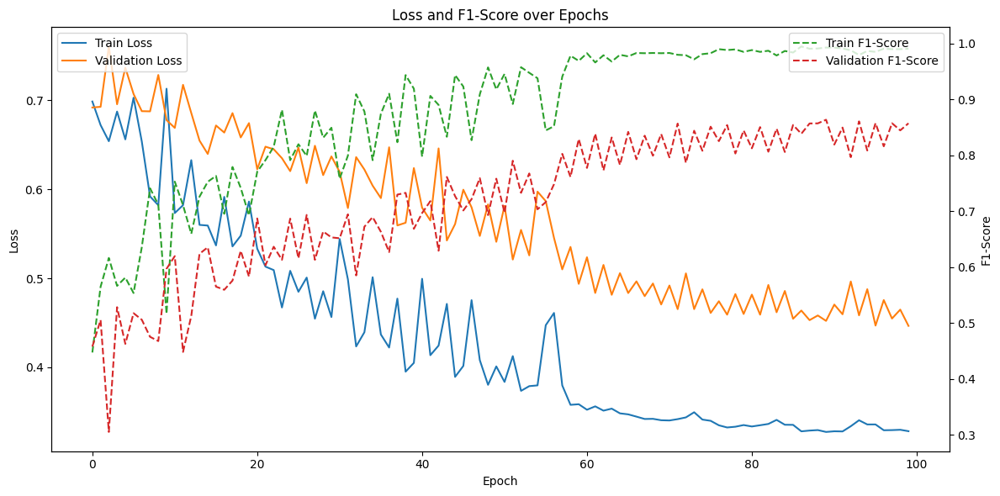

Final Test Loss: 0.4393, Final Test F1-Score: 0.8806
CPU times: user 1min 52s, sys: 285 ms, total: 1min 52s
Wall time: 1min 55s


In [17]:
# Кросс-валидация по участникам
cv_scores = []
cv_loss = []
for train_data, val_data, test_data in participant_based_cross_validation_with_validation_fold(pd.concat([X_selected_with_participant, y], axis=1)):
    # Разделяем данные на признаки и метки
    X_train, y_train = train_data.iloc[:, :-2], train_data.iloc[:, -1]
    X_val, y_val = val_data.iloc[:, :-2], val_data.iloc[:, -1]
    X_test, y_test = test_data.iloc[:, :-2], test_data.iloc[:, -1]

    # Преобразуем данные в тензоры PyTorch
    X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32).to(device)
    y_train_tensor = torch.tensor(y_train.values, dtype=torch.long).to(device)
    X_val_tensor = torch.tensor(X_val.values, dtype=torch.float32).to(device)
    y_val_tensor = torch.tensor(y_val.values, dtype=torch.long).to(device)
    X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32).to(device)
    y_test_tensor = torch.tensor(y_test.values, dtype=torch.long).to(device)

    # Создание экземпляра модели
    model_cnn_mlp = CNN_plus_MLP(input_size, output_size)
    
    # Гиперпараметры
    learning_rate = 0.001
    num_epochs = 100
    batch_size = 64
    
    # Перевод модели на GPU (если доступно)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model_optimized.to(device)
    
    # Оптимизатор и функция потерь
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adagrad(model_cnn_mlp.parameters(), lr=learning_rate)

    # Обучение и оценка модели
    test_loss, test_f1 = train_and_evaluate_model(
        model=model_cnn_mlp,
        X_train=X_train_tensor,
        y_train=y_train_tensor,
        X_val=X_val_tensor,
        y_val=y_val_tensor,
        X_test=X_test_tensor,
        y_test=y_test_tensor,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=num_epochs,
        device=device
    )

    # Сохраняем результаты для текущей итерации
    cv_scores.append(test_f1)
    cv_loss.append(test_loss)

# Усредняем результаты кросс-валидации
mean_f1_cv = np.mean(cv_scores)
mean_loss_cv = np.mean(cv_loss)

print(f"Final Test Loss: {mean_loss_cv:.4f}, Final Test F1-Score: {mean_f1_cv:.4f}")

## LSTM + MLP

In [6]:
class LSTM_plus_MLP(nn.Module):
    def __init__(self, hidden_size, num_layers, output_size, dropout_rate=0.4):
        """
        Инициализация модели с LSTM и полносвязными слоями.

        Параметры:
        - hidden_size: Размер скрытого состояния LSTM.
        - num_layers: Количество слоёв LSTM.
        - output_size: Размер выходного слоя (например, количество классов).
        - dropout_rate: Вероятность dropout для регуляризации.
        """
        super(LSTM_plus_MLP, self).__init__()

        # Рекуррентные слои (LSTM)
        self.lstm = nn.LSTM(
            input_size=1,  # Размер входа для каждого временного шага (1 признак)
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,  # Входные данные имеют форму (batch_size, sequence_length, input_size)
            dropout=dropout_rate if num_layers > 1 else 0,
            bidirectional=False  # Можно сделать двунаправленным, если нужно
        )

        # Полносвязные слои
        self.fc_layers = nn.Sequential(
            nn.Linear(hidden_size, 4096),  # Размер после сверток
            nn.BatchNorm1d(4096),
            nn.ReLU(),
            nn.Dropout(dropout_rate),

            nn.Linear(4096, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.Dropout(dropout_rate),

            nn.Linear(1024, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(dropout_rate),

            nn.Linear(256, output_size),
            nn.Softmax(dim=1)
        )

    def forward(self, x):
        """
        Прямой проход через модель.

        Параметры:
        - x: Входные данные размером (batch_size, sequence_length).

        Возвращает:
        - out: Выходные данные после прохождения через LSTM и полносвязные слои.
        """
        # Добавляем размерность для признаков
        x = x.unsqueeze(2)  # Преобразуем (batch_size, sequence_length) -> (batch_size, sequence_length, 1)

        # Проходим через LSTM
        # lstm_out, _ = self.lstm(x)  # lstm_out: (batch_size, sequence_length, hidden_size)
        lstm_out, _ = checkpoint(self.lstm, x)  # lstm_out: (batch_size, sequence_length, hidden_size)

        # Берём только последний временной шаг
        lstm_out = lstm_out[:, -1, :]  # (batch_size, hidden_size)

        # Проходим через полносвязные слои
        out = self.fc_layers(lstm_out)
        return out

In [9]:
# Параметры модели
sequence_length = 15000  # Длина временного ряда
hidden_size = 32         # Размер скрытого состояния LSTM
num_layers = 1           # Количество слоёв LSTM
output_size = 2          # Размер выходного слоя (два класса)

Epochs:   3%|▎         | 3/100 [00:00<00:12,  7.81epoch/s]

Epoch [1/100], Loss: 0.7062, Train F1-Score: 0.4767, Validation Loss: 0.6990, Validation F1-Score: 0.4511
Epoch [2/100], Loss: 0.7284, Train F1-Score: 0.5147, Validation Loss: 0.6917, Validation F1-Score: 0.5289
Epoch [3/100], Loss: 0.7023, Train F1-Score: 0.5180, Validation Loss: 0.6930, Validation F1-Score: 0.5250


Epochs:   5%|▌         | 5/100 [00:00<00:09,  9.85epoch/s]

Epoch [4/100], Loss: 0.7036, Train F1-Score: 0.5315, Validation Loss: 0.6904, Validation F1-Score: 0.5608
Epoch [5/100], Loss: 0.6907, Train F1-Score: 0.5351, Validation Loss: 0.6900, Validation F1-Score: 0.5472
Epoch [6/100], Loss: 0.6923, Train F1-Score: 0.5351, Validation Loss: 0.6902, Validation F1-Score: 0.4574


Epochs:   9%|▉         | 9/100 [00:00<00:07, 11.79epoch/s]

Epoch [7/100], Loss: 0.6901, Train F1-Score: 0.5404, Validation Loss: 0.6885, Validation F1-Score: 0.5700
Epoch [8/100], Loss: 0.6864, Train F1-Score: 0.5619, Validation Loss: 0.6902, Validation F1-Score: 0.4222
Epoch [9/100], Loss: 0.6907, Train F1-Score: 0.5339, Validation Loss: 0.6864, Validation F1-Score: 0.5749


Epochs:  11%|█         | 11/100 [00:01<00:07, 12.32epoch/s]

Epoch [10/100], Loss: 0.6947, Train F1-Score: 0.5247, Validation Loss: 0.6918, Validation F1-Score: 0.4556
Epoch [11/100], Loss: 0.6931, Train F1-Score: 0.5361, Validation Loss: 0.6857, Validation F1-Score: 0.5995
Epoch [12/100], Loss: 0.6883, Train F1-Score: 0.5489, Validation Loss: 0.6894, Validation F1-Score: 0.4711


Epochs:  15%|█▌        | 15/100 [00:01<00:06, 12.90epoch/s]

Epoch [13/100], Loss: 0.6863, Train F1-Score: 0.5458, Validation Loss: 0.6855, Validation F1-Score: 0.5705
Epoch [14/100], Loss: 0.6899, Train F1-Score: 0.5365, Validation Loss: 0.6882, Validation F1-Score: 0.4899
Epoch [15/100], Loss: 0.6851, Train F1-Score: 0.5533, Validation Loss: 0.6859, Validation F1-Score: 0.5364


Epochs:  17%|█▋        | 17/100 [00:01<00:06, 12.96epoch/s]

Epoch [16/100], Loss: 0.6881, Train F1-Score: 0.5474, Validation Loss: 0.6867, Validation F1-Score: 0.5404
Epoch [17/100], Loss: 0.6897, Train F1-Score: 0.5418, Validation Loss: 0.6857, Validation F1-Score: 0.5443
Epoch [18/100], Loss: 0.6870, Train F1-Score: 0.5462, Validation Loss: 0.6860, Validation F1-Score: 0.5378


Epochs:  21%|██        | 21/100 [00:01<00:05, 13.18epoch/s]

Epoch [19/100], Loss: 0.6876, Train F1-Score: 0.5473, Validation Loss: 0.6859, Validation F1-Score: 0.5378
Epoch [20/100], Loss: 0.6880, Train F1-Score: 0.5495, Validation Loss: 0.6863, Validation F1-Score: 0.5500
Epoch [21/100], Loss: 0.6822, Train F1-Score: 0.5587, Validation Loss: 0.6870, Validation F1-Score: 0.5336


Epochs:  23%|██▎       | 23/100 [00:01<00:05, 13.21epoch/s]

Epoch [22/100], Loss: 0.6845, Train F1-Score: 0.5566, Validation Loss: 0.6878, Validation F1-Score: 0.5324
Epoch [23/100], Loss: 0.6822, Train F1-Score: 0.5569, Validation Loss: 0.6860, Validation F1-Score: 0.5538
Epoch [24/100], Loss: 0.6852, Train F1-Score: 0.5487, Validation Loss: 0.6870, Validation F1-Score: 0.5283


Epochs:  27%|██▋       | 27/100 [00:02<00:05, 13.16epoch/s]

Epoch [25/100], Loss: 0.6846, Train F1-Score: 0.5548, Validation Loss: 0.6876, Validation F1-Score: 0.5365
Epoch [26/100], Loss: 0.6859, Train F1-Score: 0.5487, Validation Loss: 0.6854, Validation F1-Score: 0.5483
Epoch [27/100], Loss: 0.6787, Train F1-Score: 0.5669, Validation Loss: 0.6857, Validation F1-Score: 0.5418


Epochs:  29%|██▉       | 29/100 [00:02<00:05, 13.21epoch/s]

Epoch [28/100], Loss: 0.6874, Train F1-Score: 0.5473, Validation Loss: 0.6853, Validation F1-Score: 0.5443
Epoch [29/100], Loss: 0.6822, Train F1-Score: 0.5613, Validation Loss: 0.6846, Validation F1-Score: 0.5572
Epoch [30/100], Loss: 0.6823, Train F1-Score: 0.5515, Validation Loss: 0.6845, Validation F1-Score: 0.5471


Epochs:  33%|███▎      | 33/100 [00:02<00:05, 13.15epoch/s]

Epoch [31/100], Loss: 0.6842, Train F1-Score: 0.5583, Validation Loss: 0.6836, Validation F1-Score: 0.5572
Epoch [32/100], Loss: 0.6796, Train F1-Score: 0.5698, Validation Loss: 0.6846, Validation F1-Score: 0.5431
Epoch [33/100], Loss: 0.6799, Train F1-Score: 0.5679, Validation Loss: 0.6847, Validation F1-Score: 0.5658


Epochs:  35%|███▌      | 35/100 [00:02<00:04, 13.16epoch/s]

Epoch [34/100], Loss: 0.6844, Train F1-Score: 0.5497, Validation Loss: 0.6819, Validation F1-Score: 0.5639
Epoch [35/100], Loss: 0.6757, Train F1-Score: 0.5674, Validation Loss: 0.6849, Validation F1-Score: 0.5324
Epoch [36/100], Loss: 0.6808, Train F1-Score: 0.5582, Validation Loss: 0.6834, Validation F1-Score: 0.5648


Epochs:  39%|███▉      | 39/100 [00:03<00:04, 13.26epoch/s]

Epoch [37/100], Loss: 0.6814, Train F1-Score: 0.5593, Validation Loss: 0.6830, Validation F1-Score: 0.5738
Epoch [38/100], Loss: 0.6795, Train F1-Score: 0.5657, Validation Loss: 0.6827, Validation F1-Score: 0.5619
Epoch [39/100], Loss: 0.6826, Train F1-Score: 0.5641, Validation Loss: 0.6835, Validation F1-Score: 0.5714


Epochs:  41%|████      | 41/100 [00:03<00:04, 13.22epoch/s]

Epoch [40/100], Loss: 0.6786, Train F1-Score: 0.5669, Validation Loss: 0.6808, Validation F1-Score: 0.5774
Epoch [41/100], Loss: 0.6823, Train F1-Score: 0.5627, Validation Loss: 0.6864, Validation F1-Score: 0.5488
Epoch [42/100], Loss: 0.6807, Train F1-Score: 0.5562, Validation Loss: 0.6814, Validation F1-Score: 0.5803


Epochs:  45%|████▌     | 45/100 [00:03<00:04, 13.28epoch/s]

Epoch [43/100], Loss: 0.6760, Train F1-Score: 0.5654, Validation Loss: 0.6832, Validation F1-Score: 0.5545
Epoch [44/100], Loss: 0.6788, Train F1-Score: 0.5585, Validation Loss: 0.6829, Validation F1-Score: 0.5468
Epoch [45/100], Loss: 0.6753, Train F1-Score: 0.5791, Validation Loss: 0.6798, Validation F1-Score: 0.5585


Epochs:  47%|████▋     | 47/100 [00:03<00:03, 13.31epoch/s]

Epoch [46/100], Loss: 0.6756, Train F1-Score: 0.5807, Validation Loss: 0.6804, Validation F1-Score: 0.5645
Epoch [47/100], Loss: 0.6832, Train F1-Score: 0.5584, Validation Loss: 0.6834, Validation F1-Score: 0.5524
Epoch [48/100], Loss: 0.6739, Train F1-Score: 0.5743, Validation Loss: 0.6772, Validation F1-Score: 0.5671


Epochs:  51%|█████     | 51/100 [00:04<00:03, 13.32epoch/s]

Epoch [49/100], Loss: 0.6752, Train F1-Score: 0.5797, Validation Loss: 0.6845, Validation F1-Score: 0.5578
Epoch [50/100], Loss: 0.6779, Train F1-Score: 0.5748, Validation Loss: 0.6786, Validation F1-Score: 0.5609
Epoch [51/100], Loss: 0.6779, Train F1-Score: 0.5711, Validation Loss: 0.6833, Validation F1-Score: 0.5551


Epochs:  53%|█████▎    | 53/100 [00:04<00:03, 13.27epoch/s]

Epoch [52/100], Loss: 0.6798, Train F1-Score: 0.5554, Validation Loss: 0.6769, Validation F1-Score: 0.5709
Epoch [53/100], Loss: 0.6718, Train F1-Score: 0.5829, Validation Loss: 0.6824, Validation F1-Score: 0.5517
Epoch [54/100], Loss: 0.6778, Train F1-Score: 0.5722, Validation Loss: 0.6771, Validation F1-Score: 0.5644


Epochs:  57%|█████▋    | 57/100 [00:04<00:03, 13.31epoch/s]

Epoch [55/100], Loss: 0.6716, Train F1-Score: 0.5860, Validation Loss: 0.6779, Validation F1-Score: 0.5776
Epoch [56/100], Loss: 0.6748, Train F1-Score: 0.5707, Validation Loss: 0.6813, Validation F1-Score: 0.5643
Epoch [57/100], Loss: 0.6758, Train F1-Score: 0.5836, Validation Loss: 0.6780, Validation F1-Score: 0.5648


Epochs:  59%|█████▉    | 59/100 [00:04<00:03, 13.27epoch/s]

Epoch [58/100], Loss: 0.6753, Train F1-Score: 0.5751, Validation Loss: 0.6807, Validation F1-Score: 0.5745
Epoch [59/100], Loss: 0.6725, Train F1-Score: 0.5813, Validation Loss: 0.6799, Validation F1-Score: 0.5533
Epoch [60/100], Loss: 0.6780, Train F1-Score: 0.5793, Validation Loss: 0.6785, Validation F1-Score: 0.5539


Epochs:  63%|██████▎   | 63/100 [00:04<00:02, 13.28epoch/s]

Epoch [61/100], Loss: 0.6777, Train F1-Score: 0.5667, Validation Loss: 0.6821, Validation F1-Score: 0.5563
Epoch [62/100], Loss: 0.6747, Train F1-Score: 0.5825, Validation Loss: 0.6786, Validation F1-Score: 0.5460
Epoch [63/100], Loss: 0.6772, Train F1-Score: 0.5778, Validation Loss: 0.6813, Validation F1-Score: 0.5585


Epochs:  65%|██████▌   | 65/100 [00:05<00:02, 13.23epoch/s]

Epoch [64/100], Loss: 0.6757, Train F1-Score: 0.5793, Validation Loss: 0.6788, Validation F1-Score: 0.5607
Epoch [65/100], Loss: 0.6722, Train F1-Score: 0.5826, Validation Loss: 0.6797, Validation F1-Score: 0.5570
Epoch [66/100], Loss: 0.6736, Train F1-Score: 0.5811, Validation Loss: 0.6774, Validation F1-Score: 0.5736


Epochs:  69%|██████▉   | 69/100 [00:05<00:02, 13.17epoch/s]

Epoch [67/100], Loss: 0.6688, Train F1-Score: 0.5880, Validation Loss: 0.6826, Validation F1-Score: 0.5452
Epoch [68/100], Loss: 0.6707, Train F1-Score: 0.5806, Validation Loss: 0.6782, Validation F1-Score: 0.5736
Epoch [69/100], Loss: 0.6758, Train F1-Score: 0.5679, Validation Loss: 0.6812, Validation F1-Score: 0.5434


Epochs:  71%|███████   | 71/100 [00:05<00:02, 13.03epoch/s]

Epoch [70/100], Loss: 0.6703, Train F1-Score: 0.5793, Validation Loss: 0.6806, Validation F1-Score: 0.5575
Epoch [71/100], Loss: 0.6764, Train F1-Score: 0.5763, Validation Loss: 0.6811, Validation F1-Score: 0.5525
Epoch [72/100], Loss: 0.6720, Train F1-Score: 0.5809, Validation Loss: 0.6788, Validation F1-Score: 0.5525


Epochs:  75%|███████▌  | 75/100 [00:05<00:01, 13.02epoch/s]

Epoch [73/100], Loss: 0.6725, Train F1-Score: 0.5743, Validation Loss: 0.6823, Validation F1-Score: 0.5533
Epoch [74/100], Loss: 0.6724, Train F1-Score: 0.5751, Validation Loss: 0.6755, Validation F1-Score: 0.5632
Epoch [75/100], Loss: 0.6712, Train F1-Score: 0.5984, Validation Loss: 0.6807, Validation F1-Score: 0.5615


Epochs:  77%|███████▋  | 77/100 [00:06<00:01, 12.97epoch/s]

Epoch [76/100], Loss: 0.6688, Train F1-Score: 0.5879, Validation Loss: 0.6743, Validation F1-Score: 0.5730
Epoch [77/100], Loss: 0.6712, Train F1-Score: 0.5881, Validation Loss: 0.6870, Validation F1-Score: 0.5529
Epoch [78/100], Loss: 0.6698, Train F1-Score: 0.5905, Validation Loss: 0.6754, Validation F1-Score: 0.5580


Epochs:  81%|████████  | 81/100 [00:06<00:01, 13.10epoch/s]

Epoch [79/100], Loss: 0.6767, Train F1-Score: 0.5685, Validation Loss: 0.6892, Validation F1-Score: 0.5312
Epoch [80/100], Loss: 0.6731, Train F1-Score: 0.5792, Validation Loss: 0.6719, Validation F1-Score: 0.5758
Epoch [81/100], Loss: 0.6709, Train F1-Score: 0.5863, Validation Loss: 0.6902, Validation F1-Score: 0.5239


Epochs:  83%|████████▎ | 83/100 [00:06<00:01, 13.17epoch/s]

Epoch [82/100], Loss: 0.6769, Train F1-Score: 0.5776, Validation Loss: 0.6731, Validation F1-Score: 0.5604
Epoch [83/100], Loss: 0.6741, Train F1-Score: 0.5681, Validation Loss: 0.6922, Validation F1-Score: 0.5425
Epoch [84/100], Loss: 0.6690, Train F1-Score: 0.5889, Validation Loss: 0.6747, Validation F1-Score: 0.5705


Epochs:  87%|████████▋ | 87/100 [00:06<00:00, 13.14epoch/s]

Epoch [85/100], Loss: 0.6765, Train F1-Score: 0.5728, Validation Loss: 0.6923, Validation F1-Score: 0.5464
Epoch [86/100], Loss: 0.6689, Train F1-Score: 0.5772, Validation Loss: 0.6705, Validation F1-Score: 0.5910
Epoch [87/100], Loss: 0.6757, Train F1-Score: 0.5695, Validation Loss: 0.6982, Validation F1-Score: 0.5213


Epochs:  89%|████████▉ | 89/100 [00:06<00:00, 13.08epoch/s]

Epoch [88/100], Loss: 0.6751, Train F1-Score: 0.5786, Validation Loss: 0.6703, Validation F1-Score: 0.5788
Epoch [89/100], Loss: 0.6728, Train F1-Score: 0.5835, Validation Loss: 0.6862, Validation F1-Score: 0.5520
Epoch [90/100], Loss: 0.6761, Train F1-Score: 0.5714, Validation Loss: 0.6745, Validation F1-Score: 0.5549


Epochs:  93%|█████████▎| 93/100 [00:07<00:00, 13.17epoch/s]

Epoch [91/100], Loss: 0.6683, Train F1-Score: 0.5863, Validation Loss: 0.6846, Validation F1-Score: 0.5504
Epoch [92/100], Loss: 0.6696, Train F1-Score: 0.5781, Validation Loss: 0.6722, Validation F1-Score: 0.5719
Epoch [93/100], Loss: 0.6735, Train F1-Score: 0.5820, Validation Loss: 0.6833, Validation F1-Score: 0.5563


Epochs:  95%|█████████▌| 95/100 [00:07<00:00, 13.19epoch/s]

Epoch [94/100], Loss: 0.6718, Train F1-Score: 0.5837, Validation Loss: 0.6729, Validation F1-Score: 0.5604
Epoch [95/100], Loss: 0.6696, Train F1-Score: 0.5836, Validation Loss: 0.6816, Validation F1-Score: 0.5645
Epoch [96/100], Loss: 0.6711, Train F1-Score: 0.5873, Validation Loss: 0.6744, Validation F1-Score: 0.5628


Epochs:  99%|█████████▉| 99/100 [00:07<00:00, 13.09epoch/s]

Epoch [97/100], Loss: 0.6696, Train F1-Score: 0.5897, Validation Loss: 0.6843, Validation F1-Score: 0.5447
Epoch [98/100], Loss: 0.6663, Train F1-Score: 0.5921, Validation Loss: 0.6739, Validation F1-Score: 0.5563
Epoch [99/100], Loss: 0.6622, Train F1-Score: 0.6138, Validation Loss: 0.6818, Validation F1-Score: 0.5438


Epochs: 100%|██████████| 100/100 [00:07<00:00, 12.88epoch/s]


Epoch [100/100], Loss: 0.6656, Train F1-Score: 0.5920, Validation Loss: 0.6733, Validation F1-Score: 0.5575
Test Loss: 0.7028, Test F1-Score: 0.5309


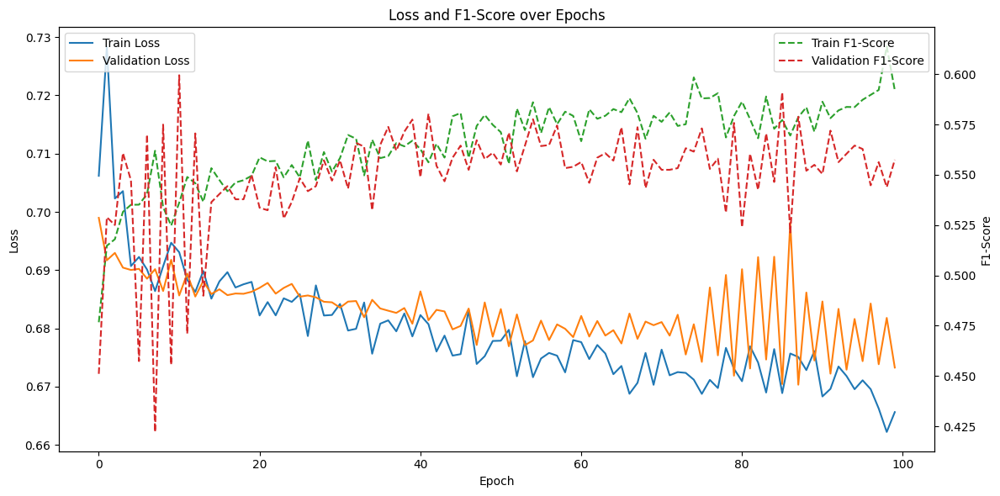

Final Test Loss: 0.7028, Final Test F1-Score: 0.5309
CPU times: user 7.99 s, sys: 91.4 ms, total: 8.08 s
Wall time: 8.1 s


In [10]:
# Кросс-валидация по участникам
cv_scores = []
cv_loss = []
for train_data, val_data, test_data in participant_based_cross_validation_with_validation_fold(pd.concat([X_selected_with_participant, y], axis=1)):
    # Разделяем данные на признаки и метки
    X_train, y_train = train_data.iloc[:, :-2], train_data.iloc[:, -1]
    X_val, y_val = val_data.iloc[:, :-2], val_data.iloc[:, -1]
    X_test, y_test = test_data.iloc[:, :-2], test_data.iloc[:, -1]

    # Преобразуем данные в тензоры PyTorch
    X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32).to(device)
    y_train_tensor = torch.tensor(y_train.values, dtype=torch.long).to(device)
    X_val_tensor = torch.tensor(X_val.values, dtype=torch.float32).to(device)
    y_val_tensor = torch.tensor(y_val.values, dtype=torch.long).to(device)
    X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32).to(device)
    y_test_tensor = torch.tensor(y_test.values, dtype=torch.long).to(device)

    # Берем каждое десятое значение для временных рядов
    X_train_tensor = torch.tensor(X_train[:, ::10], dtype=torch.float32)  # Уменьшаем длину последовательности до 1/10
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)              # Метки остаются без изменений
    X_val_tensor = torch.tensor(X_val[:, ::10], dtype=torch.float32)      # Уменьшаем длину последовательности до 1/10
    y_val_tensor = torch.tensor(y_val, dtype=torch.long)                  # Метки остаются без изменений
    X_test_tensor = torch.tensor(X_test[:, ::10], dtype=torch.float32)    # Уменьшаем длину последовательности до 1/10
    y_test_tensor = torch.tensor(y_test, dtype=torch.long)                # Метки остаются без изменений

    # Создание экземпляра модели
    model_lstm_mlp = LSTM_plus_MLP(hidden_size, num_layers, output_size)
    
    # Гиперпараметры
    learning_rate = 0.001
    num_epochs = 100
    batch_size = 64
    
    # Перевод модели на GPU (если доступно)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model_optimized.to(device)
    
    # Оптимизатор и функция потерь
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adagrad(model_lstm_mlp.parameters(), lr=learning_rate, weight_decay=1e-4)

    # Обучение и оценка модели
    test_loss, test_f1 = train_and_evaluate_model(
        model=model_lstm_mlp,
        X_train=X_train_tensor,
        y_train=y_train_tensor,
        X_val=X_val_tensor,
        y_val=y_val_tensor,
        X_test=X_test_tensor,
        y_test=y_test_tensor,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=num_epochs,
        device=device
    )

    # Сохраняем результаты для текущей итерации
    cv_scores.append(test_f1)
    cv_loss.append(test_loss)

# Усредняем результаты кросс-валидации
mean_f1_cv = np.mean(cv_scores)
mean_loss_cv = np.mean(cv_loss)

print(f"Final Test Loss: {mean_loss_cv:.4f}, Final Test F1-Score: {mean_f1_cv:.4f}")